<p style="color:#FFF; background:#06D; padding:12px; font-size:20px; font-style:italic; text-align:center">
<span style="width:49%; display:inline-block; text-align:left">Version 2025-06</span>
<span style="width:49%; display:inline-block; text-align:right">Licence CC–BY–NC–ND</span>
<span style="font-size:40px; font-style:normal"><b>PACKAGE : SCIPY</b></span><br>
<span style="width:49%; display:inline-block; text-align:left">Christophe Schlick</span>
<span style="width:49%; display:inline-block; text-align:right">schlick ಄ u<b>-</b>bordeaux • fr</p>

Le package [**scipy**](https://scipy.org), surnommé le ***couteau suisse du calcul scientifique***, constitue la bibliothèque la plus volumineuse de l'écosystème **Scientic Python**. En fait, la très grande majorité des nombreuses fonctionnalités fournies par **scipy** n'ont pas été créées pour le langage Python, mais sont issues d'une série de bibliothèques logicielles, principalement écrites dans des langages compilés comme Fortran ou C, et implémentant une large gamme d'algorithmes et de méthodes de haut-niveau pour traiter les problèmes courants  en mathématiques, en physique, en ingénierie et en science des données. La plupart des fonctions de **scipy** sont donc des ***wrappers*** pour des fonctions écrites dans d'autres langages de programmation. Grâce à la flexibilité du conteneur **`array`** fourni par **numpy**, l'échange de données entre des fonction Python et des fonctions Fortran ou C est extrêmement efficace, car cet échange s'effectue systématiquement sans avoir à convertir ni même à transférer les données, en accédant directement aux emplacements de la mémoire centrale où sont stockées les données à traiter.

Comme il est très rare d'avoir à utiliser toutes les fonctionnalités de **scipy** dans un même code, ***le package est décomposé en 18 modules destinés à être importées individuellement***. En plus de ces 18 modules disponibles lors de l'installation du package, il existe également une série de modules complémentaires appelés **`scikit-xxx`** ou **`scikit.xxx`** qui se basent sur les packages **numpy** et **scipy** pour créer des outils plus spécialisés. Les plus connus de ces modules complémentaires sont [**scikit-learn**](https://scikit-learn.org) pour l'apprentissage machine, [**scikit-image**](https://scikit-image.org) pour le traitement d'images, [**scikit-multilearn**](http://scikit.ml) pour la classification automatique avec labels multiples, [**scikit-geometry**](https://github.com/scikit-geometry/scikit-geometry) pour la géométrie algorithmique ou [**scikit-bio**](https://scikit.bio) pour la bio-informatique.

Comme pour les autres chapitres, ce notebook a pour objet de faire un tour d'horizon rapide et de montrer les fonctionnalités les plus intéressantes de **scipy** pour une utilisation dans le domaine des Sciences des Données. La documentation complète du package se trouve sur le site [**scipy.org**](https://docs.scipy.org/doc/scipy), mais comme c'est le cas pour les packages **numpy**, **matplotlib** et **pandas**, elle est également directement disponible dans le menu `Help` de l'interface JupyterLab.

In [1]:
import warnings; warnings.filterwarnings('ignore') # suppression des 'warning' de l'interpréteur
from SRC.tools import show, view, inspect, load # import des fonctions utilitaires du module 'tools'
import IPython.display as dp, numpy as np, pandas as pd, matplotlib.pyplot as mp # packages usuels

Comme on va étudier la précision de certains des algorithmes implémentés par **`scipy`**, on va configurer le notebook pour permettre un affichage des valeurs réelles avec l'ensemble des décimales obtenues par le calcul numérique en double précision au sens [**IEEE 754**](https://fr.wikipedia.org/wiki/IEEE_754) (16 ou 17 chiffres significatifs, selon les valeurs). De même, on va créer deux fonctions pour évaluer les erreurs de calcul, pour les cas où on connait la valeur théorique exacte du résultat :

- **`rms_abs(val,ref)`** : calcul de l'erreur quadratique moyenne **absolue** (= ***absolute root mean square***)
- **`rms_rel(val,ref)`** : calcul de l'erreur quadratique moyenne **relative** (= ***relative root mean square***)

In [2]:
np.set_printoptions(precision=17) # définition du nombre de décimales affichées par numpy
rms_abs = lambda val,ref: np.sqrt(np.mean((val-ref)**2)) # EQM (erreur quadratique moyenne) absolue
rms_rel = lambda val,ref: np.sqrt(np.mean((val-ref)**2)) / np.mean(np.abs(ref)) # EQM relative

---
Du fait de sa structure modulaire, le package **scipy** n'est jamais importé directement, car habituellement on ne récupère que les modules qui seront effectivement utilisés par le code. Néamoins, dans ce chapitre, on va exceptionnellement importer le package dans son ensemble, pour pouvoir y appliquer la commande **`inspect`** :

In [3]:
import scipy # import nécessaire pour pouvoir utiliser la fonction 'inspect'
inspect(scipy, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'information

● NAME = scipy / TYPE = module
● ROLE = SciPy: A scientific computing package for Python

● MODULES : use 'inspect(scipy.xxx)' to get additional info for each inner module
cluster        constants      datasets       differentiate  fft            fftpack        
integrate      interpolate    io             linalg         ndimage        odr            
optimize       signal         sparse         spatial        special        stats          

● TYPES : use 'inspect(scipy.xxx)' to get additional info for each inner type
LowLevelCallable  

● FUNCTIONS
show_config  test         


Comme on peut le constater sur le résultat renvoyé par **`inspect`**, **scipy** ne définit quasiment aucune constante, aucun type ou aucune fonction au niveau du package de base. Par contre, il fournit 18 modules que l'on peut répartir dans 5 catégories principales listées ci-dessous. La liste indique également le ***short alias*** souvent utilisé pour l'import des différents modules, ainsi que la ***bibliothèque d'origine*** (écrite en C ou en Fortran) qui a servi de base pour chacun des modules :

<big><b><i>A - Modules pour le calcul numérique</i></b></big>
  - **`interpolate`** (*alias* **`itp`**) : interpolation de données multi-dimensionnelles, basé sur **FITPACK**
  - **`optimize`** (*alias* **`opt`**) : optimisation avec ou sans contraintes, basé sur **MINPACK** et **SLSQP**
  - **`differentiate`** (*alias* **`df`**) : calcul différentiel pour fonctions multi-variées
  - **`integrate`** (*alias* **`itg`**) : calcul intégral pour fonctions multi-variées, basé sur **QUADPACK** et **ODEPACK**

<big><b><i>B - Modules pour le calcul matriciel</i></b></big>
  - **`linalg`** (*alias* **`la`**) : algèbre linéaire et autres algorithmes sur matrices pleines, basé sur **BLAS** et **LAPACK**
  - **`sparse`** (*alias* **`ar`**) : algèbre linéaire et autres algorithmes sur matrices creuses, basé sur **ARPACK**

<big><b><i>C - Modules pour l'analyse de données</i></b></big>
  - **`stats`** (*alias* **`st`**) : analyse et tests statistiques
  - **`spatial`** (*alias* **`sp`**) : analyse spatiale et traitements géométriques, basé sur **QHULL**

<big><b><i>D - Modules pour le traitement du signal</i></b></big>
  - **`fft`** (*alias* **`fft`**) : transformée de Fourier rapide, basé sur **FFTPACK**
  - **`signal`** (*alias* **`sig`**) : traitement de signaux mono-dimensionnels
  - **`ndimage`** (*alias* **`ndi`**) : traitement de signaux multi-dimensionnels

<big><b><i>E - Modules inutilisés en Sciences des Données</i></b></big>
  - **`scipy.constants`** : constantes scientifiques usuelles<br>
    *(nombre d'Avogadro, electron-volt, vitesse de la lumière...)*
  - **`scipy.special`** : fonctions scientifiques usuelles<br>
    *(harmoniques sphériques, fonctions de Bessel, de Riemann...)*
  - **`scipy.io`** : lecture/écriture d'anciens formats de données<br>
    *(Matlab / MatrixMarket / HB / IDL / netCDF)*
  - **`scipy.odr`** : méthodes de régression sur données bruitées<br>
    *(module considéré comme dépassé : **`lmfit`** est une bien meilleure alternative)*
  - **`scipy.cluster`** : méthodes de partitionnement et classification<br>
    *(module considéré comme dépassé : **`scikit-learn`** est une bien meilleure alternative)*
  - **`scipy.fftpack`** : ancienne version du module **`scipy.fft`**<br>
    *(uniquement pour compatibilité avec code existant)*
  - **`scipy.datasets`** : anciens jeux de données pour tests<br>
    *(uniquement pour compatibilité avec tests existants)*

<h2 style="padding:16px; color:#FFF; background:#06D">A - Modules pour le calcul numérique</h2>

### 1 - Module 'scipy.interpolate'

Le module [**scipy.interpolate**](https://docs.scipy.org/doc/scipy/tutorial/interpolate.html) fournit des outils robustes pour construire des fonctions d'interpolation ou d'approximation à partir de points de données discrets (appelés ***points-échantillons*** ou tout simplement ***échantillons***) définis dans un espace de dimension arbitraire. Il faut noter que les outils fournis par le module sont principalement prévus pour être utilisés lorsque les échantillons ne sont pas régulièrement espacés. Si on a la garantie que ceux-ci sont répartis sur une grille uniforme (avec un même écart sur les coordonnées dans chaque dimension), il vaut mieux employer les outils du module **`scipy.ndimage`** qui sont nettement plus efficaces que ceux de **`scipy.interpolate`** dans ce cas particulier.

>**Note :** Les anciennes versions du module **scipy.interpolate** utilisaient les fonctions **`interp1d`** et **`interp2d`** pour réaliser une interpolation de données 1D ou 2D. Ces fonctions sont désormais ***considérées comme obsolètes***, donc elles ne sont plus censées être utilisées dans les nouvelles applications, même si de nombreux tutos sur le web continuent de les mentionner

Les outils fournis par le module **scipy.interpolate** se décomposent en deux grandes familles : ceux basés sur les [**fonctions splines**](https://en.wikipedia.org/wiki/Spline_(mathematics)) et ceux basés sur les [**fonctions à base radiale**](https://en.wikipedia.org/wiki/Radial_basis_function) (*Radial Basis Functions* ou ***RBF***), qui sont les deux principaux modèles mathématiques permettant de créer une fonction continue à partir d'un ensemble de points-échantillons. Selon la nature du problème, les deux modèles peuvent soit interpoler les données (on parle alors de ***fonction d'interpolation*** ou ***interpolant***), soit approximer les données (on parle de ***fonction d'approximation*** ou ***approximant***). Les outils à base de splines utilisent des fonctions polynomiales par morceaux définis entre les points-échantillons, ce qui les rend efficaces pour les données structurées en maillage (triangulaire, quadrangulaire, tétrahédrique, cubique). A l'inverse, les outils RBF utilisent des fonctions qui vont dépendre uniquement de la distance à chacun des points-échantillons, ce qui est moins efficace mais permet de traiter les cas où les données sont peu, voire pas du tout, structurées. Le choix entre les deux familles de modèles est donc principalement lié à la nature des données à traiter.

In [4]:
import scipy.interpolate as itp # import du module avec l'alias habituel 'itp'
#inspect(itp, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

---
#### a - Interpolation de données 1D

La fonction **`UnivariateSpline`** permet d'effectuer une interpolation polynomiale par morceaux sur une série de points-échantillons censés représenter des valeurs de mesure d'une fonction monovariée continue. Chaque segment polynomial, appelé **spline**, est uniquement défini entre deux points successifs, et à chaque point de jonction, les segments de gauche et de droite sont ajustés avec une continuité d'ordre $C^{k-1}$ où $k$ est le degré des polynomes utilisés (autrement dit, plus le degré des polynômes est élevé, plus l'interpolant obtenu aura une continuité élevé, ce qui correspond à une courbe plus lisse) :

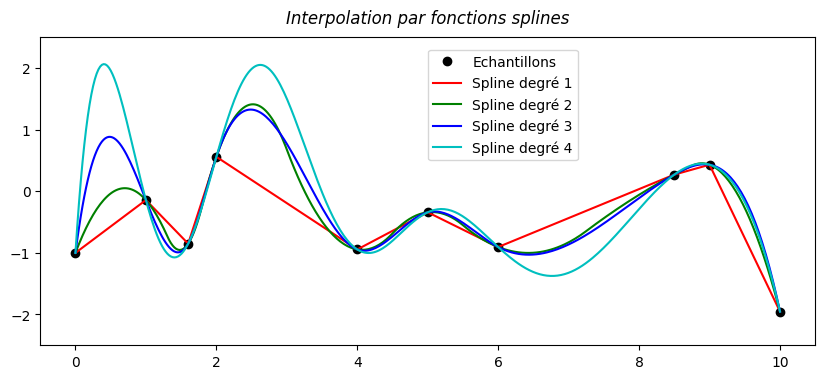

In [5]:
test = lambda x: np.sin(3*x) - np.cos(5*x) # définition de la fonction de test
x = np.array((0,1,1.6,2,4,5,6,8.5,9,10)); y = test(x) # échantillonnage en 10 points irréguliers
xx = np.linspace(x[0], x[-1], 400) # échantillonnage haute densité pour les tracés des fonctions obtenues

spl1 = itp.UnivariateSpline(x, y, k=1, s=0); ys1 = spl1(xx) # interpolation spline linéaire (k = 1)
spl2 = itp.UnivariateSpline(x, y, k=2, s=0); ys2 = spl2(xx) # interpolation spline quadratique (k = 2)
spl3 = itp.UnivariateSpline(x, y, k=3, s=0); ys3 = spl3(xx) # interpolation spline cubique (k = 3)
spl4 = itp.UnivariateSpline(x, y, k=4, s=0); ys4 = spl4(xx) # interpolation spline quartique (k = 4)

mp.figure(figsize=(10,4), dpi=100); title = 'Interpolation par fonctions splines'
mp.axis([-0.5,10.5,-2.5,2.5]); mp.plot(x, y, 'ko', label='Echantillons')
mp.plot(xx, ys1, 'r-', label='Spline degré 1'); mp.plot(xx, ys2, 'g-', label='Spline degré 2')
mp.plot(xx, ys3, 'b-', label='Spline degré 3'); mp.plot(xx, ys4, 'c-', label='Spline degré 4')
mp.legend(loc=(0.5, 0.6)); mp.title(title, style='italic', pad=10);

La figure ci-dessus montre le résultat obtenu par l'interpolation spline sur un jeu de 10 points-échantillons, en modifiant le degré du polynôme interpolant via le paramètre **`k`**. On constate que lorsque les variations sont faibles entre les points-échantillons successifs, comme sur la partie droite de la figure, l'interpolant se comporte raisonnablement pour estimer la valeur de la fonction entre les points-échantillons. Mais lorsque ces variations sont fortes, comme sur la partie gauche de la figure, l'interpolant va engendrer un phénomène de sur-oscillation, appelé [**phénomène de Runge**](https://fr.wikipedia.org/wiki/Ph%C3%A9nom%C3%A8ne_de_Runge) qui est d'autant plus marqué que le degré des polynômes utilisé est élevé.

La fonction **`Rbf`** permet également d'interpoler le même type de données, mais (comme son nom l'indique) en se basant sur le modèle des [**fonctions de base radiale**](https://fr.wikipedia.org/wiki/Fonction_de_base_radiale). Son utilisation est très similaire à la fonction **`UnivariateSpline`** mis à part que le comportement de l'interpolant est contrôlé par un paramètre réel **`epsilon`**, défini dans l'intervalle $]0,1]$, qui contrôle la distance d'influence pour la fonction radiale centrée en chacun des points-échantillons. L'utilisation d'un paramètre réel au lieu d'un entier donne évidemment un contrôle beaucoup plus fin permettant d'adapter le comportement de la fonction par rapport aux données. La fonction utilise une valeur par défaut égale à 1 pour **`epsilon`**, mais en pratique, une valeur autour de 0.5 donne souvent un meilleur compromis pour avoir à la fois un interpolant lisse tout en limitant les sur-oscillations :

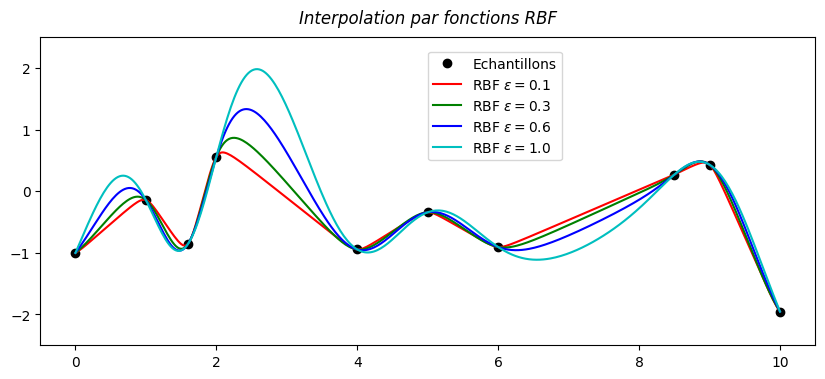

In [6]:
rbf1 = itp.Rbf(x, y, epsilon=0.1); yr1 = rbf1(xx) # interpolation RBF avec epsilon = 0.1
rbf2 = itp.Rbf(x, y, epsilon=0.3); yr2 = rbf2(xx) # interpolation RBF avec epsilon = 0.3
rbf3 = itp.Rbf(x, y, epsilon=0.6); yr3 = rbf3(xx) # interpolation RBF avec epsilon = 0.6
rbf4 = itp.Rbf(x, y, epsilon=1.0); yr4 = rbf4(xx) # interpolation RBF avec epsilon = 1.0

mp.figure(figsize=(10,4), dpi=100); title = 'Interpolation par fonctions RBF'
mp.axis([-0.5,10.5,-2.5,2.5]); mp.plot(x, y, 'ko', label='Echantillons')
mp.plot(xx, yr1, 'r-', label='RBF $\epsilon=0.1$'); mp.plot(xx, yr2, 'g-', label='RBF $\epsilon=0.3$')
mp.plot(xx, yr3, 'b-', label='RBF $\epsilon=0.6$'); mp.plot(xx, yr4, 'c-', label='RBF $\epsilon=1.0$')
mp.legend(loc=(0.5, 0.6)); mp.title(title, style='italic', pad=10);

---
#### b - Approximation de données 1D

Le phénomène de Runge dont souffrent les méthodes d'interpolation dès que les échantillons sont mal répartis les rend assez instables en pratique. De plus, les échantillons étant souvent obtenus par mesures expérimentales (et donc susceptibles d'être entachés d'un certain niveau d'erreur), il n'est pas forcément indispensable de passer exactement par chacun des points. Par conséquent, dans le domaine des Sciences des Données, il est plus intéressant d'utiliser des ***méthodes d'approximation*** à la place des méthodes d'interpolation, pour générer des fonctions continues à partir d'une série de points-échantillons.

La fonction **`UnivariateSpline`** utilisée ci-dessus pour l'interpolation, est également capable de générer une fonction d'approximation des points-échantillons, grâce à un autre paramètre **`s`** (pour ***smoothness***) qui avait été systématiquement positionné à la valeur 0 dans les exemples précédents. Ce paramètre **`s`** permet de contrôler le compromis à réaliser entre le fait d'interpoler exactement les données et celui de générer une courbe la plus lisse possible, quitte à passer plus loin des échantillons.
Comme on peut le constater sur la figure ci-dessous, si ce paramètre est faible, l'approximant va passer plus près des points et donc osciller plus fortement, et à l'inverse, si ce paramètre est élevé, l'approximant va priviligier l'aspect lisse de la courbe résultante au dépend de la proximité des points-échantillons :

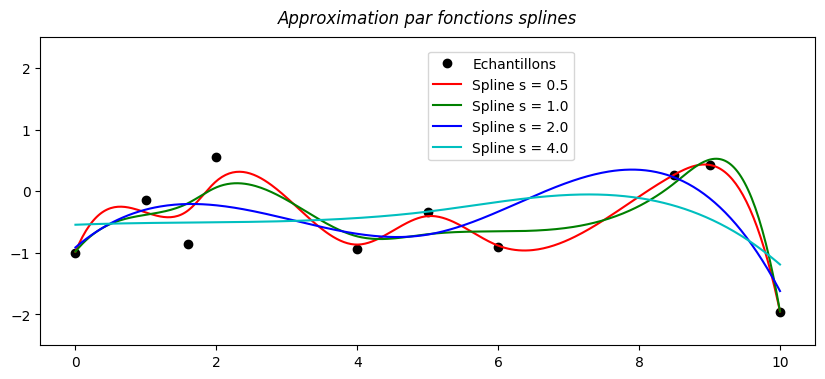

In [7]:
spl1 = itp.UnivariateSpline(x, y, k=3, s=0.5); ys1 = spl1(xx) # approximation spline cubique avec s = 0.5
spl2 = itp.UnivariateSpline(x, y, k=3, s=1.0); ys2 = spl2(xx) # approximation spline cubique avec s = 1
spl3 = itp.UnivariateSpline(x, y, k=3, s=2.0); ys3 = spl3(xx) # approximation spline cubique avec s = 2
spl4 = itp.UnivariateSpline(x, y, k=3, s=4.0); ys4 = spl4(xx) # approximation spline cubique avec s = 4

mp.figure(figsize=(10,4), dpi=100); title = 'Approximation par fonctions splines'
mp.axis([-0.5,10.5,-2.5,2.5]); mp.plot(x, y, 'ko', label='Echantillons')
mp.plot(xx, ys1, 'r-', label='Spline s = 0.5'); mp.plot(xx, ys2, 'g-', label='Spline s = 1.0')
mp.plot(xx, ys3, 'b-', label='Spline s = 2.0'); mp.plot(xx, ys4, 'c-', label='Spline s = 4.0')
mp.legend(loc=(0.5, 0.6)); mp.title(title, style='italic', pad=10);

De manière similaire, la fonction **`Rbf`** est également capable de générer une fonction d'approximation continue, avec une mise en oeuvre très similaire à la fonction précédente en utilisant un paramètre **`smooth`** qui joue un rôle équivalent au paramètre **`s`** de la fonction **`UnivariateSpline`**. Comme c'était déjà le cas en mode interpolation, on constate que les courbes d'approximation générées par le modèle RBF semblent plus naturelles, et le paramètre de contrôle plus intuitif :

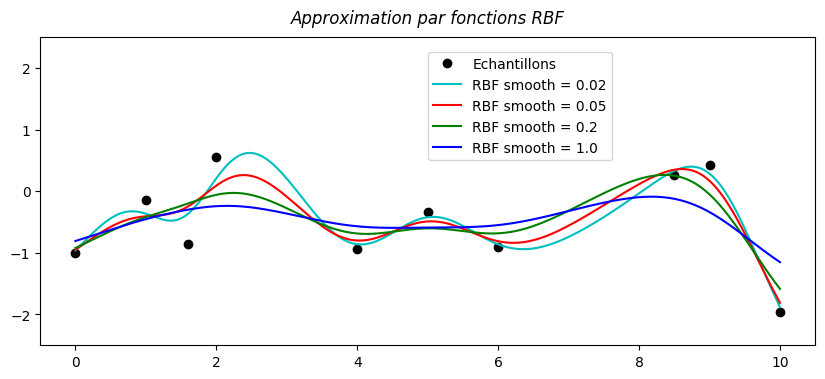

In [8]:
rbf1 = itp.Rbf(x, y, smooth=0.02); yr1 = rbf1(xx) # approximation RBF avec smoothness = 0.02
rbf2 = itp.Rbf(x, y, smooth=0.05); yr2 = rbf2(xx) # approximation RBF avec smoothness = 0.05
rbf3 = itp.Rbf(x, y, smooth=0.2); yr3 = rbf3(xx) # approximation RBF avec smoothness = 0.2
rbf4 = itp.Rbf(x, y, smooth=1.0); yr4 = rbf4(xx) # approximation RBF avec smoothness = 1.0

mp.figure(figsize=(10,4), dpi=100); title = 'Approximation par fonctions RBF'
mp.axis([-0.5,10.5,-2.5,2.5]); mp.plot(x, y, 'ko', label='Echantillons')
mp.plot(xx, yr1, 'c-', label='RBF smooth = 0.02'); mp.plot(xx, yr2, 'r-', label='RBF smooth = 0.05')
mp.plot(xx, yr3, 'g-', label='RBF smooth = 0.2'); mp.plot(xx, yr4, 'b-', label='RBF smooth = 1.0')
mp.legend(loc=(0.5, 0.6)); mp.title(title, style='italic', pad=10);

---
#### c - Interpolation/Approximation de données 2D

Pour mettre en oeuvre les outils d'interpolation ou d'approximation de données 2D, on va créer une fonction de test bivariée $z = f(x,y)$ en utilisant plusieurs fonctions trigonométriques pour créer des ondulations complexes dans les deux directions :

$$ z = f(x,y) = 2 + 3\cos(y + xy) + 3\sin(2y + xy) $$

L'objectif des outils d'interpolation/approximation est d'arriver à reproduire au mieux, les variations de cette fonction à partir d'un nombre limité de points-échantillons, choisis procéduralement ou aléatoirement. Mais pour garantir que l'ensemble du domaine de la fonction $[–1,1]^2$ soit bien représenté parmi les points choisis, on va utiliser un [**échantillonnage stratifié**](https://fr.wikipedia.org/wiki/%C3%89chantillonnage_stratifi%C3%A9) qui choisit **n** points dans chaque quadrant, tout en rajoutant systématiquement les 4 coins du domaine parmi les échantillons.

Pour la visualisation (cf. code et figure ci-dessous) on échantillonne cette fonction sur une grille 400x400 et on l'affiche sous la forme d'une carte de chaleur avec contours de niveau, en réutilisant le code **matplotlib** vu dans la section C du chapitre 6. On utilise ici un échantillonnage stratifié de ***n = 5*** points pour chaque quadrant du domaine, les positions de ces échantillons étant affichés sous la forme de disques noirs sur la figure :

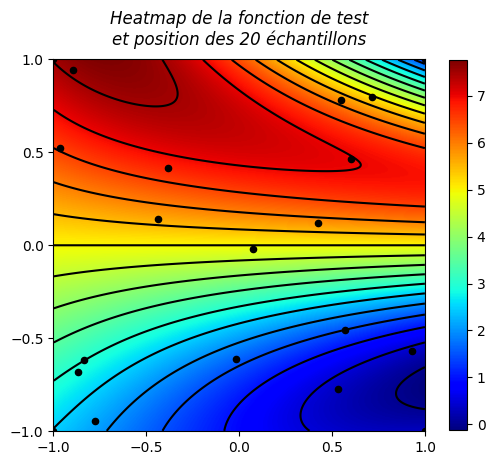

In [9]:
ff = lambda x,y: 2 + 3*np.cos(y+x*y) + 3*np.sin(2*y+x*y) # définition de la fonction de test
t = np.linspace(-1, 1, 400); xx, yy = np.meshgrid(t, t) # grille de visualisation 400x400
base = ff(xx, yy) # valeurs de la fonction ff pour chaque couple (xx,yy) de la grille de visualisation

n = 5 # choix du nombre d'échantillons par quadrant (essayer des valeurs comprises entre 4 et 15)
# on génère 'n' points aléatoires par quadrant et on force le premier point à être sur le coin du domaine
np.random.seed(0); coords = np.random.uniform(0,1,(8,n)); coords[:,0] = 1; coords[(1,3,6,7),:] *= -1
x, y = np.split(coords.ravel(), 2); z = ff(x,y) # valeurs de la fonction ff pour chaque échantillon (x,y)

mp.figure(figsize=(6,6), dpi=100); mp.imshow(base, extent=[-1, 1, -1, 1], origin='lower', cmap='jet')
mp.colorbar(shrink=0.8); mp.contour(base, 16, extent=[-1, 1, -1, 1], origin='lower', colors='k')
mp.scatter(x, y, color='k', s=20); mp.xticks([-1,-0.5,0,0.5,1]); mp.yticks([-1,-0.5,0,0.5,1])
mp.title(f"Heatmap de la fonction de test\net position des {4*n} échantillons", style='italic', pad=10);

La fonction **`UnivariateSpline`** possède deux généralisations pour les données à 2D : la fonction **`RectBivariateSpline`** permet de créer une surface spline définie par produit tensoriel, qui va interpoler ou approximer un ensemble de points-échantillons structurés sous forme de grille rectangulaire, alors que la fonction **`SmoothBivariateSpline`** peut créer cette surface spline à partir d'un ensemble non-structuré d'échantillons, ce qui est le cas dans notre exemple. Les paramètres **`kx`** et **`ky`** de la fonction correspondent aux degrés des polynômes utilisés pour les axes **x** et **y**, et comme précédemment, le paramètre **`s`** permet de contrôler le compromis interpolation/approximation. Il faut noter qu'il faut un nombre minimal d'échantillons égal à ***(kx+1)(ky+1)*** pour que les fonctions soient utilisables (donc 16 points pour des splines bicubiques)

Avec une valeur de **n=5** points par quadrant, soit 20 échantillons au total, on constate que le résultat de l'interpolation est déjà très proche de la fonction de test, notamment parce que l'échantillonnage stratifié a donné des points aléatoires répartis de manière assez homogène sur l'ensemble du domaine :

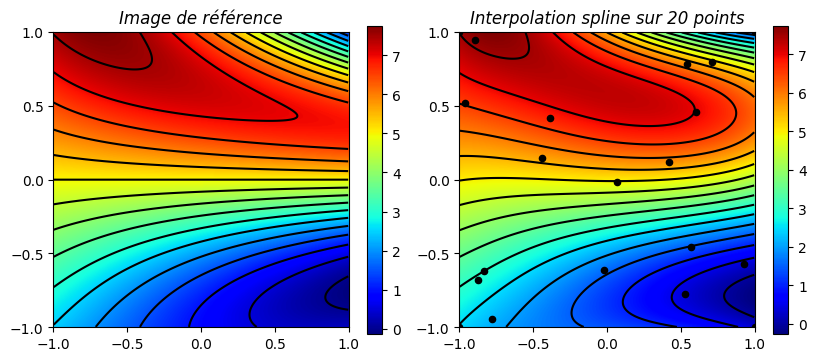

In [10]:
spl = itp.SmoothBivariateSpline(x, y, z, kx=3, ky=3, s=0) # calcul d'une spline d'interpolation bicubique
zz = spl(xx.ravel(), yy.ravel(), grid=False).reshape(xx.shape) # calcul des valeurs de l'interpolant

mp.figure(figsize=(10,5), dpi=100); mp.subplots_adjust(wspace=0.1)
mp.subplot(1,2,1); mp.imshow(base, extent=[-1, 1, -1, 1], origin='lower', cmap='jet')
mp.colorbar(shrink=0.8); mp.contour(base, 16, extent=[-1, 1, -1, 1], origin='lower', colors='k')
mp.yticks([-1,-0.5,0,0.5,1]); mp.title(f"Image de référence", style='italic')
mp.subplot(1,2,2); mp.imshow(zz, extent=[-1, 1, -1, 1], origin='lower', cmap='jet')
mp.colorbar(shrink=0.8); mp.contour(zz, 16, extent=[-1, 1, -1, 1], origin='lower', colors='k')
mp.scatter(x, y, color='k', s=20); mp.yticks([-1,-0.5,0,0.5,1])
mp.title(f"Interpolation spline sur {4*n} points", style='italic');

La fonction **`Rbf`** utilisée plus haut pour l'interpolation/approximation des données 1D, est valide quelque soit la dimension de l'espace considéré. Il suffit de donner une liste de valeurs pour chaque coordonnées (dans notre cas, les vecteurs **`x`** et **`y`**) et finir par les valeurs de la fonction à approximer (dans notre cas, le vecteur **`z`**). Comme on l'a déjà vu pour les fonctions monovariées, une valeur faible pour **`smooth`** (entre 0.05 et 0.1) donne souvent un bon compromis entre la proximité de la surface aux points-échantillons et la régularité de la surface générée :

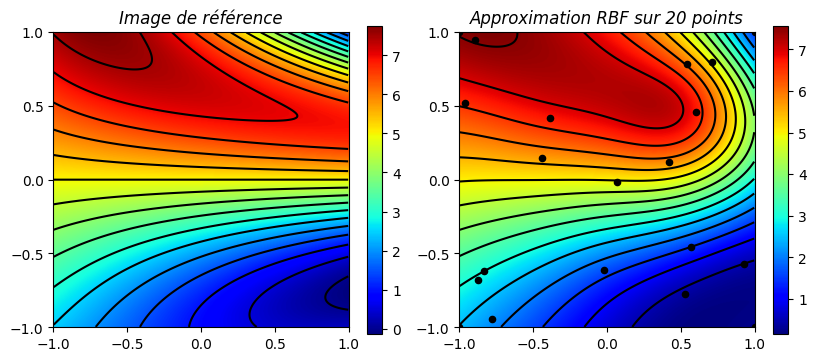

In [11]:
rbf = itp.Rbf(x, y, z, smooth=0.05); zz = rbf(xx, yy) # calcul de l'approximation RBF avec smooth = 0.05

mp.figure(figsize=(10,5), dpi=100); mp.subplots_adjust(wspace=0.1)
mp.subplot(1,2,1); mp.imshow(base, extent=[-1, 1, -1, 1], origin='lower', cmap='jet')
mp.colorbar(shrink=0.8); mp.contour(base, 16, extent=[-1, 1, -1, 1], origin='lower', colors='k')
mp.yticks([-1,-0.5,0,0.5,1]); mp.title(f"Image de référence", style='italic');
mp.subplot(1,2,2); mp.imshow(zz, extent=[-1, 1, -1, 1], origin='lower', cmap='jet')
mp.colorbar(shrink=0.8); mp.contour(zz, 16, extent=[-1, 1, -1, 1], origin='lower', colors='k')
mp.scatter(x, y, color='k', s=20); mp.yticks([-1,-0.5,0,0.5,1])
mp.title(f"Approximation RBF sur {4*n} points", style='italic');

A titre de comparaison, voici les résultats obtenus en forçant les échantillons à être sur une grille régulière, ce qui permet l'utilisation de la fonction **`RectBivariateSpline`** pour réaliser l'interpolation bivariée. On constate que pour la fonction **`Rbf`** il n'y a pas d'amélioration notable avec la grille régulière par rapport aux échantillons non-structurés, alors que l'interpolation spline sur une grille 5x5 donne une fonction quasiment identique à l'image de référence :

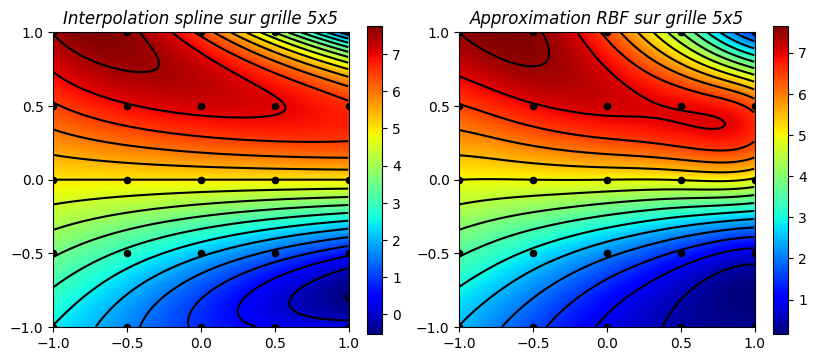

In [12]:
n = 5 # choix du nombre d'échantillons par axe de coordonnées (essayer des valeurs comprises entre 4 et 15)
x = y = np.linspace(-1, 1, n); z = ff(*np.meshgrid(x, y))
spl = itp.RectBivariateSpline(y, x, z.T, kx=3, ky=3, s=0) # interpolation bicubique sur grille régulière
zz = spl(xx.ravel(), yy.ravel(), grid=False).reshape(xx.shape) # calcul des valeurs de l'interpolant
xr, yr = np.meshgrid(x, y); zr = ff(xr,yr) # échantillonnage sur grille régulière
rbf = itp.Rbf(xr, yr, zr, smooth=0.05); zzr = rbf(xx, yy) # approximation RBF sur grille régulière

mp.figure(figsize=(10,5), dpi=100); mp.subplots_adjust(wspace=0.1)
mp.subplot(1,2,1); mp.imshow(zz, extent=[-1, 1, -1, 1], origin='lower', cmap='jet')
mp.colorbar(shrink=0.8); mp.contour(zz, 16, extent=[-1, 1, -1, 1], origin='lower', colors='k')
mp.scatter(xr, yr, color='k', s=20); mp.yticks([-1,-0.5,0,0.5,1])
mp.title(f"Interpolation spline sur grille {n}x{n}", style='italic');
mp.subplot(1,2,2); mp.imshow(zzr, extent=[-1, 1, -1, 1], origin='lower', cmap='jet')
mp.colorbar(shrink=0.8); mp.contour(zzr, 16, extent=[-1, 1, -1, 1], origin='lower', colors='k')
mp.scatter(xr, yr, color='k', s=20); mp.yticks([-1,-0.5,0,0.5,1])
mp.title(f"Approximation RBF sur grille {n}x{n}", style='italic');

---
### 2 - Module 'scipy.optimize'

Le module [**scipy.optimize**](https://docs.scipy.org/doc/scipy/tutorial/optimize.html) fournit des outils pour l'optimisation numérique et la recherche de racines d'équations non-linéaires. Il est principalement utilisé pour les opérations suivantes : minimiser ou maximiser des fonctions (avec ou sans contraintes), résoudre des équations ou systèmes non-linéaires, ou encore ajuster des courbes à des données expérimentales, selon une famille de courbes choisie par l'utilisateur.

Les fonctions les plus intéressantes du module pour une utilisation en Sciences des Données sont les suivantes :
- **`minimize`** : minimisation d'une fonction multivariée en utilisant différentes méthodes
- **`root`** : recherche des racines d'une équation ou d'un système d'équations non-linéaires
- **`curve_fit`** : ajustement d'une courbe aux données par la méthode des moindres carrés
- **`linprog`** : résolution de problèmes d'optimisation linéaire

Cette section va montrer des exemples d'utilisation pour les trois premières fonctions de la liste. La fonction **`linprog`** sera étudiée plus en détail dans le chapitre 11, avec les autres outils disponibles dans l'écosystème Scientific Python destinés à la résolution de problèmes d'optimisation linéaire.

In [13]:
import scipy.optimize as opt # import du module avec l'alias habituel 'opt'
#inspect(opt, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

---
#### a - Recherche de minima/maxima d'une fonction multivariée

La fonction **`minimize`** du module **`scipy.optimize`** est une fonction très générale permettant de trouver le minimum d'une fonction multivariée de dimension arbitraire. Plusieurs méthodes numériques différentes sont implémentées au sein de cette fonction, et peuvent être sélectionnées à l'aide du paramètre **`method`**. Certaines de ces méthodes permettent ainsi d'ajouter des contraintes diverses, par exemple une recherche spécifique du minimum sur un domaine borné, ou une solution vérifiant un certain nombre de contraintes fournies sous forme d'égalités ou d'inégalités, ce qui permet de traiter un très grand nombre de cas pratiques, avec une interface commune.

Pour illustrer l'utilisation de la fonction **`minimize`**, on va créer une fonction de test bivariée $z = f(x,y)$ définie par un produit entre une gaussienne et une sinusoïde, ce qui permet d'obtenir des ondulations complexes dans les deux directions, générant ainsi une fonction de test difficile pour la recherche d'extrema :

$$ z = f(x,y) = \exp\left(\frac{-x^2-y^2}{120}\right)\: \sin\left(x - y + \frac{x^2y}{20}\right) $$

> **Note :** la fonction présente une symétrie centrale impaire $f(–x,–y) = –f(x,y)$ qui est facilement apparent sur la figure ci-dessous par l'existence des formes similaires bleues ou rouges, symétriques par rapport à l'origine

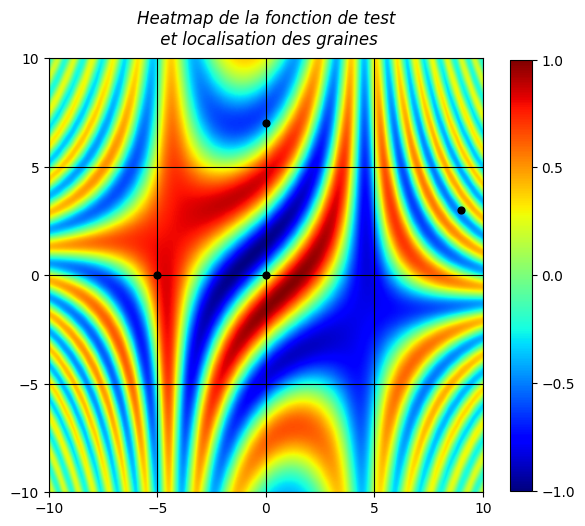

In [14]:
f = lambda x,y: np.exp((-x*x-y*y)/120) * np.sin(x-y + x*x*y/20) # définition de la fonction de test

t = np.linspace(-10, 10, 400); x, y = np.meshgrid(t, t) # grille de visualisation 400x400
z = f(x, y) # valeurs de la fonction f pour chaque couple (x,y) de la grille de visualisation
seeds = np.array([(0,0),(-5,0),(0,7),(9,3)]) # positions de départ des recherches itératives (= graines)

mp.figure(figsize=(7,7), dpi=100); mp.xticks([-10,-5,0,5,10]); mp.yticks([-10,-5,0,5,10]); mp.grid(c='k')
mp.imshow(z, extent=[-10,10,-10,10], origin='lower', cmap='jet', vmin=-1, vmax=1)
mp.colorbar(shrink=0.8, ticks=[-1,-0.5,0,0.5,1]); mp.scatter(seeds[:,0], seeds[:,1], color='k', s=24)
mp.title('Heatmap de la fonction de test\n et localisation des graines', style='italic', pad=10);

Toutes les méthodes numériques implémentées dans la fonction **`minimize`** utilisent des algorithmes itératifs basés sur la matrice jacobienne (dérivées premières) ou hessienne (dérivées secondes) pour la recherche du minimum. Le point de départ de cette recherche itérative, appelée **graine**, est fondamental pour la bonne détection des extrema, car le risque est grand de converger vers un minimum local au lieu du minimum global, notamment dans le cas de fonctions complexes.

Dans notre exemple, on va démarrer à partir de la localisation des ***quatre graines repérées par un disque noir*** sur la figure : la première graine au centre est positionnée tout près du minimum globale et du maximum global de la fonction, la seconde à gauche se trouve dans une zone contenant un maximum local, la troisième en haut dans une zone d'un minimum local, et la dernière en bas à droite dans une zone de variations rapides de la fonction :

In [15]:
# La fonction 'minimize' ne gère que des fonctions prenant un vecteur en paramètre, on va donc créer une
# fonction wrapper f_min(p) avec p = (x,y) qui va simplement appeler la fonction originelle f(x,y)
f_min = lambda p: f(p[0],p[1]) # wrapper de la fonction bivariée en fonction vectorielle

# de même, 'minimize' ne sait que trouver les minima d'une fonction, donc pour trouver les maxima, on va
# chercher les minima de la fonction opposée -f(x,y) puis changer le signe du résultat final obtenu. Pour
# cela, on définit un nouveau wrapper f_max(p) qui retourne la valeur opposée de la fonction originelle
f_max = lambda p: -f(p[0],p[1]) # wrapper vectoriel pour l'opposée de la fonction bivariée

mins, maxs = [], [] # création de 2 listes pour accumuler les résultats trouvés

for seed in seeds: # itération sur les quatre graines (= position de départ de la recherche itérative)
  # minimisation avec la méthode par défaut : BFGS (Broyden–Fletcher–Goldfarb–Shanno)
  print(f"● Méthode BFGS avec départ en {seed}")
  val = opt.minimize(f_min, seed); x,y = val.x; v = val.fun; mins += [(x,y,v)]
  print(f"  Minimum : xmin = {x:.3f}, ymin = {y:.3f}, vmin = {v:.5f}")
  val = opt.minimize(f_max, seed); x,y = val.x; v = -val.fun; maxs += [(x,y,v)] # valeur opposée
  print(f"  Maximum : xmax = {x:.3f}, ymax = {y:.3f}, vmax = {v:.5f}")

● Méthode BFGS avec départ en [0 0]
  Minimum : xmin = -0.777, ymin = 0.804, vmin = -0.98954
  Maximum : xmax = 0.777, ymax = -0.804, vmax = 0.98954
● Méthode BFGS avec départ en [-5  0]
  Minimum : xmin = -6.037, ymin = -2.157, vmin = -0.70934
  Maximum : xmax = -4.625, ymax = -0.284, vmax = 0.83425
● Méthode BFGS avec départ en [0 7]
  Minimum : xmin = -1.197, ymin = 7.035, vmin = -0.64900
  Maximum : xmax = -1.684, ymax = 3.451, vmax = 0.88240
● Méthode BFGS avec départ en [9 3]
  Minimum : xmin = 8.034, ymin = 4.138, vmin = -0.50613
  Maximum : xmax = 8.498, ymax = 4.555, vmax = 0.46063


Comme on peut le constater dans les résultats ci-dessus, l'algorithme va converger sur 4 minima et 4 maxima différents, seul le premier point de départ permet d'obtenir le minimum et maximum global. La figure ci-dessous montre la localisation des extrema trouvés (carrés blancs pour les minima, losanges blancs pour les maxima) et on voit que ceux-ci sont toujours relativement proches des points de départ utilisés :

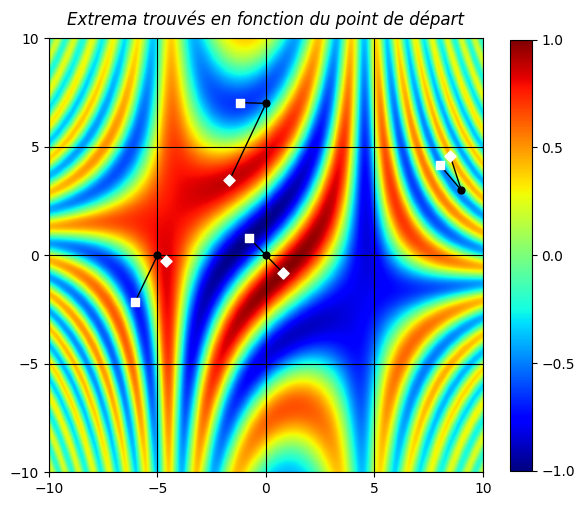

In [16]:
mins, maxs = np.array(mins), np.array(maxs) # conversion des listes en vecteurs numpy
mp.figure(figsize=(7,7), dpi=100); mp.xticks([-10,-5,0,5,10]); mp.yticks([-10,-5,0,5,10])
mp.imshow(z, extent=[-10,10,-10,10], origin='lower', cmap='jet', vmin=-1, vmax=1)
mp.colorbar(shrink=0.8, ticks=[-1,-0.5,0,0.5,1]); mp.scatter(seeds[:,0], seeds[:,1], color='k', s=24)
for s,m in zip(seeds, mins): mp.plot((s[0],m[0]), (s[1],m[1]), 'k-', lw=1) # trait noir vers les minima
for s,m in zip(seeds, maxs): mp.plot((s[0],m[0]), (s[1],m[1]), 'k-', lw=1) # trait noir vers les maxima
mp.scatter(mins[:,0], mins[:,1], marker='s', color='w', s=32, zorder=2) # carré blanc pour les minima
mp.scatter(maxs[:,0], maxs[:,1], marker='D', color='w', s=32, zorder=2) # losange blanc pour les maxima
mp.title('Extrema trouvés en fonction du point de départ', style='italic', pad=10); mp.grid(c='k');

Une technique classique pour éviter les pièges des extrema locaux consiste à effectuer un **criblage aléatoire**, c'est-à-dire à effectuer une (grande) série de recherches successives avec des graines choisies aléatoirement, et de ne garder que le résultat optimal trouvé. Pour garantir que ce criblage permet de couvrir l'ensemble du domaine $[–10,10]^2$, on va à nouveau utiliser un [**échantillonnage stratifié**](https://fr.wikipedia.org/wiki/%C3%89chantillonnage_stratifi%C3%A9), comme on l'avait fait dans le paragraphe 1c, mais au lieu de créer uniquement 4 zones (une par quadrant), on va créer une grille virtuelle de taille 10 x 10, et choisir un échantillon aléatoire pour chacune des 100 cases obtenues. Grâce aux fonctionnalités de **numpy**, ce processus s'implémente de manière extrêmement simple :

In [17]:
# création d'un échantillonnage stratifié par une grille de taille 10 x 10 sur le domaine [-10,10]^2
# calcul des centres des cases de la grille puis perturbation aléatoire avec une distribution uniforme
np.random.seed(0); strats = np.mgrid[-9:10:2,-9:10:2].reshape(2,-1).T + np.random.uniform(-0.5,0.5,(100,2))
mins, maxs = [], [] # réinitialisation des deux listes pour le stockage des nouveaux extrema trouvés

for seed in strats: # # itération sur les 100 graines obtenues par stratification
  val = opt.minimize(f_min, seed); mins.append((val.fun, *val.x)) # ajout du min trouvé
  val = opt.minimize(f_max, seed); maxs.append((-val.fun, *val.x)) # ajout du max trouvé

vmin, xmin, ymin = min(mins, key=lambda t: t[0]) # extraction du min global
print(f"Minimum global : xmin = {xmin:.3f}, ymin = {ymin:.3f}, vmin = {vmin:.5f}")
vmax, xmax, ymax = max(maxs, key=lambda t: t[0]) # extraction du max global
print(f"Maximum global : xmax = {xmax:.3f}, ymax = {ymax:.3f}, vmax = {vmax:.5f}")

Minimum global : xmin = -0.777, ymin = 0.804, vmin = -0.98954
Maximum global : xmax = 0.777, ymax = -0.804, vmax = 0.98954


On peut afficher l'image du criblage aléatoire généré (disques noirs) ainsi que la localisation des différents extrema (carrés blancs pour minima, losanges blancs pour maxima). On constate que les graines forment bien une grille 10x10 non-régulière, car la position de chaque graine a subi une perturbation aléatoire. Et on peut vérifier que la localisation des extrema respecte, sans surprise, la propriété de symétrie centrale impaire de la fonction utilisée pour le test :

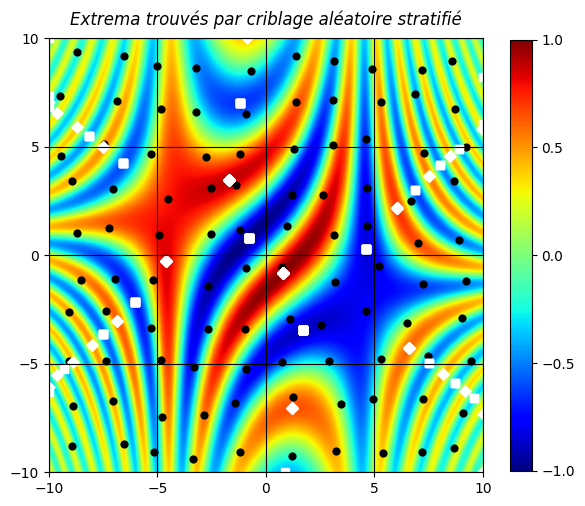

In [18]:
mins, maxs = np.clip(mins,-10,10), np.clip(maxs,-10,10) # restriction à l'intervalle [-10,10]^2
mp.figure(figsize=(7,7), dpi=100); mp.xticks([-10,-5,0,5,10]); mp.yticks([-10,-5,0,5,10])
mp.imshow(z, extent=[-10,10,-10,10], origin='lower', cmap='jet', vmin=-1, vmax=1)
mp.colorbar(shrink=0.8, ticks=[-1,-0.5,0,0.5,1]); mp.scatter(strats[:,0], strats[:,1], color='k', s=24)
mp.scatter(mins[:,1], mins[:,2], marker='s', c='w', s=32) # carré blanc pour les minima
mp.scatter(maxs[:,1], maxs[:,2], marker='D', c='w', s=32) # losange blanc pour les maxima
mp.title('Extrema trouvés par criblage aléatoire stratifié', style='italic', pad=10); mp.grid(c='k');

---
La méthode par défaut utilisée par **`minimize`**, appelée ***BFGS*** selon les initiales des auteurs [**Broyden–Fletcher–Goldfarb–Shanno**](https://fr.wikipedia.org/wiki/M%C3%A9thode_de_Broyden-Fletcher-Goldfarb-Shanno), est considérée comme celle pouvant s'adapter de manière robuste à la plupart des situations. Néanmoins, comme elle doit estimer numériquement la matrice hessienne, sa complexité en temps de calcul s'alourdit assez vite lorsque le nombre de variables augmente. La [**méthode du gradient conjugué**](https://fr.wikipedia.org/wiki/M%C3%A9thode_du_gradient_conjugu%C3%A9), qui elle n'a besoin que de la jacobienne et non de la hessienne, peut donc être envisagée comme une alternative pour les fonctions multivariées de grandes dimensions. Dans notre cas, on constate que la méthode ***CG*** converge sur les mêmes extrema que ***BFGS*** mais avec un gain de temps de calcul d'environ 40%, sachant que ce gain va encore augmenter pour les dimensions supérieures. Néanmoins, la méthode ***CG*** est plus instable numériquement dans les cas difficiles, il faut donc réserver son usage  aux cas où ***BFGS*** s'avère trop lente :

In [19]:
# minimisation avec la méthode du gradient conjugué : CG (Conjugate Gradient)
print(f"● Méthode CG avec départ en (0,0)")
val = opt.minimize(f_min, (0,0), method='CG'); xmin, ymin = val.x; vmin = val.fun
print(f"  Minimum : xmin = {xmin:.3f}, ymin = {ymin:.3f}, vmin = {vmin:.5f}")
val = opt.minimize(f_max, (0,0), method='CG'); xmax, ymax = val.x; vmax = -val.fun
print(f"  Maximum : xmax = {xmax:.3f}, ymax = {ymax:.3f}, vmax = {vmax:.5f}")

● Méthode CG avec départ en (0,0)
  Minimum : xmin = -0.777, ymin = 0.804, vmin = -0.98954
  Maximum : xmax = 0.777, ymax = -0.804, vmax = 0.98954


In [20]:
# comparaison des temps de calcul entre BFGS et CG
%timeit opt.minimize(f_min, (0,0), method='BFGS')
%timeit opt.minimize(f_min, (0,0), method='CG')

1.68 ms ± 13.6 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)
1.2 ms ± 16.2 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


Lorsqu'on connait approximativement la zone où se trouvent les extrema globaux, il est généralement plus efficace d'inclure des bornes dans la recherche, plutôt que de partir d'un criblage aléatoire pour les points de départ, mais pour cela il faut des méthodes adaptées pour pouvoir inclure un domaine borné. La méthode ***L-BFGS-B*** permet de forcer la recherche sur un domaine rectangulaire $[x_{min}, x_{max}] \times [y_{min}, y_{max}]$, et comme on peut le constater ci-dessous, elle va effectivement
converger sur les extrema globaux, quelque soit le point de départ choisi :

In [21]:
mins, maxs = [], [] # réinitialisation des deux listes pour le stockage des nouveaux extrema trouvés
for seed in seeds: # itération sur les quatre graines de départ
  # minimisation avec bornes : L-BFGS-B (BFGS with bounds)
  print(f"● Méthode BFGS-B (min/max sur domaine rectangulaire) avec départ en {seed}")
  bounds = [(-1,1),(-1,1)] # bornes du domaine de recherche [(xmin,xmax),(ymin,ymax)]
  val = opt.minimize(f_min, seed, bounds=bounds, method='L-BFGS-B'); x,y = val.x; v = val.fun
  print(f"  Minimum : xmin = {x:.3f}, ymin = {y:.3f}, vmin = {v:.5f}"); mins += [(x,y,v)]
  val = opt.minimize(f_max, seed, bounds=bounds, method='L-BFGS-B'); x,y = val.x; v = -val.fun
  print(f"  Maximum : xmax = {x:.3f}, ymax = {y:.3f}, vmax = {v:.5f}"); maxs += [(x,y,v)]

● Méthode BFGS-B (min/max sur domaine rectangulaire) avec départ en [0 0]
  Minimum : xmin = -0.777, ymin = 0.804, vmin = -0.98954
  Maximum : xmax = 0.777, ymax = -0.804, vmax = 0.98954
● Méthode BFGS-B (min/max sur domaine rectangulaire) avec départ en [-5  0]
  Minimum : xmin = -0.777, ymin = 0.804, vmin = -0.98954
  Maximum : xmax = 0.777, ymax = -0.804, vmax = 0.98954
● Méthode BFGS-B (min/max sur domaine rectangulaire) avec départ en [0 7]
  Minimum : xmin = -0.777, ymin = 0.804, vmin = -0.98954
  Maximum : xmax = 0.777, ymax = -0.804, vmax = 0.98954
● Méthode BFGS-B (min/max sur domaine rectangulaire) avec départ en [9 3]
  Minimum : xmin = -0.777, ymin = 0.804, vmin = -0.98954
  Maximum : xmax = 0.777, ymax = -0.804, vmax = 0.98954


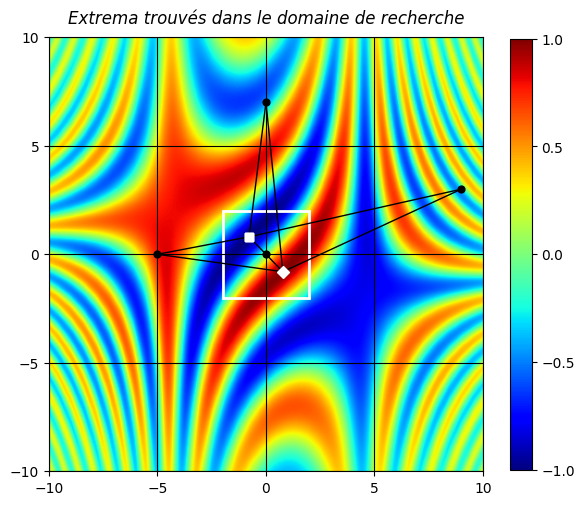

In [22]:
mins, maxs = np.array(mins), np.array(maxs) # conversion des listes en vecteurs numpy
mp.figure(figsize=(7,7), dpi=100); mp.xticks([-10,-5,0,5,10]); mp.yticks([-10,-5,0,5,10])
mp.imshow(z, extent=[-10,10,-10,10], origin='lower', cmap='jet', vmin=-1, vmax=1)
mp.colorbar(shrink=0.8, ticks=[-1,-0.5,0,0.5,1]); mp.scatter(seeds[:,0], seeds[:,1], color='k', s=24)
for s,m in zip(seeds, mins): mp.plot((s[0],m[0]), (s[1],m[1]), 'k-', lw=1) # trait noir vers les minima
for s,m in zip(seeds, maxs): mp.plot((s[0],m[0]), (s[1],m[1]), 'k-', lw=1) # trait noir vers les maxima
mp.scatter(mins[:,0], mins[:,1], marker='s', color='w', s=32, zorder=2) # carré blanc pour les minima
mp.scatter(maxs[:,0], maxs[:,1], marker='D', color='w', s=32, zorder=2) # losange blanc pour les maxima
mp.gca().add_patch(mp.Rectangle((-2,-2), 4, 4, ec='w', fc='none', lw=2)) # domaine de recherche rectangulaire
mp.title('Extrema trouvés dans le domaine de recherche', style='italic', pad=10); mp.grid(c='k');

Lorsque l'on souhaite inclure des contraintes plus complexes qu'un simple domaine rectangulaire, il faut s'orienter vers des méthodes d'optimisation sous contraintes, dont la plus connue est la [**Sequential Least Squares Quadratic Programming**](https://en.wikipedia.org/wiki/Sequential_quadratic_programming) (***SLSQP***) également appelée **méthode de Newton avec multiplicateurs de Lagrange**. Cette méthode sera détaillée plus longuement dans la section consacrée à l'optimisation quadratique dans le chapitre 11, mais ici on va simplement l'utiliser comme un algorithme de recherche d'extrema en montrant que les contraintes très générales qu'elle offre peuvent servir à limiter la zone de recherche à des domaines non-rectangulaires (ici, il s'agit d'un disque de centre (0,-5) et de rayon 2) :

In [23]:
mins, maxs = [], [] # réinitialisation des deux listes pour le stockage des nouveaux extrema trouvés
for seed in seeds: # itération sur les quatre graines de départ
  # minimisation avec contraintes : SLSQP (Sequential Least Squares Quadratic Programming)
  print(f"● Méthode SLSQP (min/max sous contraintes) avec départ en {seed}")
  disk = {'type':'ineq', 'fun':lambda x: 4 - (x[0]-0)**2 - (x[1]+5)**2} # contrainte (x-5)^2 + (y-5)^2 <= 4
  val = opt.minimize(f_min, seed, method='SLSQP', constraints=[disk]); x,y = val.x; v = val.fun
  print(f"  Minimum : xmin = {x:.3f}, ymin = {y:.3f}, vmin = {v:.5f}"); mins += [(x,y,v)]
  val = opt.minimize(f_max, seed, method='SLSQP', constraints=[disk]); x,y = val.x; v = -val.fun
  print(f"  Maximum : xmax = {x:.3f}, ymax = {y:.3f}, vmax = {v:.5f}"); maxs += [(x,y,v)]

● Méthode SLSQP (min/max sous contraintes) avec départ en [0 0]
  Minimum : xmin = 1.422, ymin = -3.594, vmin = -0.88137
  Maximum : xmax = -1.519, ymax = -3.700, vmax = 0.86072
● Méthode SLSQP (min/max sous contraintes) avec départ en [-5  0]
  Minimum : xmin = 1.422, ymin = -3.594, vmin = -0.88137
  Maximum : xmax = -1.520, ymax = -3.700, vmax = 0.86072
● Méthode SLSQP (min/max sous contraintes) avec départ en [0 7]
  Minimum : xmin = 1.422, ymin = -3.594, vmin = -0.88137
  Maximum : xmax = -1.520, ymax = -3.700, vmax = 0.86072
● Méthode SLSQP (min/max sous contraintes) avec départ en [9 3]
  Minimum : xmin = 1.422, ymin = -3.594, vmin = -0.88137
  Maximum : xmax = -1.519, ymax = -3.699, vmax = 0.86072


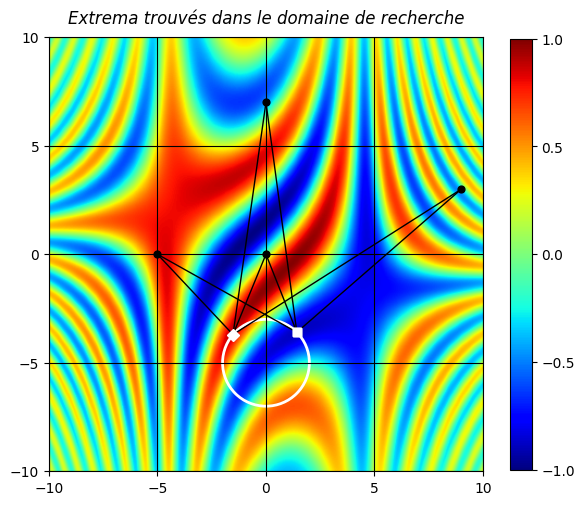

In [24]:
mins, maxs = np.array(mins), np.array(maxs) # conversion des listes en vecteurs numpy
mp.figure(figsize=(7,7), dpi=100); mp.xticks([-10,-5,0,5,10]); mp.yticks([-10,-5,0,5,10])
mp.imshow(z, extent=[-10,10,-10,10], origin='lower', cmap='jet', vmin=-1, vmax=1)
mp.colorbar(shrink=0.8, ticks=[-1,-0.5,0,0.5,1]); mp.scatter(seeds[:,0], seeds[:,1], color='k', s=24)
for s,m in zip(seeds, mins): mp.plot((s[0],m[0]), (s[1],m[1]), 'k-', lw=1) # trait noir vers les minima
for s,m in zip(seeds, maxs): mp.plot((s[0],m[0]), (s[1],m[1]), 'k-', lw=1) # trait noir vers les maxima
mp.scatter(mins[:,0], mins[:,1], marker='s', color='w', s=32, zorder=2) # carré blanc pour les minima
mp.scatter(maxs[:,0], maxs[:,1], marker='D', color='w', s=32, zorder=2) # losange blanc pour les maxima
mp.gca().add_patch(mp.Circle((0,-5), 2, ec='w', fc='none', lw=2)) # domaine de recherche circulaire
mp.title('Extrema trouvés dans le domaine de recherche', style='italic', pad=10); mp.grid(c='k');

---
#### b - Résolution de systèmes d'équations non-linéaires

La fonction **`root`** du module **`scipy.optimize`** est utilisée pour trouver les solutions d'une équation non-linéaire, ou plus généralement d'un système composé de ***n*** équations non-linéaires à ***n*** inconnues. Le système d'équations à résoudre doit être réécrit sous forme de fonction vectorielle multivariée (de $ℝ^n$ dans $ℝ^n$ ) et la fonction **`root`** va rechercher les racines de cette fonction, ce qui permet d'obtenir les valeurs numériques des inconnues du système à résoudre. Comme c'est le cas pour la fonction **`minimize`** vue ci-dessus, la fonction **`root`** implémente plusieurs méthodes qui peuvent être sélectionnées via le paramètre **`method`**, mais en pratique l'option par défaut, appelée [**méthode hybride de Powell**](https://en.wikipedia.org/wiki/Powell%27s_dog_leg_method), qui combine l'[**algorithme de Newton**](https://fr.wikipedia.org/wiki/M%C3%A9thode_de_Newton) avec celui des [**régions de confiance**](https://fr.wikipedia.org/wiki/Algorithme_%C3%A0_r%C3%A9gions_de_confiance), s'avère être optimale dans la quasi-totalité des cas.

L'utilisation de la fonction **`root`** ne présente aucune difficulté. Pour illustrer sa mise en oeuvre, on va simplement prendre trois exemples très classiques :

- Le premier exemple consiste à trouver toutes les racines d'une fonction non-linéaire monovariée. On va à nouveau utiliser le produit d'une gaussienne et d'une sinusoïde comme fonction de test :
$$ f(x) = 3\: \cos(2x\!+\!1)\:\: \mathbf{e}^{\textstyle -0.1x^2 - 0.3x} - 1 $$

In [25]:
f = lambda x: 3 * np.exp(-0.1*x*x-0.3*x+1) * np.cos(2*x+1) - 1 # définition de la fonction de test
sol = opt.root(f, 0) # recherche de racine à partir du point x=0
root = sol.x[0] # récupération de la racine trouvée
print(f"Racine trouvée : x = {root:.7f}, f(x) = {f(root):.2f}")

Racine trouvée : x = 0.2194060, f(x) = -0.00


La fonction **`root`** ne permet de trouver qu'une seule solution à partir du point de départ sélectionné. Pour obtenir toutes les racines, nous allons appliquer à nouveau le principe du **criblage aléatoire** en choisissant aléatoirement un grand nombre de points de départ, dans un intervalle prédéfini. Ensuite, pour bien différencier les solutions trouvées, on va fournir une précision (définie en nombre de décimales) permettant de fusionner toutes les racines qui sont suffisamment proches :

In [26]:
origins = np.random.randint(-1000, 1000, 100) / 100 # 100 échantillons aléatoires dans [-10,10]
roots, precision = [], 7; tol = 1/10**precision # choix de la précision des calculs (= nombre de décimales)
for origin in origins: # boucle sur les points de départs aléatoires
  sol = opt.root(f, origin); root = float(sol.x[0]) # récupération de la racine trouvée
  if not np.isclose(f(root), 0, atol=tol): continue # pas de racine valide pour ce point de départ
  if any(np.isclose(root, r, atol=tol) for r in roots): continue # racine équivalente déjà en stock
  roots.append(round(root, precision)) # ajout de la nouvelle racine trouvée
print(f"Nombre de racines trouvées : {len(roots)}\n{sorted(roots)}")

Nombre de racines trouvées : 6
[-4.3178147, -2.9161708, -1.2360159, 0.219406, 2.0298691, 3.0060488]


Un tracé de la fonction $f(x)$ permet de vérifier visuellement le nombre et la position des racines :

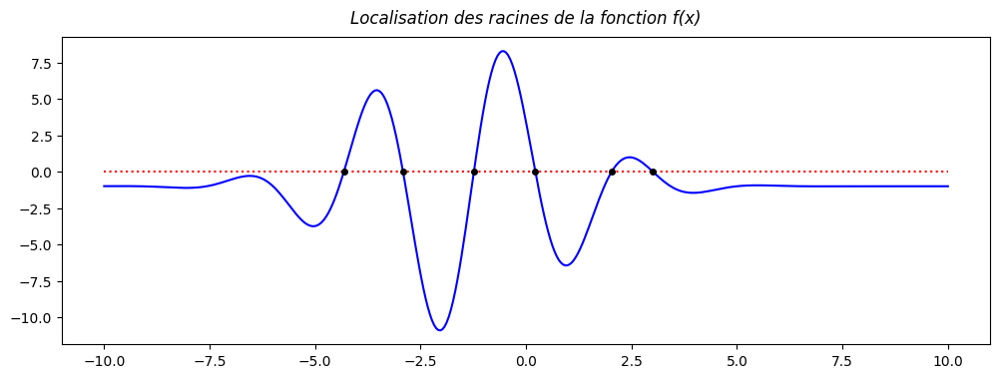

In [27]:
x = np.linspace(-10, 10, 400); y = f(x); zeros, roots = np.zeros_like(x), np.array(roots)
mp.figure(figsize=(12,4), dpi=100); mp.plot(x, y, 'b-', x, zeros, 'r:', roots, f(roots), 'ko', ms=4)
mp.title('Localisation des racines de la fonction f(x)', style='italic', pad=10);

- Le second exemple va chercher à résoudre un système non-linéaire à 2 équations, combinant un polynôme quadratique et une équation trigonométrique :
$$
\begin{cases}\begin{align}
5x + 4y^2 = 3 \\[5pt]
2\sin x - y = 0
\end{align}\end{cases}
$$

In [28]:
g = lambda x: [5*x[0] + 4*x[1]**2 - 3, 2*np.sin(x[0]) - x[1]] # transformation du système en fonction
sol = opt.root(g, (0,0)) # recherche de racine à partir du point p=(0,0)
root = sol.x; val = g(root) # récupération de la racine trouvée et de la valeur résiduelle
print(f"Racine trouvée : x = {root[0]:.7f}, y = {root[1]:.7f}, f(x) = ({val[0]:.2f},{val[1]:.2f})")

Racine trouvée : x = 0.3072672, y = 0.6049099, f(x) = (-0.00,-0.00)


Et à nouveau, un criblage aléatoire permet d'obtenir toutes les racines :

In [29]:
randoms = np.random.randint(-2000, 2000, (100,2)) / 100 # 100 points aléatoires dans [-20,20]^2
roots, precision = [], 7; tol = 1/10**precision # choix de la précision des calculs (= nombre de décimales)
for origin in randoms: # boucle sur les points de départs aléatoires
  sol = opt.root(g, origin); root = sol.x # récupération de la racine trouvée
  if not np.allclose(g(root), 0, atol=tol): continue # pas de racine valide pour ce point de départ
  if any(np.allclose(root, r, atol=tol) for r in roots): continue # racine équivalente déjà en stock
  roots.append(root.round(precision)) # ajout de la nouvelle racine trouvée
roots = np.sort(np.array(roots), axis=0) # tri des racines (d'abord en x puis en y)
print(f"Nombre de racines trouvées : {len(roots)}\n{roots}")

Nombre de racines trouvées : 3
[[-2.0132868 -1.8073761]
 [-0.6869278 -1.2683295]
 [ 0.3072672  0.6049099]]


Pour visualiser le lieu des racines, on va utiliser un ***contour plot*** sur les deux équations, en plaçant le tracé sur la courbe liée à l'isovaleur 0. Dans ces conditions, les racines sont localisées aux différents points d'intersection des deux courbes de niveau :

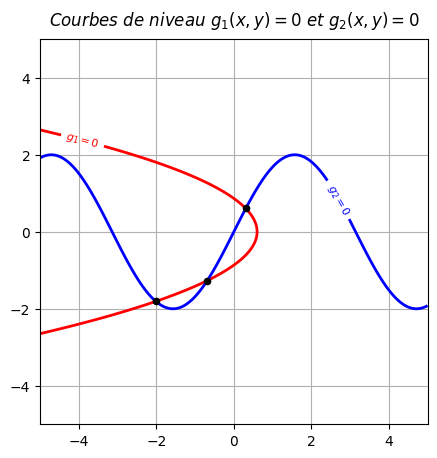

In [30]:
t = np.linspace(-5, 5, 400); x, y = np.meshgrid(t,t) # échantillonnage du domaine [-5,5]^2
g1, g2 = 5*x + 4*y**2 - 3, 2*np.sin(x) - y # on sépare la fonction vectorielle en 2 fonctions universelles

mp.figure(figsize=(5,5), dpi=100)
cs1 = mp.contour(x, y, g1, levels=[0], colors='r', linewidths=2) # isoligne g1(x,y) = 0
mp.clabel(cs1, inline=True, fontsize=8, fmt="$g_1 = 0$", manual=[(-4,2)]) # inclusion du label sur la courbe
cs2 = mp.contour(x, y, g2, levels=[0], colors='b', linewidths=2) # isoligne g2(xny) = 0
mp.clabel(cs2, inline=True, fontsize=8, fmt="$g_2 = 0$", manual=[(3,1)]) # inclusion du label sur la courbe
mp.scatter(roots[:,0], roots[:,1], s=20, c='k', marker='o', zorder=2) # rajout des racines trouvées
mp.title('Courbes de niveau $g_1(x,y)=0$ et $g_2(x,y)=0$', style='italic', pad=10); mp.grid()

- Et enfin, le dernier exemple met en oeuvre un système à 5 équations dont les expressions algébriques combinent des fonctions variées (polynômes, exponentielles, logarithmes, sinus, cosinus) :
$$
\begin{cases}\begin{align}
x_0^2 + \log(1\!+\!x_1^2) = 3 \\[5pt]
2x_1 \cos x_2 = 1 \\[5pt]
e^{-x_2} + x_3^2 = 1 \\[5pt]
\sin x_3 - x_4 = 0 \\[5pt]
x_0 - x_2^2 + x_4 = 2
\end{align}\end{cases}
$$

In [31]:
h = lambda x: [x[0]**2 + np.log1p(x[1]**2) - 3, 2*x[1]*np.cos(x[2]) - 1, np.exp(-x[2]) + x[3]**2 - 1,
  np.sin(x[3]) - x[4], x[0] - x[2]**2 + x[4] - 2] # transformation du système en fonction de dimension 5

sol = opt.root(h, (0,0,0,0,0)) # recherche de racine à partir du point p=(0,0,0,0,0)
root = sol.x; val = h(root) # récupération de la racine trouvée et de la valeur résiduelle
print(f"Racine trouvée : x = {np.round(root,7)}, h(x) = {np.round(val,2)}")

Racine trouvée : x = [1.6651842 0.5050074 0.1409394 0.3625715 0.3546797], h(x) = [ 0. -0.  0.  0. -0.]


Et comme d'habitude, on rajoute un criblage aléatoire pour obtenir toutes les racines :

In [32]:
randoms = np.random.randint(-2000, 2000, (100,5)) / 100 # 100 points aléatoires dans [-20,20]^5
roots, precision = [], 7; tol = 1/10**precision # choix de la précision des calculs (= nombre de décimales)
for origin in randoms: # boucle sur les points de départs aléatoires
  sol = opt.root(h, origin); root = sol.x # récupération de la racine trouvée
  if not np.allclose(h(root), 0, atol=tol): continue # pas de racine valide pour ce point de départ
  if any(np.allclose(root, r, atol=tol) for r in roots): continue # racine équivalente déjà en stock
  roots.append(root.round(precision)) # ajout de la nouvelle racine trouvée
print(f"Nombre de racines trouvées : {len(roots)}\n{np.sort(np.array(roots), axis=0)}") # tri des racines

Nombre de racines trouvées : 2
[[1.6505946 0.5050074 0.1409394 0.3625715 0.3546797]
 [1.6651842 0.5632394 0.4784231 0.6166361 0.5782941]]


Evidemment, dans un espace de dimension 5, il est un peu plus difficile de générer une visualisation pertinente, donc on va faire confiance à la fonction **`root`** sur la validité du résultat obtenu...

---
#### c - Ajustement de modèles à un jeu de données expérimentales

La dernière fonction du module **`scipy.optimize`** particulièrement utile dans le domaine des Sciences des Données, est la fonction **`curve_fit`** qui permet l'ajustement *(**data fitting**)* d'un modèle théorique $y = f(x,a)$ à des couples de données expérimentales $\{x_k, \hat y_k\}$ en minimisant l'erreur quadratique moyenne entre les valeurs théoriques $y_k = f(x_k,a)$ et les données mesurées $\hat y_k$. La fonction met en oeuvre le principe général de la [**méthode des moindres carrées non-linéaires**](https://fr.wikipedia.org/wiki/Moindres_carr%C3%A9s_non_lin%C3%A9aires), au travers de plusieurs algorithmes choisis via le paramètre **`method`**, mais en pratique la méthode utilisée par défaut, appelée [**algorithme de Levenberg-Marquardt**](https://fr.wikipedia.org/wiki/Algorithme_de_Levenberg-Marquardt), qui combine une descente de gradient avec l'algorithme de Newton, s'avère être optimale dans la quasi-totalité des cas. Il faut noter que **`curve_fit`** est un wrapper de la fonction **`least_squares`** du même module,  avec une interface simplifiée et une restriction à des fonctions monovariées. Pour pouvoir ajuster des modèles multivariés à des données multivariées, il faut donc impérativement utiliser la fonction plus générale, mais en pratique, la très grande majorité des cas concrets en Sciences des Données mettent en oeuvre un ajustement de fonctions monovariées.

Pour simuler l'imprécision des mesures expérimentales, on va échantillonner une fonction de test et rajouter une perturbation aléatoire à la coordonnée verticale de chaque échantillon, en utilisant une distribution normale de faible amplitude. Pour la fonction de test, nous allons prendre une somme de deux sinusoïdes dont l'une sera atténuée par une gaussienne, ce qui permet de produire suffisamment de variations pour ne pas être facilement approximée par une fonction simple :

$$f(x) = 5\,\sin(x-1) + 3\,\mathbf{e}^{\textstyle -\frac{x^2}{4^2}} \sin(1-3x) - 1$$

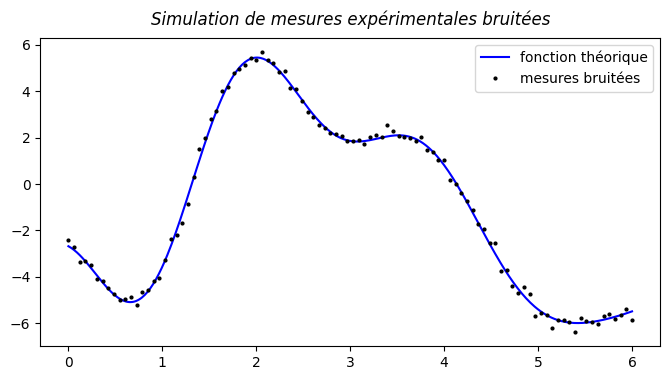

In [33]:
f = lambda x: 5 * np.sin(x-1) + 3 * np.exp(-x*x/16) * np.sin(1-3*x) - 1 # définition de la fonction de test
x = np.linspace(0, 6, 100) # échantillonnage faible densité correspondant à la localisation des mesures
np.random.seed(10); noise = np.random.normal(0, 0.2, 100) # création d'une perturbation pour les mesures
y = f(x) + noise # simulation de mesures bruitées par ajout d'une perturbation gaussienne (écart-type = 0.2)
xx = np.linspace(x[0], x[-1], 400); yy = f(xx) # échantillonnage haute densité pour les tracés

mp.figure(figsize=(8,4), dpi=100); title = 'Simulation de mesures expérimentales bruitées'
mp.plot(xx, yy, 'b-', label='fonction théorique'); mp.plot(x, y, 'k.', ms=4, label='mesures bruitées')
mp.title(title, style='italic', pad=10); mp.legend();

Le rôle de la fonction **`curve_fit`** est de permettre de reconstruire au mieux la fonction correspondant au modèle théorique, à partir de ces mesures bruitées. Pour que cette reconstruction puisse s'effectuer, il faut lui passer en paramètre un modèle de fonction $f(x,a_1,a_2,...a_m)$ possédant un certain nombre de degrés de liberté $a_k$ pour que le processus d'ajustement puisse déterminer la valeur optimale de ces paramètres afin d'être le plus proche possible des mesures. Evidemment, plus le nombre $m$ de degrés de liberté proposé est grand, plus l'ajustement pourra être précis, mais au détriment du temps de calcul puisque cela augmente la dimension de l'espace de recherche des paramètres.

Dans le cas idéal, l'utilisateur connait le modèle théorique que sont censées suivre les données mesurées. Il lui suffit donc de fournir la fonction générale de ce modèle, avec les différents degrés de liberté qu'il contient. Dans notre cas, on sait que le phénomène mesuré s'exprime comme la somme d'une sinusoïde et d'une sinusoïde atténuée par une gaussienne (puisque c'est comme cela que les mesures ont été simulées), ce qui nous permet de construire un modèle parfaitement adapté à notre jeu de données, en fournissant une fonction reprenant l'expression de la fonction de test, mais en remplaçant les valeurs numériques par des variables  $(a,b,c,d,e,f,g)$, ce qui permet d'obtenir sept degrés de liberté  :

- Modèle théorique :
  $$f(x,a,b,c,d,e,f,g) = a\, \sin(x\!+\!b) + c\, \mathbf{e}^{-d x^2} \sin(e x\!+\!f)  + g$$

En pratique, il est rare de se retrouver dans le cas idéal où l'utilisateur a la certitude que les données respectent un modèle théorique connu (cela arrive pour des données issues de phénomènes physiques, mais beaucoup plus rarement lorsque les phénomènes proviennent des sciences humaines). Dans ces conditions, il n'y a pas d'autre alternative que de rechercher des ajustements avec plusieurs familles de fonctions, et voir lesquelles produisent des ajustements de qualité. Dans notre cas, on va imposer d'avoir exactement sept degrés de liberté $(a,b,c,d,e,f,g)$ pour chaque famille de fonctions utilisée, afin d'avoir des résultats comparables avec le modèle théorique. En piochant dans le bestiaire des fonctions souvent utilisées pour ce processus d'ajustement, on va opter pour les cinq modèles suivants, qui vérifient tous cette contrainte des sept paramètres :

- Somme de deux gaussiennes :
  $$f(x,a,b,c,d,e,f,g) = a\, \mathbf{e}^{-b(x-c)^2} + d\, \mathbf{e}^{-e(x-f)^2} + g$$
- Somme de deux sinusoïdes :
  $$f(x,a,b,c,d,e,f,g) = a\, \sin(bx\!+\!c) + d\, \sin(ex\!+\!f) + g$$
- Somme de deux sigmoïdes :
  $$f(x,a,b,c,d,e,f,g) = \frac{a}{\mathbf{e}^{-b(x-c)^2}+1} + \frac{d}{\mathbf{e}^{-e(x-f)^2}+1} + g$$
- Polynôme de degré 6 :
  $$f(x,a,b,c,d,e,f,g) = ax^6\!+\!bx^5\!+\!cx^4\!+\!dx^3\!+\!ex^2\!+\!fx\!+\!g$$
- Polynôme rationnel de degré 3 :
  $$f(x,a,b,c,d,e,f,g) = \frac{ax^3 + bx^2 + cx + d}{ex^3 + fx^2 + gx + 1}$$

La fonction **`curve_fit`** nécessite de donner un point de départ au processus d'optimisation via le paramètre **`p0`** (comme c'était le cas pour les fonctions **`minimize`** et **`root`**) qui définit la liste des valeurs initiales pour chacun des degrés de liberté de la fonction considérée. Une règle qui fonctionne souvent assez bien est de donner une valeur de 1 à tous les coefficients multiplicatifs (dans l'expression du modèle théorique, cela correspond aux paramètres $a, c, d, e$) et une valeur de 0 à tous les coefficients additifs ou soustractifs (pour le modèle théorique, il s'agit des paramètres $b, f, g$). De plus, lorsque que la famille de fonctions consiste en une somme de plusieurs fonctions similaires (typiquement, somme de gaussiennes, ou sommes de sinusoïdes), il est important que les paramètres de chacune de ces fonctions aient des valeurs initiales différentes.

> **Remarque importante :** La fonction **`curve_fit`** possède un paramètre optionnel **`maxfev`** qui définit le nombre maximum d'évaluations de la fonction utilisées par le processus itératif de Levenberg-Marquardt avant de considérer que la méthode ne converge pas et qu'il faut abandonner la recherche. La valeur par défaut de **`maxfev`** (égale à 800) est héritée de la fonction **`lmdif`** du package **MINPACK** développé en Fortran dans les annéees 1980, à une époque où ce type de calcul prenait des heures, voire des dizaines d'heures. Avec les machines modernes, cette valeur est ridiculement petite, il est donc ***impératif de fournir systématiquement une valeur bien plus grande***. En pratique, **`maxfev = 10000`** s'avère suffisant pour fournir une convergence systématique, même dans les cas compliqués, lorsque le point de départ est raisonnablement bien choisi

In [34]:
# Première famille de fonctions = le modèle théorique (sinusoïde + gaussienne * sinusoïde)
theo = lambda x,a,b,c,d,e,f,g: a*np.sin(x+b) + c*np.exp(-(x/d)**2) * np.sin(e*x+f) + g
p0 = [1,0,1,1,1,0,0] # jeu de paramètres initiaux (courbe en rouge)
p1,_ = opt.curve_fit(theo, x, y, p0=p0, maxfev=9999) # jeu de paramètres optimaux (courbe en bleu)
yyt0 = theo(xx, *p0); yyt1 = theo(xx, *p1)

# Seconde famille de fonctions = somme de 2 gaussiennes
gauss = lambda x,a,b,c,d,e,f,g: a*np.exp(-b*(x-c)**2) + d*np.exp(-e*(x-f)**2) + g
p0 = [1,1,1,1,1,4,1] # jeu de paramètres initiaux (courbe en rouge)
p1,_ = opt.curve_fit(gauss, x, y, p0=p0, maxfev=9999) # jeu de paramètres optimaux (courbe en bleu)
yyg0 = gauss(xx, *p0); yyg1 = gauss(xx, *p1)

# Troisième famille de fonctions = somme de 2 sinusoïdes
sinus = lambda x,a,b,c,d,e,f,g: a*np.sin(b*x+c) + d*np.sin(e*x+f) + g
p0 = [1,1,0,1,2,0,0] # jeu de paramètres initiaux (courbe en rouge)
p1,_ = opt.curve_fit(sinus, x, y, p0=p0, maxfev=9999) # jeu de paramètres optimaux (courbe en bleu)
yys0 = sinus(xx, *p0); yys1 = sinus(xx, *p1)

# Quatrième famille de fonctions = somme de 2 sigmoïdes
sigmo = lambda x,a,b,c,d,e,f,g: a/(1+np.exp(-b*(x-c))) + d/(1+np.exp(-e*(x-f))) + g
p0 = [2,10,1,-2,10,4,0] # jeu de paramètres initiaux (courbe en rouge)
p1,_ = opt.curve_fit(sigmo, x, y, p0=p0, maxfev=9999) # jeu de paramètres optimaux (courbe en bleu)
yym0 = sigmo(xx, *p0); yym1 = sigmo(xx, *p1)

# Cinquième famille de fonctions = polynômes de degré 6 et 9
poly6 = lambda x,a,b,c,d,e,f,g: (((((a*x + b)*x + c)*x + d)*x + e)*x + f)*x + g
poly9 = lambda x,a,b,c,d,e,f,g,h,i,j,k: (((((((((a*x+b)*x+c)*x+d)*x+e)*x+f)*x+g)*x+h)*x+i)*x+j)*x+k
p0 = [0,0,0,0,0,0,0] # jeu de paramètres initiaux (courbe en rouge)
p1,_ = opt.curve_fit(poly6, x, y, maxfev=9999) # jeu de paramètres pour degré 6 (courbe en bleu)
p2,_ = opt.curve_fit(poly9, x, y, maxfev=9999) # jeu de paramètres pour degré 10 (courbe en vert)
yyp0 = poly6(xx, *p0); yyp1 = poly6(xx, *p1); yyp2 = poly9(xx, *p2)

# Sixième famille de fonctions = polynômes rationnels de degré 3
ratio3 = lambda x,a,b,c,d,e,f,g: (((a*x + b)*x + c)*x + d) / (((e*x + f)*x + g)*x + 1)
ratio6 = lambda x,a,b,c,d,e,f,g,h,i,j,k: ((((((a*x+b)*x+c)*x+d)*x+e)*x+f)*x+g)/((((h*x+i)*x+j)*x+k)*x+1)
p0 = [0,0,0,0,0,0,0] # jeu de paramètres initiaux pour ratio3 (courbe en rouge)
r0 = [1,1,1,1,1,1,0,0,0,0,0] # jeu de paramètres initiaux pour ratio6 (= dénominateur constant)
p1,_ = opt.curve_fit(ratio3, x, y, maxfev=9999) # jeu de paramètres pour degré 3 (courbe en bleu)
p2,_ = opt.curve_fit(ratio6, x, y, p0=r0, maxfev=9999) # jeu de paramètres pour degré 6 (courbe en vert)
yyr0 = ratio3(xx, *p0); yyr1 = ratio3(xx, *p1); yyr2 = ratio6(xx, *p2)

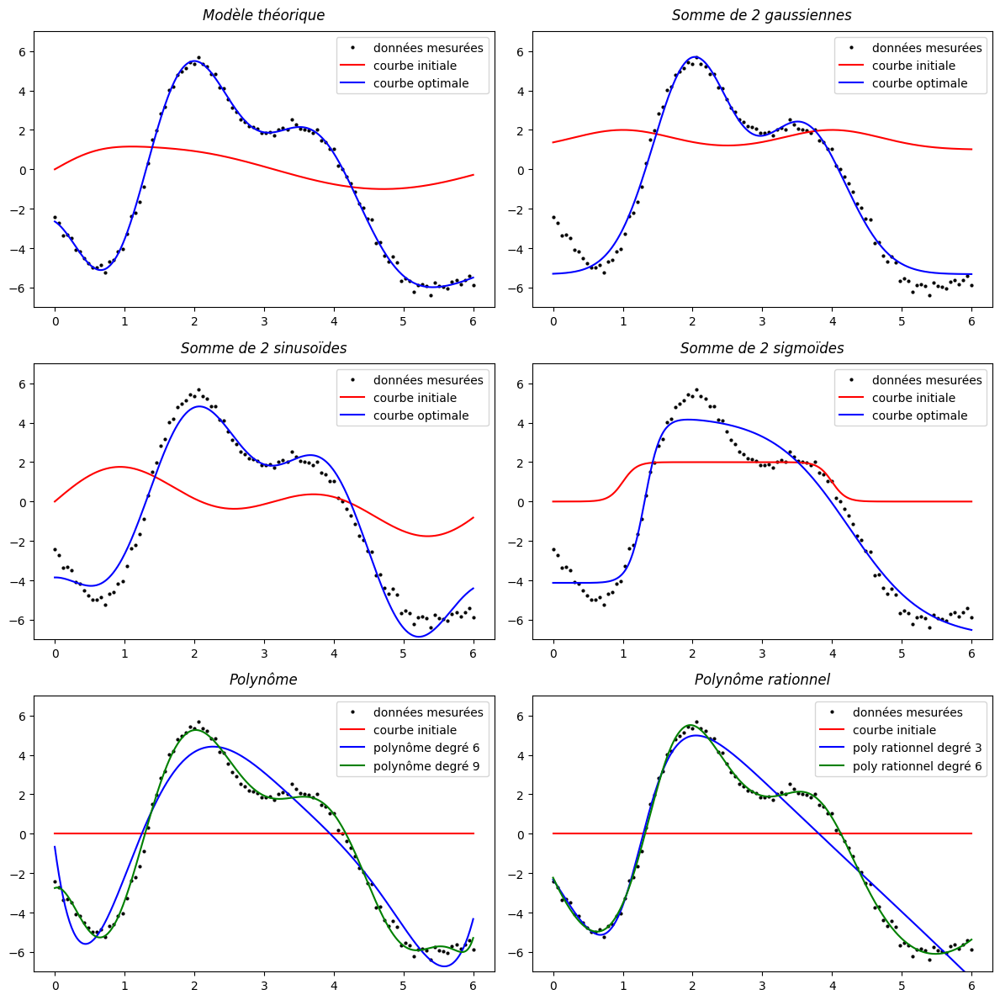

In [35]:
mp.figure(figsize=(12,12), dpi=100)
mp.subplot(3,2,1); mp.plot(x, y, 'k.', ms=4, label='données mesurées'); mp.ylim(-7,7)
mp.plot(xx, yyt0, 'r-', label='courbe initiale'); mp.plot(xx, yyt1, 'b-', label='courbe optimale')
mp.title('Modèle théorique', style='italic', pad=10); mp.legend()
mp.subplot(3,2,2); mp.plot(x, y, 'k.', ms=4, label='données mesurées'); mp.ylim(-7,7)
mp.plot(xx, yyg0, 'r-', label='courbe initiale'); mp.plot(xx, yyg1, 'b-', label='courbe optimale')
mp.title('Somme de 2 gaussiennes', style='italic', pad=10); mp.legend()
mp.subplot(3,2,3); mp.plot(x, y, 'k.', ms=4, label='données mesurées'); mp.ylim(-7,7)
mp.plot(xx, yys0, 'r-', label='courbe initiale'); mp.plot(xx, yys1, 'b-', label='courbe optimale')
mp.title('Somme de 2 sinusoïdes', style='italic', pad=10); mp.legend()
mp.subplot(3,2,4); mp.plot(x, y, 'k.', ms=4, label='données mesurées'); mp.ylim(-7,7)
mp.plot(xx, yym0, 'r-', label='courbe initiale'); mp.plot(xx, yym1, 'b-', label='courbe optimale')
mp.title('Somme de 2 sigmoïdes', style='italic', pad=10); mp.legend()
mp.subplot(3,2,5); mp.plot(x, y, 'k.', ms=4, label='données mesurées'); mp.ylim(-7,7)
mp.plot(xx, yyp0, 'r-', label='courbe initiale'); mp.plot(xx, yyp1, 'b-', label='polynôme degré 6')
mp.plot(xx, yyp2, 'g-', label='polynôme degré 9') # rajout d'une courbe supplémentaire
mp.title('Polynôme', style='italic', pad=10); mp.legend()
mp.subplot(3,2,6); mp.plot(x, y, 'k.', ms=4, label='données mesurées'); mp.ylim(-7,7)
mp.plot(xx, yyp0, 'r-', label='courbe initiale'); mp.plot(xx, yyr1, 'b-', label='poly rationnel degré 3')
mp.plot(xx, yyr2, 'g-', label='poly rationnel degré 6') # rajout d'une courbe supplémentaire
mp.title('Polynôme rationnel', style='italic', pad=10); mp.legend(); mp.tight_layout()

La figure ci-dessus montre le résultat graphique obtenu pour chacune des six familles de fonctions. Pour chaque figure, la courbe en rouge correspond à la fonction initiale, avec les paramètres de départ choisis pour $a,b,c,d,e,f,g,h$ et stockés dans **`p0`**, tandis que la courbe en bleu correspond à la fonction finale, avec les valeurs optimales trouvées par l'algorithme pour les 7 paramètres. On peut constater que même avec des courbes de départ très éloignées des échantillons, le processus d'ajustement converge toujours vers une courbe optimale assez proche des données.

Sans surprise, le fit avec le modèle théorique est celui qui donne la courbe la plus proche des échantillons mesurés, mais les autres familles de fonctions donnent des résultats très acceptables, sachant qu'on impose ici uniquement 7 degrés de liberté. Pour les figures de la dernière ligne (polynôme et polynôme rationnel), on a rajouté une courbe verte correspondant à une version avec 10 degrés de liberté au lieu de 7 : le fit de fonctions polynomiales ou rationnelles étant particulièrement efficace, il est souvent possible de traiter beaucoup plus de degrés de liberté avec le même temps de calcul que pour les autres familles de fonctions. Et comme on peut le constater, le résultat obtenu avec un polynôme rationnel de degré 6 est quasiment équivalent au fit du modèle théorique, mais avec une fonction finale qui sera beaucoup moins coûteuse à évaluer.

---
### 3 - Module 'scipy.differentiate'

Le module [**scipy.differentiate**](https://docs.scipy.org/doc/scipy/tutorial/integrate.html) est de loin le module le plus compact du package **scipy** puisqu'il ne contient que trois fonctions, destinées à effectuer des différentiations numériques en utilisant des [**méthodes de différences finies**](https://fr.wikipedia.org/wiki/Diff%C3%A9rence_finie). Autrement dit, il permet d'obtenir une estimation numérique des dérivées, gradients, jacobiennes et hessiennes d'une fonction fournie par l'utilisateur, même lorsque les expressions analytiques de ces dérivée ne peuvent pas être déterminées. Les trois fonctions fournies par le module sont les suivantes :

- **`derivative`** : évaluation numérique de la dérivée d'une fonction monovariée en un point donné
- **`jacobian`** : calcul du vecteur gradient ou de la matrice jacobienne pour une fonction multivariée
- **`hessian`** : calcul de la matrice hessienne pour une fonction multivariée

In [36]:
import scipy.differentiate as df
#inspect(df, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

---
#### a - Dérivée d'une fonction scalaire monovariée

La fonction **`derivative`** fournit une estimation numérique de la dérivée première d'une fonction scalaire monovariée $f(x)$ de $ℝ$ dans $ℝ$, pour une valeur donnée de $x$. Pour vérifier la précision numérique, on va utiliser l'exponentielle comme fonction de test $f(x) = \mathbf{e}^x$, ce qui permettra de comparer facilement l'estimation numérique par la méthode des différences finies avec la vraie valeur de la dérivée, puisque pour une exponentielle $f'(x) = f(x)$ :

In [37]:
f = np.exp # définition de la fonction monovariée à dériver
samples = [-100, -10, -1, 0, 1, 10, 100] # choix des échantillons pour l'évaluation

for x in samples:
  theo = f(x); calc = df.derivative(f, x).df # valeur théorique et valeur calculée pour la dérivée
  print(f"● Calcul de la dérivée en x = {x}")
  print(f"  Valeur théorique = {theo}")
  print(f"  Valeur calculée  = {calc} \tErreur relative  = {rms_rel(calc, theo):.1e}")

● Calcul de la dérivée en x = -100
  Valeur théorique = 3.720075976020836e-44
  Valeur calculée  = 3.720075976020806e-44 	Erreur relative  = 8.2e-15
● Calcul de la dérivée en x = -10
  Valeur théorique = 4.5399929762484854e-05
  Valeur calculée  = 4.539992976248424e-05 	Erreur relative  = 1.4e-14
● Calcul de la dérivée en x = -1
  Valeur théorique = 0.36787944117144233
  Valeur calculée  = 0.36787944117143745 	Erreur relative  = 1.3e-14
● Calcul de la dérivée en x = 0
  Valeur théorique = 1.0
  Valeur calculée  = 0.9999999999999893 	Erreur relative  = 1.1e-14
● Calcul de la dérivée en x = 1
  Valeur théorique = 2.718281828459045
  Valeur calculée  = 2.7182818284590198 	Erreur relative  = 9.3e-15
● Calcul de la dérivée en x = 10
  Valeur théorique = 22026.465794806718
  Valeur calculée  = 22026.465794806485 	Erreur relative  = 1.1e-14
● Calcul de la dérivée en x = 100
  Valeur théorique = 2.6881171418161356e+43
  Valeur calculée  = 2.6881171418161173e+43 	Erreur relative  = 6.8e-15


---
#### b - Gradient d'une fonction scalaire multivariée

Dans le cas d'une fonction scalaire multivariée $f(x_1,...,x_n)$ de $ℝ^n$ dans $ℝ$, la fonction `jacobian` permet de calculer le vecteur gradient des différentes dérivées partielles, pour une valeur donnée du vecteur $[x_1,...,x_n]$. Comme précédemment, on va se baser sur la fonction exponentielle pour faire les tests de précision $f(x,y,z) = e^{x+2y+3z}$, afin de pouvoir facilement obtenir la valeur théorique du gradient : 

In [38]:
f = lambda x: np.exp(x[0] + 2*x[1] + 3*x[2]) # définition de la fonction multivariée à dériver
samples = [(-30,-20,-10), (-3,-2,-1), (0,0,0), (3,2,1), (30,20,10)] # échantillons pour l'évaluation

for x in samples:
  a = f(x); theo = np.array([a, 2*a, 3*a]); calc = df.jacobian(f, x).df
  print(f"● Calcul du gradient en x = {x}")
  print(f"  Valeur théorique = {theo}")
  print(f"  Valeur calculée  = {calc}")
  print(f"  Erreur relative  = {rms_rel(calc, theo):.1e}")

● Calcul du gradient en x = (-30, -20, -10)
  Valeur théorique = [3.7200759760208361e-44 7.4401519520416722e-44 1.1160227928062509e-43]
  Valeur calculée  = [3.7200759760208048e-44 7.4401519520220344e-44 1.1160227928059578e-43]
  Erreur relative  = 1.5e-12
● Calcul du gradient en x = (-3, -2, -1)
  Valeur théorique = [4.5399929762484854e-05 9.0799859524969708e-05 1.3619978928745456e-04]
  Valeur calculée  = [4.5399929762484170e-05 9.0799859524730330e-05 1.3619978928741837e-04]
  Erreur relative  = 1.5e-12
● Calcul du gradient en x = (0, 0, 0)
  Valeur théorique = [1. 2. 3.]
  Valeur calculée  = [0.9999999999999898 1.999999999994727  2.9999999999992086]
  Erreur relative  = 1.5e-12
● Calcul du gradient en x = (3, 2, 1)
  Valeur théorique = [22026.465794806718 44052.931589613436 66079.39738442015 ]
  Valeur calculée  = [22026.465794806456 44052.93158949733  66079.39738440284 ]
  Erreur relative  = 1.5e-12
● Calcul du gradient en x = (30, 20, 10)
  Valeur théorique = [2.6881171418161356e+

---
#### c - Jacobienne d'une fonction vectorielle multivariée

Dans le cas d'une fonction vectorielle multivariée $f(x_1,...,x_n)$ de $ℝ^n$ dans $ℝ^m$, la fonction `jacobian` permet de calculer la matrice jacobienne des différentes dérivées partielles, pour une valeur donnée du vecteur $[x_1,...,x_n]$. Pour les tests, il suffit de rajouter une dimension supplémentaire à notre fonction trivariée précédente : $f(x,y,z) = [\mathbf{e}^{x+2y+3z},\mathbf{e}^{-3x-2y-z}]$ :

In [39]:
f = lambda x: np.exp([x[0]+2*x[1]+3*x[2],-3*x[0]-2*x[1]-x[2]]) # fonction vectorielle multivariée à dériver
samples = [(-4,-3,-2), (-1,0,1), (2,3,4)] # échantillons pour l'évaluation

for x in samples:
  a, b = f(x); theo = np.array([[a, 2*a, 3*a],[-3*b, -2*b, -b]]); calc = df.jacobian(f, x).df
  print(f"● Calcul de la jacobienne en x = {x}")
  print(f"  Valeur théorique =\n{theo}")
  print(f"  Valeur calculée =\n{calc}")
  print(f"  Erreur relative = {rms_rel(calc, theo):.1e}")

● Calcul de la jacobienne en x = (-4, -3, -2)
  Valeur théorique =
[[ 1.1253517471925912e-07  2.2507034943851823e-07  3.3760552415777734e-07]
 [-1.4554955862293708e+09 -9.7033039081958055e+08 -4.8516519540979028e+08]]
  Valeur calculée =
[[ 1.1253517471925763e-07  2.2507034943792452e-07  3.3760552415768739e-07]
 [-1.4554955862289898e+09 -9.7033039081702423e+08 -4.8516519540978628e+08]]
  Erreur relative = 2.2e-12
● Calcul de la jacobienne en x = (-1, 0, 1)
  Valeur théorique =
[[  7.38905609893065  14.7781121978613   22.16716829679195]
 [-22.16716829679195 -14.7781121978613   -7.38905609893065]]
  Valeur calculée =
[[  7.389056098930578  14.778112197822312  22.167168296786095]
 [-22.16716829678607  -14.77811219782231   -7.389056098930588]]
  Erreur relative = 1.5e-12
● Calcul de la jacobienne en x = (2, 3, 4)
  Valeur théorique =
[[ 4.8516519540979028e+08  9.7033039081958055e+08  1.4554955862293708e+09]
 [-3.3760552415777734e-07 -2.2507034943851823e-07 -1.1253517471925912e-07]]
  Valeu

---
#### d- Hessienne d'une fonction scalaire multivariée

Dans le cas d'une fonction scalaire multivariée $f(x_1,...,x_n)$ de $ℝ^n$ dans $ℝ$, la fonction `hessian` permet de calculer la matrice hessienne des différentes dérivées secondes, pour une valeur donnée du vecteur $[x_1,...,x_n]$ :

In [40]:
f = lambda x: np.exp(x[0] + 2*x[1] + 3*x[2]) # définition de la fonction multivariée à dériver
samples = [(-4,-3,-2), (-1,0,1), (2,3,4)] # échantillons pour l'évaluation

for x in samples:
  a = f(x); theo = a*np.array([[1,2,3],[2,4,6],[3,6,9]]); calc = df.hessian(f, x).ddf
  print(f"● Calcul de la matrice hessienne en x = {x}")
  print(f"  Valeur théorique =\n{theo}")
  print(f"  Valeur calculée  =\n{calc}")
  print(f"  Erreur relative  = {rms_rel(calc, theo):.1e}")

● Calcul de la matrice hessienne en x = (-4, -3, -2)
  Valeur théorique =
[[1.1253517471925912e-07 2.2507034943851823e-07 3.3760552415777734e-07]
 [2.2507034943851823e-07 4.5014069887703647e-07 6.7521104831555467e-07]
 [3.3760552415777734e-07 6.7521104831555467e-07 1.0128165724733320e-06]]
  Valeur calculée  =
[[1.1253517471925151e-07 2.2507034943792409e-07 3.3760552415768602e-07]
 [2.2507034943850301e-07 4.5014069887584818e-07 6.7521104831537203e-07]
 [3.3760552415768697e-07 6.7521104831357018e-07 1.0128165724728068e-06]]
  Erreur relative  = 1.8e-12
● Calcul de la matrice hessienne en x = (-1, 0, 1)
  Valeur théorique =
[[ 7.38905609893065 14.7781121978613  22.16716829679195]
 [14.7781121978613  29.5562243957226  44.3343365935839 ]
 [22.16716829679195 44.3343365935839  66.50150489037586]]
  Valeur calculée  =
[[ 7.389056098931016 14.778112197821592 22.167168296788056]
 [14.778112197862033 29.556224395643184 44.33433659357611 ]
 [22.167168296786667 44.334336593456015 66.50150489034036

---
### 4 - Module 'scipy.integrate'

Le module [**scipy.integrate**](https://docs.scipy.org/doc/scipy/tutorial/integrate.html) regroupe deux types d'outils assez différents : d'une part, des méthodes de calcul d'intégrales simples ou multiples pour des fonctions scalaires ou vectorielles, et d'autre part, des méthodes de résolution pour une équation différentielle ordinaire ou pour un système d'équations différentielles ordinaires.

Les fonctions les plus intéressantes du module pour une utilisation en Sciences des Données sont les suivantes :

- **`quad`** : calcul d'une intégrale simple d'une fonction scalaire monovariée sur un intervalle borné
- **`quad_vec`** : calcul d'une intégrale simple d'une fonction vectorielle monovariée sur un intervalle borné
- **`cubature`** : calcul d'une intégrale multiple d'une fonction (scalaire ou vectorielle) multivariée sur un domaine borné
- **`solve_ivp`** et **`solve_bvp`**: résolution d'une équation (ou d'un système d'équations) différentielle ordinaire :
    - la première s'emploie lorsqu'on connait les conditions initiales du problème (**ivp** = ***initial value problem***)
    - la seconde s'emploie lorsqu'on connait les conditions aux limites du domaine (**bvp** = ***boundary value problem***)

>**Note :** Avant l'ajout de la fonction **`cubature`** en 2023, les anciennes versions du module **scipy.integrate** utilisaient les fonctions **`dblquad`**, **`tplquad`** et **`nquad`** pour les intégrales doubles, triples et multiples. Ces fonctions sont désormais ***considérées comme obsolètes*** car beaucoup moins performantes que **`cubature`**, donc elles ne sont plus censées être utilisées dans les nouvelles applications

In [41]:
import scipy.integrate as itg
#inspect(itg, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

---
#### a - Intégrales simples et multiples

La fonction **`quad`** permet de calculer l'intégrale d'une fonction scalaire monovariée sur un intervalle donné. Elle prend en paramètre la fonction $f(x)$ à intégrer, ainsi que les bornes $x_{min}$ et $x_{max}$ de l'intervalle d'intégration. Pour évaluer la précision de l'algorithme de quadrature, on va calculer l'intégrale sur l'intervalle $[-1,1]$ de la fonction $f(x) = \sqrt{1-x^2}$, qui représente l'aire d'un demi-disque de rayon 1, donc on sait que :

$$I = \int_{-1}^1 \sqrt{1-x^2}\,dx = \frac{\pi}{2}$$

In [42]:
f = lambda x: (1-x*x) ** 0.5 # définition de la fonction à intégrer

theo = np.pi/2; calc, _ = itg.quad(f, -1, 1) # calcul de l'intégrale sur [-1,1]
print(f"● Calcul de l'intégrale de f(x) = (1-x*x)**0.5 sur l'intervalle [-1,1]")
print(f"  Valeur théorique = {theo} (= π/2)")
print(f"  Valeur calculée  = {calc}")
print(f"  Erreur absolue   = {rms_abs(calc, theo):.1e}")
print(f"  Erreur relative  = {rms_rel(calc, theo):.1e}")

● Calcul de l'intégrale de f(x) = (1-x*x)**0.5 sur l'intervalle [-1,1]
  Valeur théorique = 1.5707963267948966 (= π/2)
  Valeur calculée  = 1.5707963267948983
  Erreur absolue   = 1.8e-15
  Erreur relative  = 1.1e-15


La fonction **`cubature`** permet de calculer l'intégrale multiple d'une fonction scalaire multivariée sur un domaine donné. Elle prend en paramètre la fonction $f(x)$ à intégrer où $x = [x_1,...,x_n]$ ainsi que les bornes $x_{min} = [x_{1min},...,x_{nmin}]$ et $x_{max} = [x_{1max},...,x_{nmax}]$ définissant le domaine d'intégration. Pour montrer la mise en oeuvre et vérifier la précision de la fonction **`cubature`**, on va  calculer une intégrale double et une intégrale triple dont on connait les valeurs théoriques :

- Aire d'un cercle de rayon 1 :
$$ A = \int_0^1 \int_0^{2\pi} r\,dr\,d\theta = \pi$$
- Volume d'une sphère de rayon 1 :
$$ V = \int_0^1 \int_0^{2\pi} \int_0^\pi r^2\,\sin\varphi\, dr\,d\theta\,d\varphi = \frac{4}{3}\pi$$

In [43]:
# création de la fonction disk(x) dont l'intégrale permet de calculer l'aire d'un disque de rayon 1
# le paramètre x est un vecteur regroupant les 2 coordonnées polaires (r,θ)
disk = lambda x: x[:,0] # x[:,0] = r et x[:,1] = θ

theo = np.pi; calc = itg.cubature(disk, [0, 0], [1, 2*np.pi]).estimate
print(f"● Calcul de l'aire du disque de rayon 1 : dA = r dr dθ")
print(f"  Valeur théorique = {theo} (= π)")
print(f"  Valeur calculée  = {calc}")
print(f"  Erreur absolue   = {rms_abs(calc, theo):.1e}")
print(f"  Erreur relative  = {rms_rel(calc, theo):.1e}")

# création de la fonction sphere(x) dont l'intégrale permet de calculer le volume d'une sphère de rayon 1
# le paramètre x est un vecteur regroupant les 3 coordonnées sphériques (r,θ,φ)
sphere = lambda x: x[:,0]**2 * np.sin(x[:,2]) # x[:,0] = r, x[:,1] = θ et x[:,2] = φ

theo = 4*np.pi/3; calc = itg.cubature(sphere, [0, 0, 0], [1, 2*np.pi, np.pi]).estimate
print(f"● Calcul du volume de la sphère de rayon 1 : dV = r^2 sinφ dr dθ dφ")
print(f"  Valeur théorique = {theo} (= 4π/3)")
print(f"  Valeur calculée  = {calc}")
print(f"  Erreur absolue   = {rms_abs(calc, theo):.1e}")
print(f"  Erreur relative  = {rms_rel(calc, theo):.1e}")

● Calcul de l'aire du disque de rayon 1 : dA = r dr dθ
  Valeur théorique = 3.141592653589793 (= π)
  Valeur calculée  = 3.141592653589793
  Erreur absolue   = 0.0e+00
  Erreur relative  = 0.0e+00
● Calcul du volume de la sphère de rayon 1 : dV = r^2 sinφ dr dθ dφ
  Valeur théorique = 4.1887902047863905 (= 4π/3)
  Valeur calculée  = 4.1887902047863905
  Erreur absolue   = 0.0e+00
  Erreur relative  = 0.0e+00


---
#### b -  Résolution d'équations différentielles ordinaires

Le module **`scipy.integrate`** inclut deux fonctions principales destinées à la résolution d'une équation différentielle ordinaire ou d'un système de plusieurs équations différentielles ordinaires (dans la classification des équations différentielles, ***ordinaire*** signifie monovariée). Le système à résoudre doit être réécrit dans sa ***forme canonique*** :

$$ \dot{y}(t) = \frac{dy(t)}{dt} = f(t,\,y(t))\qquad {\sf avec}\qquad t\in ℝ \:,\: y:ℝ ⟶ ℝ^n \:,\: f: ℝ^{n+1} ⟶ ℝ^n$$

> **Note :** Historiquement, les équations différentielles ont d'abord été utilisées en physique pour l'étude des mouvements des solides, problèmes dans lesquels la variable d'intégration est naturellement le **temps**. C'est la raison pour laquelle on continue de noter $t$ la variable scalaire de ce type d'équations

On rappelle que la solution d'une équation différentielle possède toujours au moins un degré de liberté sous la forme d'une constante additive ou multiplicative, donc si on souhaite une solution unique, il faut rajouter au moins une contrainte extérieure pour chaque équation du système. Il existe globalement deux manières de fournir ces contraintes extérieures :

- soit on donne les **conditions initiales** (c'est-à-dire les valeurs $y_0 = y(t_0)$ pour la borne inférieure $t_0$ de l'intervalle d'intégration), on parle alors d'un [**problème de Cauchy**](https://fr.wikipedia.org/wiki/Probl%C3%A8me_de_Cauchy). La fonction **`solve_ivp`** permet de résoudre ce type de système (**IVP** = ***initial value problem***)

- soit on donne les **conditions aux limites** (c'est-à-dire deux équations $c_0(y_0) = 0$ et $c_1(y_1) = 0$ que doit respecter la fonction $y(t)$ sur les deux bornes de l'intervalle d'intégration), on parle alors d'un [**problème de Dirichlet**](https://fr.wikipedia.org/wiki/Probl%C3%A8me_de_Dirichlet). La fonction **`solve_bvp`** permet de résoudre ce type de système (**BVP** = ***boundary value problem***)

Pour illustrer l'utilisation de la fonction **`solve_ivp`**, on va reproduire la [**célèbre expérience**](https://en.wikipedia.org/wiki/Galileo's_Leaning_Tower_of_Pisa_experiment) sur la chute des corps, menée par Galilée en haut de la tour de Pise vers 1590. L'objectif de Galilée était de prouver que la vitesse de chute d'un corps est indépendante de sa masse, contrairement au principe d'Aristote qui prétendait le contraire. En fait, grâce à ses expériences antérieures sur le mouvement, Galilée savait que la vitesse de chute est indépendante de la masse, uniquement dans le cas où on peut négliger la force de traînée de l'air (friction des molécules d'air sur la surface de l'objet), il a donc pris soin de prendre des objets suffisamment lourds pour que la résistance de l'air ne ralentisse pas leur chute de manière perceptible

Dans notre simulation, on va prendre 3 billes en fer et 3 billes en mousse dont les masses sont respectivement de 1 gramme, 1 kilogramme et 1 tonne. Le fer possède une bien meilleure pénétration dans l'air que la mousse, ce qui se caractérise par un coefficient de traînée aérodynamique beaucoup plus petit. Avec ces données, la simulation consiste à résoudre un système de deux équations différentielles mettant en oeuvre l'altitude $z(t)$ et la vitesse verticale $v(t)$ qui dépendent du temps $t$ ainsi que des différentes caractéristiques mécaniques du système étudié : $g$ l'accélération liée à la pesanteur terrestre, $m$ la masse de l'objet, et $f$ le coefficient de trainée aérodynamique de l'air sur la surface de l'objet

$$ \frac{dz(t)}{dt} = v(t) \qquad\text{et}\qquad \frac{dv(t)}{dt} = -g + \frac{f}{m} v^2(t) $$

Pour résoudre le système avec **`solve_ivp`**, il faut impérativement le reformuler sous la forme canonique vectorielle, afin de pouvoir représenter le système par une seule équation différentielle. Pour cela, on introduit une fonction vectorielle $y(t)$ qui va regrouper l'altitude $z(t)$ et la vitesse $v(t)$ :

$$y(t) = \bigl[\,y_0(t)\:,\:y_1(t)\,\bigr] = \bigl[\,z(t)\:,\:v(t)\,\bigr]$$

et qui permet d'obtenir la forme canonique :

$$ \dot{y}(t) = \frac{dy(t)}{dt} = \left[y_1(t)\:,\:-g + \frac{f}{m} y_1^2(t)\right] \qquad\text{avec}\qquad y(0) = [\,z_0\:,\: 0\,]\:\: \text{et}\:\: z_0 \text{ = altitude initiale}$$

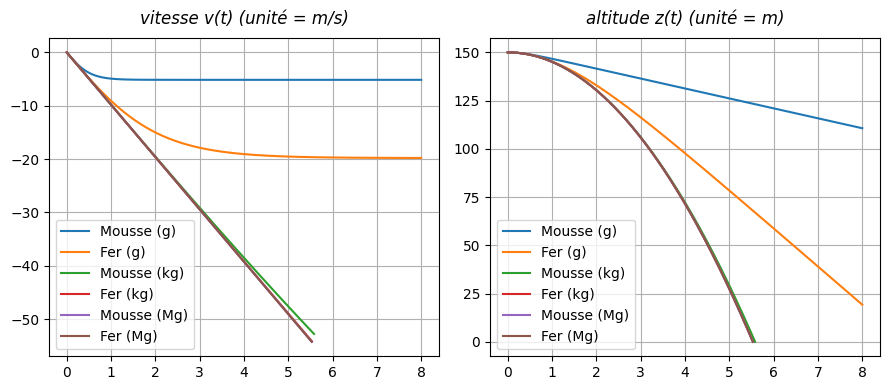

In [44]:
g = 9.81 # coefficient de gravité (= accélération liée à la pesanteur terrestre)
low, mid, high = 1E-3, 1, 1E3 # masse des billes : légère (1 gramme), moyenne (1 kilo) et lourde (1 tonne)
iron, foam = 2.5E-5, 3.7E-4 # coefficients de friction dans l'air pour la bille de fer et la bille de mousse
stop = lambda t,y: y[0]; stop.terminal = True # la simulation s'arrête lorsque l'altitude tombe à 0
time, init = [0, 8], [150, 0] # bornes temporelles pour la simulation, altitude et vitesse initiales

# équation différentielle de la chute libre d'un solide dans l'air
# g = gravité, m = masse, f = friction, t = temps, y[0] = altitude z(t), y[1] = vitesse v(t)
ode = lambda m,f: lambda t,y: [y[1], -g + f/m * y[1]**2]

ironL = itg.solve_ivp(ode(low, iron), time, init, events=stop, max_step=0.01) # fer (1g)
foamL = itg.solve_ivp(ode(low, foam), time, init, events=stop, max_step=0.01) # mousse (1g)
ironM = itg.solve_ivp(ode(mid, iron), time, init, events=stop, max_step=0.01) # fer (1kg)
foamM = itg.solve_ivp(ode(mid, foam), time, init, events=stop, max_step=0.01) # mousse (1kg)
ironH = itg.solve_ivp(ode(high,iron), time, init, events=stop, max_step=0.01) # fer (1Mg)
foamH = itg.solve_ivp(ode(high,foam), time, init, events=stop, max_step=0.01) # mousse (1Mg)

mp.figure(figsize=(9,4))
mp.subplot(1, 2, 1); mp.yticks(range(0,-70,-10)) # vitesse v(t)
mp.plot(foamL.t,foamL.y[1], label='Mousse (g)');  mp.plot(ironL.t,ironL.y[1], label='Fer (g)')
mp.plot(foamM.t,foamM.y[1], label='Mousse (kg)'); mp.plot(ironM.t,ironM.y[1], label='Fer (kg)')
mp.plot(foamH.t,foamH.y[1], label='Mousse (Mg)'); mp.plot(ironH.t,ironH.y[1], label='Fer (Mg)')
mp.title('vitesse v(t) (unité = m/s)', style='italic', pad=10); mp.legend(); mp.grid()
mp.subplot(1, 2, 2); mp.yticks(range(150,-25,-25)) # altitude z(t)
mp.plot(foamL.t,foamL.y[0], label='Mousse (g)');  mp.plot(ironL.t,ironL.y[0], label='Fer (g)')
mp.plot(foamM.t,foamM.y[0], label='Mousse (kg)'); mp.plot(ironM.t,ironM.y[0], label='Fer (kg)')
mp.plot(foamH.t,foamH.y[0], label='Mousse (Mg)'); mp.plot(ironH.t,ironH.y[0], label='Fer (Mg)')
mp.title('altitude z(t) (unité = m)', style='italic', pad=10); mp.legend(); mp.grid(); mp.tight_layout()

On constate que pour les objets lourds, la vitesse croît linéairement sous l'influence de l'accélération constante procurée par la force de pesanteur (figure de gauche). Dans ces conditions, la fonction décrivant la variation de l'altitude est bien une parabole, comme le prédit la loi de Newton (figure de droite). Pour la bille en mousse de 1kg (tracé en vert), on peut voir, à gauche, un léger ralentissement de l'accélération sur la fin de course, mais cela reste quasiment imperceptible (à droite) sur l'évolution de l'altitude, à l'échelle utilisée pour le tracé : globalement toutes les billes lourdes mettent environ 5.5 secondes pour parcourir les 150m jusqu'au sol. Ce qui était bien le résultat que voulait démontrer Galilée (ici on a simplement exagéré la hauteur de la tour, puisque la plateforme de la tour de Pise se trouve à 50m d'altitude et non à 150m).

Par contre, pour les 2 billes de 1g, la friction de l'air n'est plus du tout négligeable. Cette résistance de l'air va engendrer un plafonnement de la vitesse : 20m/s pour la bille de fer (tracé en orange) et 5m/s pour la bille de mousse (tracé en bleu). Lorsque cette vitesse-plafond est atteinte, cela entraîne une variation linéaire de l'altitude et non plus quadratique. Par conséquent, au bout des 8 secondes correspondant à la durée de la simulation, la bille de fer pesant 1g se trouve encore à 20m d'altitude, et la bille de mousse de 1g à plus de 110m d'altitude.

---
Pour illustrer le fonctionnement de la fonction **`solve_bvp`**, on va prendre l'exemple d'un ***problème classique issu de la balistique***, un domaine de la physique dont l'objet est l'étude du mouvement des corps lancés ou propulsés dans l'espace : on suppose qu'on dispose d'un système de lancement d'un projectile (bras ou pied humain, club de golf, arc, pistolet, canon...) capable de fournir une vitesse initiale de $v_0$ à ce projectile, et on souhaite déterminer l'angle de tir $\theta_0$ pour que le projectile retombe au sol à une distance $d$ prédéfinie. Contrairement à l'exemple précédent, on va négliger l'effet de la résistance de l'air (ce qui est valide lorsque les projectiles sont suffisamment lourds, comme on l'a vu ci-dessus). Néanmoins pour complexifier la situation, on suppose que le tir se produit dans une atmosphère soumise à un vent horizontal qui va augmenter ou ralentir la vitesse du projectile, selon que le vent souffle dans le sens du tir ou non. Cela peut se modéliser par une simple constante $w_0$ (positive ou négative) qui s'ajoute à la vitesse horizontale du projectile durant tout son mouvement.

La trajectoire du projectile est caractérisée par deux fonctions scalaires : l'altitude $z(t)$ et la distance horizontale $x(t)$ mesurée depuis le point de départ. L'altitude $z(t)$ ne dépend que de la force de pesanteur qui impose au projectile une accélération verticale égale à -$g$. La distance horizontale $x(t)$ ne dépend que de la vitesse initiale $v_0$, de l'angle de tir $\theta_0$ et de la force du vent $w_0$, ce qui peut s'écrire sous forme différentielle :

$$ \frac{d^2z(t)}{dt^2} = -g \qquad{\sf et}\qquad \frac{dx(t)}{dt} = v_0 \cos \theta_0 + w_0 $$

Mais comme les conditions aux limites de la solution recherchée sont données en fonction de $x$ (le projectile va de $x_0 = 0$ à $x_1 = d$) et qu'elles s'appliquent à l'altitude $z$ (le projectile part de l'altitude $z_0 = 0$ et retombe à l'altitude $z_1 = 0$), il faut impérativement effectuer un changement de variable pour exprimer la trajectoire en fonction de $x$ et non en fonction de $t$. Cela s'effectue très simplement avec une chaîne de dérivation :

$$ \frac{dz}{dx} = \tan\theta(x) = p(x) \qquad{et}\qquad \frac{d^2z}{dx^2} = \frac{d^2z}{dt^2} \times \frac{dt^2}{dx^2} = -g \times \left(\frac{1}{v_0 \cos \theta_0 + w_0}\right)^2 = \frac{-g}{(v_0 \cos \theta_0 + w_0)^2} $$

Comme c'est la pente de la trajectoire $p(x) = \tan\theta(x)$ qui apparait dans la forme différentielle précédente, il est judicieux d'utiliser directement $p(x)$ au lieu de $\theta(x)$ pour déterminer l'angle de tir, car cela va permettre d'augmenter la stabilité numérique, en évitant des appels répétés à $\arctan(p(x))$. Enfin, la dernière étape de réécriture, comme c'était déjà le cas avec **`solve_ivp`**, va consister à reformuler le système sous forme canonique en introduisant une fonction vectorielle $y(x)$ qui regroupe l'altitude $z(x)$ et la pente de la trajectoire $p(x)$ :

$$ y(x) = \bigl[\,y_0(x)\:,\:y_1(x)\,\bigr] = \bigl[\,z(x)\:,\:p(x)\,\bigr] $$

et qui permet de réduire le système à une seule équation différentielle :

$$ \dot{y}(x) = \frac{dy(x)}{dx} = \left[y_1(x)\:,\:-\frac{g}{(v_0 \cos \theta_0 + w_0)^2}\right] \qquad\text{avec}\qquad y(0) = [\,0\:,\:p_0\,]\:\: \text{et}\:\: y(d) = [\,0\:,\:•\,]$$

Le symbole $•$ qui figure dans la contrainte $y(d)$ signifie qu'on ne donne pas de contrainte à l'angle d'arrivée, car celui-ci sera naturellement obtenu par les équations du mouvement. Il faut d'ailleurs noter que si on impose une contrainte incompatible avec le mouvement du projectile, le solveur ne va pas trouver de solution. Dans l'utilisation de **`solve_bvp`**, les conditions aux limites doivent toujours être données sous la forme d'une ***fonction vectorielle qui renvoie un vecteur nul lorsque toutes les contraintes sont vérifiées*** (le vecteur retourné possède une composante par contrainte). Cette fonction est traditionnellement appelée **`bounds`** ou **`bc`** (pour ***boundary conditions***). Dans notre cas, elle s'écrit :

```
bounds = lambda ya, yb, p: (ya[0], yb[0], ya[1] - p[0])
```
où les paramètres **`ya, yb, p`** représentent respectivement le vecteur $y(0)$, le vecteur $y(d)$ et le paramètre correspondant au degré de liberté permettant de résoudre les contraintes (dans notre cas, il s'agit de la pente $p_0$ qu'on cherche à calculer). Le vecteur renvoyé par la fonction correspond aux trois contraintes du problème : **`ya[0]`** signifie que l'altitude initiale doit être nulle, **`yb[0]`** que l'altitude finale doit être nulle et **`ya[1] - p[0]`** que la pente initiale de la trajectoire doit être égale à $p_0$. Avec tout ce travail préparatoire, le code s'obtient assez facilement :

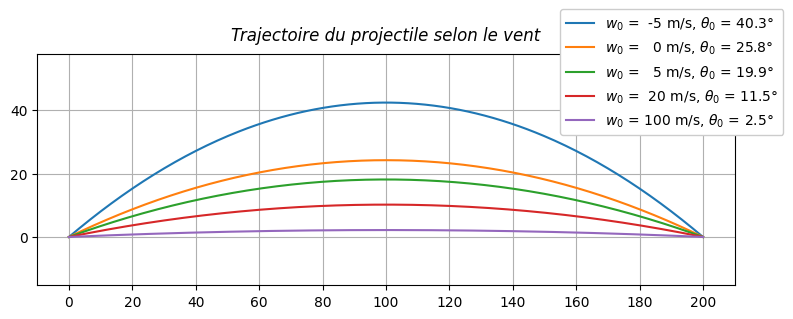

In [45]:
g, v0, d = 9.81, 50, 200 # définition de la gravité, de la vitesse initiale et de la distance à parcourir
x = [0, d]; y = [(0, 0), (0, 0)]; p0 = [1] # paramètres de la trajectoire du projectile
bounds = lambda ya, yb, p: [ya[0], yb[0], ya[1]-p[0]] # conditions aux limites

mp.figure(figsize=(9,3)); title = 'Trajectoire du projectile selon le vent'
mp.axis('equal'); mp.yticks(range(0,50,20)); mp.xticks(range(0,220,20))
for wind in [-5, 0, 5, 20, 100]: # itération sur les différentes vitesses du vent
  # x**0 génère un vecteur composé uniquement de 1, de même taille que x (alternative à np.ones_like(x))
  ode = lambda x,y,p: np.vstack((y[1], -g*x**0 / (v0*np.cos(np.atan(p)) + wind)**2))
  bvp = itg.solve_bvp(ode, bounds, x, y, p0) # résolution de l'équation différentielle
  curve, theta = bvp.sol, np.arctan(bvp.p[0])*180/np.pi # extraction de la trajectoire et de l'angle trouvé
  xx = np.linspace(0, d, 300); zz, _ = curve(xx) # échantillonnage haute densité pour les tracés
  mp.plot(xx, zz, label=f"$w_0$ = {wind:3} m/s, $θ_0$ = {theta:.1f}°")
mp.legend(loc=(0.75,0.65), framealpha=1); mp.title(title, style='italic', pad=10); mp.grid()

Le tracé des trajectoires permet d'illustrer un résultat classique en balistique : plus le vent est favorable, plus la trajectoire sera rectiligne et restera à basse altitude, et à l'inverse, plus le vent est défavorable, plus il faudra compenser avec un angle de tir élevé pour chercher une trajectoire parabolique permettant d'atteindre la distance souhaitée.

<h2 style="padding:16px; color:#FFF; background:#06D">B - Modules pour le calcul matriciel</h2>

### 1 - Module 'scipy.linalg'

Le module [**scipy.linalg**](https://docs.scipy.org/doc/scipy/tutorial/linalg.html) regroupe la plupart des outils numériques avancés pour l'algèbre linéaire, ce qui inclut des fonctions pour inverser des matrices, effectuer des décompositions matricielles (LU, QR, LQ, SVD, Cholesky, Schur), calculer des déterminants, des valeurs propres ou des valeurs singulières, résoudre des systèmes linéaires de manière exacte ou des systèmes linéaires sur-contraints au sens des moindres carrés. Il faut noter que le package **numpy** dispose également d'un module **`numpy.linalg`**, mais celui-ci est beaucoup moins complet et comme **scipy** est systématiquement installé dans l'écosystème Scientific Python, il est beaucoup plus intéressant d'utiliser le module de **scipy** et d'oublier la version **numpy**.

In [46]:
import scipy.linalg as la
#inspect(la, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

---
#### a - Opérations de base en algèbre linéaire

Le module **`scipy.linalg`** inclut une série de fonctions proposant les opérations de base de l'algèbre linéaire, comme le calcul du déterminant ou de l'inverse d'une matrice, la recherche des valeurs et vecteurs propres, différents modes de décomposition en produits de matrices, etc. Pour illustrer ces fonctions, on va les appliquer à une série de matrices de test, la famille des ***matrices de Hilbert*** qui est reconnue comme étant particulièrement redoutable pour la stabilité des méthodes numériques. Une matrice de Hilbert $H_n$ est une matrice carrée de taille $n \times n$ définie par :

$$
H_n = \bigl[h_{i,j}\bigr] \qquad{\sf avec}\qquad \forall(i,j) \in \{1..n\}^2,\:\:h_{i,j} = \frac{1}{i+j-1}
$$

C'est une matrice symétrique définie positive dont la matrice inverse est composée uniquement d'entiers calculables de manière théorique, ce qui permet de mesurer précisément les erreurs engendrées par les méthodes numériques (inversion, décomposition, résolution). Et surtout, elle est **très mal conditionnée** numériquement : la [**valeur de conditionnement**](https://fr.wikipedia.org/wiki/Conditionnement_(analyse_num%C3%A9rique)) croît de manière exponentielle avec $n$, ce qui rend toute opération numérique très instable en arithmétique flottante.

In [47]:
for n in range(3, 16, 2): # itération sur l'ordre des matrices de Hilbert H_n
  H = la.hilbert(n) # création de la matrice de Hilbert de taille n x n via la fonction 'hilbert' prédéfinie
  print(f"● Matrice de Hilbert H{n} :\n  Valeur de conditionnement = {np.linalg.cond(H)}")

  inv = la.inv(H) # calcul de la matrice inverse
  inv_ref = la.invhilbert(n) # matrice inverse théorique
  print(f"  Calcul de la matrice inverse : erreur relative = {rms_rel(inv, inv_ref):.1e}")

  det = la.det(H) # calcul du déterminant
  det_ref = 1 / np.linalg.det(inv_ref) # déterminant exact via l'inverse analytique
  print(f"  Calcul du déterminant : erreur relative = {rms_rel(det, det_ref):.1e}")

  E, V = la.eigh(H) # décomposition en valeurs propres (eigenvalues)
  VEV = V @ np.diag(E) @ V.T # reconstruction de la matrice de départ
  print(f"  Décomposition en valeurs propres : erreur relative = {rms_rel(VEV, H):.1e}")

  U, S, V = la.svd(H) # décomposition en valeurs singulières
  USV = U @ np.diag(S) @ V # reconstruction de la matrice de départ
  print(f"  Décomposition en valeurs singulières : erreur relative = {rms_rel(USV, H):.1e}")

  P, L, U = la.lu(H) # décomposition LU
  PLU = P.T @ L @ U # reconstruction de la matrice de départ
  print(f"  Décomposition LU : erreur relative = {rms_rel(PLU, H):.1e}")

  Q, R = la.qr(H) # décomposition QR
  QR = Q @ R # reconstruction de la matrice de départ
  print(f"  Décomposition QR : erreur relative = {rms_rel(QR, H):.1e}")

● Matrice de Hilbert H3 :
  Valeur de conditionnement = 524.0567775860644
  Calcul de la matrice inverse : erreur relative = 4.5e-15
  Calcul du déterminant : erreur relative = 2.0e-15
  Décomposition en valeurs propres : erreur relative = 5.9e-16
  Décomposition en valeurs singulières : erreur relative = 3.7e-16
  Décomposition LU : erreur relative = 0.0e+00
  Décomposition QR : erreur relative = 2.1e-16
● Matrice de Hilbert H5 :
  Valeur de conditionnement = 476607.2502422687
  Calcul de la matrice inverse : erreur relative = 1.1e-11
  Calcul du déterminant : erreur relative = 6.7e-12
  Décomposition en valeurs propres : erreur relative = 2.0e-15
  Décomposition en valeurs singulières : erreur relative = 7.5e-16
  Décomposition LU : erreur relative = 2.1e-17
  Décomposition QR : erreur relative = 3.1e-16
● Matrice de Hilbert H7 :
  Valeur de conditionnement = 475367356.5921816
  Calcul de la matrice inverse : erreur relative = 5.8e-09
  Calcul du déterminant : erreur relative = 2.7e-

Les matrices de Hilbert sont extrêmement mal conditionnées, mais en regardant les erreurs de calcul obtenues par rapport aux valeurs théoriques de référence, on constate que ce conditionnement n'influence pas toutes les méthodes numériques de la même manière : l'erreur sur le calcul du déterminant explose dès que la taille de la matrice $n$ dépasse 11, la situation est à peine meilleure pour l'inversion de la matrice ou sa décomposition LU. En revanche, la décomposition QR ou le calcul des valeurs propres et des valeurs singulières, voient leur erreur relative rester très basse, même pour des valeurs de $n$ élevées.

---
#### b - Résolution de systèmes linéaires

L'une des fonctions les plus importantes du module **`linalg`** est la fonction `solve` qui permet de résoudre un système généralisé d'équations linéaires sous la forme $A X = B$ où $A$ est une matrice de taille $n×n$, $B$ une matrice de taille $n×m$ et $X$ une matrice de taille $m×n$ (avec habituellement $n≫m$). En interne, la méthode **`solve`** commence par effectuer une décomposition LU de la matrice $A$ avant de résoudre le système, ligne par ligne. Si on doit résoudre plusieurs systèmes avec la même matrice $A$ et différentes matrices $B_k$, il est plus efficace de faire la décomposition LU une seule fois, avec la fonction **`lu_factor`**, puis appeler la fonction **`lu_solve`** pour chacune des matrices $B_k$. Enfin, lorsqu'on sait que la matrice $A$ possède une forme spécifique, on peut utiliser des méthodes de résolution optimisées pour cette forme particulière : par exemple, **`solve_triangular`** pour les matrices triangulaires, ou **`solve_banded`** pour les matrices bandes.

Pour illustrer la mise en oeuvre de **`solve`**, on va reprendre le problème d'interpolation de données discrètes par une courbe continue, mais contrairement aux exemples vus dans la section A1 du chapitre, on va utiliser ici une ***fonction définie par morceaux*** au lieu d'une fonction unique. Il existe évidemment un très grand nombre de modèles mathématiques différents permettant de réaliser cette opération, mais celui qui est reconnu comme combinant le plus grand nombre de propriétés intéressantes, est le modèle des [**courbes de Bézier**](https://fr.wikipedia.org/wiki/Courbe_de_B%C3%A9zier) cubiques par morceaux :

<center><img src='IMG/bezier.svg' width=480></center>

Comme le montre la figure ci-dessus, une telle courbe va interpoler une série d'échantillons $S_k$ en construisant un segment cubique $C_k(t)$ entre chaque paire de voisins $(S_k, S_{k+1})$. La forme de chaque segment est définie par deux degrés de liberté : le ***point de contrôle gauche*** $L_k$ et le ***point de contrôle droit*** $R_k$. L'expression analytique des courbes de Bézier utilise les [**polynômes de Bernstein**](https://fr.wikipedia.org/wiki/Polyn%C3%B4me_de_Bernstein), ainsi le segment $\cal C_k(t)$ est défini par le polynôme suivant, avec un paramètre $t \in [0,1]$ :

$$ \forall k \in \{0..n‐1\}\quad \forall t \in [0,1]\qquad C_k(t) = (1-t)^3 S_k \:+\: 3t(1-t)^2 L_k \:+\: 3t^2(1-t) R_k \:+\: t^3 S_{k+1} $$


Les échantillons à interpoler $S_k$ correspondent aux points de jonction des segments cubiques $C_k(t)$ et sont fournies par les données initiales. Par contre, les points de contrôle $L_k$ et $R_k$ sont des degrés de liberté qui permettent de contrôler la forme de l'interpolant. Comme on souhaite généralement interpoler des données discrètes avec une courbe lisse, il est très fréquent de rechercher un interpolant avec une continuité au moins **C**$^2$ (dérivée première et dérivée seconde continues en chaque point de la courbe). C'est pour cette raison que les courbes de Bézier sont particulièrement intéressantes car les points de contrôle $L_k$ et $R_k$ permettent une interprétation géométrique très directe de ces deux dérivées :

$$ C'_k(0) = 3(L_k-S_k) \qquad C''_k(0) = 6(R_k-2L_k+S_k) \qquad C_k'(1) = 3(S_{k+1}-R_k) \qquad C''_k(1) = 6(S_{k+1}-2R_k+L_k)$$

Par conséquent, imposer une continuité **C**$^2$ à chaque point de jonction $S_k$ des segments cubiques revient à imposer deux contraintes linéaires très simples sur les positions des points de contrôle :

$$ C'_k(1) = C'_{k+1}(0) \iff R_k = 2S_{k+1} - L_{k+1} \quad{\sf et}\quad C''_k(1) = C''_{k+1}(0) \iff 2R_k - L_k = 2L_{k+1} - R_{k+1} $$

Ces contraintes de continuité appliqués aux $n‐1$ points de jonctions permettent de définir un système linéaire de $2(n‐1)$ équations dont la résolution va contraindre la position des points $L_1..L_{n-1}$ et $R_0..R_{n-2}$. Par contre la position des points de contrôle extrêmes $L_0$ et $R_{n-1}$ n'est pas contrainte puisqu'il n'y a pas de jonction de segments en $S_0$ ni en $S_n$. Pour obtenir un système linéaire solvable, on va donc imposer la position de ces deux points de manière arbitraire. La solution la plus simple est de forcer une dérivée nulle aux extrémités de la courbe, ce qui revient à poser $L_0 = S_0$ et $R_{n-1} = S_n$.

L'ensemble de ces contraintes permet donc de constuire un système linéaire $AX = B$ de taille $2n$ dont la résolution par la fonction **`solve`** va permettre d'obtenir la position des points de contrôle $L_k$ et $R_k$, et donc de générer l'interpolant sous la forme d'une Bézier cubique par morceaux. Voici le code mettant en oeuvre l'ensemble de ce processus d'interpolation :

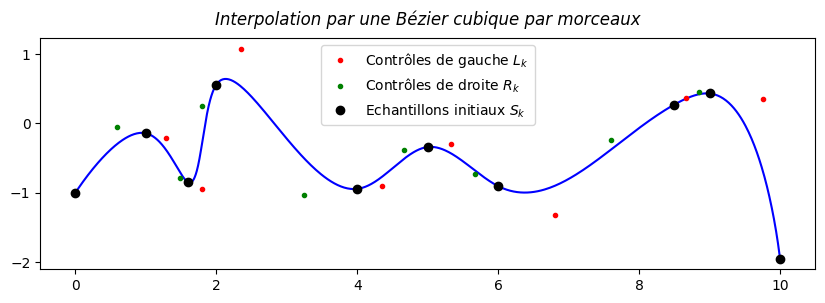

In [48]:
test = lambda x: np.sin(3*x) - np.cos(5*x) # définition de la fonction de test
x = np.array((0,1,1.6,2,4,5,6,8.5,9,10)); y = test(x) # échantillonnage en 10 points irréguliers
S = np.c_[x, y] # vecteur des échantillons obtenus (= coordonnées des 10 points à interpoler)
d = np.linalg.norm(np.diff(S, axis=0), axis=1); dd = d**2 # distances entre échantillons successifs

# construction de la matrice A (membre gauche) et du vecteur B (membre droit) du système linéaire
n = len(x)-1; A = np.zeros((2*n,2*n)); B = np.zeros((2*n,2)) # 2n équations à 2n inconnues
# on impose 2 contraintes pour la construction de A et B : la dérivée est nulle sur les points extrémités,
# et les segments cubiques s'assemblent avec une continuité C2 aux points de jonction S_k (0 < k < n)
p = np.arange(1, n); q = p-1; i = 2*p-1; j = 2*p # indices utilisés pour spécifier les contraintes
A[0,0], A[-1,-1], B[0], B[-1] = 1, 1, S[0], S[-1] # contrainte de dérivée nulle aux points extrémités
A[j,i-1], A[j,i], A[j,j], A[j,j+1], B[j] = dd[p], -2*dd[p], 2*dd[q], -dd[q], S[p] * (dd[q]-dd[p])[:,None]
A[i,i], A[i,j], B[i] = d[p], d[q], S[p] * (d[p]+d[q])[:,None] # continuité C2 aux points de jonction

P = la.solve(A,B) # résolution du système linéaire avec la fonction 'solve' de 'linalg'
L, R = P[::2], P[1::2] # extraction des points de contrôle gauche (= L) et droite (= R)
t = np.linspace(0, 1, 100) # échantillonnage haute densité pour le tracé des segments de courbe
basis = np.c_[(1-t)**3, 3*t*(1-t)**2, 3*(1-t)*t**2, t**3] # calcul des polynômes cubiques de Bernstein
curve = (basis @ np.stack((S[:-1], L, R, S[1:]), axis=1)).reshape(-1,2) # calcul de la courbe finale

mp.figure(figsize=(10,3)); title = 'Interpolation par une Bézier cubique par morceaux'
mp.plot(*curve.T, 'b-') # courbe d'interpolation en bleu
mp.plot(*L.T,'ro', ms=3, label='Contrôles de gauche $L_k$') # points de contrôle de gauche L_k en rouge
mp.plot(*R.T,'go', ms=3, label='Contrôles de droite $R_k$') # points de contrôle de droite R_k en vert
mp.plot(*S.T, 'ko', label='Echantillons initiaux $S_k$', ms=6) # échantillons initiaux en noir
mp.yticks(range(-2,2)); mp.legend(); mp.title(title, style='italic', pad=10);

La courbe d'interpolation obtenue semble très naturelle : elle correspond globalement à ce que produirait un être humain à qui on demanderait de dessiner une courbe lisse passant par l'ensemble des points avec interdiction de revenir en arrière sur l'axe horizontal (car il faut qu'il y ait unicité du $y$ associé à chaque $x$). En comparant avec les courbes d'interpolation obtenues avec les fonctions **`UnivariateSpline`** et **`Rbf`** (cf. section A1 de ce chapitre), il est évident que les courbes de Bézier par morceaux constituent un outil bien meilleur pour ce type d'interpolation, d'autant plus que les courbes générées vérifient de nombreuses propriétés très importantes en analyse numérique (stabilité numérique, invariance par rapport au repère cartésien utilisé, algorithmes d'évaluation très efficace pour la fonction ainsi que pour ses dérivées successives, calcul direct de l'enveloppe convexe, etc). Si on souhaite une continuité d'ordre supérieur à **C**$^2$, il suffit d'augmenter le degré des polynômes de Bernstein utilisés, ce qui va rajouter un point de contrôle supplémentaire pour chaque ordre de continuité souhaité, mais en pratique, il existe très peu d'applications numériques qui nécessitent une continuité supérieure à **C**$^2$.

> **Note :** Le code précédent va créer une matrice $A$ de taille $2n \times 2n$ et résoudre le système comme s'il s'agissait d'une matrice pleine. Mais en fait, la localité des équations données par les contraintes va faire en sorte que la matrice $A$ sera toujours une ***matrice bande de type (3,1)***, c'est-à-dire 3 diagonales inférieures et 1 diagonale supérieure en plus de la diagonale principale, il est donc possible de réduire le coût de stockage à $O(10n)$ au lieu de $O(4n^2)$. Pour les 10 échantillons à interpoler dans l'exemple, le gain est assez anecdotique, par contre, pour l'interpolation de plusieurs centaines ou plusieurs milliers d'échantillons, il peut être très bénéfique de construire $A$ comme une matrice bande et d'utiliser la fonction **`solve_banded`** pour la résolution du système.

Mais comme on l'a vu dans la section A1, lorsque le nombre d'échantillons augmente, il n'est pas forcément intéressant de créer une fonction continue passant par tous les points, notamment lorsque les données correspondent à des mesures entâchées d'une certaine erreur. Dans ce cas de figure, très fréquent dans le domaine des Sciences des Données, utiliser des méthodes d'approximation à la place des méthodes d'interpolation, est une bien meilleure approche.

La technique d'interpolation précédente peut facilement s'adapter à cet objectif : il suffit de définir au départ un nombre $m$ de segments de Bézier cubiques, et de réaliser un sous-échantillonnage pour ne garder que $m+1$ points $T_k$ , à partir des $n+1$ échantillons initiaux $S_k$. L'interpolation ne s'effectuera que sur ces points $T_k$ qui seront donc les ***points de jonction*** des segments cubiques. Pour que ce sous-échantillonnage soit le plus équiréparti possible, on calcule une approximation de l'[**abscisse curviligne**](https://fr.wikipedia.org/wiki/Abscisse_curviligne) de la courbe en effectuant la somme cumulée des distances entre les échantillons successifs $||S_kS_{k+1}||$ puis en divisant la distance cumulée en $m$ parties uniformes, afin d'identifier les points $T_k$ à sélectionner. Une fois cette opération réalisée, il ne reste plus qu'à réutiliser le processus d'interpolation, tel qu'il a été détaillé précédemment.

Pour la mise en oeuvre, nous allons reprendre la fonction de test composée d'une somme de deux sinusoïdes dont l'une est atténuée par une gaussienne, utilisée dans la section B2 pour tester la fonction **`curve_fit`** du module **`scipy.optimize`** :

100 10


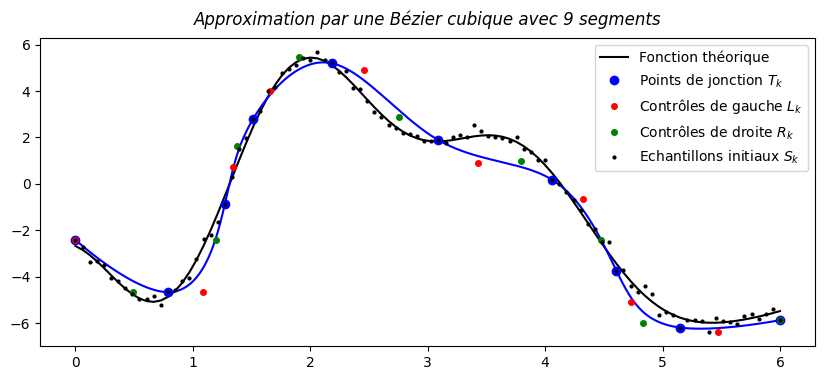

In [49]:
f = lambda x: 5 * np.sin(x-1) + 3 * np.exp(-x*x/16) * np.sin(1-3*x) - 1 # définition de la fonction de test
x = np.linspace(0, 6, 100) # échantillonnage faible densité correspondant à la localisation des mesures
np.random.seed(10); noise = np.random.normal(0, 0.2, 100) # création d'une perturbation pour les mesures
y = f(x) + noise # simulation de mesures bruitées par ajout d'une perturbation gaussienne (écart-type = 0.2)
S = np.c_[x, y] # vecteur des échantillons obtenus (= points trop nombreux pour l'interpolation)
d = np.linalg.norm(np.diff(S, axis=0), axis=1) # distances entre échantillons successifs

m = 9 # nombre de segments de Bézier cubique souhaité (tester avec m = 14 puis m = 19)
s = np.r_[0, np.cumsum(d)] # création de l'abscisse curviligne par somme cumulée des distances
k = np.abs(s[:,None] - np.linspace(0, s[-1], m+1)).argmin(0) # extraction de m+1 indices équirépartis
T = S[k] # extraction points à interpoler (= points de jonction des segments cubiques)
print(len(S), len(T))
# le reste du code est parfaitement équivalent à celui de la cellule précédente
n = len(T)-1; A = np.zeros((2*n,2*n)); B = np.zeros((2*n,2)); p = np.arange(1, n); i = 2*p-1; j = 2*p
A[0,0], A[-1,-1], B[0], B[-1] = 1, 1, T[0], T[-1]; A[i,i], A[i,j], B[i] = 1, 1, 2*T[p]
A[j,i-1], A[j,i], A[j,j], A[j,j+1], B[j] = 1, -2, 2, -1, 0 # création de la matrice A et du vecteur B
P = la.solve(A,B); L, R = P[::2], P[1::2] # résolution du système et extraction des points de contrôle
t = np.linspace(0, 1, 100); basis = np.c_[(1-t)**3, 3*t*(1-t)**2, 3*(1-t)*t**2, t**3] # base de Bernstein
curve = (basis @ np.stack((T[:-1], L, R, T[1:]), axis=1)).reshape(-1,2) # calcul de la courbe finale

mp.figure(figsize=(10,4)); title = f"Approximation par une Bézier cubique avec {m} segments"
mp.plot(x, f(x), 'k-', label='Fonction théorique'); mp.plot(*curve.T, 'b-') # fonction théorique en noir
mp.plot(*T.T, 'bo', ms=6, label='Points de jonction $T_k$') # points de jonction T_k en bleu
mp.plot(*L.T,'ro', ms=4, label='Contrôles de gauche $L_k$') # points de contrôle de gauche L_k en rouge
mp.plot(*R.T,'go', ms=4, label='Contrôles de droite $R_k$') # points de contrôle de droite R_k en vert
mp.plot(*S.T, 'ko', ms=2, label='Echantillons initiaux $S_k$') # échantillons initiaux S_k en noir
mp.legend(); mp.title(title, style='italic', pad=10);

L'avantage de cette méthode d'approximation est qu'elle permet de facilement contrôler la précision de l'approximant via le choix du nombre de segments (vous pouvez tester en modifiant la valeur de **`m`** dans la cellule précédente, pour visualiser l'influence de ce paramètre). Par contre, comme l'approximant se base uniquement sur la position des points de jonction (et non sur l'ensemble des points-échantillons disponibles), le résultat est très fortement dépendant d'une bonne ou mauvaise sélection de ces points. Si une équirépartition des points de jonction semble souhaitable, il n'y a aucune garantie qu'elle fournisse systématiquement le meilleur approximant pour le jeu de données initial. C'est pour cette raison que l'on va généralement préférer les méthodes d'approximation qui cherchent à minimiser l'**erreur quadratique moyenne** entre l'approximant et des données initiales, comme celles présentées dans la section suivante.

---
#### c - Approximation au sens des moindres carrés

La dernière fonction importante du module **`scipy.linalg`** est la fonction **`lstsq`** qui permet de trouver une solution approximative pour un système linéaire $A X = B$ lorsque la matrice $A$ n'est pas inversible; le cas le plus courant étant celui des systèmes sur-contraints avec plus d'équations que d'inconnues. A défaut d'obtenir une solution exacte du système, la fonction va retourner la valeur du vecteur $X$ qui minimise l'erreur quadratique $||AX-B||^2$. Il faut noter qu'à la différence de la fonction **`leastsquares`** du module **`scipy.optimize`** qui utilise un processus itératif adapté aux modèles non-linéaires, la fonction **`lstsq`**  est basée sur la [**méthode des moindres carrées**](https://fr.wikipedia.org/wiki/M%C3%A9thode_des_moindres_carr%C3%A9s) originelle, qui certes ne fonctionne que pour les modèles linéaires, mais permet une ***résolution directe***, donc beaucoup plus rapide et sans nécessiter de fournir un point de départ.

Pour illustrer l'utilisation de **`lstsq`**, on va reprendre la même fonction de test de ci-dessus (i.e. la somme de deux sinusoïdes dont l'une atténuée par une gaussienne) mais au lieu d'utiliser des courbes de Bézier, on va employer une autre famille de courbes polynomiales par morceaux, appelées [**courbes B-spline**](https://fr.wikipedia.org/wiki/B-spline), qui ont été spécifiquement développées pour obtenir un processus d'ajustement rapide et stable. Ces courbes sont définies à partir d'un **vector nodal** ${\sf T} = [t_0 \leq t_1 \leq\,... \leq t_m]$ (correspondant globalement à la valeur du paramètre $t$ aux différents points de jonction) et d'une base polynomiale par morceaux ${\sf B}^d_k(t)$, définie par récurrence sur le degré $d$ des polynômes utilisés :

$$ {\sf B}^0_k(t) = t_k \leq t < t_{k+1}\,?\,1\,:\,0\qquad {\sf B}^d_k(t) = \frac{t-t_k}{t_{k+d}-t_k} {\sf B}^{d-1}_k(t) + \frac{t_{k+d+1} - t}{t_{k+d+1} - t_{k+1}} {\sf B}^{d-1}_{k+1}(t) $$

Dans la plupart des cas, on se contente d'utiliser les B-splines cubiques qui permettent d'obtenir une continuité d'ordre **C**$^2$, comme on l'a fait précédemment pour les courbes de Bézier, mais dans le code ci-dessous, on va implémenter le cas général avec un degré $d$ arbitraire. Comme la base polynomiale B-spline est très fréquemment utilisée en analyse numérique, elle est directement disponible à partir du module **`scipy.interpolate`**, ce qui évite d'avoir à implémenter manuellement la définition par récurrence ci-dessus, et permet ainsi d'obtenir un code beaucoup plus compact :

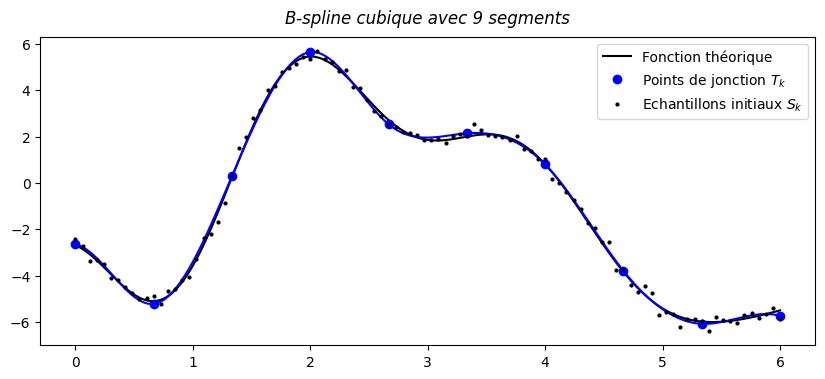

In [50]:
from scipy.interpolate import BSpline # import de la base polynomiale B-spline

d = 3 # degré souhaité pour les segments B-splines (tester avec m = 2, m = 5, m = 8)
m = 9 # nombre de segments B-splines souhaité (tester avec m = 3, m = 6, m = 12)
nodes = np.linspace(x[0], x[-1], m+1) # vecteur nodal (= m+1 points de jonction équirépartis de x_0 à x_m
fullnodes = np.r_[d*[x[0]], nodes, d*[x[-1]]] # duplication des noeuds extrêmes pour forcer l'interpolation
basis = BSpline(fullnodes, np.eye(m+d), d) # calcul des fonctions de base (= polynômes B-splines)
controls, *args = la.lstsq(basis(x), y) # résolution du système et extraction des points de contrôle
xx = np.linspace(x[0], x[-1], 400); yy = basis(xx) @ controls # échantillonnage haute densité pour le tracé
tx = nodes; ty = basis(tx) @ controls # extraction des points de jonction

mp.figure(figsize=(10,4)); title = f"B-spline cubique avec {m} segments"
mp.plot(xx, f(xx), 'k-', label='Fonction théorique'); mp.plot(xx, yy, 'b-') # fonction théorique en noir
mp.plot(tx, ty, 'bo', ms=6, label='Points de jonction $T_k$') # points de jonction T_k en bleu
mp.plot(x, y, 'ko', ms=2, label='Echantillons initiaux $S_k$') # échantillons initiaux en noir
mp.legend(); mp.title(title, style='italic', pad=10);

Le résultat est bien meilleur que l'approximation obtenue précédemment avec les Bézier par morceaux, alors que nous sommes sur le même degré des polynômes $d=3$ et le même nombre de segments $m=9$. En fait, l'approximation au sens des moindres carrés par des fonctions B-splines est tellement efficace, avec une convergence extrêmement rapide et précise, que la méthode est devenue l'outil standard pour obtenir une fonction d'ajustement lisse sur des données expérimentales de toute nature. Nous avons implémenté une version bas-niveau, en construisant manuellement le vecteur nodal puis le système linéaire avant d'appeler la fonction générale **`lstsq`**, mais en pratique, il existe une fonction dédiée **`LSQUnivariateSpline`** dans le module **`scipy.interpolate`** qui effectue tout ce processus de manière automatisée :

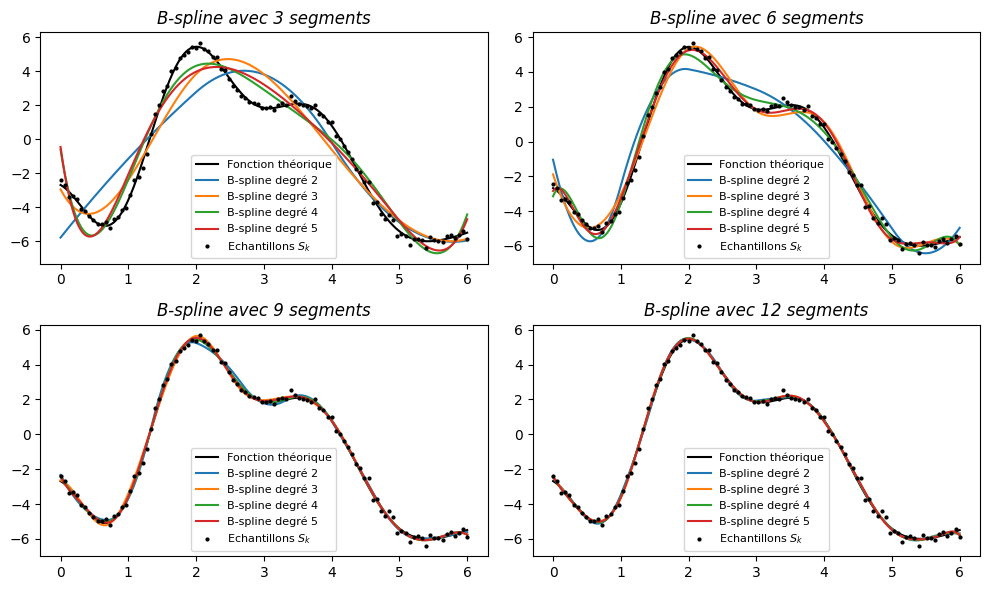

In [51]:
from scipy.interpolate import LSQUnivariateSpline # import de la fonction d'approximation B-spline

mp.figure(figsize=(10,6))
for k,m in enumerate([3, 6, 9, 12]): # itération sur le nombre de segments
  mp.subplot(2, 2, k+1); title = f"B-spline avec {m} segments" # sous-figure nouvelle pour chaque nombre 'm'
  mp.plot(xx, f(xx), 'k-', label='Fonction théorique') # fonction théorique en noir
  for d in [2, 3, 4, 5]: # itération sur le degré des splines
    nodes = np.linspace(x[0], x[-1], m+1)[1:-1] # vecteur nodal (il faut enlever les 2 noeuds extrêmes)
    spline = LSQUnivariateSpline(x, y, nodes, k=d) # calcul de la courbe spline par les moindres carrés
    mp.plot(xx, spline(xx), label=f"B-spline degré {d}") # couleurs différentes pour chaque degré 'd'
  mp.plot(x, y, 'ko', ms=2, label='Echantillons $S_k$') # échantillons initiaux en noir
  mp.legend(fontsize=8); mp.title(title, style='italic'); mp.tight_layout()

On constate que la convergence de l'approximant vers la fonction exacte est extrêmement rapide : pour 9 segments, les courbes des degrés 4 et 5 ont déjà atteint une approximation presque idéale, et pour 12 segments, toutes les courbes, du degré 2 au degré 5 donnent un tracé quasiment indifférentiable de la fonction exacte, ce qui explique d'ailleurs pourquoi la fonction **`LSQUnivariateSpline`** juge qu'il est inutile d'aller au-delà du degré 5. Il faut néanmoins noter que la fonction ne donne des ***résultats intéressants que lorsque le système est fortement sur-contraint***, c'est-à-dire lorsque le nombre $n$ d'échantillons est très supérieur au nombre $m$ de segments. Si on reprend l'exemple de la section **A1** avec les 10 échantillons à interpoler, la fonction **`LSQUnivariateSpline`** donne des résultats totalement catastrophiques avec des sur-oscillations énormes entre chaque échantillon, quelque soit le degré choisi, comme le montre la figure ci-dessous :

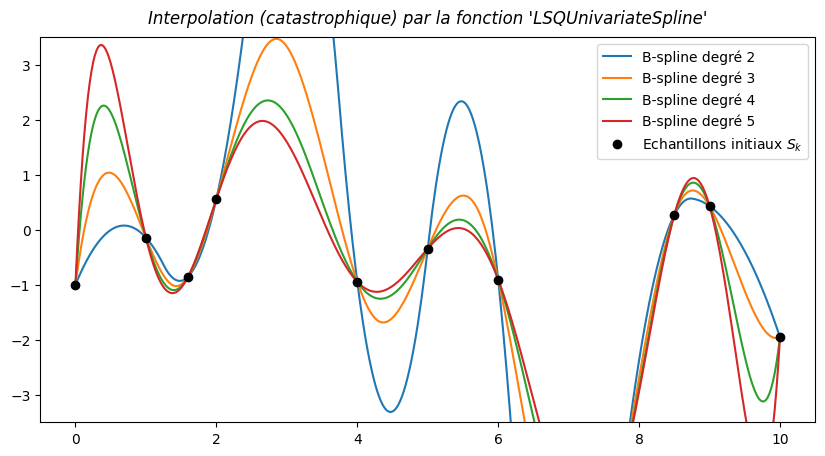

In [52]:
test = lambda x: np.sin(3*x) - np.cos(5*x) # définition de la fonction de test
x = np.array((0,1,1.6,2,4,5,6,8.5,9,10)); y = test(x) # échantillonnage en 10 points irréguliers
xx = np.linspace(x[0], x[-1], 400) # échantillonnage haute densité pour le tracé
mp.figure(figsize=(10,5)); title = "Interpolation (catastrophique) par la fonction 'LSQUnivariateSpline'"
for d in [2, 3, 4, 5]: # itération sur le degré des splines
  nodes = np.linspace(x[0], x[-1], 11-d)[1:-1] # vecteur nodal (suppression des noeuds aux extrémités)
  spline = LSQUnivariateSpline(x, y, nodes, k=d) # calcul de la courbe spline par moindres carrés
  mp.plot(xx, spline(xx), label=f"B-spline degré {d}"); mp.axis([-0.5,10.5,-3.5,3.5])
mp.plot(x, y, 'ko', label='Echantillons initiaux $S_k$')
mp.legend(); mp.title(title, style='italic', pad=10);

---
### 2 - Module 'scipy.sparse'

Le module [**scipy.sparse**](https://docs.scipy.org/doc/scipy/tutorial/sparse.html) fournit des outils pour la création et l'utilisation de [**matrices creuses**](https://en.wikipedia.org/wiki/Sparse_matrix) (autrement dit des matrices contenant principalement des zéros) ce qui permet d'optimiser le stockage en mémoire et d'accélérer les calculs. Le module propose une nouvelle structure de données **`spmatrix`** qui possède plusieurs variantes adaptées à divers cas d'utilisation :

- **`csr_matrix`** : Matrice creuse au format ***Compressed Sparse Row*** (CSR)<br>
  – format permettant un accès rapide aux lignes de la matrice<br>
  – efficace pour multiplications matrice × vecteur et algorithmes de résolution de systèmes linéaires

- **`csc_matrix`** : Matrice creuse au format ***Compressed Sparse Column*** (CSC)<br>
  – format permettant un accès rapide aux colonnes de la matrice<br>
  – efficace pour multiplications vecteur × matrice, inversions de matrice ou décompositions LU et QR

- **`bsr_matrix`** : Matrice creuse au format ***Block Sparse Row*** (BSR)<br>
  – format permettant un accès rapide aux blocs d'une matrice creuse avec des blocs denses<br>
  – efficace pour multiplications entre matrices blocs et résolution de systèmes linéaires par blocs

- **`dok_matrix`** : Matrice creuse au format ***Dictionary of Keys*** (DOK)<br>
  – format de construction incrémentale d'une matrice à partir d'un dictionnaire $\{p,q: val, ...\}$<br>
  – souvent utilisé comme format intermédiaire durant la construction avant de convertir vers CSR ou CSC

- **`coo_matrix`** : Matrice creuse au format ***Coordinate List*** (COO)<br>
  – format de construction incrémentale d'une matrice à partir d'une liste de triplets $(p, q, val)$<br>
  – souvent utilisé comme format intermédiaire durant la construction avant de convertir vers CSR ou CSC

- **`lil_matrix`** : Matrice creuse au format ***List of Lists*** (LIL)<br>
  – format de construction d'une matrice ligne par ligne ou colonne par colonne<br>
  – souvent utilisé comme format intermédiaire durant la construction avant de convertir vers CSR ou CSC

- **`dia_matrix`** : Structure de données spécifique pour matrices diagonales et matrices bandes

La conversion entre ces différents formats de stockage s'effectuent via des méthodes **`to_csr, to_csc...`** qui sont incluses dans les différentes classes correspondantes. De plus, si à la fin des manipulations sur une matrice creuse, on veux la convertir vers une matrice **numpy** standard pour utiliser un algorithme qui n'est pas adapté aux matrices creuses, il suffit d'appeler la méthode **`to_array`** disponible pour l'ensemble des formats listés ci-dessus.

In [53]:
import scipy.sparse as ar
#inspect(ar, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations
#inspect(ar.csr_matrix) # liste des attributs et des méthodes disponibles pour chacun des formats

---
#### a - Opérations élémentaires sur les matrices creuses

L'utilisation du module **`scipy.sparse`** ne présente pas de difficulté particulière : le module de base contient un sous-ensemble des fonctions de **`numpy`** proposant les opérations élémentaires sur les matrices, adaptées aux matrices creuses. De même, le sous-module **`scipy.sparse.linalg`** contient un sous-ensemble du module **`scipy.linalg`** pour tout ce qui concerne l'algèbre linéaire adaptée aux matrices creuses. Pour toutes ces fonctions, la mise en oeuvre est quasiment identique à ce que l'on a vu dans le chapitre sur **numpy** ou ce que l'on vient de voir ci-dessus, même si les noms des fonctions changent un peu (par exemple, **`splu`** au lieu de **`lu`**, **`spsolve`** au lieu de **`solve`**, **`lsqr`** au lieu de **`lstsq`**, etc).

---
#### b - Manipulation des graphes par matrices creuses

La seule nouveauté concerne le sous-module [**scipy.sparse.csgraph**](https://docs.scipy.org/doc/scipy/tutorial/csgraph.html) qui implémente une série d'algorithmes classiques sur les graphes (recherche du plus court chemin entre deux noeuds, parcours en largeur ou en profondeur, etc) en utilisant une matrice creuse pour stocker la matrice d'adjacence permettant de définir le graphe. Il faut noter que le module **`csgraph`** est assez restreint dans ses fonctionnalités : pour la manipulation efficace des graphes avec Python, le module **`networkx`** qui sera étudié dans le chapitre 11, est clairement l'outil à privilégier.

Néanmoins, pour illustrer le fonctionnement de **`csgraph`**, on va reprendre le principe de l'exercice C5 sur la résolution de labyrinthes, mais en reformulant le problème comme une manipulation de graphes. Les fichiers **`mazeN.txt`**, utilisés dans les feuilles d'exercices B et C, contiennent une série de labyrinthes de complexité variable, définis par une grille composée de lettres (**A** pour les murs, **B** pour les couloirs). Lorsqu'on connecte toutes les cases **B** voisines, on obtient un graphe qui représente l'ensemble des chemins possibles au sein du labyrinthe. En identifiant les noeuds **`source`** et **`target`**, associés respectivement à la porte d'entrée et à la porte de sortie, ***la résolution du labyrinthe revient à trouver le plus court chemin dans le graphe***, entre les noeuds **`source`** et **`target`**. Parmi les méthodes de recherche de chemin implémentés dans **`csgraph`**, l'[**algorithme de Dijkstra**](https://fr.wikipedia.org/wiki/Algorithme_de_Dijkstra) est l'un des plus efficaces, lorsque le coût de déplacement sur chaque arête est positif (ce qui est le cas ici, puisqu'on associe un coût de 1 à chaque déplacement élémentaire dans la grille du labyrinthe).

In [54]:
maze = load('DATA/maze1.txt'); rows, cols = len(maze), len(maze[0]) # lecture du labyrinthe 'maze1.txt'
coords = [(r, c) for r in range(rows) for c in range(cols) if maze[r][c] == 'B'] # recherche des cases 'B'
n = len(coords); maze = dict(zip(coords, range(n))) # dictionnaire des coordonnées et indices des cases 'B'
source, target = 0, n-1 # indices des cases d'entrée et de sortie du labyrinthe
print(f"Taille du labyrinthe = {rows} x {cols} / Entrée = {coords[source]} / Sortie = {coords[target]}")

A = ar.lil_matrix((n, n), dtype=bool) # création d'une matrice au format LIL pour construction incrémentale
for (r,c), p in maze.items(): # itération sur les éléments du dictionnaire (= cases 'B')
  if (r+1,c) in maze: q = maze[r+1,c]; A[p,q] = A[q,p] = True # case 'B' au sud,  donc on insère une arête
  if (r,c+1) in maze: q = maze[r,c+1]; A[p,q] = A[q,p] = True # case 'B' à l'est, donc on insère une arête
A = A.tocsr() # conversion de la matrice creuse du format dynamique LIL au format statique CSR
print(f"Taille du graphe : nombre de noeuds = {n} / nombre d'arêtes = {A.nnz//2}")

p, path = source, [source] # initialisation du chemin en partant de la case d'entrée
_, links = ar.csgraph.dijkstra(A, indices=target, return_predecessors=True) # algorithme de Dijsktra
while p != target: p = links[p]; path.append(p) # extraction du chemin trouvé (parcours de liste chaînée)
path = ["(%s,%s)" % coords[step] for step in path] # extraction des coordonnées des cases traversées
print(f"Chemin optimal = {len(path)} pas\n{' '.join(path)}") # affichage du chemin trouvé

Taille du labyrinthe = 21 x 21 / Entrée = (1, 0) / Sortie = (19, 20)
Taille du graphe : nombre de noeuds = 201 / nombre d'arêtes = 200
Chemin optimal = 139 pas
(1,0) (1,1) (2,1) (3,1) (4,1) (5,1) (5,2) (5,3) (5,4) (5,5) (5,6) (5,7) (5,8) (5,9) (5,10) (5,11) (6,11) (7,11) (8,11) (9,11) (9,12) (9,13) (8,13) (7,13) (6,13) (5,13) (4,13) (3,13) (3,14) (3,15) (3,16) (3,17) (3,18) (3,19) (4,19) (5,19) (6,19) (7,19) (8,19) (9,19) (10,19) (11,19) (11,18) (11,17) (10,17) (9,17) (8,17) (7,17) (6,17) (5,17) (5,16) (5,15) (6,15) (7,15) (8,15) (9,15) (10,15) (11,15) (12,15) (13,15) (14,15) (15,15) (15,16) (15,17) (15,18) (15,19) (16,19) (17,19) (17,18) (17,17) (17,16) (17,15) (17,14) (17,13) (16,13) (15,13) (14,13) (13,13) (12,13) (11,13) (11,12) (11,11) (11,10) (11,9) (10,9) (9,9) (8,9) (7,9) (7,8) (7,7) (8,7) (9,7) (9,6) (9,5) (9,4) (9,3) (9,2) (9,1) (10,1) (11,1) (12,1) (13,1) (14,1) (15,1) (15,2) (15,3) (15,4) (15,5) (14,5) (13,5) (12,5) (11,5) (11,6) (11,7) (12,7) (13,7) (13,8) (13,9) (13,10) (

On peut vérifier que cette liste est bien parfaitement équivalente au chemin optimal qui se trouve dans le fichier **`walk1.txt`** qui avait été utilisé pour la feuille d'exercice C. En modifiant le nom du fichier dans le code précédent, vous pourrez d'ailleurs tester la résolution des autres labyrinthes depuis **maze0.txt** (de taille 15x15) jusqu'à **maze6.txt** (de taille 423x243).

<h2 style="padding:16px; color:#FFF; background:#06D">C - Modules pour l'analyse de données</h2>

### 1 - Module 'scipy.stats'

Le module [**scipy.stats**](https://docs.scipy.org/doc/scipy/tutorial/stats.html) fournit un ensemble complet d'outils statistiques destinées à l'analyse de données provenant de sources arbitraires. Il peut être utilisé, par exemple, pour générer des statistiques descriptives, effectuer des tests d'hypothèse, ou manipuler une très grande variété des distributions continues ou discrètes qui apparaissent dans l'étude statistique de phénomènes variés. Néanmoins, il faut noter que si le module **`scipy.stats`** était globalement sans concurrence lors de son apparition dans les premières version de **scipy** il y a une vingtaine d'années, ce n'est plus le cas aujourd'hui car l'arrivée du package **`statsmodels`**, beaucoup plus complet et plus flexible, a rendu obsolète une grande partie des fonctionnalités proposées par **`scipy.stats`**.

Dans cette section, on va donc se restreindre aux seuls outils toujours intéressants de **`scipy.stats`**, en l'occurrence ceux qui concernent la manipulation des variables aléatoires, des histogrammes, des densités de probabilité ou des fonctions de répartition, pour les nombreuses distributions théoriques qui sont directement implémentés sous forme fonctionnelle dans le module. Pour tout ce qui concerne les tests d'hypothèses, les modèles de régression, et l'ajustement de modèles théoriques aux données expérimentales, leur mise en oeuvre à l'aide du package **`statsmodels`** sera détaillée dans le chapitre 11.

In [55]:
import scipy.stats as st
#inspect(st, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

---
#### a - Manipulation de distributions classiques

Comme le montre la fonction **`inspect`** ci-dessus, le module **`scipy.stats`** inclut de très nombreuses fonctions dont une très grande majorité (125, très exactement) correspondent à des implémentations de lois de probabilités théoriques usuelles. La liste ci-dessous fournit les noms des fonctions disponibles, en les classant selon leur nature (distribution continue ou distribution discrète) :

- **Distributions continues :** `alpha, anglit, arcsine, argus, beta, betaprime, bradford, burr, burr12, cauchy, chi, chi2, cosine, crystalball, dgamma, dweibull, erlang, expon, exponnorm, exponpow, exponweib, f, fatiguelife, fisk, foldcauchy, foldnorm, gamma, gausshyper, genexpon, genextreme, gengamma, genhalflogistic, genhyperbolic, geninvgauss, genlogistic, gennorm, genpareto, gibrat, gilbrat, gompertz, gumbel_l, gumbel_r, halfcauchy, halfgennorm, halflogistic, halfnorm, hypsecant, invgamma, invgauss, invweibull, johnsonsb, johnsonsu, kappa3, kappa4, ksone, kstwo, kstwobign, laplace, laplace_asymmetric, levy, levy_l, levy_stable, loggamma, logistic, loglaplace, lognorm, loguniform, lomax, maxwell, mielke, moyal, nakagami, ncf, nct, ncx2, norm, norminvgauss, pareto, pearson3, powerlaw, powerlognorm, powernorm, rayleigh, rdist, recipinvgauss, reciprocal, rice, semicircular, skewcauchy, skewnorm, studentized_range, t, trapezoid, trapz, triang, truncexpon, truncnorm, truncweibull_min, tukeylambda, uniform, vonmises, vonmises_line, wald, weibull_max, weibull_min, wrapcauchy`

- **Distributions discrètes :** `bernoulli, betabinom, binom, boltzmann, dlaplace, geom, hypergeom, logser, nbinom, nchypergeom_fisher, nchypergeom_wallenius, nhypergeom, planck, poisson, randint, skellam, yulesimon, zipf, zipfian`

Concrêtement, toutes ces fonctions sont des instances de deux classes principales **`rv_continuous`** pour les distributions continues, et **`rv_discrete`** pour les distributions discrètes. Ce qui signifie que ces instances contiennent toutes les mêmes attributs et méthodes, dont on peut évidemment obtenir la liste complète avec **`inspect`**. Voici un bref résumé du rôle des principales méthodes disponibles pour toutes ces distributions :

- **stats(...)** : retourne les statistisques descriptives (moyenne, variance, asymétrie, aplatissement)
- **rvs(...)** : génère des échantillons aléatoires selon la distribution concernée (**rvs** = ***random variable sampling***)
- **pdf(x)** : retourne la densité de probabilité $f(x)$ (**pdf** = ***probability density function***)
- **logpdf(x)** : retourne le logarithme de la densité de probabilité
- **pmf(x)** : retourne la fonction de masse $p(x)$ (**pmf** = ***probability mass function***)
- **logpmf(x)** : retourne le logarithme de la fonction de masse
- **cdf(x)** : retourne la fonction de répartition $F(x)$ (**cdf** = ***cumulative distribution function***)
- **logcdf(x)** : retourne le logarithme de la fonction de répartition
- **sf(x)** : retourne la fonction de survie $1 - F(x)$ (**sf** = ***survival function***)
- **logsf(x)** : retourne le logarithme de la fonction de survie
- **ppf(q)** : retourne le quantile $x$ tel que $F(x) = q$ (= fonction inverse de **cdf**)
- **isf(q)** : retourne le quantile tel que $1 - F(x) = q$ (= fonction inverse de **sf**)
- **support** : tuple contenant les bornes du domaine $(a, b)$ de la distribution
- **moment(order)** : calcule le moment centré d'ordre donné
- **fit(data)** : ajuste les paramètres de la distribution concernée à des données expérimentales
- **fit_loc_scale(...)** : ajuste uniquement les paramètres `loc` et `scale` de la distribution
- **expect(...)** : calcule l'espérance d'une fonction $g(x)$ selon la densité $f(x)$ : $E(g) = \int_a^b g(x) f(x)\,dx$
- **entropy(...)** : calcule l'entropie différentielle d'une distribution : $H(f) = -\int_a^b f(x) \log f(x)\,dx$

In [56]:
#inspect(st.rv_continuous, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations
#inspect(st.rv_discrete, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

Pour illustrer la mise en oeuvre de ces fonctionnalités, on va choisir différents jeux de paramètres pour un ensemble de distributions théoriques continues souvent rencontrés en pratique : [**loi normale**](https://fr.wikipedia.org/wiki/Loi_normale), [**loi log-normale**](https://fr.wikipedia.org/wiki/Loi_log-normale), [**loi exponentielle**](https://fr.wikipedia.org/wiki/Loi_exponentielle), [**loi gamma**](https://fr.wikipedia.org/wiki/Loi_Gamma), [**loi beta**](https://fr.wikipedia.org/wiki/Loi_b%C3%AAta). A partir de ces jeux de paramètres, on va créer une variable aléatoire vérifiant la distribution souhaitée, qui va être utilisée pour générer $n$ échantillons aléatoires, via la méthode **`rvs`**. On affiche alors l'histogramme obtenu par cet échantillonnage, en mettant en sur-impression, la densité de probabilité théorique *(courbe en noir)*, afin de vérifier que les formes sont bien similaires. Enfin on va tenter de retrouver les paramètres initiaux de la distribution uniquement à partir des échantillons, via la méthode **`fit`** : un premier ajustement *(courbe en bleu)* va utiliser 100% des échantillons disponibles, un second ajustement *(courbe en vert)* se restreint à 25% des échantillons, et enfin, un dernier ajustement *(courbe en rouge)* ne se base que sur 10% des échantillons :

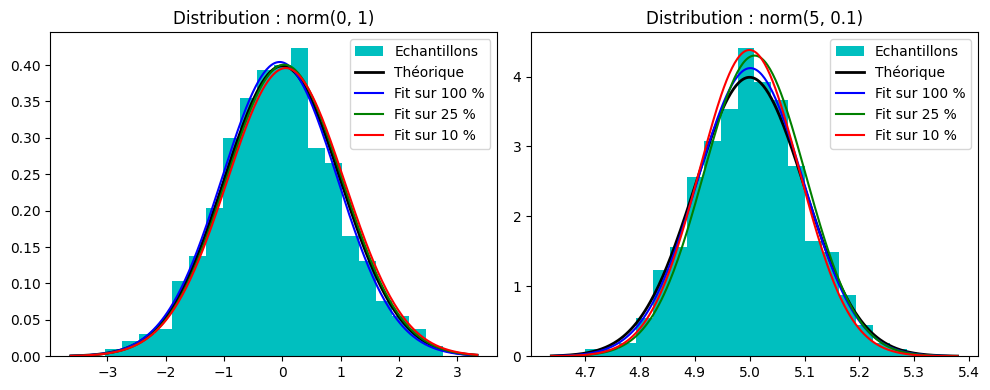

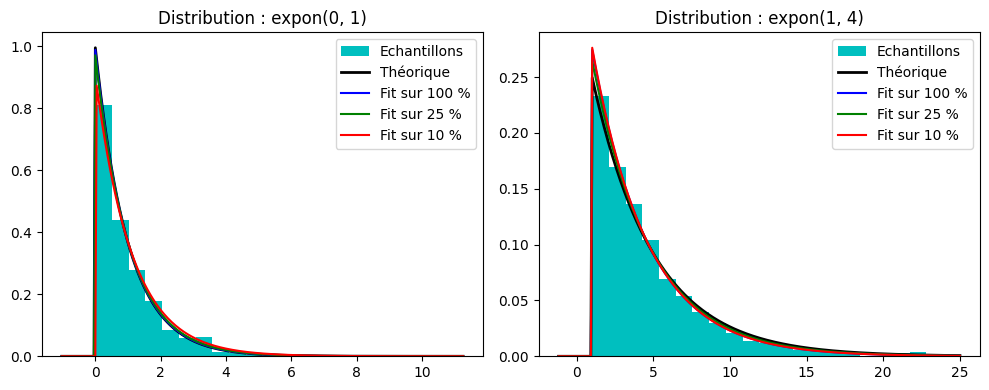

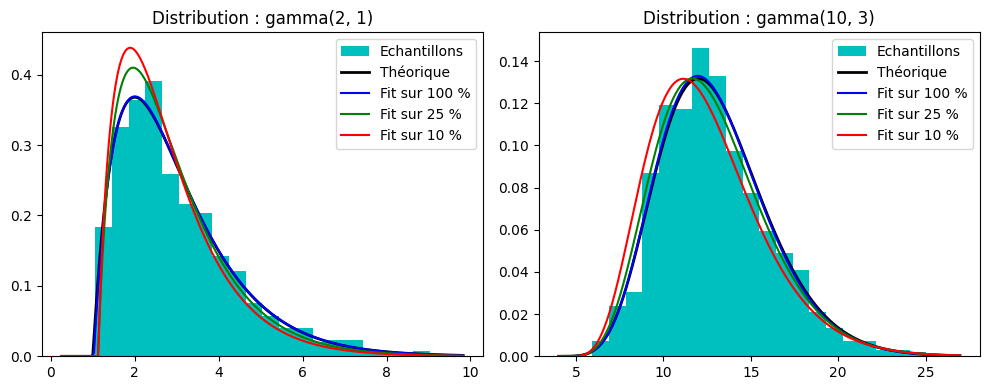

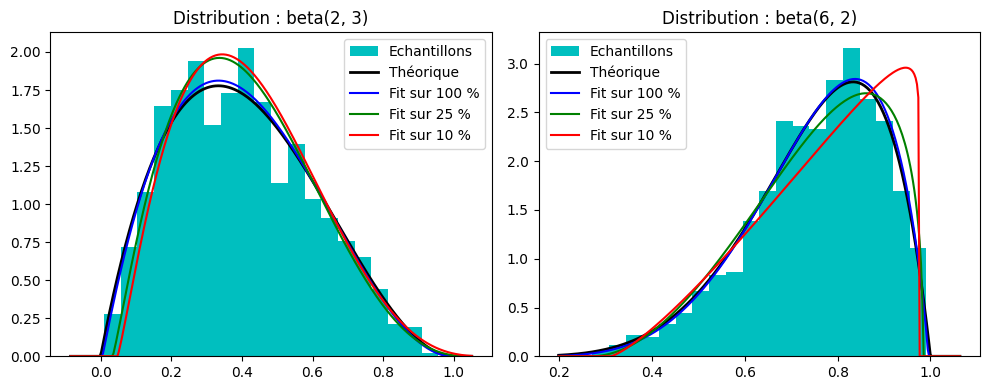

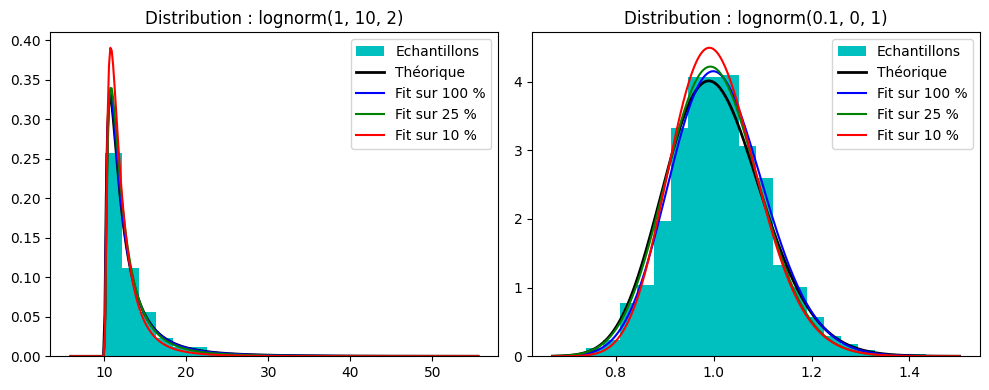

In [57]:
np.random.seed(0); n = 1000 # nombre d'échantillons pour chaque modèle de distribution testée
# choix de différents jeux de paramètres pour les principaux modèles de distributions théoriques
cont = dict(norm=[(0,1), (5,0.1)], expon=[(0,1), (1,4)], gamma=[(2,1), (10,3)],
            beta=[(2,3), (6,2)], lognorm=[(1,10,2), (0.1,0,1)]) # distributions continues
disc = dict(poisson=[(5,), (1,5)], binom=[(10,0.2), (100,0.5)]) # distributions discrètes

for name in cont: # itération sur les distributions continues
  mp.figure(figsize=(10,4)) # une figure par distribution
  for p, args in enumerate(cont[name]): # itération sur les jeux de paramètres
    mp.subplot(1, 2, p+1) # une sous-figure par jeu de paramètres
    dist = getattr(st, name) # récupération de la fonction associée dans le module 'stats'
    randvar = dist(*args); samples = randvar.rvs(n) # variable aléatoire pour la génération des échantillons
    smin, smax = min(samples), max(samples); ptp = smax-smin # intervalle de variation des échantillons
    xmin, xmax = smin - 0.1*ptp, smax + 0.1*ptp # élargissement de l'intervalle de 10%
    x = np.linspace(xmin, xmax, 300) # échantillonnage haute densité pour les tracés
    mp.hist(samples, bins=20, density=True, color='c', label='Echantillons') # histogramme des échantillons
    # estimation des paramètres du modèle par ajustement à partir de 100%, 25% ou 10% des échantillons
    hifit, mifit, lofit = dist.fit(samples), dist.fit(samples[:n//4]), dist.fit(samples[:n//10])
    mp.plot(x, randvar.pdf(x), 'k-', lw=2, label='Théorique') # distribution théorique
    mp.plot(x, dist(*hifit).pdf(x), 'b-', label='Fit sur 100 %') # fit obtenu avec 100% des échantillons
    mp.plot(x, dist(*mifit).pdf(x), 'g-', label='Fit sur 25 %') # fit obtenu avec 25% des échantillons
    mp.plot(x, dist(*lofit).pdf(x), 'r-', label='Fit sur 10 %') # fit obtenu avec 10% des échantillons
    mp.title(f'Distribution : {name}{args}'); mp.legend(); mp.tight_layout()

Comme on peut le constater sur les figures ci-dessus, l'ajustement des densités de probabilités à partir des échantillons, obtenu par la méthode du [**maximum de vraisemblance**](https://fr.wikipedia.org/wiki/Maximum_de_vraisemblance) implémentée dans la méthode **`fit`** donne des résultats extrêmement proches des modèles théoriques lorsqu'on utilise l'intégralité des échantillons, mais même avec une petite proportion d'échantillons (un quart ou un dixième) l'ajustement obtenu est déjà de bonne qualité et donc parfaitement utilisable en pratique.

On peut évidemment effectuer le même type de mise en oeuvre sur des distributions discrètes, par exemple une distribution de Poisson ou une distribution binomiale. Par contre, pour ces distributions discrètes, le module **`scipy.stats`** ne propose pas de méthode d'ajustement pour retrouver les paramètres des modèles à partir des échantillons. Cet ajustement peut se réaliser avec le package **`statsmodels`** comme nous le verrons dans le chapitre 11, qui inclut des méthodes de régression au sens des [**modèles linéaires généralisés**](https://fr.wikipedia.org/wiki/Mod%C3%A8le_lin%C3%A9aire_g%C3%A9n%C3%A9ralis%C3%A9) :

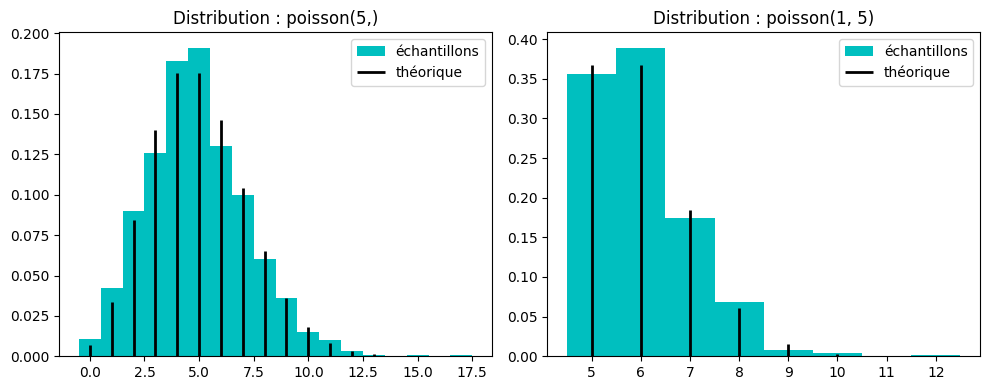

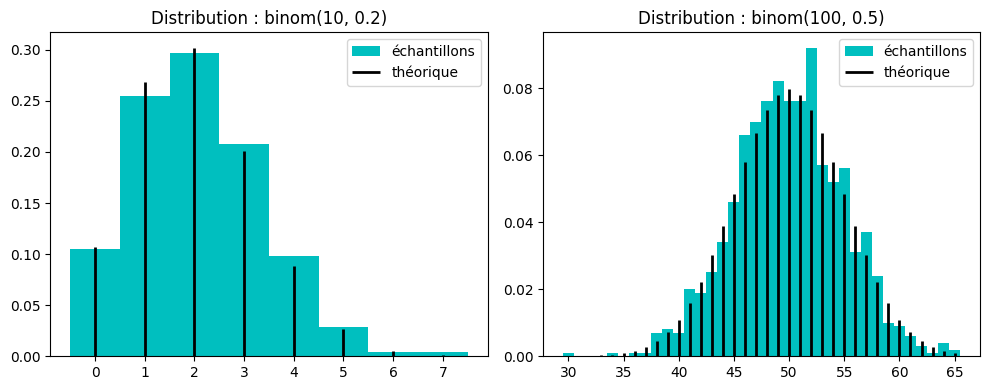

In [58]:
for name in disc: # itération sur les distributions discrètes
  mp.figure(figsize=(10,4)) # une figure par distribution
  for p, args in enumerate(disc[name]): # itération sur les jeux de paramètres
    mp.subplot(1, 2, p+1) # une sous-figure par jeu de paramètres
    dist = getattr(st, name) # récupération de la fonction associée dans le module 'stats'
    randvar = dist(*args); samples = randvar.rvs(n) # variable aléatoire pour la génération des échantillons
    smin, smax = min(samples), max(samples) # intervalle de variation des échantillons
    val, bins = np.arange(smin, smax+1), np.arange(smin-0.5, smax+1.5) # nombre de bins pour histogramme
    mp.hist(samples, bins=bins, density=True, color='c', label='échantillons') # histogramme des échantillons
    mp.vlines(val, 0, randvar.pmf(val), colors='k', lw=2, label='théorique') # histogramme théorique
    mp.title(f'Distribution : {name}{args}'); mp.legend(); mp.tight_layout()

---
### 2 - Module 'scipy.spatial'

Le module [**scipy.spatial**](https://docs.scipy.org/doc/scipy/tutorial/spatial.html) fournit des outils variés pour la [**géométrie algorithmique**](https://en.wikipedia.org/wiki/Computational_geometry), autrement dit, la manipulation numérique de données géométriques dans un espace de dimension arbitraire. Il est principalement utilisé pour les opérations suivantes : création de structures de données pour le partitionnement ou l'indexation spatiale, calcul de distances entre paires de points, identification des plus proches voisins d'un point donné, ou encore triangulation ou tétraédrisation d'un nuage de points.

Les fonctions les plus intéressantes du module pour une utilisation en Sciences des Données sont les suivantes :
- **`procrustes`** : recherche de transformations isométriques pour aligner deux nuages de points
- **`distance_matrix`** : calcul de la matrice des distances entre chaque paire de points d'un nuage
- **`ConvexHull`** : calcul de l'enveloppe convexe d'un nuage de points
- **`Delaunay`** : génération d'une triangulation de Delaunay sur un nuage de points
- **`Voronoi`** : génération d'un diagramme de Voronoï sur un nuage de points
- **`KDTree`** et **`cKDTree`** : création d'une structure de KDTree pour l'indexation spatiale

In [59]:
import scipy.spatial as sp
#inspect(sp, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

---
#### a - Génération et analyse d'échantillonnages 2D

Pour illustrer la mise en oeuvre du module **`scipy.spatial`**, nous allons créer plusieurs échantillonnages stochastiques dans un espace 2D, en utilisant différentes distributions, et effectuer une série de traitements d'algorithmique géométrique sur les nuages de points générés. Les techniques d'échantillonnages stochastiques sont notamment utilisées dans les méthodes numériques basés sur le [**principe de Monte-Carlo**](https://fr.wikipedia.org/wiki/M%C3%A9thode_de_Monte-Carlo), et notamment les [**méthodes de MonteCarlo par chaîne de Markov**](https://fr.wikipedia.org/wiki/M%C3%A9thode_de_Monte-Carlo_par_cha%C3%AEnes_de_Markov) (**MCMC** ou ***Markov Chain Monte Carlo***) qui sont des outils incontournables en Sciences des Données. Les méthodes de Monte Carlo sont connues pour avoir une convergence plutôt lente (typiquement l'erreur asymptotique est en $O(\sqrt n)$ par rapport au nombre $n$ d'échantillons), c'est pourquoi de nombreux travaux ont été menés pour trouver comment choisir un échantillonnage "idéal" permettant de diminuer au mieux la variance de l'estimateur, et ainsi d'accélérer la convergence.

Supposons que l'on cherche à évaluer une fonction bivariée dont le domaine correspond au carré unité $[0,1]^2$. Pour cela, on souhaite obtenir un échantillonnage stochastique qui soit le plus homogène possible sur le domaine. Parmi les stratégies d'échantillonnages classiques utilisés dans les méthodes de Monte Carlo, on va comparer les propriétés des distributions spatiales obtenues par les quatres techniques suivantes :

- **Echantillonnage uniforme** : on utilise deux échantillonnages uniformes indépendants sur $[0,1]$, l'un pour la coordonnée $x$ et l'autre pour la coordonnée $y$
- **Echantillonnage stratifié en grille** : on divise le domaine carré en une grille de taille $n × n$ et on choisit un échantillon aléatoire avec une distribution uniforme pour chacune des cases de la grille
- **Echantillonnage stratifié en quinconce** : similaire à la stratification en grille, sauf que les cases des lignes paires sont décalées d'une demi-longueur vers la droite (avec retour cyclique à gauche lorsqu'on sort du carré-unité)
- **Echantillonnage en disques de Poisson** : processus itératif qui choisit séquentiellement les échantillons en imposant une distance minimale avec le voisin existant le plus proche

Pour le test, on va prendre une grille de taille 32×32 pour les stratifications, ce qui donne un total de 1024 échantillons, ce nombre sera également utilisé pour les deux autres échantillonnages afin d'avoir des densités similaires. Les trois premières stratégies d'échantillonnage peuvent s'implémenter facilement avec **numpy** en une ou deux lignes de code. La dernière est plus complexe, mais a l'avantage d'être implémentée dans le module **`scipy.stats`** sous le nom de **`PoissonDisk`**.

Une première comparaison à faire concerne le temps de calcul. Comme on peut le constater en exécutant les deux cellules suivantes, l'échantillonnage est généré de manière instantanée pour les trois premières techniques (première cellule) alors que l'exécution de la fonction **`PoissonDisk`** (seconde cellule) met plusieurs secondes à terminer. Plus précisément, voici les résultats renvoyés par **`%timeit`** pour la génération des quatres échantillonnages sur la machine de test :
```
up: 28.3μs ± 2.78μs / gp: 41.2μs ± 2.09μs / qp: 61.9μs ± 8.6μs / pp: 2.58s ± 77.2ms
```
Autrement dit, les temps d'exécution des trois premières techniques restent dans un rapport de 1 à 3, alors que la dernière est entre 42000 et 91000 fois plus lente que les autres, ce qui est évidemment rédhibitoire pour un grand nombre d'applications :

In [60]:
n = 32; np.random.seed(0); up = np.random.rand(n*n,2) # échantillonnage uniforme
gp = (np.mgrid[0:n,0:n].reshape(2,-1).T + np.random.rand(n*n,2)) / n # échantillonnage stratifié en grille
qp = (np.mgrid[0.2:n,0.2:n].reshape(2,-1).T + (0.6,0.6)*np.random.rand(n*n,2))
qp[::2,0] += 0.5; qp[:,0] %= n; qp /= n # échantillonnage stratifié en quinconce

In [61]:
from scipy.stats.qmc import PoissonDisk # import de la distribution à disques de Poisson
pp = PoissonDisk(d=2, radius=0.025, seed=0, ncandidates=64).random(n*n) # échantillonnage à disques Poisson

On regroupe les quatre échantillonnages générés dans un dictionnaire **`samplings`** qui servira à l'ensemble des traitements géométriques à venir, avant de visualiser la répartition spatiale des  échantillons obtenus pour chaque distribution :

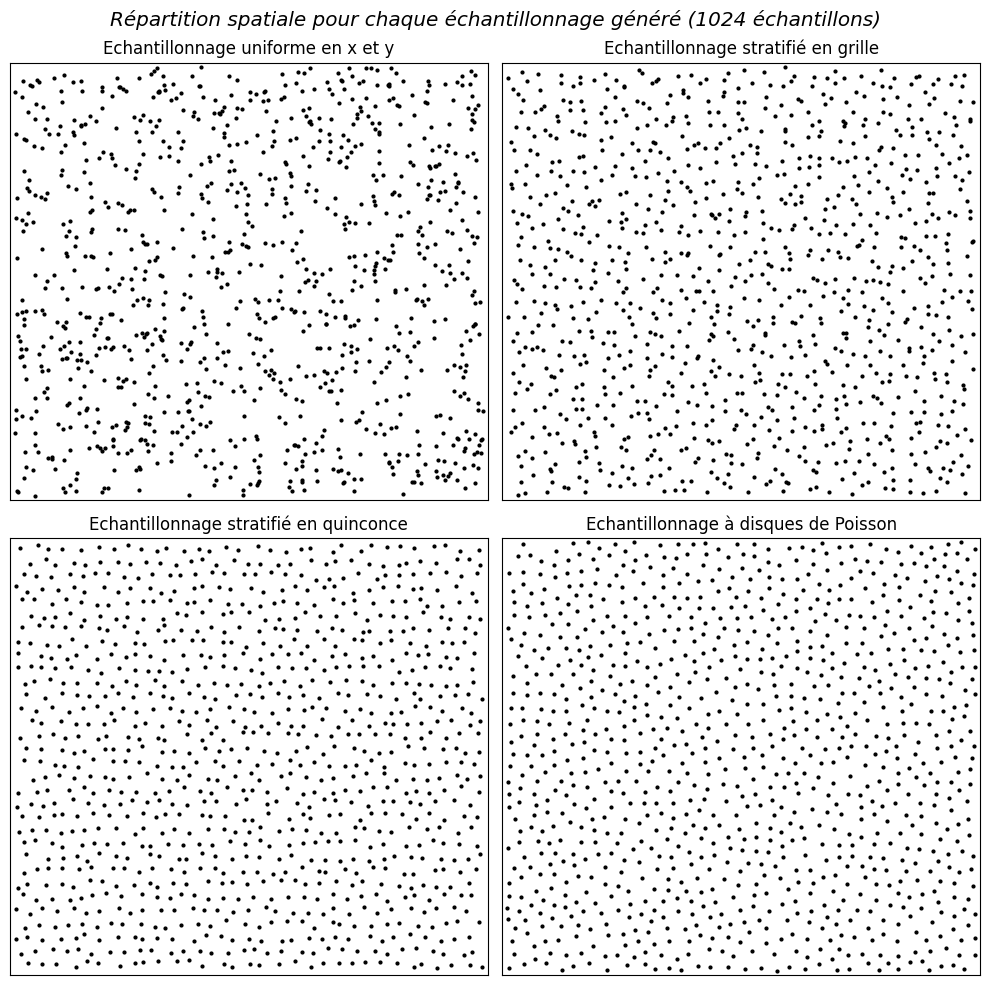

In [62]:
samplings = ((1, 'Echantillonnage uniforme en x et y', up), (2, 'Echantillonnage stratifié en grille', gp),
  (3, 'Echantillonnage stratifié en quinconce', qp), (4, 'Echantillonnage à disques de Poisson', pp))

mp.figure(figsize=(10,10)); suptitle = 'Répartition spatiale pour chaque échantillonnage généré'
for fig, title, points in samplings: # itération sur les échantillonnages générés
  mp.subplot(2, 2, fig); mp.xticks([]); mp.yticks([]) # création d'une sous-figure par échantillonnage
  mp.plot(*points.T, 'ko', ms=2); mp.axis([-0.01,1.01,-0.01,1.01]); mp.title(title) # tracé des échantillons
mp.suptitle(f"{suptitle} ({n*n} échantillons)", size='x-large', style='italic'); mp.tight_layout()

On constate que l'échantillonnage uniforme est assez catastrophique quant à la répartition spatiale des échantillons : il y a de grandes zones du domaine sans aucun échantillon, et à l'inverse, beaucoup de zones avec une densité d'échantillonnage très forte. La stratification en grille permet de résoudre facilement le problème des zones sous-échantillonnées, puisqu'elle assure que chacune des 1024 cellules de la grille de stratification va contenir exactement un échantillon. Par contre, elle ne permet pas d'éviter la création de zones à forte densité d'échantillonnage puisqu'on peut avoir jusqu'à 4 voisins très proches, à la jonction des cellules, ce qui se produit à plusieurs endroits dans notre exemple. A l'inverse, la stratification en quinconque va fortement réduire les zones de forte densité car, par construction, il ne peut jamais y avoir plus de deux points très proches, ce que l'on peut également constater sur la répartition obtenue. Et enfin, l'échantillonnage par disques de Poisson donne très clairement le résultat le plus homogène, avec une très grand régularité dans la distance entre les voisins. Par contre, comme on l'a vu, le processus est extrêmement coûteux comparé aux trois autres techniques. De plus, à la différence des 3 autres stratégies, on ne contrôle pas directement le nombre total d'échantillons générés avec la fonction **`PoissonDisk`**, il faut jouer sur les valeurs des paramètres **`radius`** et **`ncandidates`** jusqu'à tomber sur un nombre d'échantillons proches du nombre souhaité, ce qui est très chronophage puisque chaque nouveau calcul prend plusieurs secondes, voire davantage.

Une analyse rapide de la distribution des distances au plus proche voisin pour chaque échantillon, confirme numériquement cette observation visuelle : le rapport entre la distance maximale et la distance minimale des couples de voisins les plus proches donne un facteur 50.5 pour l'échantillonnage uniforme, 16.6 pour la stratification en grille, 2.9 pour la stratification en quinconce et seulement 1.6 pour les disques de Poisson :

In [63]:
print('Analyse des distances au plus proche voisin, pour chaque échantillonnage généré')
for fig, title, points in samplings: # itération sur les échantillonnages générés
  dist = sp.distance_matrix(points, points) # calcul des distances entre toutes les paires de points
  np.fill_diagonal(dist, 1) # remplacement des valeurs 0 par 1 sur la diagonale
  ndist = np.min(dist, axis=1) # extraction de la distance minimale par échantillon (= nearest neighbor)
  nmin, nmax, nmean, nstd = ndist.min(), ndist.max(), ndist.mean(), ndist.std() # statistiques descriptives
  print(f"● {title}\n  min = {nmin:.2e} max = {nmax:.2e} max/min = {nmax/nmin:.1f}", end=' ')
  print(f"moyenne = {nmean:.2e} écart-type = {nstd:.2e}")

Analyse des distances au plus proche voisin, pour chaque échantillonnage généré
● Echantillonnage uniforme en x et y
  min = 1.18e-03 max = 5.94e-02 max/min = 50.5 moyenne = 1.57e-02 écart-type = 8.56e-03
● Echantillonnage stratifié en grille
  min = 2.69e-03 max = 4.47e-02 max/min = 16.6 moyenne = 1.96e-02 écart-type = 7.02e-03
● Echantillonnage stratifié en quinconce
  min = 1.33e-02 max = 3.82e-02 max/min = 2.9 moyenne = 2.46e-02 écart-type = 4.31e-03
● Echantillonnage à disques de Poisson
  min = 2.50e-02 max = 3.99e-02 max/min = 1.6 moyenne = 2.72e-02 écart-type = 2.26e-03


---
#### b - Triangulation de Delaunay

L'un des opérateurs de géométrie algorithmique les plus classiques consiste à prendre un nuage de points et à lui ajouter une structure topologique permettant d'établir des relations de voisinage. Dans un espace affine de dimension *d*, la structure topologique élémentaire s'appelle un [**simplexe**](https://fr.wikipedia.org/wiki/Simplexe) et se compose de *d+1* points reliés par *d+1* simplexes de dimension *d–1*, processus qui s'applique récursivement jusqu'à la dimension 0. Dans les espaces de dimension 0, 1, 2, 3 et 4, les simplexes correspondent respectivement au **point**, au **segment**, au **triangle**, au **tétraèdre** et au **pentachore** (les simplexes des autres dimensions *d* n'ont pas de noms spécifique en dehors de **d-simplexe**). Ainsi un pentachore (dimension 4) est composé de cinq tétraèdres (dimension 3) dont chacun se compose de quatre triangles (dimension 2) eux-même composés de trois segments (dimension 1) qui vont relier deux points (dimension 0). La structure topologique globale formée par l'union de tous les simplexes reliant les différents points, s'appelle un ***maillage simplicial.***

Il existe évidemment une infinité de manières de générer ce maillage simplicial pour un nuage de points. Le mathématicien russe Boris Delaunay a proposé en 1924, un critère géométrique permettant de relier tous les points d'un nuage 2D par un ***ensemble de triangles dont on maximise l'angle minimal***, ce qui permet d'éviter les triangles "effilés" et correspond ainsi à une forme d'optimalité du processus. Il s'avère que cette construction topologique, appelée [**triangulation de Delaunay**](https://fr.wikipedia.org/wiki/Triangulation_de_Delaunay), se généralise en dimension quelconque, en remplaçant les triangles par les simplexes de la dimension considérée.

Le module **`scipy.spatial`** possède une classe **`Delaunay`** qui permet de générer et stocker ce maillage simplicial pour une dimension arbitraire, à partir d'un nuage de points passé en paramètre. Dans le cas 2D, la fonction **`triplot`** du package **matplotlib** permet d'afficher de manière graphique, la triangulation générée. Cela permet d'obtenir et de visualiser très facilement la triangulation pour les quatre échantillonnages stochastiques générés précédemment :

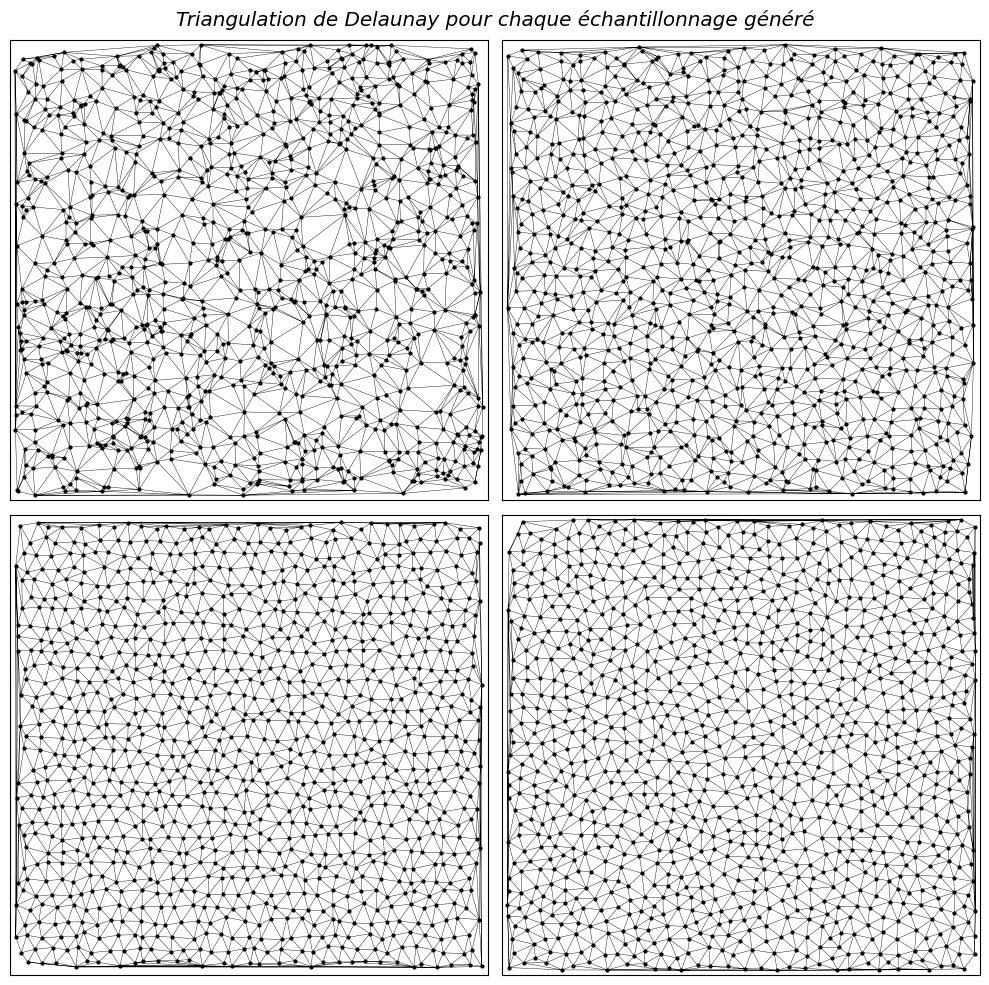

In [64]:
mp.figure(figsize=(10,10)); suptitle = 'Triangulation de Delaunay pour chaque échantillonnage généré'
for fig, title, points in samplings: # itération sur les échantillonnages générés
  mp.subplot(2, 2, fig); mp.xticks([]); mp.yticks([]) # création d'une sous-figure par échantillonnage
  tri = sp.Delaunay(points) # calcul de la triangulation de Delaunay à partir des échantillons
  mp.triplot(*points.T, tri.simplices, c='k', lw=0.3) # tracé des triangles obtenus
  mp.plot(*points.T, 'ko', ms=2); mp.axis([-0.01, 1.01, -0.01, 1.01]) # tracé des échantillons
mp.suptitle(suptitle, size='x-large', style='italic'); mp.tight_layout()

La différence d'homogénéïté des quatre échantillonnages est encore plus flagrante lorsqu'on leur applique une triangulation de Delaunay : on part avec des triangles de tailles et de formes extrêmement variées pour l'échantillonnage uniforme, pour obtenir progressivement des triangles beaucoup plus similaires pour les autres échantillonnages, et même des triangles quasi-équilatéraux pour l'échantillonnage en disques de Poisson.

Néanmoins, il faut savoir que, par défaut, la fonction **`Delaunay`** tente de créer le maximum de triangles sur le nuage de points, ce qui produit des résultats assez peu satisfaisant sur la périphérie du nuage, avec la création de nombreux triangles très effilés servant à relier les points proches des frontières du domaine. Pour éviter cela, il faut rajouter un post-traitement au processus, dont le rôle sera d'identifier les triangles effilés pour les supprimer. La solution la plus simple consiste à calculer les cosinus des angles du triangle (ce qui se fait avec un simple produit scalaire) et retirer tous les triangles dont le cosinus maximal dépasse un seuil donné (par exemple, un angle de 0.2 radians correspond à un seuil de 0.98 pour le cosinus) :

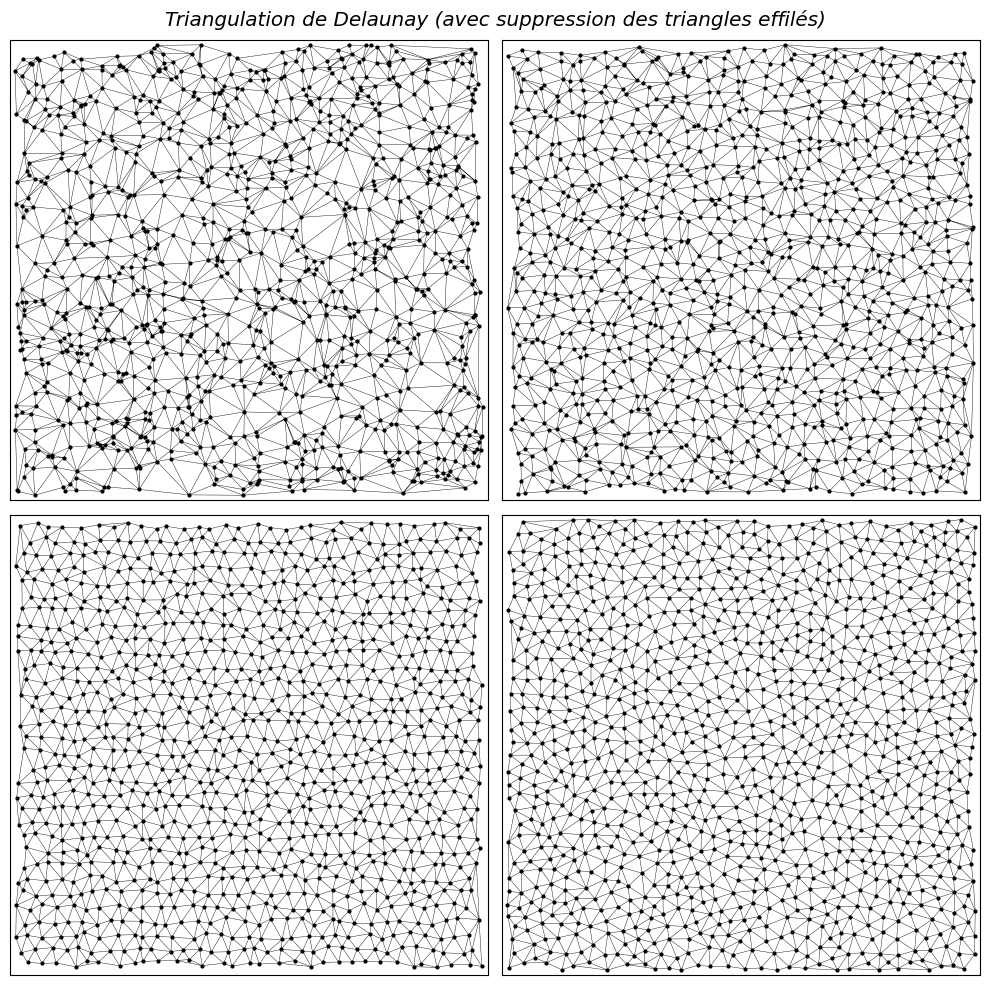

In [65]:
def max_cosine(points, tris):
  vertices = [points[tris[:, p]] for p in (0,1,2)] # extraction des sommets du triangle
  edges = [(vertices[p] - vertices[(p+1) % 3]) for p in (0,1,2)] # calcul des vecteurs associés aux arêtes
  edges = [e / np.linalg.norm(e, axis=1)[:, None] for e in edges] # normalisation des arêtes (longueur = 1)
  cosines = [np.abs(np.sum(edges[p]*edges[(p+1) % 3], axis=1)) for p in (0,1,2)] # calcul des cosinus
  return np.maximum.reduce(cosines) # retour de la liste des cosinus max pour chaque triangle

mp.figure(figsize=(10,10)); suptitle = 'Triangulation de Delaunay (avec suppression des triangles effilés)'
for fig, title, points in samplings: # itération sur les échantillonnages générés
  mp.subplot(2, 2, fig); mp.xticks([]); mp.yticks([]) # création d'une sous-figure par échantillonnage
  tri = sp.Delaunay(points) # calcul de la triangulation de Delaunay à partir des échantillons
  keep = max_cosine(points, tri.simplices) < 0.98 # filtre pour les triangles à conserver
  mp.triplot(*points.T, tri.simplices[keep], c='k', lw=0.3) # tracé des triangles conservés
  mp.plot(*points.T, 'ko', ms=2); mp.axis([-0.01, 1.01, -0.01, 1.01]) # tracé des échantillons
mp.suptitle(suptitle, size='x-large', style='italic'); mp.tight_layout()

---
#### c - Diagramme de Voronoï

Une triangulation de Delaunay peut être considérée comme un graphe, où les points du nuage jouent le rôle des sommets, et les côtés des triangles le rôle des arêtes. Or, on sait que tout graphe possède un [**graphe dual**](https://fr.wikipedia.org/wiki/Graphe_dual), obtenu en remplaçant chaque face par un sommet et chaque sommet par une face. En appliquant cet opérateur dual sur la triangulation de Delaunay, on obtient une autre structure topologique fondamentale, nommée [**diagramme de Voronoï**](https://fr.wikipedia.org/wiki/Diagramme_de_Vorono%C3%AF) en référence au
mathématicien russe Georgy Voronoï qui l'a définie et étudiée dans le cas des espaces affines de dimension arbitraire en 1908 (le cas 2D avait déjà été étudié au siècle précédent par Johann Dirichlet).

Autour de chaque point du nuage, appelé **noyau** selon le vocabulaire proposé par Voronoï, on va construire une **cellule** correspondant à l'ensemble des points de l'espace qui sont plus proches de ce noyau que de tout autre noyau du nuage, ce qui permet d'identifier une sorte de ***zone d'influence spatiale*** pour chaque point du nuage. Il faut noter que les termes **cellule** et **noyau** ont été choisis par analogie avec les cellules et noyaux biologiques, car un diagramme de Voronoï 2D est visuellement très similaire à certaines organisations cellulaires visibles au microscope.

Le module **`scipy.spatial`** possède une classe **`Voronoi`** qui permet de générer et stocker un diagramme de Voronoi pour une dimension arbitraire, à partir d'un nuage de points passé en paramètre. Dans le cas 2D, la fonction **`voronoi_plot_2d`** du même package permet d'afficher de manière graphique, les cellules générées. Cela permet d'obtenir et de visualiser très facilement le diagramme de Voronoi pour les quatre échantillonnages stochastiques générés précédemment :

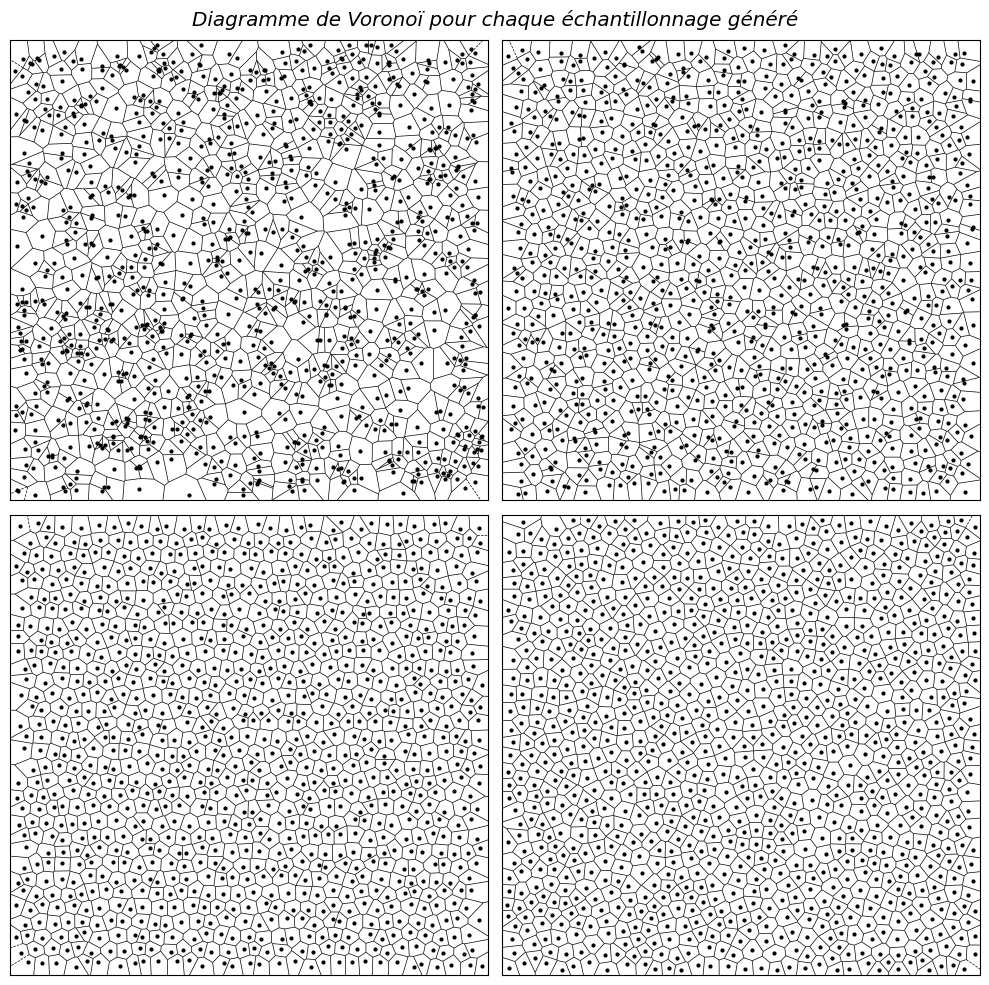

In [66]:
mp.figure(figsize=(10, 10)); suptitle = 'Diagramme de Voronoï pour chaque échantillonnage généré'
for fig, title, points in samplings: # itération sur les échantillonnages générés
  ax = mp.subplot(2, 2, fig); mp.xticks([]); mp.yticks([]) # création d'une sous-figure par échantillonnage
  vor = sp.Voronoi(points) # calcul du diagramme de Voronoi
  sp.voronoi_plot_2d(vor, ax=ax, show_vertices=False, show_points=False, line_width=0.5) # tracé du diagramme
  mp.plot(*points.T, 'ko', ms=2); mp.axis([-0.01, 1.01, -0.01, 1.01]) # tracé des échantillons
mp.suptitle(suptitle, size='x-large', style='italic'); mp.tight_layout()

Il faut signaler que les cellules sont ici tronquées par le carré unité utilisé comme domaine pour les échantillonnages générés, mais qu'en réalité les cellules associées aux noyaux en périphérie du nuage se prolongent à l'infini. En fait, l'union des cellules d'un diagramme de Voronoï forme une partition complète de l'espace affine dans lequel se trouve le nuage de points, c'est pour cela que l'expression ***partition de Voronoï*** est une dénomination alternative assez fréquente lorsqu'on inclut les cellules infinies localisées sur la périphérie du nuage. A l'inverse, le terme ***diagramme de Voronoï*** est plutôt utilisé lorsqu'on se réfère à la version finie, délimitée par l'enveloppe convexe du nuage de points.

---
#### d - Indexation spatiale (par grille régulière ou par KD-Tree)

Un autre opérateur de géométrie algorithmique très utile dans le domaine des Sciences des Données, est celui qui permet d'établir une structure topologique appelée [**indexation spatiale**](https://fr.wikipedia.org/wiki/Index_spatial). Une indexation spatiale correspond à un cas particulier de partitionnement spatial dans lequel chaque point de l'espace peut être efficacement associé à la cellule qui le contient. Dans l'idéal, l'opération qui permet d'associer un point quelconque à sa cellule devrait se faire en ***temps constant*** $O(1)$ ou à la rigueur avec une ***complexité logarithmique*** $O(\log n)$ où $n$ représente le nombre de cellules de la structure topologique. Ainsi, un partitionnement de Voronoï n'est pas considéré comme une indexation spatiale, car déterminer à quelle cellule est associé un point donné ne peut se faire que par itération sur l'ensemble des cellules, ce qui donne une complexité en $O(n)$

La structure d'indexation spatiale la plus simple est la ***grille régulière*** qui permet d'affecter un point quelconque à sa cellule en $O(1)$ par une simple quantification sur ses coordonnées. Pour illustrer le processus, le code ci-dessous permet de créer une grille $m×m$ et d'associer une même couleur à tous les points inclus dans une même cellule :

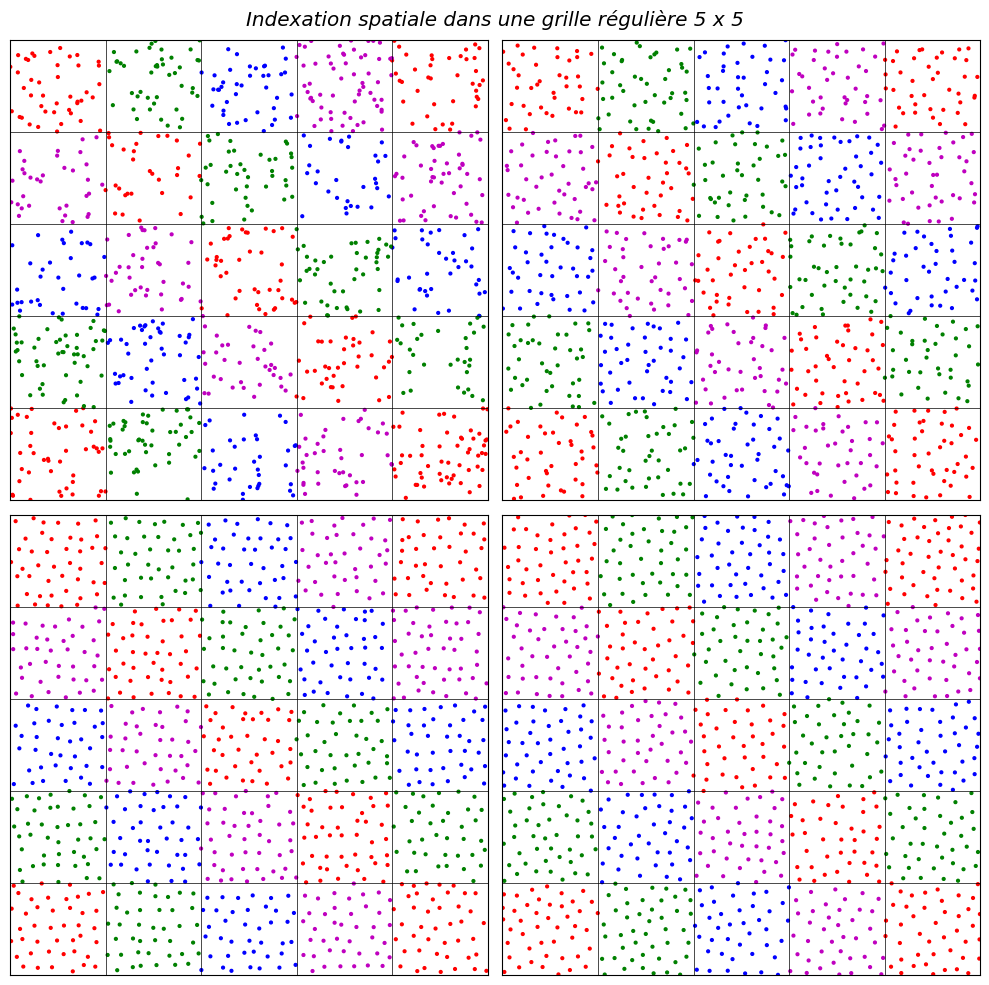

In [67]:
m = 5 # taille de la grille (tester avec m=2, m=15, m=50)
mp.figure(figsize=(10,10)); suptitle = 'Indexation spatiale dans une grille régulière 5 x 5'
for fig, title, points in samplings: # itération sur les échantillonnages générés
  mp.subplot(2, 2, fig); mp.xticks([]); mp.yticks([]) # création d'une sous-figure par échantillonnage
  grid = (points * m).astype(int) # création des indices dans la grille par quantification des coordonnées
  for p in range(1,m): mp.axhline(p/m, c='k', lw=0.5); mp.axvline(p/m, c='k', lw=0.5) # tracé des cellules
  colors = np.array(list('rgbm'))[(grid[:,0]+grid[:,1]) % 4] # association d'une couleur par cellule
  mp.scatter(*points.T, c=colors, marker='o', s=4); mp.axis([0,1,0,1]) # tracé des échantillons
mp.suptitle(suptitle, size='x-large', style='italic'); mp.tight_layout()

Une autre indexation spatiale d'utilisation extrêmement fréquente se base sur le [**KD-Tree**](https://fr.wikipedia.org/wiki/Arbre_kd), une structure d'arbre binaire qui, en partant d'un nuage de points, va diviser récursivement l'espace en deux sous-espaces équilibrés. Les hyperplans utilisés pour cette partition binaire récursive, sont alignés de manière cyclique sur les différentes coordonnées des points du nuage : par exemple en 3D, on va partitionner successivement selon les axes $x/y/z/x/y/z/$… L'indexation par KD-tree permet d'associer un point quelconque de l'espace au point le plus proche du nuage de points, avec une complexité $O(\log n)$. Les cellules de partitionnement obtenues par un KD-Tree correspondent donc implicitement aux cellules de Voronoï du nuage de points, même si les contours de ces cellules ne sont pas explicitement calculées. Encore plus intéressant : la même structure permet d'identifier les $p$ plus proches voisins d'un point quelconque de l'espace, avec une complexité $O(p\log n)$.

Le module **`scipy.spatial`** possède deux classes **`KDTree`** et **`cKDTree`** qui permettent de générer et stocker une structure de KD-Tree à partir d'un nuage de points passé en paramètre. La classe **`KDTree`** est écrite en Python pur et existe depuis les premières versions du package **scipy**, mais comme elle souffre d'une lenteur rédhibitoire lorsque la taille du nuage augmente, une version alternative **`cKDTree`**, écrite en C, a été incluse à partir de la version 0.12 de **scipy**. Cette version optimisée est entre 20 et 100 fois plus rapide que l'ancienne, selon le nombre de points du nuage. Il faut toutefois noter qu'à cause du phénomène classique de [**fléau de la dimension**](https://fr.wikipedia.org/wiki/Fl%C3%A9au_de_la_dimension) ou [***curse of dimensionality***](https://en.wikipedia.org/wiki/Curse_of_dimensionality), la complexité de recherche des voisins par un KD-Tree passe progressivement de $O(\log n)$ à $O(n)$ lorsque la dimension $d$ de l'espace augmente. Les auteurs du module **scipy.spatial** recommandent ainsi de ne pas utiliser la structure de KD-Tree pour des espaces de dimension supérieure à 10.

Pour illustrer la mise en oeuvre de l'indexation spatiale, le code suivant va combiner une structure de grille régulière et une structure de KD-Tree. Concrètement, les nuages de points correspondant à nos échantillonnages stochastiques sont répartis dans les cellules d'une grille $m×m$. On va ensuite identifier, grâce au KD-Tree, les échantillons les plus proches des centres des cellules, et pour chacun de ces points centraux, chercher et afficher les 15 voisins plus proches dans chaque cellule :

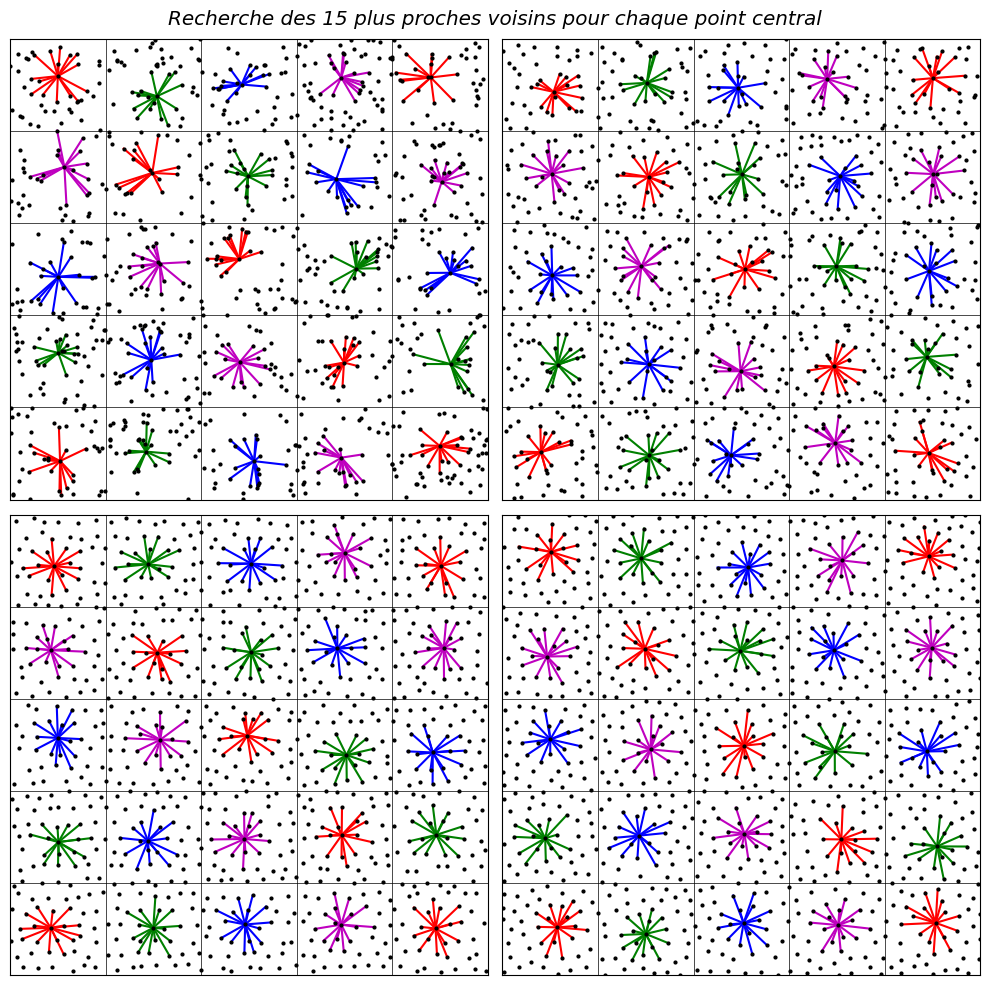

In [68]:
mp.figure(figsize=(10,10)); suptitle = 'Recherche des 15 plus proches voisins pour chaque point central'
neighbors = [[],[],[],[]] # initialisation de la liste des plus proches voisins pour les 4 distributions
for fig, title, points in samplings: # itération sur les échantillonnages générés
  mp.subplot(2, 2, fig); mp.xticks([]); mp.yticks([]) # création d'une sous-figure par échantillonnage
  tree = sp.cKDTree(points) # création du KDTree (version optimisée écrite en C)
  centers = np.mgrid[0.5:m,0.5:m].reshape(2,-1).T / m # calcul des centres des m x m cellules de la grille
  for p in range(1,m): mp.axhline(p/m, c='k', lw=0.5); mp.axvline(p/m, c='k', lw=0.5) # tracé des cellules
  centers = points[tree.query(centers, k=1)[1]] # extraction des échantillons les plus proches des centres

  for p, (x, y) in enumerate(centers): # itération sur les échantillons centraux aux différentes cellules
    color = 'rgbm'[p%4] # alternance entre 4 couleurs pour différencier les cellules de la grille
    dists, indices = tree.query((x, y), k=16) # recherche des 15 voisins les plus proches (+ point central)
    neighbors[fig-1].append(points[indices]) # ajout des coordonnées des voisins de la distribution courante
    for q in indices: nx, ny = points[q]; mp.plot((x,nx), (y,ny), '-', c=color) # segments vers les voisins
  mp.plot(*points.T, 'ko', ms=2); mp.axis([0,1,0,1]) # tracé des échantillons
mp.suptitle(suptitle, size='x-large', style='italic'); mp.tight_layout()

---
#### e - Enveloppe convexe

Le dernier opérateur de géométrie algorithmique fourni par le module **scipy.spatial** est fourni par la classe **`ConvexHull`** qui permet de calculer et de stocker l'[**enveloppe convexe**](https://fr.wikipedia.org/wiki/Enveloppe_convexe) d'un ensemble de points d'un espace de dimension arbitraire. Une enveloppe convexe est définie comme l'ensemble des [**combinaisons barycentriques**](https://fr.wikipedia.org/wiki/Combinaison_convexe) des points considérés, autrement dit, toutes les combinaisons linéaires dont les coefficients de pondération forment une partition de l'unité. Du point de vue géométrique, une enveloppe convexe d'un ensemble de points correspond au ***plus petit polytope contenant tous les points de l'ensemble ainsi que l'intégralité des segments entre toutes les paires de points***.

Pour illustrer la mise en oeuvre, nous allons réutiliser les groupes des 15 plus proches voisins des points centraux des cellules, générées ci-dessus, pour calculer et afficher les enveloppes convexes associées à  chacun de ces groupes de voisins :

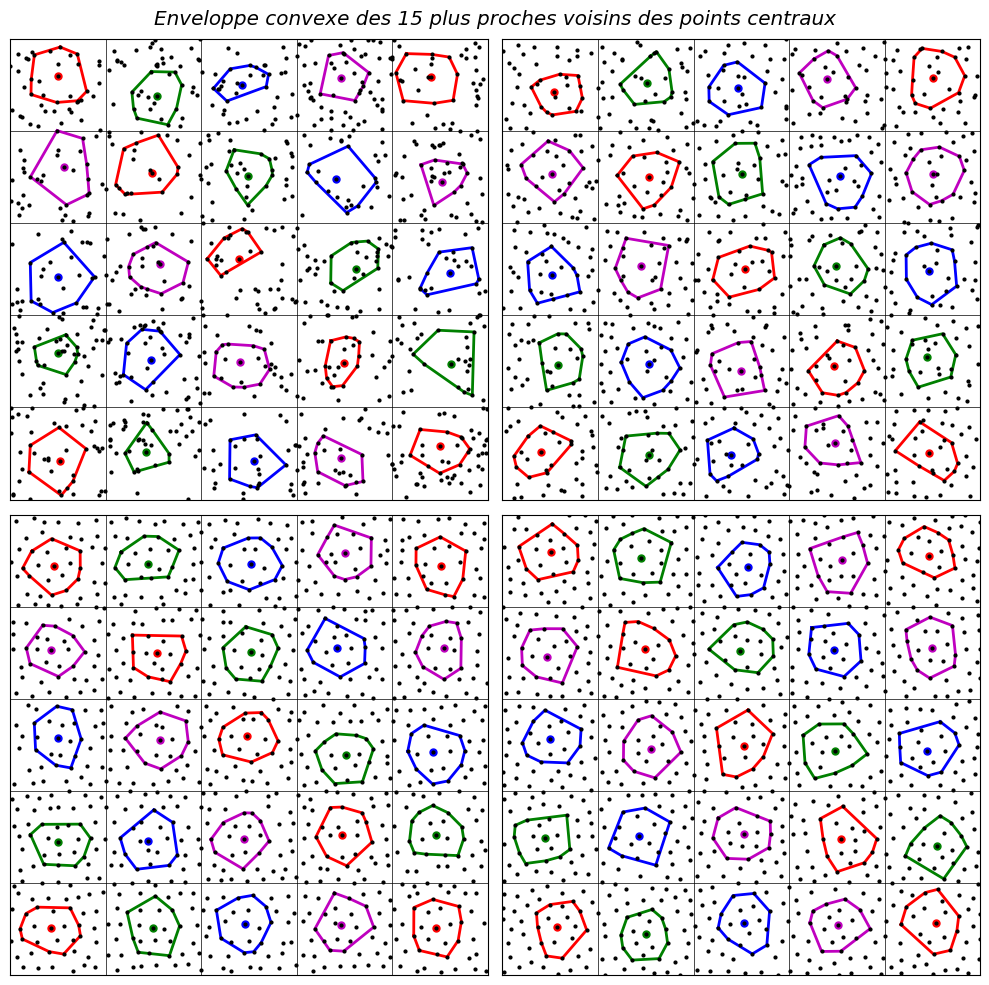

In [69]:
mp.figure(figsize=(10,10)); suptitle = 'Enveloppe convexe des 15 plus proches voisins des points centraux'
for fig, title, points in samplings: # itération sur les échantillonnages générés
  mp.subplot(2, 2, fig); mp.xticks([]); mp.yticks([]) # création d'une sous-figure par échantillonnage
  for p in range(1,m): mp.axhline(p/m, c='k', lw=0.5); mp.axvline(p/m, c='k', lw=0.5) # tracé des cellules
  for p, group in enumerate(neighbors[fig-1]): # itération sur les différents groupes de voisins
    color = 'rgbm'[p%4]; mp.plot(*group[0], 'o', ms=5, c=color) # affichage du point central du groupe
    hull = sp.ConvexHull(group) # calcul de l'enveloppe convexe des 15 voisins
    hull = hull.points[np.r_[hull.vertices, hull.vertices[0]]] # extraction des points de l'enveloppe convexe
    mp.plot(*hull.T, '-', c=color, lw=2) # affichage de l'enveloppe convexe
  mp.plot(*points.T, 'ko', ms=2); mp.axis([0,1,0,1]) # affichage des échantillons
mp.suptitle(suptitle, size='x-large', style='italic'); mp.tight_layout()

Dans les figures obtenues pour les quatre échantillonnages testés, il semble que les enveloppes convexes les plus régulières en forme et surtout en taille, sont celles produites par la stratification en quinconce. Une analyse rapide de la distribution des aires des polygones obtenus permet de confirmer numériquement cette observation visuelle : le rapport entre l'aire maximale et l'aire minimale pour les 25 enveloppes convexes associées à la grille, donne un facteur 2.6 pour l'échantillonnage uniforme, 1.5 pour la stratification en grille et pour les disques de Poisson, mais seulement de 1.2 pour la stratification en quinconce :

In [70]:
print("Analyse de l'aire des enveloppes convexes des plus proches voisins")
for fig, title, points in samplings: # itération sur les échantillonnages générés
  area = np.array([sp.ConvexHull(n).volume for n in neighbors[fig-1]]) # calcul des aires des enveloppes
  amin, amax, amean, astd = area.min(), area.max(), area.mean(), area.std() # statistiques descriptives
  print(f"● {title}\n  min = {amin:.2e} max = {amax:.2e} max/min = {amax/amin:.1f}", end=' ')
  print(f"moyenne = {amean:.2e} écart-type = {astd:.2e}")

Analyse de l'aire des enveloppes convexes des plus proches voisins
● Echantillonnage uniforme en x et y
  min = 5.26e-03 max = 1.35e-02 max/min = 2.6 moyenne = 8.86e-03 écart-type = 2.43e-03
● Echantillonnage stratifié en grille
  min = 7.05e-03 max = 1.07e-02 max/min = 1.5 moyenne = 9.45e-03 écart-type = 1.03e-03
● Echantillonnage stratifié en quinconce
  min = 8.83e-03 max = 1.08e-02 max/min = 1.2 moyenne = 9.76e-03 écart-type = 5.47e-04
● Echantillonnage à disques de Poisson
  min = 8.28e-03 max = 1.13e-02 max/min = 1.4 moyenne = 1.01e-02 écart-type = 7.39e-04


<h2 style="padding:16px; color:#FFF; background:#06D">D - Modules pour le traitement du signal</h2>

### 1 - Module 'scipy.fft'

Le module [**scipy.fft**](https://docs.scipy.org/doc/scipy/tutorial/fft.html) fournit une large panoplie d'outils pour effectuer des transformations d'un signal de dimension arbitraire, entre son ***domaine spatial*** et son ***domaine spectral***, en appliquant la [**transformation de Fourier rapide**](https://fr.wikipedia.org/wiki/Transformation_de_Fourier_rapide) (*Fast Fourier Transform* ou **FFT**) ou sa **réciproque** (*Inverse Fast Fourier Transform* ou **IFFT**). Le domaine spectral d'un signal permet d'étudier les différentes fréquences qui régissent ses variations, ce qui possède évidemment de très nombreuses applications dans le domaine des Sciences des Données, notamment lorsqu'on cherche à identifier des cycles ou des pseudos-cycles dans l'évolution des données mesurées. D'ailleurs l'algorithme de la FFT, publié en 1965 par Cooley et Tuckey, mais initialement développé par Gauss en 1805, a été élu comme l'***algorithme numérique le plus important du 20e siècle***, par un sondage au sein des membres de la société IEEE en 2000.

> **Note :** Il faut signaler que le package **numpy** possède également un module **`numpy.fft`** permettant d'utiliser la **FFT** sur des matrices 1D ou 2D, mais celui-ci est moins complet et surtout beaucoup moins performant que **`scipy.fft`**. Par conséquent, étant donné que **scipy** est toujours installé dans l'écosystème Scientific Python, il est recommandé d'utiliser systématiquement le module de **scipy** et d'oublier la version **numpy**, ce qui rejoint la remarque faite précédemment pour le module **`numpy.linalg`** qui souffre des mêmes limitations par rapport au module équivalent **`scipy.linalg`**

En réalité, il faudrait parler de **FDFT** ***(Fast Discrete Fourier Transform)*** au lieu de **FFT** car l'algorithme ne traite pas le cas des signaux continus, mais uniquement le cas des ***signaux discrets obtenu par échantillonnage uniforme de signaux continus***, ce qui correspond à une [**transformation de Fourier discrète**](https://fr.wikipedia.org/wiki/Transformation_de_Fourier_discr%C3%A8te). Plus précisément, dans le cas 1D, l'algorithme **FFT** part d'une séquence de $n$ échantillons $\{x_p\}$ avec $p \in \{0..n–1\}$ dans le domaine spatial, et calcule une séquence de $n$ composantes $\{X_p\}$ dans le domaine spectral, par la transformation suivante :
$$
{\sf FFT :}\quad X_p = \sum_{k=0}^{n–1} x_k\; e^{–2\pi i kp/n} = \sum_{k=0}^{n–1} x_k\, \left(\cos \frac{2\pi kp}{n} - i \sin \frac{2\pi kp}{n} \right)
$$
Chaque composante spectrale $X_p$ correspond à l'***harmonique d'ordre $p$*** du signal qui est une sinusoïde complexe associée à la fréquence discrète $f_p = \frac{p}{n}$ exprimée en cycles par échantillon. Autrement dit, l'harmonique d'ordre $p$ va osciller $p$ fois sur la séquence des $n$ échantillons spatiaux, et l'harmonique d'ordre 0 correspond à la composante constante du signal. Il est important de noter que la complexité $O(n\log_2 n)$ dont bénéficie la FFT est une conséquence directe de la stratégie [**divide-and-conquer**](https://fr.wikipedia.org/wiki/Diviser_pour_r%C3%A9gner_(informatique)) utilisée par l'algorithme, c'est-à-dire un processus récursif par dichotomie. Par conséquent, l'algorithme sera ***beaucoup plus efficace lorsque le nombre d'échantillons $n$ correspond à une puissance de deux***.

De même l'algorithme **IFFT**, s'obtient par la transformée inverse suivante :
$$
{\sf IFFT :}\quad x_p = \frac{1}{n} \sum_{k=0}^{n–1} X_k\; e^{2\pi i kp/n} = \frac{1}{n} \sum_{k=0}^{n–1} X_k\, \left(\cos \frac{2\pi kp}{n} + i \sin \frac{2\pi kp}{n} \right)
$$

La transformée de Fourier met en oeuvre des combinaisons linéaires d'exponentielles complexes, ce qui signifie qu'elle fournit toujours un spectre dans le domaine des nombres complexes, même lorsque le signal de départ ne contient que des nombres réels. Ces nombres complexes peuvent être représentés par une **partie réelle** et une **partie imaginaire** lorsqu'on définit la valeur en coordonnées rectangulaires, ou alors par une **amplitude** et une **phase** lorsqu'on est en coordonnées polaires.

Or dans le cadre des Sciences des Données, l'information pertinente se limite presque systématiquement aux amplitudes des composantes spectrales, et non à leur phase. Par conséquent, au lieu d'utiliser les valeurs complexes $\{X_p\}$ directement, on va systématiquement effectuer la transformation $S_p = |X_p|^2$, qui ne fournit que des valeurs réelles positives. La séquence des valeurs réelles $\{S_p\}$ s'appelle la ***densité spectrale*** et correspond à l'outil d'analyse le plus intuitif dans le domaine spectral : en gros, chaque $S_p$ est proportionnel à la quantité d'énergie portée par chacune des harmoniques du signal de départ.

> **Note :** Pour les signaux continus, il existe deux variantes de la densitée spectrale : lorsque le signal est défini sur un domaine fini (typiquement un signal temporel qui devient nul au bout d'un temps donné), on parle de ***densité spectrale d'énergie***, et lorsque le signal est défini sur un domaine infini (typiquement un signal stationnaire ou un signal périodique), on parle de ***densité spectrale de puissance***. Pour les signaux discrets, traités par la FFT, cette distinction n'existe pas vraiment puisqu'on utilise toujours un échantillonnage fini en entrée. Autrement dit, on ne sait pas si le signal originel est borné, stationnaire ou périodique, d'où le recours au terme ***densité spectrale***, sans autre précision.

In [71]:
import scipy.fft as fft
inspect(fft, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

● NAME = scipy.fft / TYPE = module
● ROLE = Discrete Fourier transforms (:mod:`scipy.fft`)

● FUNCTIONS
dct                 dctn                dst                 dstn                
fft                 fft2                fftfreq             fftn                
fftshift            fht                 fhtoffset           get_workers         
hfft                hfft2               hfftn               idct                
idctn               idst                idstn               ifft                
ifft2               ifftn               ifftshift           ifht                
ihfft               ihfft2              ihfftn              irfft               
irfft2              irfftn              next_fast_len       prev_fast_len       
register_backend    rfft                rfft2               rfftfreq            
rfftn               set_backend         set_global_backend  set_workers         
skip_backend        test                


Comme le montre le résultat de la fonction **`inspect`**, le nombre de fonctions fournies par le module est assez limité, surtout si l'on considère qu'il y a plusieurs variantes pour la même fonction, selon la dimension de l'espace des données. La règle de nommage est d'ailleurs assez simple :

- Les noms de fonctions qui n'ont pas de suffixe correspondent au cas de l'espace 1D<br>
  `fft, ifft, dct, idct, dst, idst, rfft, irfft, hfft, ihfft`
- Les noms de fonction avec le suffixe **`2`** correspondent au cas de l'espace 2D<br>
  `fft2, ifft2, rfft2, irfft2, hfft2, ihfft2`
- Les noms de fonctions avec le suffixe **`n`** correspondent au cas de l'espace nD<br>
  `fftn, ifftn, dctn, idctn, dstn, idstn, rfftn, irfftn, hfftn, ihfftn`

et on différencie ces cinq grandes variantes de la FFT :

- FFT générale **`fft / ifft`** : signal complexe périodique $⇄$ spectre complexe
- FFT optimisée **`hfft / ihfft`** : signal réel périodique $⇄$ spectre complexe hermitien (= symétrique conjugué)
- FFT optimisée **`rfft / irfft`** : signal réel périodique $⇄$ demi-spectre complexe (= partie réelle positive)
- Transformée en cosinus discrète **`dct / idct`** : signal réel à symétrie paire $f(–x) = f(x) ⇄$ spectre réel
- Transformée en sinus discrète **`dst / idst`** : signal réel à symétrie impaire $f(–x) = –f(x) ⇄$ spectre réel

---
#### a - Transformation de Fourier 1D

Pour illustrer la mise en oeuvre de la FFT pour un signal de dimension 1, nous allons reprendre l'exemple de la simulation de mesures expérimentales bruitées, utilisé dans la section A2, mais avec une fonction théorique plus complexe et surtout des mesures beaucoup plus bruitées, comme on peut le constater sur la figure ci-dessous :
$$ f(x) = 3 + 2 \sin(x–1) + \frac{3}{2}\; \sin(1–\frac{7}{2}x)\; {\sf e}^{\textstyle –x^2/120} $$

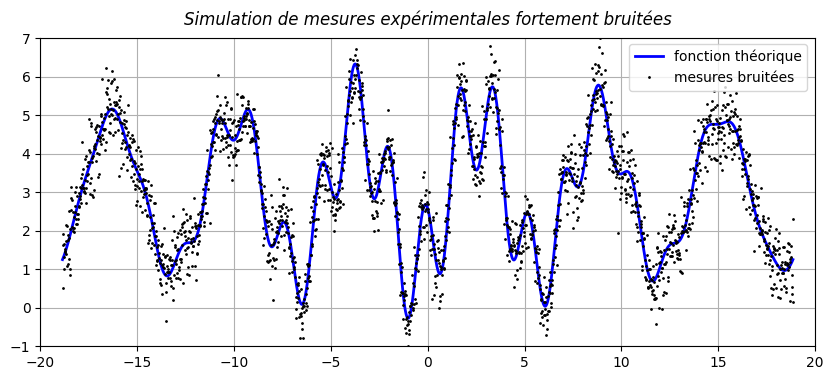

In [72]:
f = lambda x: 3 + 2*np.sin(x-1) + 1.5*np.exp(-x*x/120)*np.sin(1-3.5*x) # définition de la fonction de test
n = 2048 # nombre d'échantillons utilisés pour la FFT (plus efficace lorsque 'n' est une puissance de 2)
np.random.seed(10); noise = np.random.normal(0, 0.5, n) # création d'une perturbation pour les mesures
x = np.linspace(-6*np.pi, 6*np.pi, n); theo = f(x) # échantillonnage de la fonction théorique
expe = f(x) + noise # simulation mesures fortement bruitées par perturbation gaussienne (écart-type = 0.4)

mp.figure(figsize=(10,4), dpi=100); title = 'Simulation de mesures expérimentales fortement bruitées'
mp.plot(x, theo, 'b-', lw=2, label='fonction théorique') # fonction théorique en bleu
mp.plot(x, expe, 'k.', ms=2, label='mesures bruitées') # mesures expérimentales bruitées en noir
mp.axis([-20,20,-1,7]); mp.legend(loc=(0.76,0.83)); mp.title(title, style='italic', pad=10); mp.grid()

On dispose ainsi d'une séquence de 2048 échantillons à valeurs réelles (points noirs sur la figure), qui peut être considérée comme un signal discret correspondant aux mesures expérimentales d'un phénomène dont les variations temporelles exactes sont définies par une fonction théorique (courbe bleue). L'erreur de mesure a été volontairement exagérée pour simuler le cas où un second phénomène parasite (par exemple, un bruit ambiant) empêche l'obtention de mesures précises.

Il est important de rappeler que l'***algorithme de la FFT ne sait traiter que des signaux périodiques***, et par conséquent, il impose que les échantillons fournies en entrée correspondent à un multiple entier de la période supposée de la fonction. Ici, notre fonction de test n'est pas périodique, mais on sait qu'elle contient des éléments périodiques (les deux sinusoïdes qui interviennent dans son expression). C'est pour cela que l'on a choisi un intervalle $[-6\pi,6\pi]$ qui correspond à des cycles entiers pour ces sinusoïdes. Sur la figure, on peut facilement contrôler que l'on a choisi une fenêtre correcte : il faut vérifier que ***les échantillons tout à droite peuvent parfaitement se prolonger par les échantillons tout à gauche***, ce qui permet de créer une périodicité naturelle dans le signal. A partir du moment où cette condition est vérifiée sur les échantillons fournis, on peut utiliser la fonction **`fft`** du module **`scipy.fft`** pour obtenir la transformée de Fourier, puis calculer le carré de la norme de chaque coefficient complexe pour obtenir la densité spectrale discrète :

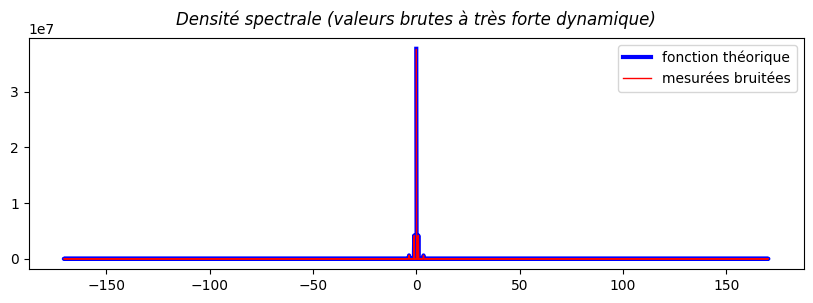

In [73]:
density = lambda z: z.real*z.real + z.imag*z.imag # calcul de la densité spectrale (= carré de la norme)

theoD = density(fft.fft(theo)) # densité spectrale de la fonction théorique
expeD = density(fft.fft(expe)) # densité spectrale des mesures expérimentales bruitées
freq = fft.fftfreq(n, d=(x[1]-x[0])/(2*np.pi)) # vecteur des fréquences harmoniques pour l'axe horizontal

mp.figure(figsize=(10,3), dpi=100); title = 'Densité spectrale (valeurs brutes à très forte dynamique)'
mp.plot(freq, theoD, 'b-', lw=3, label='fonction théorique') # spectre théorique en bleu
mp.plot(freq, expeD, 'r-', lw=1, label='mesurées bruitées') # spectre des mesures bruitées en rouge
mp.legend(); mp.title(title, style='italic', pad=10);

Le moins qu'on puisse dire est que la figure obtenue n'est pas très informative. On peut noter plusieurs défauts qui sont caractéristiques lorsqu'on affiche les valeurs brutes des coefficients d'une densité spectrale :

- Comme les données initiales sont à valeurs réelles et non complexes, la densité spectrale est forcément symétrique, donc la moitié de la figure n'apporte aucune information supplémentaire par rapport à l'autre moitié
- La dynamique des valeurs est énorme (entre 0 et 3.8E7) ce qui fait que la valeur centrale "écrase" toutes les autres qui deviennent illisibles
- Cela ne se voit pas forcément avec cette échelle d'affichage, mais il y a énormément de valeurs nulles ou quasi-nulles sur les extrémités du spectre, qui apportent donc très peu d'informations intéressantes à la figure

Pour corriger ces défauts et pouvoir générer des figures interprétables, on va donc systématiquement appliquer un post-traitement après le calcul de la densité spectrale. La première étape consiste à normaliser les valeurs entre 0 et 1 pour pouvoir facilement comparer plusieurs densités spectrales entre elles. Si on effectue une simple ***normalisation linéaire***, autrement dit simplement diviser les valeurs obtenues par la valeur maximale, on obtient bien des valeurs comprises entre 0 et 1, mais le ratio entre les valeurs fortes et les valeurs faibles restera identique, et la figure résultante ne sera pas plus lisible. La solution correcte passe donc par une ***normalisation non-linéaire*** qui va traiter différement les valeurs fortes et les valeurs faibles de la densité spectrale. Pour cela, il existe deux options classiquement utilisées en traitement du signal : la compression sigmoïde et la compression gamma qui utilisent deux fonctions de transformation dont le graphe est donné dans les figures suivantes :

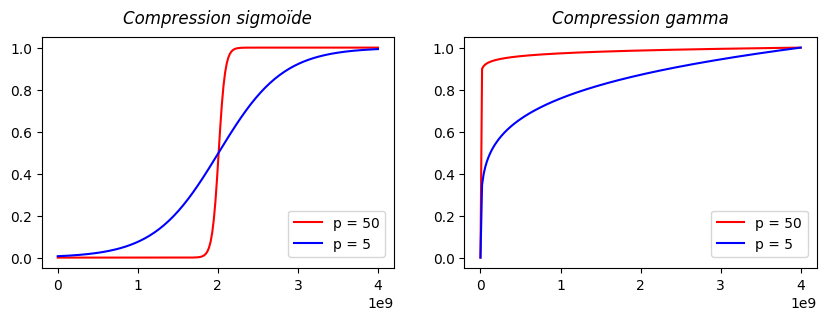

In [74]:
sigmo = lambda f, p=5: 1 / (1 + np.exp(p-p*f/f[f>0].mean())) # compression sigmoïde
gamma = lambda f, p=5: (f / f.max()) ** (1/p) # compression gamma

mp.figure(figsize=(10,3)); t = np.linspace(0, 4E9, 200) # les amplitudes initiales vont de 0 à 4 milliards
mp.subplot(1,2,1); mp.plot(t, sigmo(t,50), 'r-', label='p = 50'); mp.plot(t, sigmo(t), 'b-', label='p = 5')
mp.legend(loc=(0.7,0.05)); mp.title('Compression sigmoïde', style='italic', pad=10)
mp.subplot(1,2,2); mp.plot(t, gamma(t,50), 'r-', label='p = 50'); mp.plot(t, gamma(t), 'b-', label='p = 5')
mp.legend(loc=(0.7,0.05)); mp.title('Compression gamma', style='italic', pad=10);

Comme on peut le constater, les deux fonctions vont effectuer une normalisation non linéaire, en transformant l'échelle horizontale très vaste (ici les valeurs horizontales varient entre 0 et 4 milliards, ce qui est assez courant pour des amplitudes spectrales obtenues par une FFT) en une échelle verticale normalisée entre 0 et 1 ; c'est pour cette raison que l'on parle de ***compression de dynamique***. Néanmoins les deux méthodes n'ont pas le même rôle, et ne sont donc pas interchangeables :

- La fonction sigmoïde a une forme en **S** avec un point d'inflexion au centre de l'échelle initiale. Son effet est de diminuer les valeurs faibles et d'augmenter les valeurs fortes, ce qui procure une ***augmentation du contraste***. Le paramètre $p$ permet de contrôler la pente au point d'inflexion, et donc la force de l'effet appliqué (la valeur par défaut est $p = 5$)

- La fonction gamma a une forme de crosse de hockey. Son effet est d'augmenter toutes les valeurs après normalisation, en privilégiant les valeurs faibles par rapport aux valeurs fortes, ce qui procure un ***réhaussement des valeurs proches de zéro***. Le paramètre $p$ permet de contrôler la force du réhaussement qui est appliqué (la valeur par défaut est $p = 5$)

La seconde partie du post-traitment consiste à effectuer un ***filtrage harmonique***, qui va supprimer de la densité spectrale, la plupart des valeurs qui n'apportent pas d'informations utiles : d'une part, supprimer toutes les harmoniques négatives puisqu'elle sont symétriques par rapport aux harmoniques positives, et d'autre part, écarter toutes les harmoniques dont la fréquence dépassent un certain ratio par rapport à la fréquence la plus basse appelée ***fréquence fondamentale*** ou ***harmonique 1***, car pour de très nombreux exemples, l'amplitude de ces harmoniques élevées sera nulle ou quasi-nulle. Evidemment, le choix de cette harmonique maximale est variable selon les signaux considérés, mais il est généralement admis que l'affichage d'un spectre tronqué quelque part entre les harmoniques 20 à 25 est suffisant pour la plupart des applications. Avec les outils d'indexation fournis par **numpy**, le filtrage harmonique peut donc s'écrire en une ligne de code :
```
p = 20; keep = (freq >= 0) & (freq <= p) # 'p' définit l'harmonique maximale à conserver
```

Avec ces remarques, on peut donc régénérer la figure de la densité spectrale, en utilisant une compression sigmoïde accompagnée d'un filtrage harmonique pour $p=20$ :

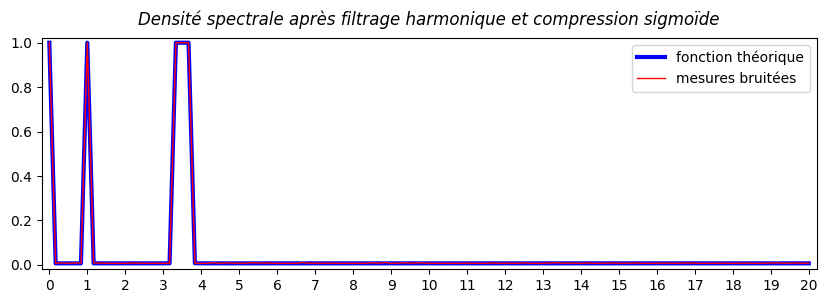

In [75]:
theoS, expeS = sigmo(theoD), sigmo(expeD) # compression sigmoïde des densités spectrales
cut = 20; keep = (freq >= 0) & (freq <= cut) # filtrage harmonique (harmonique d'ordre maximal à conserver)

mp.figure(figsize=(10,3)); title = 'Densité spectrale après filtrage harmonique et compression sigmoïde'
mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.02, 1.02])
mp.plot(freq[keep], theoS[keep], 'b-', lw=3, label='fonction théorique') # spectre théorique en bleu
mp.plot(freq[keep], expeS[keep], 'r-', lw=1, label='mesures bruitées') # spectre des mesures en rouge
mp.legend(); mp.title(title, style='italic', pad=10);

Le résultat est sans comparaison avec la figure précédente car cette nouvelle figure permet d'effectuer des observations très précises. On constate d'abord qu'à l'échelle d'affichage, les densités spectrales de la fonction théorique (en bleu) et des mesures bruitées (en rouge) se superposent parfaitement. Ensuite, on voit que le spectre est globalement composé de trois pics, ce qui est parfaitement cohérent avec la définition de la fonction de test qui est une somme à trois termes :

- Le premier pic est localisé à l'harmonique 0 (= composante constante du signal) et correspond au premier terme dans l'expression de $f(x)$, c'est-à-dire la constante additive 3
- Le second pic localisé à l'harmonique 1 correspond au terme proportionnel à $\sin x$ (= variation cyclique avec une fréquence angulaire de 1) dans l'expression de $f(x)$
- Le dernier pic localisé à l'harmonique 3.5 correspond au troisième terme dans l'expression de $f(x)$, celui qui est proportionnel à $\sin \frac{7}{2}x$ (= variation cyclique de fréquence angulaire de 3.5)
- On constate également que le troisième pic est plus large que les deux autres, ce qui s'explique par le fait qu'il est multiplié par une gaussienne dans l'expression de $f(x)$, dont la conséquence est de "flouter" la composante spectrale correspondante, ce qui va activer les fréquences voisines de l'harmonique 3.5 et ainsi produire cet élargissement du pic

Il faut signaler que dans la densité spectrale brute, ces trois pics n'ont pas la même hauteur, mais c'est la compression sigmoïde qui les a tous normalisés à une hauteur de 1. C'est évidemment une perte d'information par rapport aux données brutes, mais en contrepartie, cela fournit une fonction binaire qui permet d'identifier les éléments importants de la densité spectrale, fonction binaire qui pourra servir de masque pour d'autres opérations, comme on va le voir plus loin.

Regardons maintenant le résultat obtenu en remplaçant la compression sigmoïde par une compression gamma :

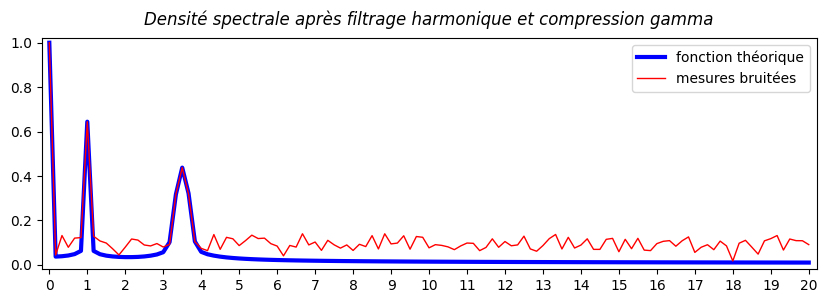

In [76]:
theoG, expeG = gamma(theoD), gamma(expeD) # compression gamma des densités spectrales

mp.figure(figsize=(10,3)); title = 'Densité spectrale après filtrage harmonique et compression gamma'
mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.02, 1.02])
mp.plot(freq[keep], theoG[keep], 'b-', lw=3, label='fonction théorique') # spectre théorique en bleu
mp.plot(freq[keep], expeG[keep], 'r-', lw=1, label='mesures bruitées') # spectre des mesures en rouge
mp.legend(); mp.title(title, style='italic', pad=10);

La nouvelle figure contient beaucoup plus d'informations que la précédente :

- On retrouve les trois pics localisés sur les mêmes harmoniques, mais comme la compression est moindre, on peut vérifier qu'il y a bien une différence de hauteur entre eux, et que le pic le plus large à l'harmonique 3.5 est bien pointu (= un seul maximum), alors que sur la figure précédente, la compression sigmoïde l'avait écrété pour créer un plateau au sommet

- On constate également que sur les trois pics, la densité spectrale des mesures et celle de la fonction théorique sont parfaitement superposées, mais qu'à l'extérieur de ces pics, les mesures présentent une densité spectrale qui forme des zig-zag aléatoires autour d'une valeur moyenne fixe, ce qui est la propriété caractéristique d'un [**bruit blanc**](https://fr.wikipedia.org/wiki/Bruit_blanc)

On comprend assez vite que si l'on arrivait à supprimer cette partie en zig-zag lié au bruit blanc généré par les erreurs de mesure, les densités spectrales rouge et bleue seraient beaucoup plus proches. Si on examine les données plus précisément, on voit que les zig-zag du bruit blanc oscillent entre 0.05 et 0.15, avec une moyenne proche de 0.1. Par conséquent, une solution très simple à mettre en oeuvre consisterait à dire que tout coefficient de la densité spectrale qui est inférieur à 0.15, correspond à des erreurs de mesure et devra donc être automatiquement mis à zéro. Ce type de raisonnement peut fonctionner, mais il implique d'analyser précisément la densité spectrale obtenue, de trouver le bon seuil avant de mettre les coefficients concernés à zéro, bref tout un processus qu'il est difficile d'automatiser par algorithme.

A l'inverse, nous avons vu que la compression sigmoïde fournit une fonction binaire qui vaut 1 pour les coefficients localisés dans les 3 pics et 0 pour tout le reste de la densité spectrale. Autrement dit, si on s'en sert comme coefficient multiplicatif, l'opération va garder intacts les coefficients des pics, mais annuler tous les autres. Cette opération s'appelle une ***application d'un masque binaire***, et avec les outils **numpy**, cela s'effectue en une seule instruction :

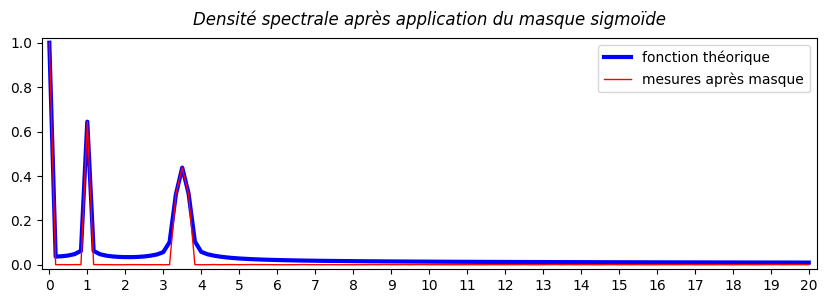

In [77]:
expeM = expeG * expeS # application du masque binaire sigmoïde à la densité spectrale

mp.figure(figsize=(10,3)); title = 'Densité spectrale après application du masque sigmoïde'
mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.02, 1.02])
mp.plot(freq[keep], theoG[keep], 'b-', lw=3, label='fonction théorique') # spectre théorique en bleu
mp.plot(freq[keep], expeM[keep], 'r-', lw=1, label='mesures après masque') # spectre après masque en rouge
mp.legend(); mp.title(title, style='italic', pad=10);

Le résultat semble assez convaincant dans le domaine spectral, même si le filtre appliqué est sûrement un peu trop brutal pour les fréquences basses (= la partie gauche de la densité spectrale) pour lesquelles la courbe rouge s'écarte un peu trop de la courbe bleue. Pour voir le résultat de ce traitement dans le domaine spatial, il faut appliquer le même masque aux données brutes du spectre complexe, puis appliquer la transformée de Fourier inverse, ce qui se fait en deux lignes de code :

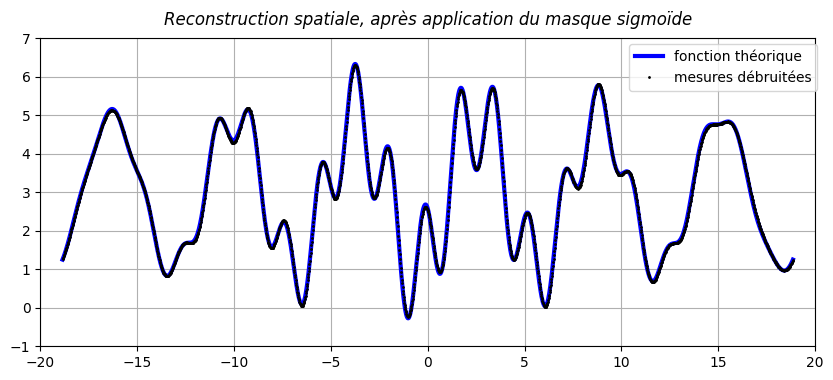

In [78]:
denoise = fft.fft(expe) * expeS # application du masque à la transformée de Fourier dans le domaine complexe
denoise = fft.ifft(denoise).real # reconstruction du signal réel par la transformée de Fourier inverse

mp.figure(figsize=(10,4), dpi=100); title = 'Reconstruction spatiale, après application du masque sigmoïde'
mp.plot(x, theo, 'b-', lw=3, label='fonction théorique') # fonction théorique en bleu
mp.plot(x, denoise, 'k.', ms=2, label='mesures débruitées') # mesures débruitées en noir
mp.axis([-20,20,-1,7]); mp.legend(loc=(0.76,0.83)); mp.title(title, style='italic', pad=10); mp.grid()

On constate que malgré l'extrême simplicité du filtre spectral mis en oeuvre, le résultat est quasiment parfait : toutes les perturbations aléatoires qui engendraient les erreurs de mesures ont été supprimées, et l'ensemble des échantillons mesurés sont revenus se recoller parfaitement sur la courbe théorique. Même si cet exemple peut sembler trop beau pour être représentatif d'un cas général, il s'avère que ce processus de débruitage donne des résultats impressionnants dans un très grand nombre de cas concrets de mesures expérimentales, car très souvent les erreurs de mesures prennent la forme d'un bruit blanc gaussien, similaire à la perturbation rajoutée artificiellement sur les échantillons de la fonction théorique.

---
#### b - Transformation de Fourier 2D

Pour illustrer la mise en oeuvre de la FFT pour un signal de dimension 2, nous allons reprendre l'exemple des différentes stratégies d'échantillonnages du carré unité, utilisé dans la section C2 (échantillonnage uniforme, stratification en grille, stratification en quinconce, échantillonnage par disques de Poisson). Mais cette fois-ci au lieu d'analyse les propriétés de ces différents échantillonnages dans le domaine spatial, nous allons les étudier dans le domaine spectral.

Dans la section C2, chacun de ces quatre échantillonnages était stocké dans une matrice de taille 1024 x 2 qui contenait les coordonnées $(x,y)$ des 1024 points-échantillons. Cette structure était bien adaptée aux outils du module **`scipy.spatial`** mais pas du tout à ceux du module **`scipy.fft`** qui, pour un signal 2D, attendent une matrice de taille $m × m$ stockant une fenêtre d'échantillonnage d'un signal continu. Pour pouvoir utiliser la FFT sur ces données, il faut donc créer une image binaire de taille $m × m$ et mettre à la valeur 1 tous les pixels qui contiennent un échantillon obtenu par la stratégie d'échantillonnage. Autrement dit, cela correspond à un processus de [**quantification**](https://fr.wikipedia.org/wiki/Quantification_(signal)) qui va transformer les coordonnées 2D réelles des échantillons, en coordonnées entières définies sur l'intervalle $\{0..m–1\}$.

Pour que la FFT donne des résultats intéressants, il faut que la taille de la matrice soit suffisamment grande, et comme la FFT est plus efficace lorsque cette taille correspond à une puissance de 2, une valeur de $m = 1024$ est fréquemment employée pour les signaux 2D, car considérée comme suffisante pour obtenir une image spectrale précise, tout en garantissant des temps de calcul très rapides. Mais pour avoir un signal suffisamment dense, on ne peut pas se contenter des 1024 échantillons qui avaient été utilisés dans la section C2, il faut un échantillonnage beaucoup plus dense pour que l'image spectrale nous fournisse des informations pertinentes. On va donc augmenter la taille de la grille de stratification pour la passer à 128 x 128, ce qui correspond à ***un total de 16384 échantillons***. Pour les trois premières statégies d'échantillonnage, on pourrait même aller au-delà puisque le processus de génération des échantillons est quasiment instantané. Par contre pour l'échantillonnage par disques de Poisson, on avait constaté qu'il fallait déjà plusieurs secondes pour obtenir les 1024 échantillons dans la section C2, et comme on va le voir ci-dessous, il va falloir plus d'une minute pour obtenir les 16384 échantillons, et ce temps augmente de manière quadratique avec le nombre d'échantillons souhaités :

In [79]:
n = 128; m = 1024; np.random.seed(0) # nombre d'échantillons = n x n, grille de quantification = m x m
up = np.random.rand(n*n+142,2) # création de points en excès pour compenser les collisions de quantification
up = np.unique((up*m).astype(int), axis=0) # suppression des points liés aux collisions de quantification
gp = np.mgrid[0:n,0:n].reshape(2,-1).T + np.random.rand(n*n, 2)
gp = (gp*m/n).astype(int) # stratification en grille + quantification
qp = (np.mgrid[0.2:n,0.2:n].reshape(2,-1).T + (0.6,0.6) * np.random.rand(n*n, 2))
qp[::2,0] += 0.5; qp[:,0] %= n; qp = (qp*m/n).astype(int) # stratification en quinconce + quantification

Pour la création des échantillons par disques de Poisson, le temps de calcul pour obtenir les 16384 échantillons va être extrêmement long, donc soyez patients en exécutant la cellule suivante :

In [80]:
from scipy.stats.qmc import PoissonDisk # import de la distribution à disques de Poisson

pp = PoissonDisk(d=2, radius=0.0062, seed=42, ncandidates=64).random(n*n) # !!! calcul très long !!!
pp = (pp*m).astype(int) # échantillonnage à disques de Poisson + quantification

Pour l'affichage de la répartition spatiale des échantillons générés, on réutilise le même code que dans la section C2 :

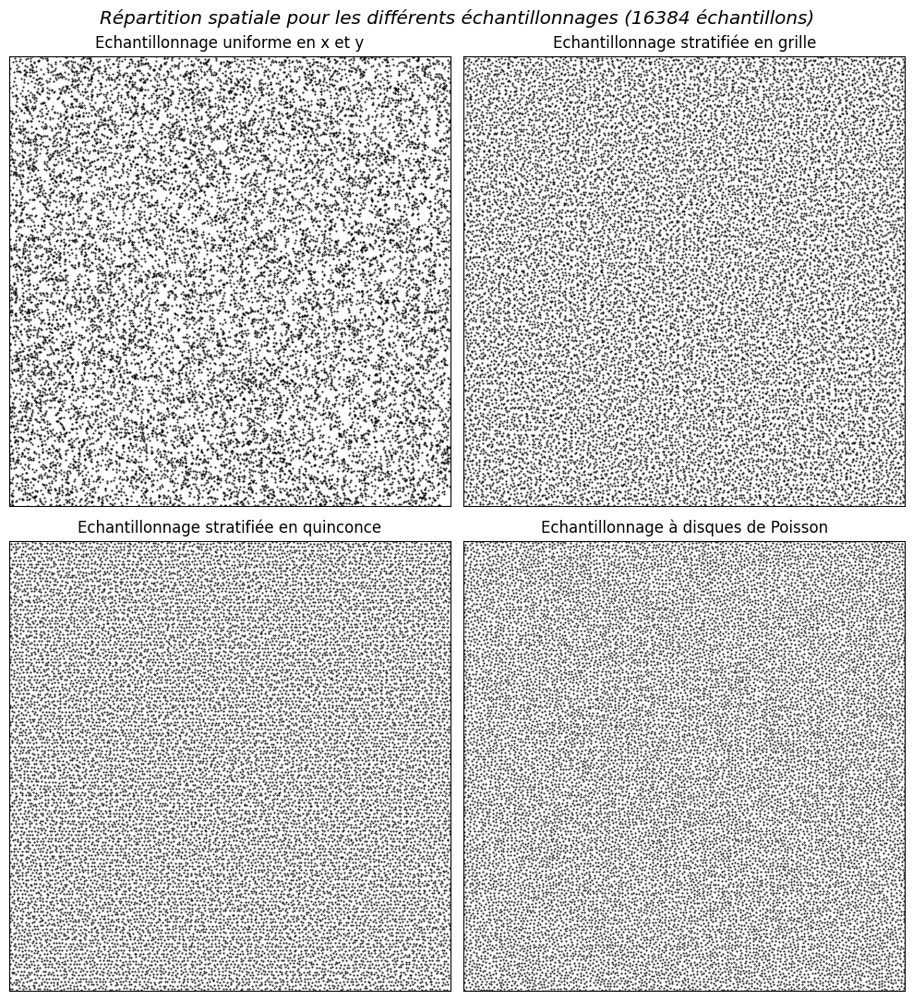

In [81]:
samplings = ((1, 'Echantillonnage uniforme en x et y', up), (2, 'Echantillonnage stratifiée en grille', gp),
  (3, 'Echantillonnage stratifiée en quinconce', qp), (4, 'Echantillonnage à disques de Poisson', pp))

mp.figure(figsize=(10,11), dpi=100); suptitle = 'Répartition spatiale pour les différents échantillonnages'
for fig, title, points in samplings: # itération sur les échantillonnages générés
  mp.subplot(2, 2, fig); mp.xticks([]); mp.yticks([]) # création d'une sous-figure par échantillonnage
  mp.plot(*points.T, 'ko', ms=0.5); mp.axis([-1, m, -1, m]); mp.title(title) # affichage de l'image spatiale
mp.suptitle(f"{suptitle} ({n*n} échantillons)", size='x-large', style='italic'); mp.tight_layout()

Malgré la quantification qui a été appliquée sur les coordonnées des échantillons, la distribution spatiale de ces différentes stratégies d'échantillonnage vérifie des propriétés parfaitement similaires à celles déjà notées dans la section C2, simplement la densité des échantillons est ici 16 fois plus forte.

Avec ce travail préparatoire effectué, on va pouvoir calculer la FFT sur ces images spatiales. Comme on l'a fait pour la version 1D, on transforme ensuite la transformée complexe en densité spectrale compressée par sigmoïde. Par contre, pour avoir une vue d'ensemble des images spectrales obtenues, on ne va pas appliquer de filtrage harmonique dans un premier temps :

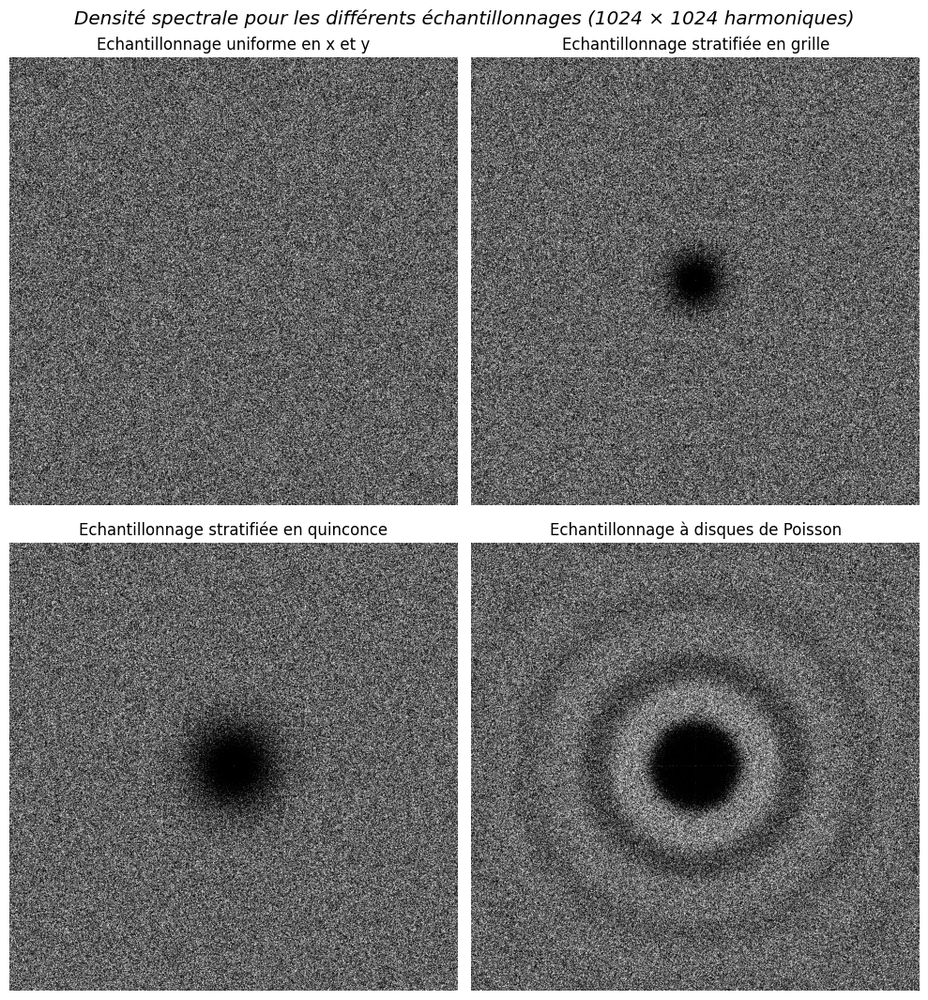

In [82]:
mp.figure(figsize=(10,11), dpi=100); suptitle = 'Densité spectrale pour les différents échantillonnages'
for fig, title, points in samplings: # itération sur les échantillonnages générés
  spatial = np.zeros((m, m), dtype='u1') # l'image spatiale est une grille de taille m x m dans laquelle...
  spatial[*points.T] = 1 # ...on met à 1 les pixels correspondants à la position quantifiée des échantillons
  spectral = fft.fftshift(fft.fft2(spatial)) # calcul et centrage de la transformée de Fourier (dans ℂ x ℂ)
  spectral = sigmo(density(spectral)) # calcul et compression sigmoïde de la densité spectrale (dans ℝ x ℝ)
  mp.subplot(2, 2, fig); mp.axis('off') # création d'une sous-figure par échantillonnage
  mp.imshow(spectral, cmap='gray', origin='lower'); mp.title(title) # affichage de l'image spectrale
mp.suptitle(f"{suptitle} ({m} × {m} harmoniques)", size='x-large', style='italic'); mp.tight_layout()

Il faut un peu d'habitude pour analyser ce type d'images spectrales. La fonction **`fftshift`** utilisé dans le code permet de placer l'harmonique (0,0) au centre de l'image, ce qui facilite la lecture. Pour chaque pixel de l'image, sa distance au centre correspond à la fréquence d'oscillation du signal (ou plus précisément à l'ordre de l'harmonique) associée à ce pixel. Cela signifie que tous les pixels sur un même cercle par rapport au centre de l'image correspondent à des oscillations de même fréquence, mais orientées selon des directions spatiales différentes. Plus le rayon de ce cercle est grand, plus cette fréquence d'oscillation est élevée, donc les harmoniqes basses se trouvent près du centre, et les harmoniques élevées sur la périphérie de l'image. La compression par sigmoïde a normalisé les amplitudes de la densité spectrale entre 0 et 1 et la colormap **`gray`** utilisé dans la fonction **`imshow`** transforme ces amplitudes en niveaux de gris, comme on l'a vu dans le chapitre 6.

Avec ces explications préliminaires, on peut mieux comprendre les quatre images obtenues :

- L'échantillonnage uniforme présente une image spectrale homogène, avec des variations aléatoires autour d'une intensité moyenne qui correspond à un gris médian (c'est l'exact équivalent en 2D de la courbe en zig-zag qu'on avait observée sur la densité spectrale des mesures bruitées dans le paragraphe précédent). On constate qu'il n'y a aucune zone spectrale favorisée (= gris plus clair) ou défavorisée (= gris plus sombre). Autrement dit, la densité spectrale est globalement plate, ce qui correspond à un bruit blanc

- L'échantillonnage stratifié en grille fournit une image spectrale similaire à l'image précédente sur la plus grande partie de l'image, à la différence de la partie centrale qui montre que les amplitudes diminuent fortement lorsqu'on s'approche du centre de l'image. Autrement dit, les harmoniques basses ont été réduites voire annulées par la stratification, ce qui est cohérent puisque le but de la stratification est justement d'interdire l'existence de zones très concentrées et de zones très clairsemées, qui correspondent aux harmoniques basses dans la densité spectrale

- L'échantillonnage stratifié en quinconce amplifie encore ce phénomême : on retrouve le même disque central noir mais il est plus large et sa bordure est mieux définie, ce qui signifie qu'il y a nettement moins de variance pour la distribution des distances au voisin le plus proche, ce que l'on avait déjà observé par analyse statistique dans la section C2

- Enfin, l'échantillonnage par disques de Poisson présente une image spectrale nettement plus complexe. On retrouve le disque noir central, mais cette fois-ci il est parfaitement délimité car tous les points possèdent une borne inférieure fixée sur leur distance au plus proche voisin. Mais en plus, on observe qu'autour de ce disque noir central, il existe un anneau beaucoup plus clair dont la largeur est équivalente au rayon du disque noir. Cela signifie qu'un très grand nombre des distances au plus proche voisin se placent entre la distance minimale (définie par le rayon du disque noir) et le double de cette distance minimale (définie par le rayon extérieur de l'anneau clair). C'est cette répartition fortement contrainte des distances qui donne cette impression d'homogénéité qui caractérise cette distribution spatiale. On constate d'ailleurs que l'anneau principal possède plusieurs répliques sur l'image spectrale (avec un rayon 2x plus grand, 3x plus grand, etc) ce qui est une conséquence directe : si les voisins les plus proches sont à une distance $d$ en moyenne, les voisins de ces voisins seront à une distance $2d$ en moyenne, et les voisins de ces voisins secondaires à une distance $3d$, etc...

---
#### c - Transformation en cosinus discrète

Lorsque les échantillons $\{x_p\}$ dans un domaine spatial 1D sont tous à valeurs réelles et non complexes (ce qui est presque toujours le cas en Sciences des Données), la densité spectrale est forcément symétrique par rapport à l'origine, ce qui signifie que la moitié des coefficients $\{S_p\}$ calculés par la FFT n'apportent pas d'information nouvelle par rapport à l'autre moitié. En 2D, la densité spectrale d'un signal à valeurs réelles possède une double symétrique axiale, donc seul le quart des coefficients contient une information utile. Et plus généralement pour une dimension arbitraire $d$, toute l'information utile est regroupée dans une fraction $2^{–d}$ des coefficients. Par conséquent, lorsque les échantillons sont à valeurs réelles, il est beaucoup plus intéressant d'utiliser une version alternative de la transformée de Fourier spécifiquement adaptée à ce cas de figure, appelée [**transformée en cosinus discrète**](https://fr.wikipedia.org/wiki/Transform%C3%A9e_en_cosinus_discr%C3%A8te), qui ***ne génère que les fréquences positives, pour chacune des dimensions*** de la densité spectrale. Cette variante et sa réciproque sont classiquement identifiées par leurs acronymes anglais : **DCT** pour *Discrete Cosine Transform*, et **IDCT** pour *Inverse Discrete Cosine Transform*, et se définissent par les équations suivantes :
$$
{\sf DCT :}\quad X_p = \sum_{k=0}^{n-1} x_k\; \cos \frac{\pi k(p+½)}{n}
$$

$$
{\sf IDCT :}\quad x_p = \frac{1}{2} X_0 + \sum_{k=1}^{n-1} X_k\; \cos \frac{\pi k(p+½)}{n}
$$

Comme la transformée de Fourier, la transformée en cosinus discrète se généralise à un espace de dimension arbitraire, en remplaçant la somme simple des formules précédentes par une somme multiple (une par dimension), ce qui correspond mathématiquement à un produit tensoriel séparable pour chacune des dimensions. Le module **`scipy.fft`** contient les fonctions **`dct/idct`** qui gèrent le cas 1D et les fonctions **`dctn/idctn`** qui gèrent le cas nD. On peut donc reprendre l'exemple 2D sur les différentes stratégies d'échantillonnage pour remplacer la FFT par une DCT :

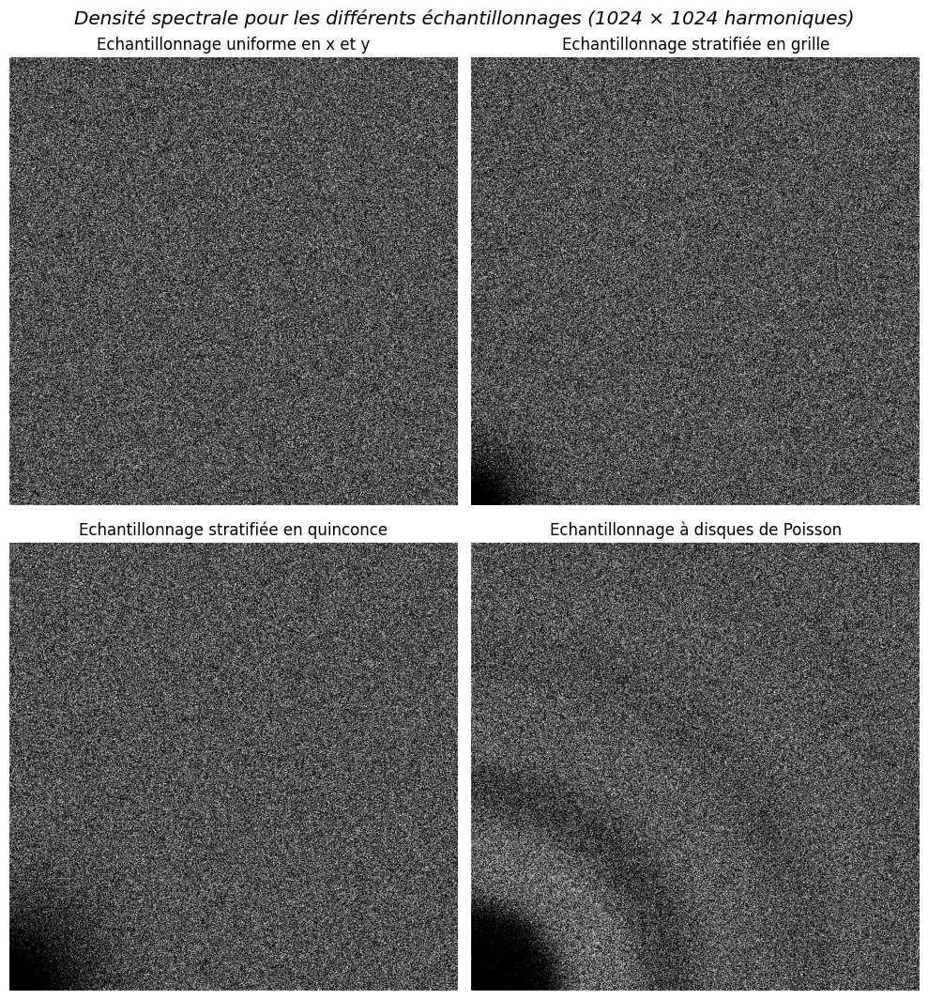

In [83]:
mp.figure(figsize=(10,11), dpi=100); suptitle = 'Densité spectrale pour les différents échantillonnages'
for fig, title, points in samplings: # itération sur les échantillonnages générés
  spatial = np.zeros((m, m), dtype='u1') # l'image spatiale est une grille de taille m x m dans laquelle...
  spatial[*points.T] = 1 # ...on met à 1 les pixels correspondants à la position quantifiée des échantillons
  spectral = fft.dctn(spatial) # calcul de la transformée en cosinus discrète dans ℝ+ x ℝ+
  spectral = sigmo(spectral**2) # calcul et compression sigmoïde de la densité spectrale
  mp.subplot(2, 2, fig); mp.axis('off') # création d'une sous-figure par échantillonnage
  mp.imshow(spectral, cmap='gray', origin='lower'); mp.title(title) # affichage de l'image spectrale
mp.suptitle(f"{suptitle} ({m} × {m} harmoniques)", size='x-large', style='italic'); mp.tight_layout()

Si l'on compare les deux versions du code, on voit celui de la DCT est plus simple : il n'y a plus besoin d'utiliser **`fftshift`** pour centrer l'harmonique 0, ni d'utiliser **`np.abs`** pour calculer le module, puisqu'on récupère directement des valeurs entières positives. Et si l'on compare les images obtenues, on voit que chacune des nouvelles images spectrales correspond au quart supérieur des anciennes images, sauf qu'elles offrent quatre fois plus de détails pour le même temps de calcul.

Au vu de ce résultat, on se dit que lorsque le signal de départ est à valeurs réelles, il faut systématiquement utiliser la DCT au lieu de la FFT puisqu'elle est beaucoup plus efficace. Mais en fait, l'exemple précédent ne peut pas se généraliser, car il y a ***une différence importante entre la FFT et la DCT sur les propriétés que doivent respecter les échantillons de départ*** dans le domaine spatial. Comme on l'a vu plus haut, la FFT impose que la séquence des échantillons $\{x_p\}$ corresponde à un multiple entier de la période supposée du signal, ce qui signifie que les échantillons du côté droit doivent pouvoir se raccorder sans discontinuité à ceux du côté gauche, et vice versa. Par contre, la DCT impose que la séquence des échantillons $\{x_p\}$ corresponde à l'échantillonnage d'une fonction paire, ce qui signifie que les échantillons à droite de zéro doivent pouvoir se raccorder sans discontinuité avec la séquence miroir $\{x_{-p}\}$, ce qui implique en particulier que le signal continu $f(t)$ qui a été échantillonné doit vérifier $f'(t_0) = 0$ où $t_0$ est la valeur du paramètre initial de la fenêtre. Si cette condition n'est pas respectée, la densité spectrale résultant de la DCT ne donnera pas un résultat correct.

On peut observer le problème en reprenant l'exemple des mesures expérimentales bruitées utilisé pour la FFT 1D :

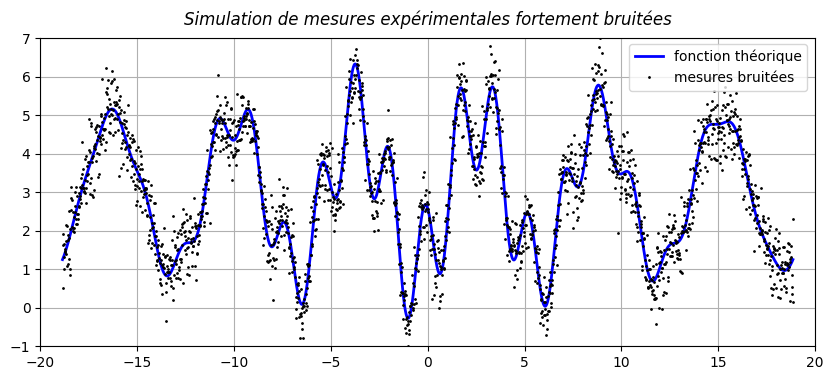

In [84]:
mp.figure(figsize=(10,4), dpi=100); title = 'Simulation de mesures expérimentales fortement bruitées'
mp.plot(x, theo, 'b-', lw=2, label='fonction théorique') # fonction théorique en bleu
mp.plot(x, expe, 'k.', ms=2, label='mesures bruitées') # mesures expérimentales bruitées en noir
mp.axis([-20,20,-1,7]); mp.legend(loc=(0.76,0.83)); mp.title(title, style='italic', pad=10); mp.grid()

Comme on l'avait déjà noté, les échantillons choisis sont bien adaptés pour l'application d'une FFT puisque les échantillons du côté droit se raccordent sans discontinuité avec ceux du côté gauche. Par contre, il n'y a aucune continuité si on applique une symétrie horizontale à la séquence d'échantillons, donc l'utilisation de la DCT va générer de nombreux artefacts :

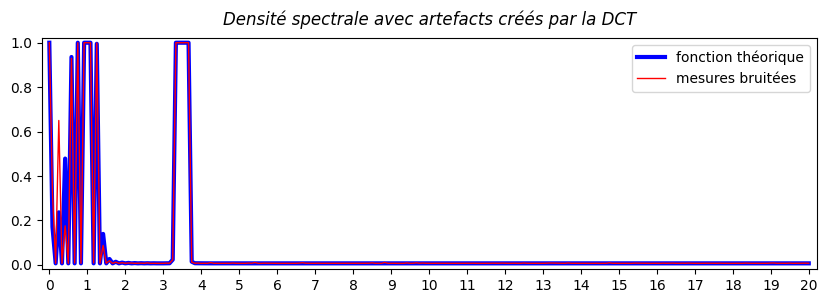

In [85]:
n = 2048 # nombre d'échantillons utilisés pour la DCT
theoDCT = fft.dct(theo)**2 # densité spectrale par DCT de la fonction théorique
expeDCT = fft.dct(expe)**2 # densité spectrale par DCT des mesures expérimentales bruitées
freqDCT = np.arange(n) * np.pi/n/(x[1]-x[0]) # vecteur des fréquences harmoniques pour l'axe horizontal
keepDCT = freqDCT <= cut # filtrage harmonique (harmonique d'ordre maximal à conserver)
theoSDCT, expeSDCT = sigmo(theoDCT), sigmo(expeDCT) # compression sigmoïde des densités spectrales

mp.figure(figsize=(10,3)); title = 'Densité spectrale avec artefacts créés par la DCT'
mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.02, 1.02])
mp.plot(freqDCT[keepDCT], theoSDCT[keepDCT], 'b-', lw=3, label='fonction théorique') # spectre en bleu
mp.plot(freqDCT[keepDCT], expeSDCT[keepDCT], 'r-', lw=1, label='mesures bruitées') # spectre en rouge
mp.legend(); mp.title(title, style='italic', pad=10);

La densité spectrale îssue de la DCT fait apparaître de nombreux pics en basse fréquence qui n'existent pas dans le signal originel mais qui sont des artefacts de calcul, liés au fait que les échantillons spatiaux ne respectent les conditions imposées par l'utilisation de la DCT. Il est donc important à chaque fois que l'on veut appliquer une FFT, une DCT ou une DST de bien ***vérifier que la séquence des échantillons fournis respecte les contraintes imposées par chacune des transformations***.

---
### 2 - Module 'scipy.signal'

Le module [**scipy.signal**](https://docs.scipy.org/doc/scipy/tutorial/signal.html) fournit une grande panoplie d'outils pour le traitement et l'analyse de signaux numériques, ce qui inclut l'application de filtres variés pour modifier, atténuer, ou au contraire amplifier, les variations de ces signaux dans le domaine spatial ou dans le domaine fréquentiel. La plupart des méthodes implémentées dans le module sont destinés à être utilisés sur des ***signaux mono-dimensionnels***, même si quelques rares fonctions peuvent s'appliquer à des signaux multi-dimensionnels. Pour un traitement complet de signaux multi-dimensionnels, le module **`scipy.ndimage`** qui sera détaillé dans la section suivante, est bien mieux adapté que le module **`scipy.signal`**.

Le module **`scipy.signal`** a été conçu à la base par des physiciens pour des physiciens, il contient donc de nombreuses fonctionnalités qui sont très peu utilisées dans le domaine des Sciences des Données, en tout cas dans le cadre de la définition qu'on a donné à cette notion dans le cours d'introduction. Nous allons donc présenter une toute petite partie des méthodes implémentées dans le module, en se focalisant sur celles qui ont une utilisation directe en Science des Données.

In [86]:
import scipy.signal as sig
#inspect(sig, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

---
#### a - Spectrogramme

Une des fonctionnalités les intéressantes fournies par le module **`scipy.signal`** est la notion de **spectrogramme**, qui peut être vu comme une ***version dynamique de la densité spectrale*** étudiée dans la section précédente. Concrètement, au lieu d'effectuer une transformation de Fourier unique sur l'ensemble des échantillons fournis en entrée, comme le fait la fonction **`fft`**, la fonction **`spectrogram`** va ***diviser les échantillons en fenêtres successives et calculer une FFT pour chacune de ces fenêtres***. Par défaut, la fonction va créer des fenêtres de 256 échantillons, avec un recouvrement de 32 échantillons entre deux fenêtres successives, mais ces valeurs peuvent facilement se modifier avec les paramètres **`nperseg`** et **`noverlap`**. Ainsi, au lieu d'avoir une vue statique qui présente l'ensemble des fréquences présentes dans le spectre pour l'intégralité du signal, le spectrogramme permet d'observer les apparitions, disparitions ou modifications d'amplitudes pour les différentes fréquences d'un signal en train d'évoluer, soit dans la dimension temporelle, soit dans la dimension spatiale. Or les signaux en cours d'évolution sont très largement majoritaires dans les sujets étudiés en Sciences des Données, ce qui justifie l'inclusion des spectrogrammes parmi les outils de visualisation majeurs utilisés dans ce domaine.

Par rapport à l'image d'une densité spectrale qui est un graphique à deux dimensions (les harmoniques en horizontal, les amplitudes en vertical), ***un spectrogramme est un graphique à trois dimensions*** (l'évolution temporelle ou spatiale en horizontale, les harmoniques en verticale et les amplitudes en altitude), mais en pratique, la plupart du temps on va utiliser un graphique à deux dimensions, en affichant les amplitudes sous la forme d'une gradation de couleur, selon le principe des [**cartes thermiques**](https://fr.wikipedia.org/wiki/Carte_thermique) ou [***heatmaps***](https://en.wikipedia.org/wiki/Heat_map) déjà mis en oeuvre avec les packages **matplotlib** et **seaborn**.

Pour illustrer l'utilisation de la fonction, on va reprendre l'exemple des mesures expérimentales bruitées et débruitées utilisé dans la section précédente, et observer le résultat visuel obtenu par un spectrogramme, en regroupant les échantillons par fenêtre, le long de l'intervalle d'entrée $[-6\pi,6\pi]$ :

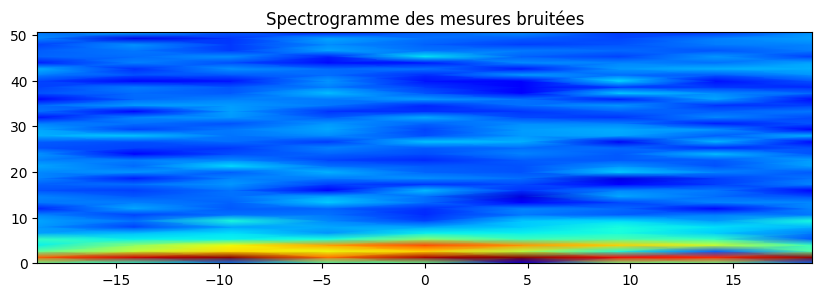

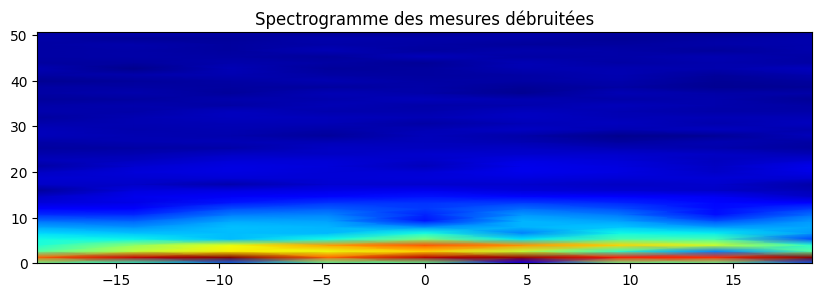

In [87]:
fs = 2*np.pi / (x[1]-x[0]) # fréquence angulaire de l'harmonique 1
f1, t1, S1 = sig.spectrogram(expe, fs=fs) # spectrogramme des mesures bruitées
f2, t2, S2 = sig.spectrogram(denoise, fs=fs) # spectrogramme des mesures débruitées
S1, S2 = gamma(S1), gamma(S2) # application de la compression gamma sur les deux spectrogrammes
t = np.linspace(-6*np.pi, 6*np.pi, len(t1)) # échantillonnage de l'échelle horizontale [-6pi,6pi]
clip = f1 < 51 # filtrage harmonique (harmonique d'ordre maximal à conserver)

mp.figure(figsize=(10,3)); mp.title("Spectrogramme des mesures bruitées")
mp.pcolormesh(t, f1[clip], S1[clip], shading='gouraud', cmap='jet', vmin=0, vmax=1)
mp.figure(figsize=(10,3)); mp.title("Spectrogramme des mesures débruitées")
mp.pcolormesh(t, f2[clip], S2[clip], shading='gouraud', cmap='jet', vmin=0, vmax=1);

Comme notre signal de départ est composé de 2048 échantillons et qu'on a utilisé les paramètres par défaut de la fonction **`spectrogram`**, les images ont été obtenues en divisant les 2048 échantillons en 9 fenêtres de 256 échantillons chacun, avec un chevauchement de 32 échantillons entre les fenêtres successives : la première fenêtre utilise les 256 premiers échantillons, les fenêtres suivantes n'incluent que 256-32 = 224 nouveaux échantillons qui sont rajoutés aux 32 derniers échantillons de la fenêtre précédente (donc au final, on a bien 256 + 8*224 = 2048 échantillons pour l'ensemble du spectrogramme). Les 9 spectres verticaux sont interpolés de manière lisse, grâce au paramètre **`shading='gouraud'`**

Le signal n'est pas idéalement adapté pour une étude par spectrogramme puisqu'il n'y a pas vraiment d'évolution spectrale sur l'intervalle étudié. On constate évidemment que le signal débruité a beaucoup moins de hautes fréquences que la version bruitée : pour les harmoniques entre 10 et 50, on a une couleur bleu clair pour le signal bruité, alors qu'elle est bleu foncé pour le signal débruité. Le seul élément dynamique visible est le fait que l'amplitude de l'harmonique 3.5 est assez importante autour de 0 (couleur rouge) alors qu'elle s'atténue en s'éloignant à droite et à gauche (couleur jaune puis vert) à cause de l'influence de la gaussienne qui coupe progressivement cette harmonique.

---
#### b - Filtrage dans le domaine spatial

L'une des opérations les plus fréquentes dans le domaine du traitement du signal en physique consiste à appliquer un [**filtre linéaire**](https://fr.wikipedia.org/wiki/Filtre_lin%C3%A9aire) à un signal donné pour en modifier les propriétés. La notion de filtre linéaire, utilisée en Physique, est parfaitement équivalente à la notion mathématique de [**convolution**](https://fr.wikipedia.org/wiki/Produit_de_convolution) lorsque le signal est défini sur un domaine continu (généralement un sous-ensemble de ℝ ou de ℂ). Lorsqu'on passe dans un domaine discret, il existe deux termes équivalents à cette notion de filtre linéaire : en statistiques, on parle ainsi de [**moyenne mobile ou glissante**](https://fr.wikipedia.org/wiki/Moyenne_mobile), tandis qu'en analyse numérique, on parle de [**convolution discrète**](https://en.wikipedia.org/wiki/Convolution#Discrete_convolution), mais ces deux expressions désignent exactement le même processus mathématique.

En pratique, un filtre linéaire appliqué à un signal discret s'obtient en calculant une [**combinaison barycentrique**](https://fr.wikipedia.org/wiki/Combinaison_barycentrique) sur un voisinage de taille finie autour de chaque échantillon. On rappelle qu'une combinaison barycentrique est l'équivalent d'une moyenne pondérée dont la somme des coefficients de pondération est égale à 1. Le voisinage utilisé pour effectuer cette moyenne pondérée s'appelle la ***fenêtre de convolution***, et les coefficients de pondération placés dans cette fenêtre sont eux-mêmes souvent obtenus par échantillonnage d'une fonction continue appelée ***noyau de convolution***. Toute cette opération de filtrage linéaire par application répétée d'une fenêtre de convolution sur chaque échantillon d'un signal discret, est prise en charge par la fonction **`convolve`** du module **`scipy.signal`**.

Ce module possède également un sous-module **`windows`** qui regroupe une série de fonctions permettant d'obtenir quelque uns des noyaux de convolution classiquement utilisés en traitement du signal. Chacune de ces fonctions implémente la version continue du noyau, donc il suffit de fournir la taille souhaitée de la fenêtre de convolution pour obtenir en retour, un vecteur ou une matrice stockant les différents coefficients de pondération mis en oeuvre dans le calcul de la convolution discrète sur son signal. Pour pouvoir centrer la fenêtre de convolution sur l'échantillon en cours de traitement, on utilise généralement des fenêtres de taille impaire $s = 2r$+$1$ où la demi-taille $r$ est appelé ***rayon de convolution***

Parmi la trentaine de noyaux de convolution inclus dans le module **`windows`**, les quatre fonctions suivantes sont de (très) loin celles qui sont les plus utilisées en pratique :

- **`boxcar`** : noyau constant *(également appelé noyau rectangulaire)* défini par
$${\sf boxcar}[k] = 1\quad \forall k \in \{–r,...,r\}$$

- **`triang`** : noyau triangulaire défini par
$${\sf triang}[k] = 1\,–\,\frac{|k|}{r}\quad \forall k \in \{–r,...,r\}$$

- **`hann`** : noyau de Hann défini par
$${\sf hann}[k] = \cos^2 \frac{k\pi}{2r}\quad \forall k \in \{–r,...,r\}$$

- **`gaussian`** : noyau de Gauss défini par
$${\sf gaussian}[k] = {\sf e}^{\textstyle –\frac{k^2}{2\sigma^2}}\quad {\sf avec}\quad \sigma = \lambda r\quad \forall k \in \{–r,...,r\}$$

La figure suivante montre le tracé de ces quatre noyaux, en utilisant un intervalle normalisé $[–1,1]$ pour l'axe horizontal :

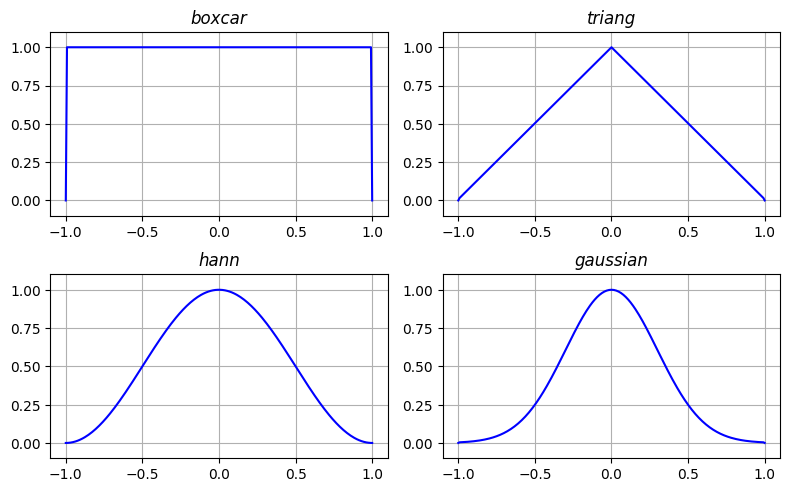

In [88]:
import scipy.signal.windows as win # import du module contenant les différents noyaux classiques

r = 128; s = 2*r+1; t = np.linspace(-1, 1, s) # la taille du noyau est toujours impaire : s = 2*r + 1
kernels = dict(boxcar=[s], triang=[s], hann=[s], gaussian=[s,0.3*r]) # liste des noyaux à tester

mp.figure(figsize=(8,5), dpi=100)
for p, name in enumerate(kernels): # itération sur les différents noyaux sélectionnés
  mp.subplot(2, 2, p+1); mp.axis([-1.1,1.1,-0.1,1.1]); mp.gca().set_aspect('equal') # une figure par noyau
  func = getattr(win, name) # récupération de la fonction associée au noyau dans le module 'win'
  kernel = func(*kernels[name]); kernel[0::s-1] = 0; mp.plot(t, kernel, 'b-') # calcul et tracé du noyau
  mp.title(name, style='italic'); mp.grid(); mp.tight_layout()

Les trois premiers noyaux n'ont que le rayon $r$ comme paramètre, alors que le noyau gaussien a également un paramètre $\lambda$ qui permet de contrôler la forme du lobe. Mais en pratique, on utilise très souvent la valeur $\lambda = 0.3$ qui a comme propriété de donner ${\sf gaussian}[r/2] ≈ 1/4$, comme on peut le vérifier sur la figure. Cette valeur fournit un lobe bien équilibré entre les pondérations des échantillons proches et celles des échantillons distants. A l'inverse, le noyau de Hann, qui a pourtant une forme en cloche très similaire (avec juste une décroissance moins rapide puisque ${\sf hann}[r/2] = 1/2$), va avoir tendance à donner trop d'influence aux échantillons éloignés, ce qui peut engendrer différents artefacts sur les données filtrées.

**Note :** *Si vous êtes maniaque, vous pouvez même utiliser $\lambda = 0.300280602197$ pour être très précisément sur la valeur* $1/4$

---
Pour visualiser les effets obtenus par application de noyaux de convolution dans le domaine spatial, on va encore reprendre l'exemple des mesures expérimentales bruitées. Dans la section D1, nous avons vu qu'un masque sigmoïde appliqué sur la transformée de Fourier du signal bruité permettait, après transformée de Fourier inverse, d'éliminer presque l'intégralité des erreurs de mesures pour retrouver le signal théorique.
Cette méthode fonctionne très bien, mais avec l'inconvénient d'un coût de calcul assez élevé, car il faut enchaîner une transformation de Fourier, un calcul de densité spectrale, une compression en sigmoïde, un masque sigmoïde et une transformation de Fourier inverse. A l'inverse, l'application d'un filtre linéaire dans le domaine spatial va simplement nécessiter le calcul d'une moyenne pondérée sur chacun des échantillons du signal de départ, ce qui est évidemment beaucoup plus performant en temps de calcul. Il est donc intéressant de vérifier si une telle alternative rapide permet d'obtenir des résultats similaires ou proches de ceux obtenus avec le masque sigmoïde.

Le code ci-dessous permet d'analyser le lissage par noyau gaussien sur les mesures bruitées en utilisant successivement un rayon de convolution de taille 8, 24 et 64. Autrement dit, on va remplacer la valeur de chaque échantillon par la moyenne pondérée de ses 17, 49 et 129 voisins. La fenêtre de convolution contenant les coefficients de pondération correspondant au noyau gaussien discret, est obtenue en appelant la fonction **`gaussian`** qui retourne un vecteur de taille $2r\!+\!1$ qu'il faudra impérativement normaliser (= le diviser par la somme de ses coefficients) pour obtenir une combinaison barycentrique, avant d'appeler la fonction **`convolve`** du module **`scipy.signal`**.

Comme on peut le constater sur les trois figures dans le domaine spatial et les trois figures dans le domaine spectral, le rayon de convolution est le paramètre le plus important pour contrôler l'effet de lissage généré par le noyau de convolution :

- si $r$ est **trop petit** (cf. le cas $r = 8$), le lissage n'est suffisant et les mesures filtrées restent très bruitées (on constate sur la densité spectrale que les zig-zag du bruit blanc sont presque inchangés par rapport au signal de départ)
- si $r$ est **trop grand** (cf. le cas $r = 64$), le bruit blanc est très bien atténué (il n'y a quasiment plus de zig-zag au-dessus de l'harmonique 5) mais les échantillons sont tellement lissés qu'une partie du spectre théorique est perdu (on constate que l'amplitude de l'harmonique 3.5 est plus faible sur la courbe rouge que sur la courbe bleue) ce qui provoque une perte d'oscillations dans le domaine spatial
- enfin, si $r$ est **bien ajusté** (cf. le cas $r = 24$), les échantillons filtrés se placent dans des positions très proches de la fonction théorique. Alors certes, le débruitage est moins spectaculaire qu'avec le masque sigmoïde dans le domaine spectral, mais en contre-partie la méthode est entre 100 et 1000 fois plus rapide, selon le nombre d'échantillons à traiter

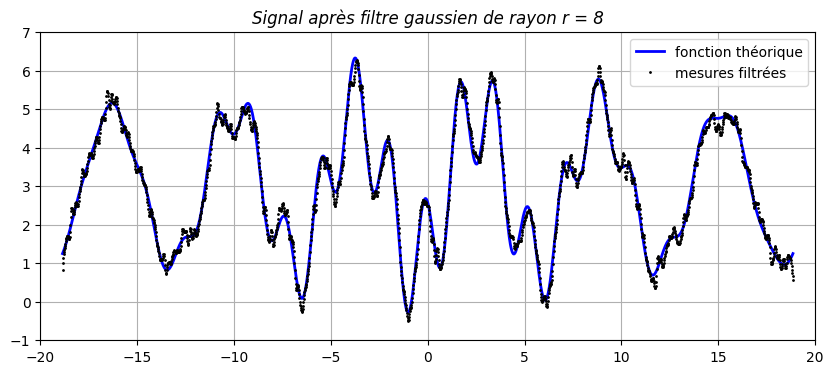

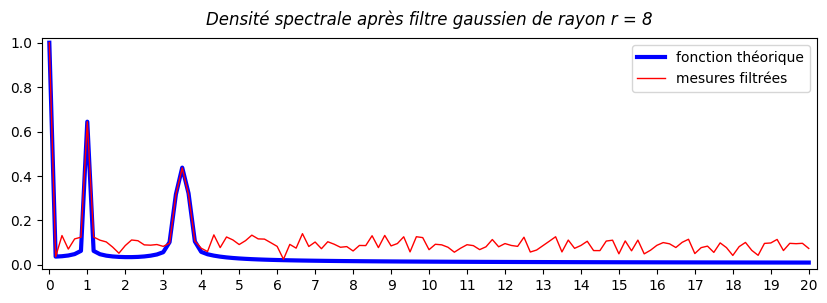

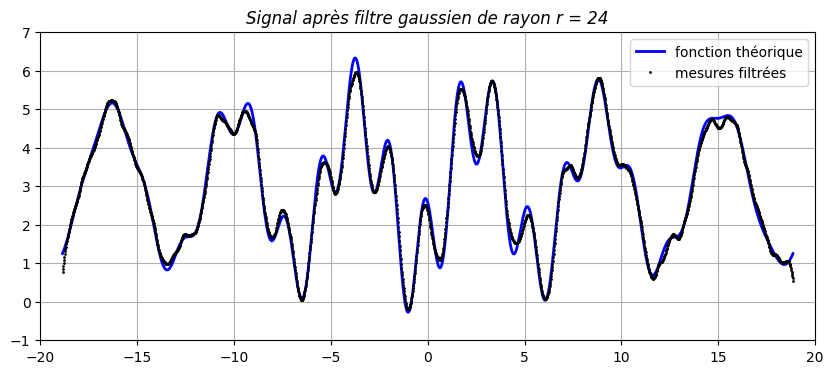

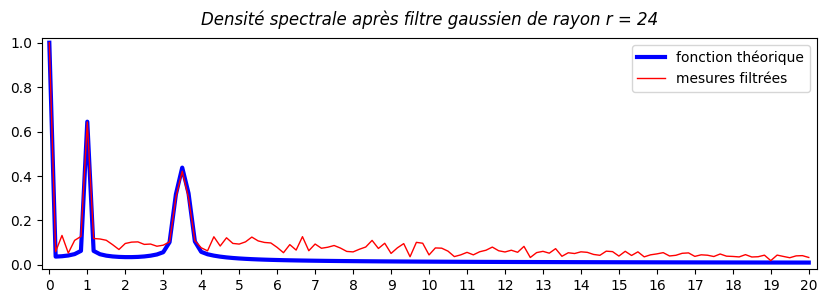

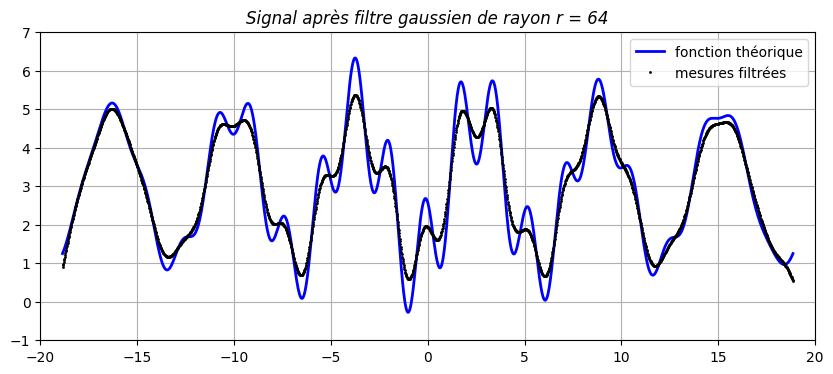

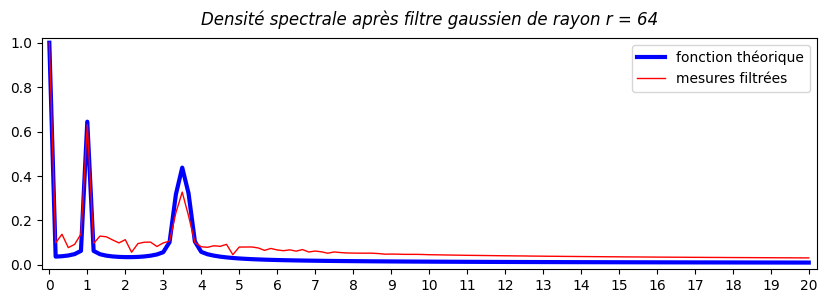

In [89]:
for r in (8, 24, 64): # itération sur les 3 rayons choisis pour le noyau gaussien
  kernel = win.gaussian(2*r+1, 0.3*r); kernel /= kernel.sum() # création et normalisation du noyau gaussien
  gauss = sig.convolve(expe, kernel, mode='same') # convolution des mesures bruitées avec le noyau gaussien
  gaussG = gamma(density(fft.fft(gauss))) # calcul et compression gamma de la densité spectrale

  mp.figure(figsize=(10,4)); title = f"Signal après filtre gaussien de rayon r = {r}"
  mp.plot(x, theo, 'b-', lw=2, label='fonction théorique') # fonction théorique en bleu
  mp.plot(x, gauss, 'k.', ms=2, label=f'mesures filtrées') # mesures après convolution en noir
  mp.axis([-20, 20, -1, 7]); mp.legend(); mp.title(title, style='italic'); mp.grid()

  mp.figure(figsize=(10,3)); title = f"Densité spectrale après filtre gaussien de rayon r = {r}"
  mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.02, 1.02])
  mp.plot(freq[keep], theoG[keep], 'b-', lw=3, label='fonction théorique') # spectre théorique en bleu
  mp.plot(freq[keep], gaussG[keep], 'r-', lw=1, label='mesures filtrées') # spectre des mesures en rouge
  mp.legend(); mp.title(title, style='italic', pad=10);

---
L'inconvénient de la méthode de filtrage précédente est qu'elle utilise le même noyau de convolution pour l'ensemble des échantillons, sans distinguer les zones où le bruit est important de celles où le bruit est plus faible. Evidemment, on pourrait changer les coefficients de pondération d'une zone à l'autre en ajustant la taille du rayon de convolution à la nature des données, mais trouver un critère mathématique permettant de faire cela de manière robuste, est loin d'être trivial.

En 1964, Abraham Savitzky et Marcel Golay ont proposé une technique de [**filtrage linéaire adaptatif**](https://en.wikipedia.org/wiki/Savitzky%E2%80%93Golay_filter) obtenue en calculant un approximant polynomial pour les échantillons se trouvant à l'intérieur de la fenêtre de convolution centrée en chaque point du signal initial. L'idée phare de leur technique que le fait que cet approximant polynomial peut ***se précalculer pour chaque degré du polynôme et chaque valeur du rayon de convolution***, ce qui permet de préstocker les coefficients des approximants polynomiaux et évite ainsi d'avoir à résoudre un système des moindres carrés pour chaque échantillon. Donc, hormis un temps d'initialisation un peu plus long pour calculer les coefficients de pondération, l'application du filtre sur les échantillons du signal ne prend pas plus de temps que lorsque le noyau de convolution est fixe.

Le code ci-dessous permet d'appliquer le filtre de Savitzky-Golay avec les trois mêmes rayons de convolution (8, 24, 64) et en utilisant des polynômes approximants cubiques. Les résultats sont assez similaires à ceux données ci-dessus pour le noyau gaussien (trop bruité pour $r=8$. trop lissé pour $r=64$ et correct pour $r=24$), mais un des avantages du filtre de Savitzky-Golay est que les extrema du signal sont mieux préservés, alors qu'un noyau gaussien va toujours avoir tendance à diminuer les maxima et à augmenter les minima, ce qui se vérifie notamment en comparant les deux résultats obtenus avec $r = 24$

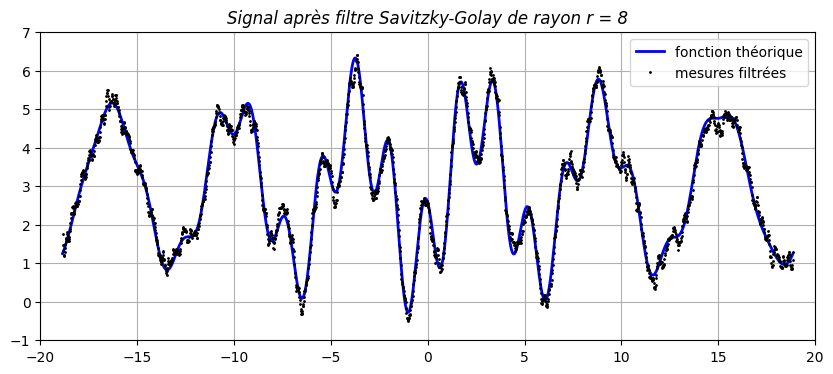

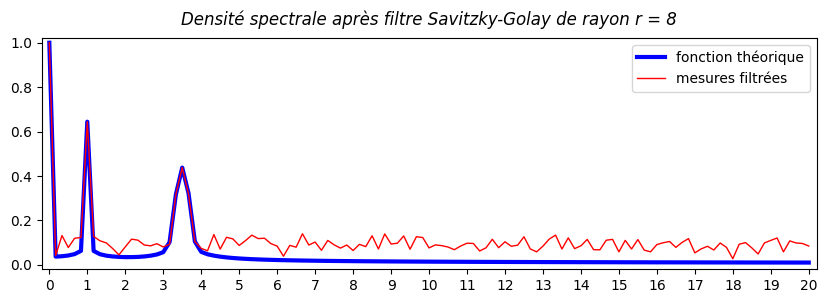

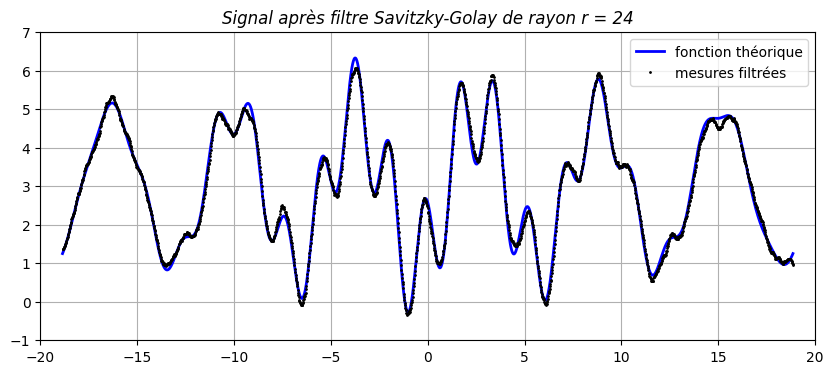

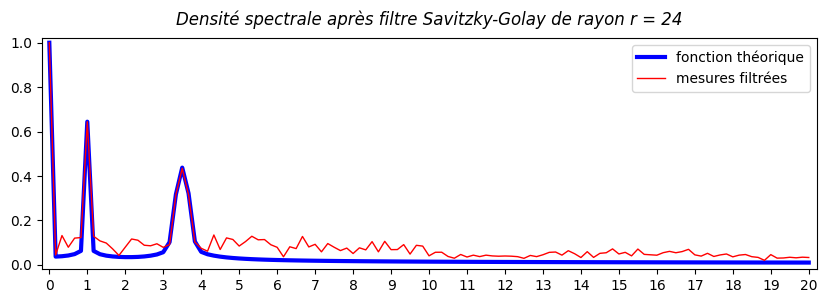

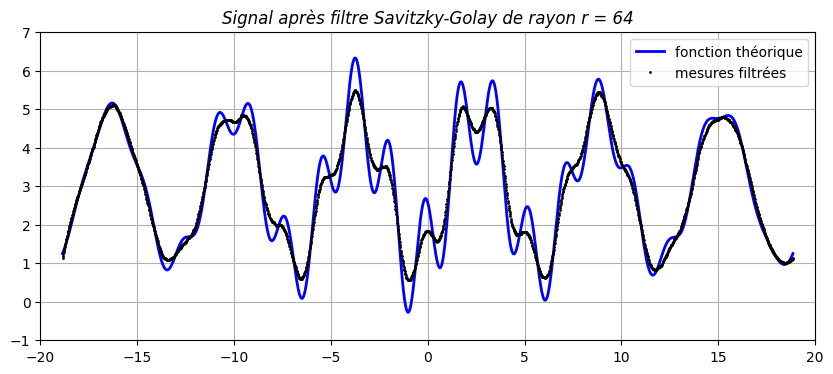

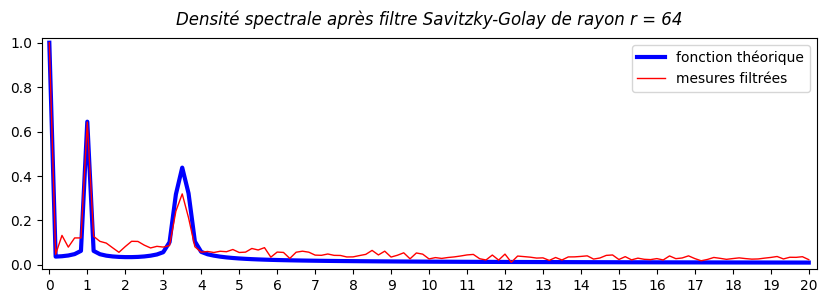

In [90]:
for r in (8, 24, 64): # itération sur les 3 rayons choisis pour le noyau de Savitzky-Golay
  savgol = sig.savgol_filter(expe, 2*r+1, polyorder=3) # convolution avec noyau de Savitzky-Golay
  savgolG = gamma(density(fft.fft(savgol))) # calcul et compression gamma de la densité spectrale

  mp.figure(figsize=(10,4)); title = f"Signal après filtre Savitzky-Golay de rayon r = {r}"
  mp.plot(x, theo, 'b-', lw=2, label='fonction théorique') # fonction théorique en bleu
  mp.plot(x, savgol, 'k.', ms=2, label=f'mesures filtrées') # mesures après convolution en noir
  mp.axis([-20, 20, -1, 7]); mp.legend(); mp.title(title, style='italic'); mp.grid()

  mp.figure(figsize=(10,3)); title = f"Densité spectrale après filtre Savitzky-Golay de rayon r = {r}"
  mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.02, 1.02])
  mp.plot(freq[keep], theoG[keep], 'b-', lw=3, label='fonction théorique') # spectre théorique en bleu
  mp.plot(freq[keep], savgolG[keep], 'r-', lw=1, label='mesures filtrées') # spectre des mesures en rouge
  mp.legend(); mp.title(title, style='italic', pad=10);

---
#### c - Filtrage dans le domaine fréquentiel

Les notions de convolution et de transformation de Fourier sont liées par les égalités suivantes (parfois appelées ***théorème de convolution***, même s'il s'agit uniquement d'une conséquence directe de la définition mathématique des deux notions) :

$$
\widehat{\mathstrut\:\:\:u*v\:\:\:} = \widehat{\mathstrut\:u\:}\:\:\widehat{\mathstrut\:v\:}\quad
{\sf et}\quad
\widehat{\mathstrut\:\:u\:v\:\:\:} = \widehat{\mathstrut\:u\:} * \widehat{\mathstrut\:v\:}\quad
{\sf avec\quad * = convolution\quad et\quad \widehat{\quad} = transformation\:de\:Fourier}
$$

autrement dit, le ***spectre d'une convolution entre les signaux $u$ et $v$ est égal au produit des spectres des signaux $u$ et $v$***, et réciproquement le ***spectre du produit des signaux $u$ et $v$ est égal à la convolution des spectres des signaux $u$ et $v$***. Les mêmes égalités s'appliquent lorsqu'on remplace le spectre (à valeurs complexes) par la densité spectrale (à valeurs réelles).

Cette propriété peut être utilisée pour créer très simplement des filtres dans le domaine spectral, puisqu'il suffit de multiplier les amplitudes des densités spectrales obtenues respectivement pour le signal et le filtre, puis effectuer une transformation de Fourier inverse pour obtenir le signal filtré dans le domaine spatial. L'idée est de créer la fonction de filtrage directement dans le domaine spectral, sans la définir au préalable dans le domaine spatial, à la différence des noyaux de convolution.

Pour filtrer nos mesures bruitées, nous avons vu qu'il faut enlever les hautes fréquences qui sont uniquement engrendrées par les erreurs de mesures. La fonction permettant de réaliser cela s'appelle un [**filtre passe-bas**](https://fr.wikipedia.org/wiki/Filtre_passe-bas) et la manière la plus simple de le réaliser est de choisir une harmonique $h$, appelée ***harmonique de coupure***, et de couper (= mettre à zéro) les amplitudes de toutes les harmoniques supérieures à $h$. Cela crée donc une densité spectrale binaire qui vaut 1 pour les basses fréquences et 0 pour les hautes fréquences, comme on peut le constater sur la figure ci-dessous pour différentes valeurs de la fréquence de coupure $h$. Ce filtre est appelé ***filtre passe-bas parfait*** puisqu'il enlève parfaitement toutes les harmoniques non souhaitées et préserve parfaitement toutes les autres :

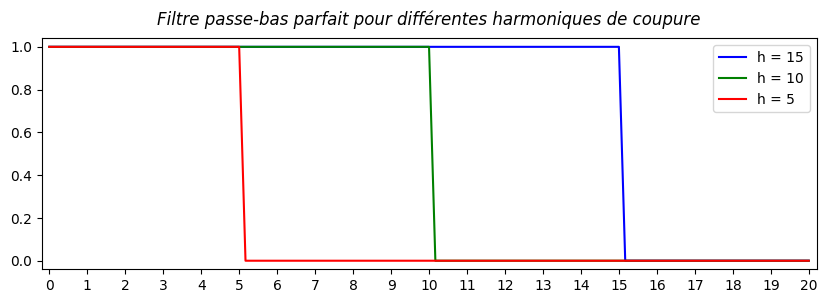

In [91]:
perfectLP = lambda f,h: np.abs(f) < h # filtre passe-bas parfait (LP = low-pass)

mp.figure(figsize=(10,3)); title = f"Filtre passe-bas parfait pour différentes harmoniques de coupure"
mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.04, 1.04])
for h,c in ((15,'b'),(10,'g'),(5,'r')): # itération sur les différents jeux de paramètres
  mp.plot(freq[keep], perfectLP(freq,h)[keep], c=c, label=f"h = {h}") # affichage densité spectrale
mp.legend(); mp.title(title, style='italic', pad=10);

L'inconvénient du filtre parfait est qu'il crée une discontinuité brutale entre les harmoniques se trouvant à gauche et à droite de l'harmonique de coupure, et lorsqu'on applique la transformée de Fourier inverse pour obtenir les mesures filtrées, cela engendre la formation d'oscillations parasites dans le domaine spatial, appelé [**phénomène de Gibbs**](https://fr.wikipedia.org/wiki/Ph%C3%A9nom%C3%A8ne_de_Gibbs). Une alternative (que l'on commence à bien connaître) pour éviter les discontinuités d'une fonction binaire est d'utiliser la fonction sigmoïde qui, dans notre cas, va interpoler de manière lisse les amplitudes de la densité spectrale entre la zone passante ($f < h$) et la zone coupée ($f > h$). Le ***filtre passe-bas sigmoïde*** est donc une alternative plus stable numériquement au filtre passe-bas parfait, et comme on l'a déjà mentionné, il possède même un degré de liberté supplémentaire $p$ permettant de choisir la pente au point d'inflexion et donc de contrôler plus finement le filtrage mis en oeuvre.

La figure ci-dessous montre la densité spectrale du filtre passe-bas sigmoïde pour différentes valeurs de $h$ et de $p$. On peut constater que les amplitudes commencent à baisser **avant** d'atteindre l'harmonique de coupure (qui est matérialisée par la ligne vertical en pointillés), et ce d'autant plus que la valeur du paramètre $p$ est faible. Cela signifie que s'il l'on veut couper à partir d'une harmonique donnée avec un filtre sigmoïde, il est préférable de placer l'harmonique de coupure $h$ légèrement au-dessus de la valeur souhaitée pour le filtrage des harmoniques, comme on va le voir dans les tests à venir :

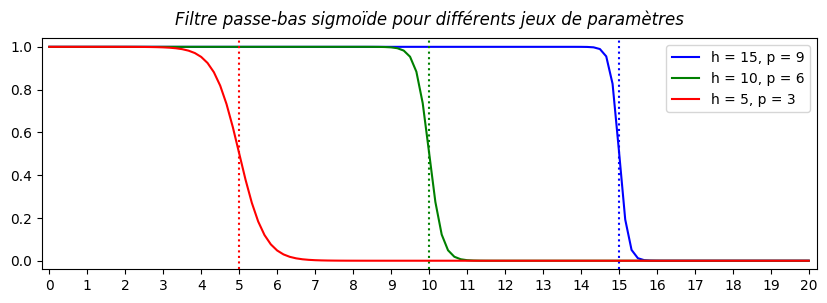

In [92]:
sigmoLP = lambda f,h,p=9: 1 / (1 + np.exp(p*np.abs(f)-p*h)) # filtre passe-bas sigmoïde (LP = low-pass)

mp.figure(figsize=(10,3)); title = f"Filtre passe-bas sigmoïde pour différents jeux de paramètres"
mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.04, 1.04])
for h,p,c in ((15,9,'b'),(10,6,'g'),(5,3,'r')): # itération sur les différents jeux de paramètres
  mp.plot(freq[keep], sigmoLP(freq,h,p)[keep], c=c, label=f"h = {h}, p = {p}") # affichage densité spectrale
  mp.axvline(h, c=c, linestyle=':') # ligne verticale positionnée à l'harmonique de coupure
mp.legend(); mp.title(title, style='italic', pad=10);

Le code ci-dessous permet de visualiser et analyser le lissage généré par le filtre passe-bas sigmoïde sur les mesures bruitées. A la différence des méthodes de filtrage dans le domaine spatial, l'utilisateur ne doit pas spécifier ici un rayon de convolution, mais directement la valeur de l'harmonique de coupure qui définit la position du point d'inflexion de la sigmoïde pour la densité spectrale. Comme dans le paragraphe précédent, on va visualiser l'effet du filtre pour trois valeurs différentes du paramètre $h$, et on utilise la valeur par défaut pour la pente, $p = 9$ :

- $h = 8$ : on constate sur la densité spectrale que l'amplitude baisse rapidement entre les harmoniques 7.5 et 8.5 et qu'elle est quasi-nulle pour les harmoniques supérieures. Par conséquent, une grande partie du bruit blanc a été supprimé, ce qui fait que le lissage dans le domaine spatial est déjà très correct
- $h = 4$ : l'amplitude commence à baisser en peu avant l'harmonique 4, c'est-à-dire juste après le pic placé à 3.5. Il s'agit du cas idéal puisque la courbe rouge et la courbe bleue sont presque superposées pour toutes les harmoniques à partir de 4. Il reste évidemment des zig-zag liés au bruit entre les pics à 0, 1 et 3.5, mais ceux-là ne peuvent pas être supprimés avec un simple filtre passe-bas
- $h = 3.5$ : comme on l'a mentionné plus haut, il ne faut jamais placer l'harmonique de coupure exactement sur la position d'un pic de la densité spectrale que l'on souhaite préserver, car l'atténuation des amplitudes commence toujours avant cette harmonique de coupure. Ici on constate que le pic positionné à 3.5 est fortement atténué par le filtre, ce qui donne un signal spatial trop lissé, similaire à l'emploi d'un rayon de convolution trop grand

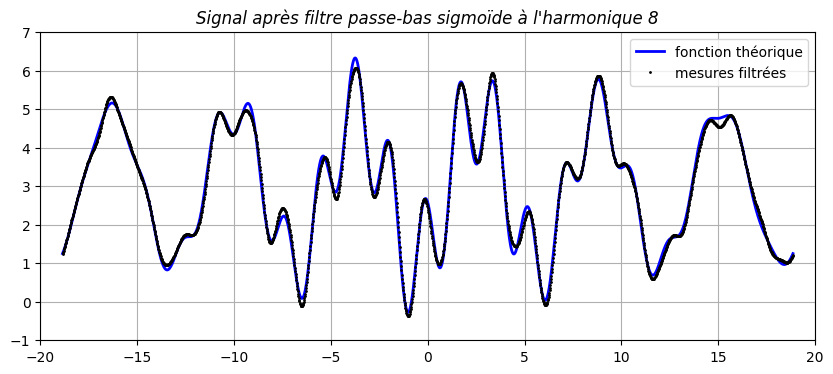

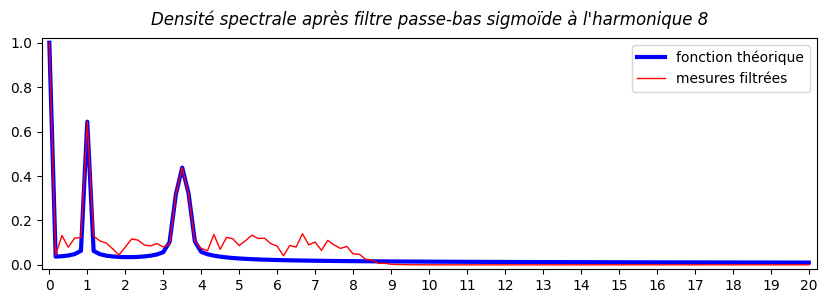

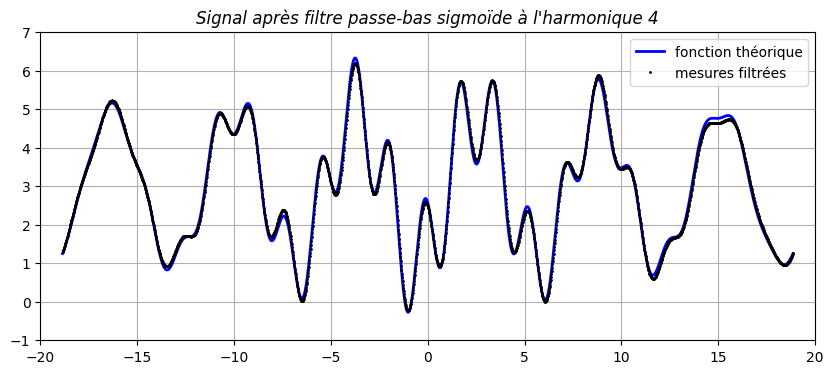

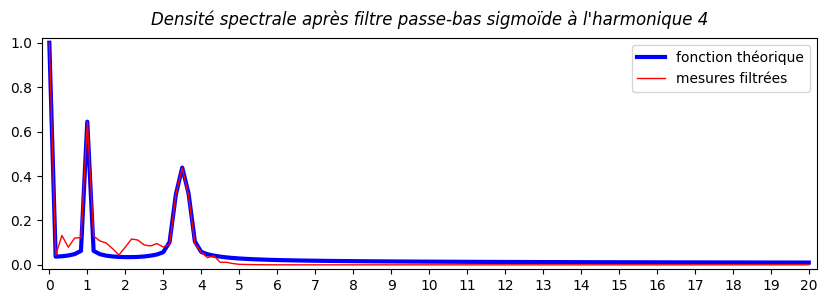

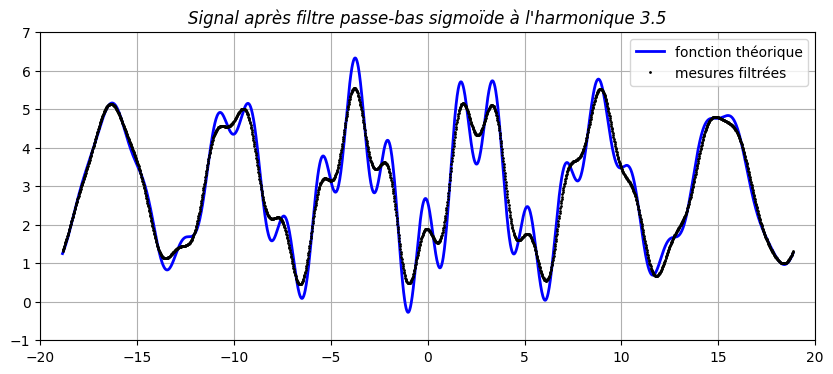

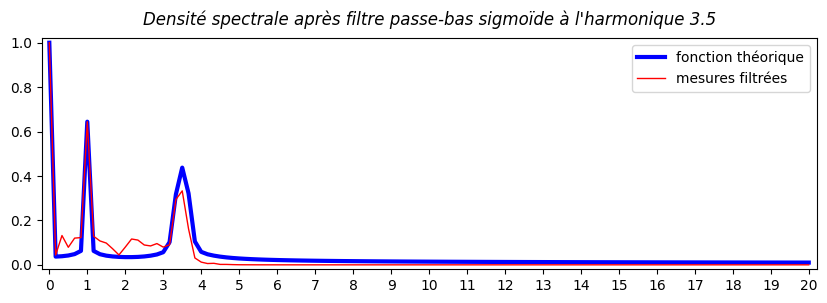

In [93]:
for h in (8, 4, 3.5): # itération sur les 3 harmoniques choisies pour le filtre passe-bas sigmoïde
  smooth = sigmoLP(freq,h) * fft.fft(expe) # application du filtre passe-bas sigmoïde
  smoothG = gamma(density(smooth)) # calcul et compression gamma de la densité spectrale
  smooth = np.real(fft.ifft(smooth)) # reconstruction du signal par transformée de Fourier inverse

  mp.figure(figsize=(10,4)); title = f"Signal après filtre passe-bas sigmoïde à l'harmonique {h}"
  mp.plot(x, theo, 'b-', lw=2, label='fonction théorique') # fonction théorique en bleu
  mp.plot(x, smooth, 'k.', ms=2, label=f'mesures filtrées') # mesures après convolution en noir
  mp.axis([-20, 20, -1, 7]); mp.legend(); mp.title(title, style='italic'); mp.grid()

  mp.figure(figsize=(10,3)); title = f"Densité spectrale après filtre passe-bas sigmoïde à l'harmonique {h}"
  mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.02, 1.02])
  mp.plot(freq[keep], theoG[keep], 'b-', lw=3, label='fonction théorique') # spectre théorique en bleu
  mp.plot(freq[keep], smoothG[keep], 'r-', lw=1, label='mesures filtrées') # spectre des mesures en rouge
  mp.legend(); mp.title(title, style='italic', pad=10);

---

En 1930, Stephen Butterworth, un physicien anglais, a proposé une autre famille de filtres utilisables dans le domaine spectral, mais qui sont basés sur des polynômes rationnels de degrés pairs. Comme pour le filtre sigmoïde, un [**filtre de Butterworth**](https://fr.wikipedia.org/wiki/Filtre_de_Butterworth) se définit par deux paramètres : $h$ représente la valeur de l'harmonique de coupure, et $n$, appelé ***ordre du filtre***, correspond au demi-degré du polynôme rationnel utilisé dans la définition du filtre. La figure ci-dessous présente le tracé du filtre de Butterworth pour différents jeux de paramètres. On constate que les formes sont très similaires au filtre sigmoïde, avec simplement une variation de la pente plus lente lorsque $n$ augmente que celle obtenue avec le paramètre $p$ des sigmoïdes (en calculant les dérivées analytiques au point d'inflexion, on peut facilement montrer que pour avoir des pentes équivalentes, il faut prendre $2n = ph$) :

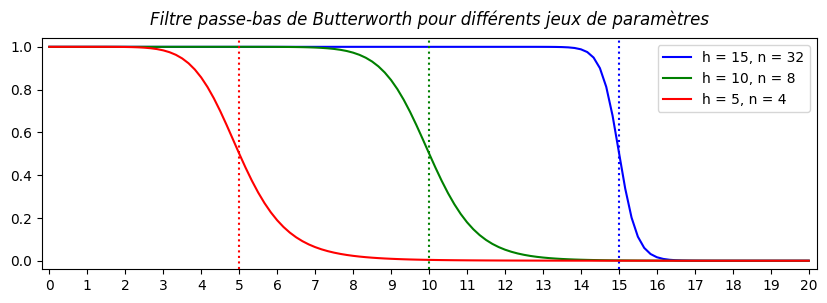

In [94]:
butterLP = lambda f, h, n: 1 / (1 + (f/h)**(2*n)) # filtre passe-bas de Butterworth

mp.figure(figsize=(10,3)); title = f"Filtre passe-bas de Butterworth pour différents jeux de paramètres"
mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.04, 1.04])
for h,n,c in ((15,32,'b'),(10,8,'g'),(5,4,'r')): # itération sur les différents jeux de paramètres
  mp.plot(freq[keep], butterLP(freq, h, n)[keep], c=c, label=f"h = {h}, n = {n}") # densité spectrale
  mp.axvline(h, c=c, linestyle=':') # ligne verticale positionnée à l'harmonique de coupure
mp.legend(); mp.title(title, style='italic', pad=10);

Si les formes obtenues dans le domaine spectral sont aussi proches de celles du filtre sigmoïde, quel est donc l'intérêt des filtres de Butterworth ? En fait, cette famille de polynômes rationnels a été sélectionnée par Butterworth, parce que leur transformée de Fourier inverse pouvait se calculer analytiquement par une formule de récurrence, ce qui fait que le filtre de Butterworth peut s'appliquer directement dans le domaine spatial, même s'il a été conçu dans le domaine spectral. Comme pour le filtre de Savitsky-Golay, on peut même précalculer les coefficients de pondération à utiliser pour l'application du filtre en fonction des paramètres $h$ et $n$. La fonction **`butter`** du module **`scipy.signal`** permet d'effectuer ce précalcul et retourne deux vecteurs de coefficients (habituellement appelés **`a`** et **`b`**) qui sont ensuite transmis à la fonction **`filtfilt`** chargée d'appliquer ces coefficients sur les échantillons du signal dans le domaine spatial.

Comme on peut le constater sur les figures ci-dessous, le filtre de Butterworth donne quasiment les mêmes résultats que le filtre passe-bas sigmoïde, en terme d'élimination d'harmoniques et de lissage des échantillons. En théorie, comme il s'applique dans le domaine spatial, il est censé être plus rapide que le filtre sigmoide, ou que tout autre filtre spectral qui nécessite de mettre en oeuvre une FFT sur le signal de départ, puis d'une IFFT sur la densité spectrale filtrée. Mais en pratique, l'implémentation du couple FFT/IFFT dans le module **`scipy.fft`** est extrêmement optimisée, alors que les fonctions **`butter`** et **`filtfilt`** utilisent du code ancien et beaucoup moins performant, et les benchmarks montre que la version FFT/IFFT est entre 5 et 10 fois plus rapide, selon la taille des données.

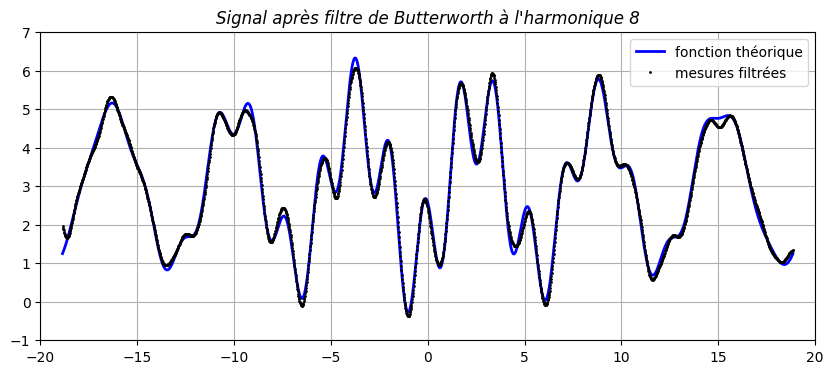

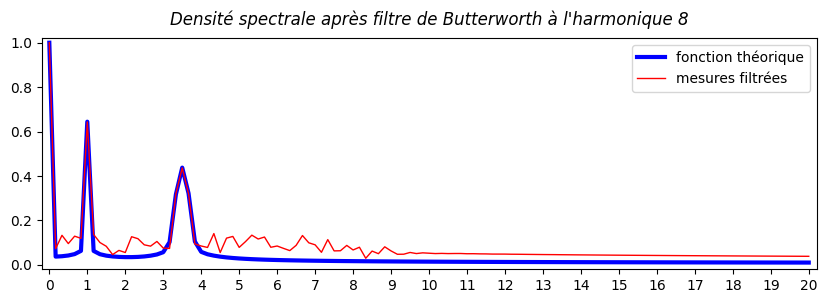

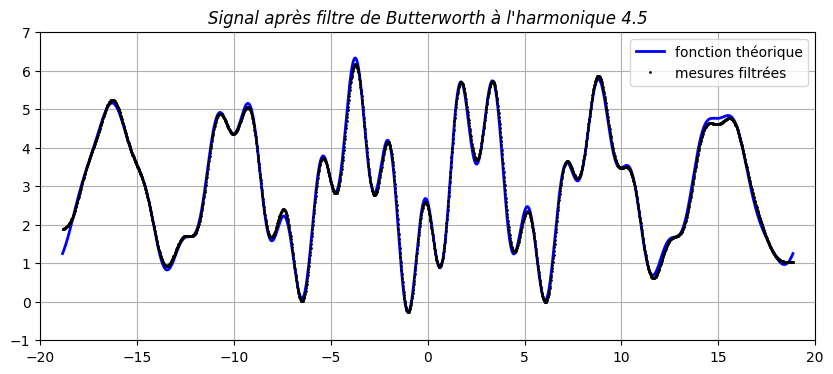

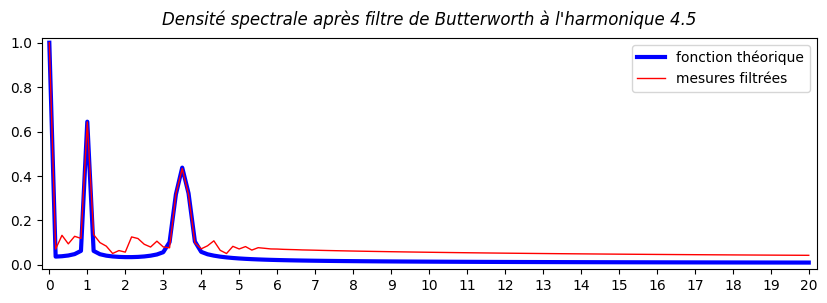

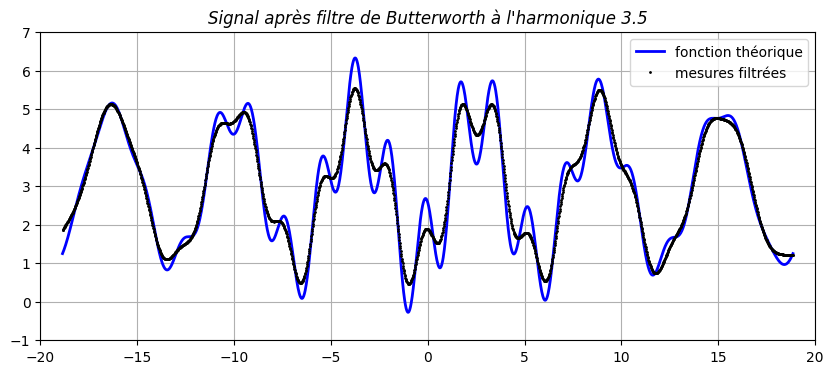

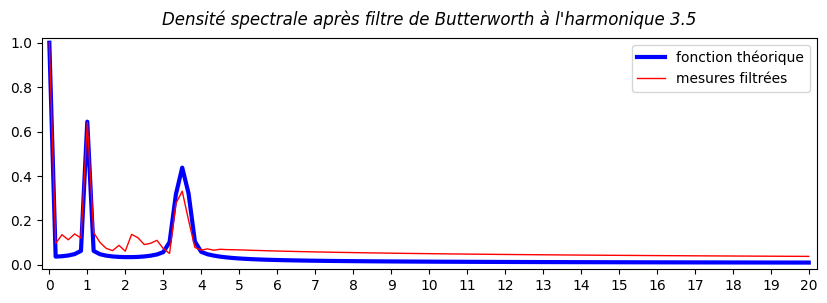

In [95]:
fs = 2*np.pi / (x[1]-x[0]) # fréquence angulaire de l'harmonique 1 (nécessaire pour configurer le filtre)
for h in (8, 4.5, 3.5): # itération sur les 3 harmoniques choisies pour le filtre de Butterworth
  b, a = sig.butter(N=8, Wn=h, btype='low', fs=fs) # création du filtre normalisé de Butterworth (n = 8)
  butter = sig.filtfilt(b, a, expe) # double application du filtre pour éviter le déphasage du signal
  butterG = gamma(density(fft.fft(butter))) # calcul et compression gamma de la densité spectrale

  mp.figure(figsize=(10,4)); title = f"Signal après filtre de Butterworth à l'harmonique {h}"
  mp.plot(x, theo, 'b-', lw=2, label='fonction théorique') # fonction théorique en bleu
  mp.plot(x, butter, 'k.', ms=2, label='mesures filtrées') # mesures filtrées en noir
  mp.axis([-20, 20, -1, 7]); mp.legend(); mp.title(title, style='italic'); mp.grid()

  mp.figure(figsize=(10,3)); title = f"Densité spectrale après filtre de Butterworth à l'harmonique {h}"
  mp.xticks(range(cut+1), map(str, range(cut+1))); mp.axis([-0.2, cut+0.2, -0.02, 1.02])
  mp.plot(freq[keep], theoG[keep], 'b-', lw=3, label='fonction théorique') # spectre théorique en bleu
  mp.plot(freq[keep], butterG[keep], 'r-', lw=1, label='mesures filtrées') # spectre des mesures en rouge
  mp.legend(); mp.title(title, style='italic', pad=10);

---
#### d - Extraction des composantes spectrales

Une dernière opération classique en traitement du signal, après avoir calculé la densité spectrale et filtré le bruit, consiste à extraire les différentes ***composantes spectrales du signal*** de départ, dans le but d'en obtenir une expression analytique.

Pour notre exemple des mesures bruitées, on sait que le signal présente 3 pics principaux aux harmoniques 0, 1 et 3.5. On va donc chercher à extraire les 3 composantes du signal qui sont générée respectivement par chacun de ces 3 pics. Pour cela, on crée un masque appelé **`trimask`** correspondant à une fonction triangulaire dans le domaine spectral. En positionnant ce masque sur l'harmonique centrale d'un pic, il va éliminer toutes les fréquences qui sont à l'extérieur de ce triangle, pour ne garder que celles faisant partie du pic. Voici le code permettant de mettre en oeuvre ce processus, en partant directement des mesures bruitées initiales, sans chercher à utiliser les résultats fournis par les techniques de lissage, détaillées plus haut :

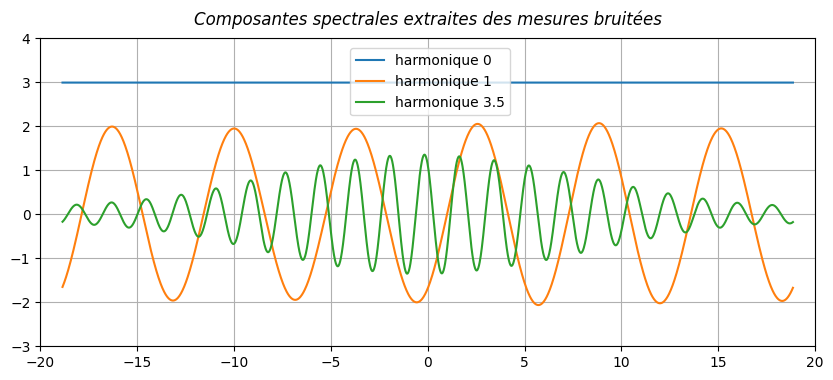

In [96]:
def trimask(freq, h, w=1):
  """apply spectral triangular mask of width 'w' and centered at harmonic 'h'"""
  f = np.abs(freq); out = np.zeros_like(f); a, b = h-w, h+w # define mask boundaries
  m2 = (h > 0) & (f >= h) & (f <= b); out[m2] = (b-f[m2])/w # right edge of triangle, increase from h to b
  m1 = (h > 0) & (f >= a) & (f <= h); out[m1] = (f[m1]-a)/w # left edge of triangle, decrease from a to h
  m0 = (h == 0) & (f == 0); out[m0] = 1; return out # add harmonic 0, when h == 0

mp.figure(figsize=(10,4), dpi=100); title = 'Composantes spectrales extraites des mesures bruitées'
for h in (0, 1, 3.5): # itération sur les 3 harmoniques identifiées pour le signal
  mask = trimask(freq, h) # création du masque triangulaire pour extraction de l'harmonique courante
  spectral = fft.fft(expe) * mask # application du masque dans le domaine complexe
  spatial = fft.ifft(spectral).real # reconstruction du signal réel par transformée de Fourier inverse
  mp.plot(x, spatial, label=f"harmonique {h}") # affichage de la composante extraite
mp.axis([-20, 20, -3, 4]); mp.legend(loc=(0.4,0.75)); mp.title(title, style='italic', pad=10); mp.grid()

Pour arriver à mieux comprendre ce résultat graphique, on rappelle l'expression de la fonction théorique $f(x)$ qui avait été utilisée, dans la section D1 pour créer nos mesures bruitées :

$$ f(x) = 3 + 2 \sin(x–1) + \frac{3}{2}\; \sin(1–\frac{7}{2}x)\; {\sf e}^{\textstyle –x^2/120} $$

La fonction est composée d'une somme de trois termes, qui correspond aux trois composantes spectrales :

- La ***courbe bleue*** (harmonique 0) correspond au terme constant de l'expression de $f(x)$. Sans surprise, l'amplitude de la composante continue est égale à 3, puisque c'est la valeur du terme constant

- La ***courbe orange*** (harmonique 1) correspond au second terme de $f(x)$. Il s'agit d'une sinusoïde d'amplitude égale à 2 (la courbe oscille entre -2 et 2) et dont la période est de $2\pi$ (c'est-à-dire une fréquence angulaire de 1). L'amplitude de 2 signifie que le coefficient multiplicatif devant la sinusoïde est égale à 2, et la fréquence angulaire de 1 signifie que le terme est de la forme $\sin(x + a)$ où $a$ correspond à l'***angle de déphasage de l'harmonique***.

- La ***courbe verte*** (harmonique 3.5) correspond à la troisième composante spectrale qui est clairement plus complexe que les deux autres. Nous on sait qu'il s'agit d'une sinusoïde attenuée par une gaussienne car on dispose de l'expression de la fonction théorique, mais en situation normale, cette expression n'est évidemment pas connue et il s'agit justement de retrouver l'expression associée. Comme il s'agit de l'harmonique 3.5, on peut dire que la composante est de la forme $\lambda(x)\sin(3.5x+b)$ où $\lambda(x)$ correspond à l'***enveloppe de l'harmonique*** (également appelée "fonction de modulation de l'amplitude") et $b$ à son angle de déphasage

Pour (re)trouver l'expression analytique complète de $f(x)$ à partir des mesures bruitées, il nous reste donc à déterminer les valeurs de $a$ (déphasage de l'harmonique 1), de $b$ (déphasage de l'harmonique 3.5) et l'expression de $\lambda(x)$ (enveloppe de l'harmonique 3.5). La solution habituelle pour déterminer l'enveloppe d'une harmonique consiste à identifier les maxima locaux de cette harmonique et d'ajuster une fonction prédéfinie sur la séquence de points obtenus. Comme les variations d'amplitude engendrées par l'enveloppe ressemblent très fortement à une courbe en cloche, on se dit que le modèle à ajuster pourrait être soit une fonction de Gauss $g(x)$, soit une fonction de Hann $h(x)$. Pour chacun des deux modèles, on définit ainsi deux degrés de liberté qui seront ajustés par le processus de fitting : l'amplitude $a$ et la vitesse de décroissance $b$ :

$$ {\sf Gauss} : g(x) = a\, {\bf e}^{\textstyle -x^2/b}\qquad {\sf Hann} : h(x) = a\, \cos^2(x/b) $$

Le module **`scipy.signal`** contient une fonction **`find_peaks`** qui permet d'identifier tous les maxima locaux d'un signal, et le module **`scipy.optimize`** contient la fonction **`curve_fit`** déjà détaillée plus haut, dans la section A2. La combinaison de ces deux fonctions permet d'écrire un code très compact pour l'ajustement des deux modèles d'enveloppe :

Résultat du fitting avec une courbe de Gauss : ga = 1.341 gb = 153.133 RMS = 0.0297
Résultat du fitting avec une courbe de Hann : ha = 1.299 hb = 13.955 RMS = 0.0701


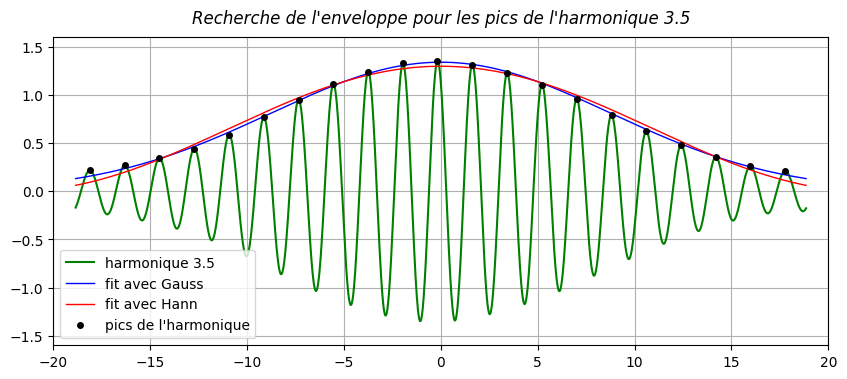

In [97]:
harmo3 = fft.ifft(fft.fft(expe) * trimask(freq, 3.5)).real # extraction de l'harmonique 3.5
peaks,_ = sig.find_peaks(harmo3); xpk, ypk = x[peaks], harmo3[peaks] # détection et extraction des maxima

g = lambda x, a, b: a * np.exp(-x**2/b) # modèle pour la courbe de Gauss à fitter
(ga, gb), _ = opt.curve_fit(g, xpk, ypk, p0=[1,100]) # utilisation de 'curve_fit' (cf. section A2)
grms = rms_rel(g(x, ga, gb)[peaks], ypk) # calcul de l'erreur RMS sur la position des maxima
print(f"Résultat du fitting avec une courbe de Gauss : ga = {ga:.3f} gb = {gb:.3f} RMS = {grms:.3g}")

h = lambda x, a, b: a * np.cos(x/b)**2 # modèle pour la courbe de Hann à fitter
(ha, hb), _ = opt.curve_fit(h, xpk, ypk, p0=[1,10]) # utilisation de 'curve_fit' (cf. section A2)
hrms = rms_rel(h(x, ha, hb)[peaks], ypk) # calcul de l'erreur RMS sur la position des maxima
print(f"Résultat du fitting avec une courbe de Hann : ha = {ha:.3f} hb = {hb:.3f} RMS = {hrms:.3g}")

mp.figure(figsize=(10,4)); title = "Recherche de l'enveloppe pour les pics de l'harmonique 3.5"
mp.plot(x, harmo3, 'g-', label='harmonique 3.5') # harmonique 3.5 en vert
mp.plot(x, g(x, ga, gb), 'b-', lw=1, label='fit avec Gauss') # enveloppe de Gauss en bleu
mp.plot(x, h(x, ha, hb), 'r-', lw=1, label='fit avec Hann') # enveloppe de Hann en magenta
mp.plot(xpk, ypk, 'ko', ms=4, label="pics de l'harmonique") # pics détectés en noir
mp.axis([-20, 20, -1.6, 1.6]); mp.legend(); mp.title(title, style='italic', pad=10); mp.grid()

On vérifie que le fit avec la courbe de Gauss donne un meilleur ajustement (RMS = 0.03) que celui avec la courbe de Han (RMS = 0.07), ce qui n'est pas surprenant puisque c'est bien une gaussienne qui est présent dans la fonction théorique. En regroupant maintenant l'ensemble des éléments qu'on a déjà pu extraire à partir de nos mesures bruitées, on peut établir un modèle de fonction $\overline{f\:}(x)$ qui ne contient plus que quatre degrés de liberté $(a,b,c,d)$ :

$$ \overline{f\:}(x) = 3 + 2 \sin(x + a) + b\; \sin(c - 3.5x)\; {\sf e}^{\textstyle –x^2/d} $$

Il ne reste donc qu'un dernier **`curve_fit`** à lancer sur l'ensemble des mesures bruitées, pour trouver les valeurs optimales pour ces quatre paramètres, sachant que pour les paramètres $b$ (amplitude de l'enveloppe) et $d$ (vitesse de décroissance d'enveloppe gaussienne) on peut utiliser les valeurs fournies par le fit précédent comme point de départ. Voici le résultat :

Résultat du fitting : a = -1.000 b = 1.487 c = 0.996 d = 122.526 RMS = 0.00194


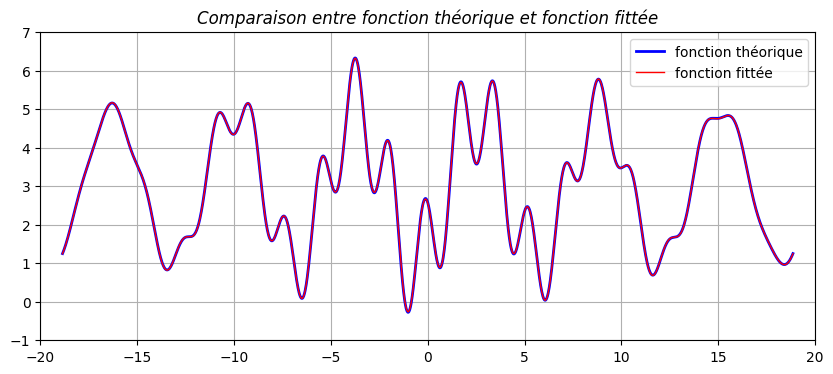

In [98]:
ff = lambda x,a,b,c,d: 3 + 2*np.sin(x+a) + b*np.sin(c-3.5*x)*np.exp(-x*x/d) # modèle de la fonction à fitter
p0 = [0, 1.341, 0, 153.1] # définition des paramètres de départ (en se basant sur le fit précédent)
(a, b, c, d), _ = opt.curve_fit(ff, x, expe, p0=p0) # ajustement du modèle sur les mesures bruitées initiales
rms = rms_rel(ff(x, a, b, c, d), theo) # calcul de l'erreur RMS par rapport à la fonction théorique
print(f"Résultat du fitting : a = {a:.3f} b = {b:.3f} c = {c:.3f} d = {d:.3f} RMS = {rms:.3g}")

mp.figure(figsize=(10,4), dpi=100); title = 'Comparaison entre fonction théorique et fonction fittée'
mp.plot(x, theo, 'b-', lw=2, label='fonction théorique') # fonction théorique en bleu
mp.plot(x, ff(x,a,b,c,d), 'r-', lw=1, label='fonction fittée') # fonction fittée en rouge
mp.axis([-20, 20, -1, 7]); mp.legend(); mp.title(title, style='italic'); mp.grid()

En conclusion, en combinant une technique d'analyse spectrale et une technique d'ajustement de fonction, on a pu retrouver l'intégralité des 8 paramètres de la fonction théorique, en opérant uniquement à partir des données bruitées initiales. Le résultat de l'ajustement final présente moins de 0.2% d'erreur par rapport à la fonction théorique, ce qui apparaissait comme très difficile à obtenir, au regard de l'ampleur des erreurs de mesure qui étaient présentes dans les données de départ.

---
### 3 - Module 'scipy.ndimage'

Le module [**scipy.ndimage**](https://docs.scipy.org/doc/scipy/tutorial/ndimage.html) fournit des outils pour le traitement de tout signal multidimensionnel échantillonné de manière uniforme. Le nom du module vient du fait qu'un tel signal échantillonné peut être considéré comme la généralisation à une dimension arbitraire $d$, de la notion classique d'image numérique où les "pixels" passeraient d'une dimension 2 à une dimension $d$. Le point fort du module **`scipy.ndimage`** est justement cette aptitude à pouvoir traiter des dimensions arbitraires, car dans le domaine des Science des Données, l'échantillonnage uniforme de fonctions multivariées est un outil d'utilisation très fréquente. Les fonctionnalités offertes par le module se regroupent principalement en trois grandes familles : les **filtres** permettant de modifier les valeurs des échantillons, les **transformations géométriques** permettant de modifier la structure spatiale du signal, et enfin, les **fonctions de détection, mesure et classification** permettant d'analyser le contenu du signal pour identifier et catégoriser les éléments présents à plusieurs échelles.

> **Note :** Lorsqu'on se focalise uniquement sur le traitement d'images numériques 2D, il est recommandé de se tourner vers d'autres packages plus spécifiques, parmi lesquels les packages [**opencv**](https://opencv.org) et [**scikit-image**](https://scikit-image.org) sont considérés comme les plus complets et les plus performants

In [99]:
import scipy.ndimage as ndi
#inspect(ndi, detail=0) # augmenter la valeur de 'detail' pour avoir plus d'informations

---
#### a - Filtrage d'images

Voici la liste des principaux filtres disponibles dans `scipy.ndimage`, classés par type d'utilisation :

**Filtres de lissage**

- **`uniform_filter`** : filtre de moyenne uniforme<br>
  permet de lisser l'image en remplaçant chaque pixel par la moyenne locale de ses voisins
- **`gaussian_filter`** : filtre gaussien isotrope ou anisotrope<br>
  permet de lisser l'image avec une pondération gaussienne centrée sur chaque pixel
- **`gaussian_filter1d`** : filtre gaussien 1D<br>
  permet d'appliquer un filtre gaussien indépendamment selon chaque axe
- **`median_filter`** : filtre médian<br>
  permet de supprimer efficacement le bruit impulsionnel sans flouter les bords.
- **`fourier_uniform`** : filtre carré ou rectangulaire dans l'espace de Fourier<br>
  permet d'appliquer un filtre passe-bas par masque rectangulaire dans le domaine fréquentiel
- **`fourier_ellipsoid`** : filtre circulaire ou ellipsoïdal dans l'espace de Fourier<br>
  permet d'appliquer un filtre passe-bas par masque ellipsoïdal dans le domaine fréquentiel
- **`fourier_gaussian`** : filtre gaussien isotrope ou anisotrope dans l'espace de Fourier<br>
  permet d'appliquer un filtre passe-bas par masque gaussien dans le domaine fréquentiel

**Filtres de détection**
- **`prewitt`** : filtre de Prewitt (dérivée première)<br>
  permet de détecter les transitions locales avec une approximation simple de la dérivée première
- **`sobel`** : filtre de Sobel (dérivée première)<br>
  version améliorée de **`prewitt`** qui fournit une meilleure approximation de la dérivée première
- **`scharr`** : filtre de Scharr (dérivée première)<br>
  version améliorée de **`sobel`** qui fournit une approximation quasiment isotrope de la dérivée
- **`laplace`** ou **`laplacian`** : filtre Laplacien (dérivée seconde)<br>
  permet de détecter les zones de variation rapide via la dérivée seconde
- **`gaussian_laplace`** : double filtre LOG (laplacian over gaussian)<br>
  permet de détecter les structures à une échelle donnée

**Filtres morphologiques** (cf. [**morphologie mathématique**](https://fr.wikipedia.org/wiki/Morphologie_math%C3%A9matique))
- **`grey_dilatation`** : dilatation sur une image monochrome<br>
  permet d'étendre les zones claires en remplaçant chaque pixel par le maximum local
- **`grey_erosion`** : érosion sur une image monochrome<br>
  permet de réduire les zones claires en remplaçant chaque pixel par le minimum local
- **`grey_opening`** : ouverture sur une image monochrome (érosion puis dilatation)<br>
  permet de supprimer les petites taches claires dans les zones sombres, tout en conservant la structure principale
- **`grey_closing`** : fermeture sur une image monochrome (dilatation puis érosion)<br>
  permet de supprimer les petites taches sombres dans les zones claires, tout en conservant la structure principale
- **`maximum_filter`** : version rapide du filtre de dilatation avec masque carré<br>
  équivalent à **`grey_dilation`** mais avec un masque fixe
- **`minimum_filter`** : version rapide du filtre d'érosion avec masque carré<br>
  équivalent à **`grey_erosion`** mais avec un masque fixe
- **`rank_filter`** : filtre par rang<br>
  permet de sélectionner le pixel pour une valeur de rang donnée dans l'échelle des intensités
- **`percentile_filter`** : filtre par percentile<br>
  permet d'extraire une valeur de percentile dans l'échelle des intensités

**Filtres personnalisables**
- **`convolve`** : convolution multidimensionnelle<br>
  permet de filtrer une image avec un noyau de convolution arbitraire
- **`convolve1d`** : convolution 1D<br>
  permet d'appliquer un noyau de convolution arbitraire indépendamment selon chaque axe
- **`correlate`** : corrélation multidimensionnelle<br>
  similaire à **`convolve`** mais sans effectuer d'inversion du noyau
- **`correlate1d`** : corrélation 1D<br>
  similaire à **`convolve1d`** mais sans effectuer d'inversion du noyau
- **`generic_gradient_magnitude`** : filtre gradient personnalisé<br>
  permet de calculer la norme du gradient avec une fonction de dérivation personnalisée
- **`generic_laplace`** : filtre laplacien personnalisé<br>
  permet de calculer la dérivée seconde avec une fonction de dérivation personnalisée
- **`generic_filter`** : filtre non-linéaire générique<br>
  permet d'appliquer une fonction non-linéaire personnalisée sur un voisinage.
- **`generic_filter1d`** : filtre non-linéaire générique 1D<br>
  permet d'appliquer un filtre générique indépendamment selon chaque axe

L'action de certains de ces filtres est présentée dans le code et la figure ci-dessous, en prenant comme image de départ, le logo de l'application JupyterLab, converti en signal 2D (= image monochrome de luminance) :

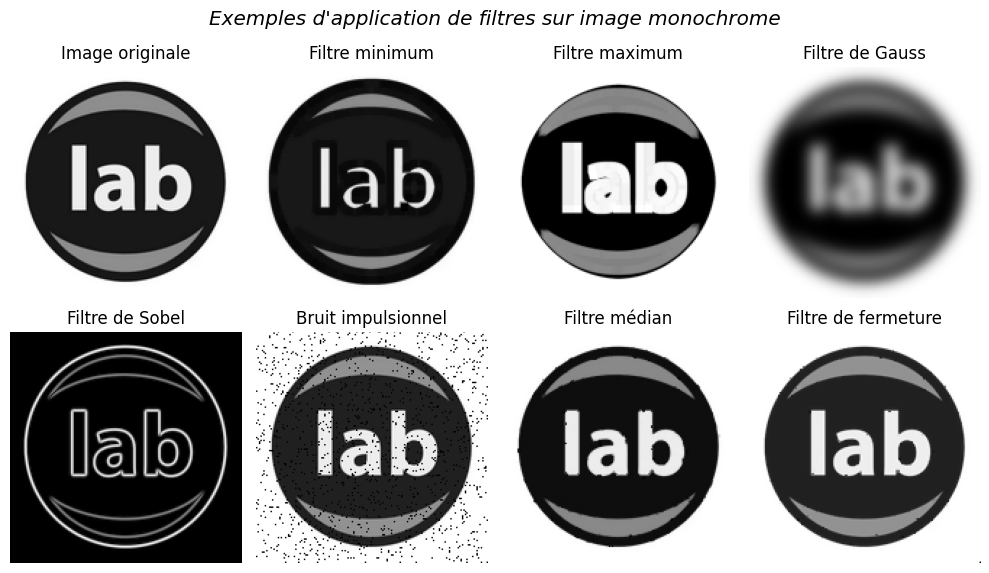

In [100]:
rgb = mp.imread('IMG/jupyterlab.png') # lecture de l'image RGB sur disque (format PNG)
gray = rgb @ [0.299, 0.587, 0.114] # conversion de l'image RGB en image monochrome de luminance
gauss = ndi.gaussian_filter(gray, sigma=5) # filtre de Gauss (= ajout de flou)
mini = ndi.minimum_filter(gray, size=5) # filtre minimum (= dilatation des zones sombres)
maxi = ndi.maximum_filter(gray, size=5) # filtre maximum (= dilatation des zones claires)
sobel = np.hypot(ndi.sobel(gray, 0), ndi.sobel(gray, 1)) # filtre de Sobel (= détection des contours)
noise = gray * (np.random.random(gray.shape) > 0.05) # ajout de bruit impulsionnel (= 5% de pixels noirs)
median = ndi.median_filter(noise, size=3) # suppression du bruit impulsionnel avec filtre mediam
closing = ndi.grey_closing(noise, size=2) # suppression du bruit impulsionnel avec filtre de fermeture

images = ((1, 'Image originale', gray), (2, 'Filtre minimum', mini), (3, 'Filtre maximum', maxi),
  (4, 'Filtre de Gauss', gauss), (5, 'Filtre de Sobel', sobel), (6, 'Bruit impulsionnel', noise),
  (7, 'Filtre médian', median), (8, 'Filtre de fermeture', closing)) # regroupement des images obtenues

mp.figure(figsize=(10,6)); suptitle = "Exemples d'application de filtres sur image monochrome"
for fig, title, img in images:
  mp.subplot(2, 4, fig); mp.axis('off'); mp.imshow(img, cmap='gray'); mp.title(title)
mp.suptitle(suptitle, size='x-large', style='italic'); mp.tight_layout()

---
#### b - Détection et analyse d'objets

Une application classique qui utilise le module **`scipy.ndimage`** concerne la détection automatisée et l'analyse géométrique d'une série d'objets présents sur une image. On va d'abord illustrer le principe dans un cas de figure assez simple, présenté sur la figure ci-dessous, avec une image contenant 7 objets colorés qui se détachent sur un arrière-plan noir :

shapes.shape ➤ (480, 640, 3)
shapes.dtype ➤ uint8
shapes.min() ➤ 0
shapes.max() ➤ 255


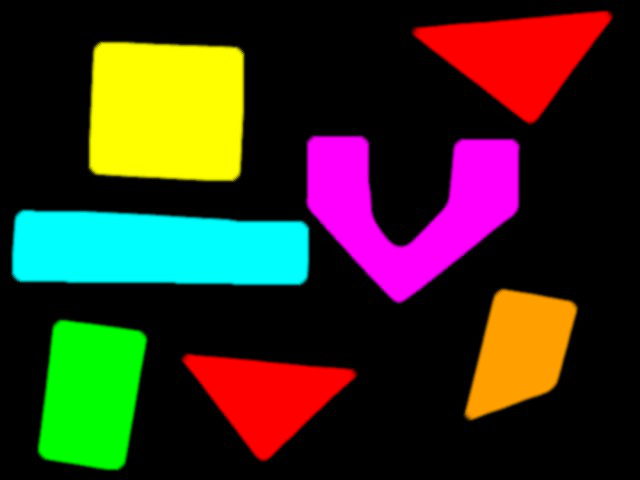

In [101]:
shapes = mp.imread('IMG/shapes1.jpg') # lecture de l'image RGB sur disque (format JPG)
show("shapes.shape; shapes.dtype; shapes.min(); shapes.max()") # caractéristiques de l'image
view(shapes) # affichage de l'image initiale

La première étape à réaliser s'appelle une **segmentation** et consiste à répartir les pixels en deux catégories : ceux qui font partie de l'arrière-plan noir, et ceux qui font partie des objets colorés. Comme on peut le constater, le contour des objets est un peu flou, donc pour détecter correctement ce contour, il faut trouver un test de segmentation adéquat. Une idée naïve consiste à dire que comme l'arrière-plan est noir et que le noir est défini par le triplet $(0,0,0)$, tous les pixels qui vérifient $R+G+B > 0$ font forcément partie des objets. On peut donc effectuer la segmentation par un simple test booléen, ce qui permet d'obtenir une image noir et blanc qu'on appelle un **masque binaire** dans le vocabulaire du traitement d'images :

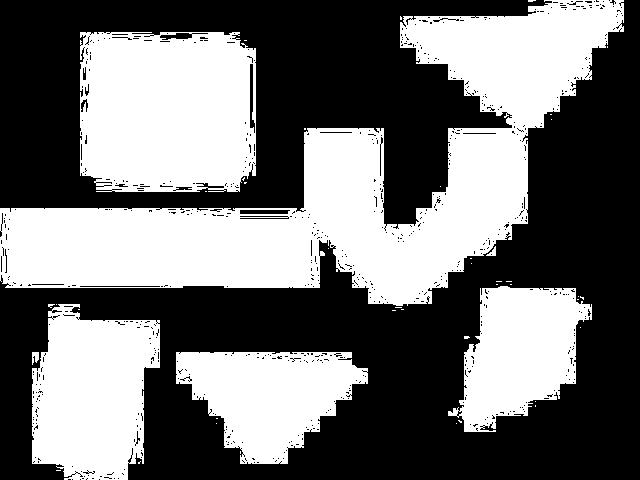

In [102]:
mask = np.sum(shapes, axis=2) > 0 # détection des pixels différents du noir (critère : R+B+G > 0)
view(mask) # masque binaire avec seuil de 0 (= présence de nombreux artefacts liés à la compression JPEG)

Le résultat est assez surprenant avec l'apparition de blocs de taille 8x8 qui n'étaient absolument pas présents dans l'image initiale. En fait, ces blocs sont des artefacts liés à la compression JPEG qui a été appliquée à l'image initiale. L'algorithme JPEG est une méthode de compression avec pertes qui va découper l'image en blocs de 8x8 et supprimer des informations de chrominance et de luminance de telle manière à ce que l'oeil humain ne détecte pas les éléments supprimés. En particulier, pour certains blocs, à la frontière des objets, le noir sera légèrement modifié pour ne plus être parfaitement noir, si cela peut améliorer la compression des données liées au bloc concerné. Le test $R+G+B > 0$ est donc trop strict pour identifier correctement les pixels appartenants aux objets colorés. Une alternative qui fonctionne très bien dans de nombreuses situations est de définir les pixels noirs comme étant ceux qui vérifient $R+G+B \le 36$ car ils sont quasiment impossibles à différencier du noir pur pour l'oeil humain, et sans surprise, le résultat est bien meilleur avec ce nouveau seuil :

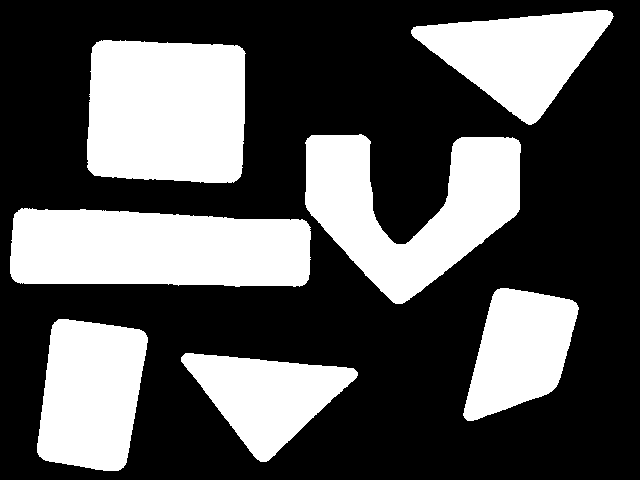

In [103]:
mask = np.sum(shapes, axis=2) > 36 # détection des pixels différents du noir (critère : R+B+G > 36)
view(mask) # masque binaire avec seuil de 36 (= résultat bien meilleur)

Une fois que cette opération de segmentation binaire a été réalisée correctement, la fonction **`label`** appartenant au module **`scipy.ndimage`** va faire tout le reste du travail automatiquement. Concrètement, elle va identifier toutes les zones connexes de pixels blancs, affecter un label numérique (entre 1 et $n$) à chaque zone connexe et renvoyer deux paramètres: **`labels`** qui contient une image de même taille que l'image initiale mais dans laquelle chaque pixel contient le label numérique associé à la zone à laquelle il appartient, et **`count`** qui contient le nombre total de zones connexes identifiées, en dehors des pixels de l'arrière-plan qui sont systématiquement affectés du label 0. En associant une couleur aléatoire à chaque label numérique, via la fonction **`np.random.rand`**, on peut visualiser la segmentation automatique réalisée par la fonction :

Nombre d'objets détectés en dehors de l'arrière-plan =  7


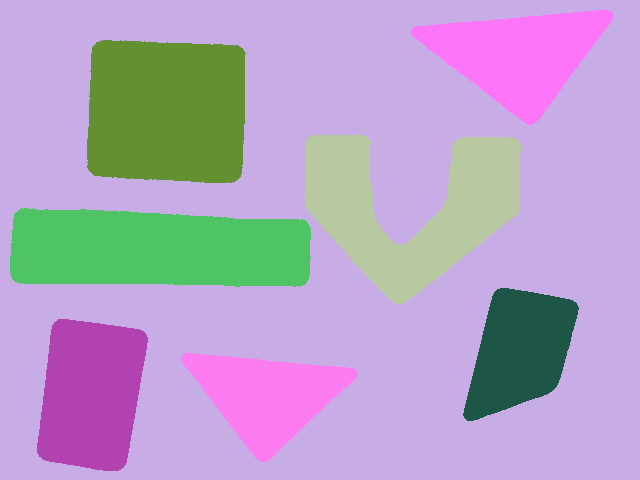

In [104]:
labels, count = ndi.label(mask) # identification et numérotation des zones connexes de pixels non-noirs
print("Nombre d'objets détectés en dehors de l'arrière-plan = ", count)
colors = np.random.rand(count+1, 3) # génération d'une palette de couleurs aléatoires
view(colors[labels]) # coloriage de chaque objet détecté en fonction de son label

Il ne reste plus qu'à effectuer différents traitements sur les objets détectés. Par exemple, le code ci-dessous permet de calculer la surface (en nombre de pixels) ainsi que la couleur médiane de chaque des zones connexes identifiées par la segmentation :

In [105]:
for label in range(1, count+1): # itération sur les objets (le label 0 correspond à l'arrière-plan)
  zone = (labels == label) # extraction de la zone connexe associée au label courant
  area = np.sum(zone) # colcul de la surface (= nombre de pixels de la zone courante)
  color = np.median(shapes[zone], axis=0).astype('u1') # calcul de la couleur médiane pour la zone courante
  print(f"Object {label} : Color = {color}, Area = {area} pixels") # affichage du résultat

Object 1 : Color = [254   0   0], Area = 12197 pixels
Object 2 : Color = [255 255   0], Area = 21214 pixels
Object 3 : Color = [255   0 254], Area = 19274 pixels
Object 4 : Color = [  0 255 255], Area = 21052 pixels
Object 5 : Color = [255 159   0], Area = 10094 pixels
Object 6 : Color = [  0 255   1], Area = 13429 pixels
Object 7 : Color = [254   0   0], Area = 10072 pixels


---
#### c - Détection de similarité de couleurs

L'exemple précédent était un cas purement pédagogique, où tous les paramètres étaient réglés pour obtenir un résultat fiable du premier coup. L'exemple traité dans cette section est nettement plus réaliste pour illustrer les difficultés qu'il faut arriver à surmonter avant de pouvoir faire de l'analyse pertinente sur des images. Comme on peut le voir sur l'image ci-dessous, cette fois-ci il n'y a plus de formes qui se détachent clairement sur un fond uniforme : pour pouvoir identifier les divers objets composant l'image, il faut arriver à détecter les similarités de couleurs, tâche que le cerveau humain sait réaliser de manière très efficace, mais qui est beaucoup moins évidente pour un algorithme :

shapes.shape ➤ (480, 640, 3)
shapes.dtype ➤ uint8
shapes.min() ➤ 0
shapes.max() ➤ 255


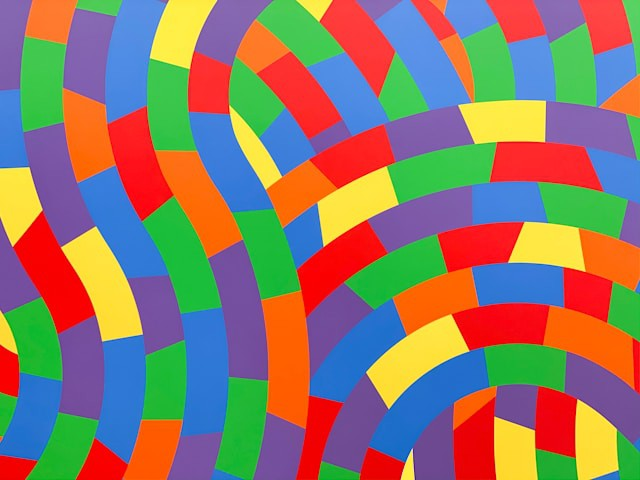

In [106]:
shapes = mp.imread('IMG/shapes2.jpg') # lecture de l'image RGB sur disque (format JPG)
show("shapes.shape; shapes.dtype; shapes.min(); shapes.max()") # caractéristiques de l'image
view(shapes) # affichage de l'image initiale

En analysant cette image, le cerveau humain va ***naturellement identifier 6 couleurs uniques*** : rouge,  vert, bleu, jaune, violet et orange. Mais la seule notion de couleur qui existe pour un programme, est la valeur d'un triplet RGB, ce qui signifie que pour analyser les couleurs de l'image, il faut commencer par compter le nombre de triplets RGB différents qui sont présents. Dans le chapitre 5, on a vu que la fonction **`unique`** de **numpy** permet de compter le nombre d'éléments différents dans un vecteur, mais elle ne permet de compter que des scalaires, pas des triplets. Donc pour pouvoir l'utiliser, on va associer une valeur entière spécifique à chaque triplet RGB, en calculant $2^{16}R + 2^8G + 2^0B$ ce qui donne une valeur entre $0$ et $2^{24}-1$ :

In [107]:
code = shapes @ [65536,256,1] # transformation de chaque couleur en un code numérique (65536*R + 256*G + B)
uniques = np.unique(code.reshape(-1)) # extraction des codes (donc des couleurs) uniques
print('Nombre de couleurs différentes trouvées = ', len(uniques)) # beaucoup trop de couleurs différentes !!!

Nombre de couleurs différentes trouvées =  65725


On constate qu'il n'y a pas 6 couleurs dans l'image, mais ***plus de 65000 triplets RGB différents***. Evidemment beaucoup de ces triplets sont très proches, c'est pourquoi l'oeil humain ne distingue pas les couleurs correspondantes. Par conséquent, pour mieux comprendre la structure de l'image, nous allons modifier les couleurs en associant, à chaque code numérique donné, une couleur aléatoire obtenue en réutilisant la fonction **`np.random.rand`** comme précédemment :

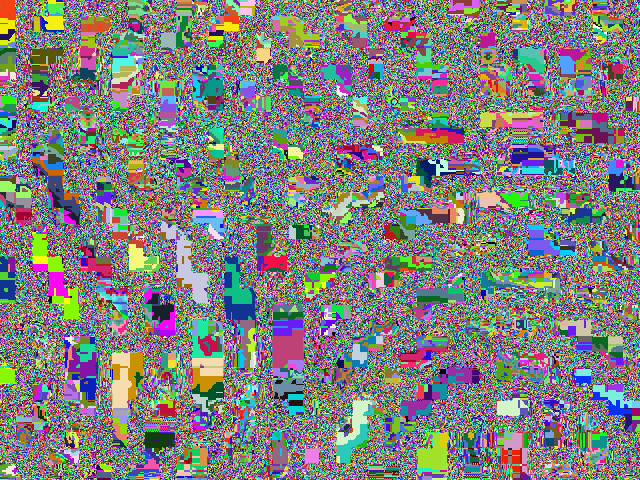

In [108]:
labels = np.searchsorted(uniques, code.reshape(-1)) # association de chaque code à son label unique
colors = np.random.rand(len(uniques), 3) # association d'une couleurs aléatoire par label
view(colors[labels].reshape(shapes.shape)) # coloriage de chaque pixel en fonction de son label

Le résultat obtenu montre qu'il n'y a aucune cohérence entre les couleurs uniques et les localisations des objets dans l'image : il y a certaines zones qui montrent des aplats de couleurs, mais ces aplats sont plutôt organisés selon les blocs 8x8 de la compression JPEG et n'ont pas grand-chose à voir avec les contours effectifs des objets présents dans l'image.

La seule manière pour effectuer une segmentation consiste donc à regrouper les couleurs similaires, et ainsi identifier la localisation des aplats de couleurs dans l'image initiale. Pour cela, on va mettre en oeuvre un grand classique dans le domaine des Sciences de Données, qui s'appelle l'[**algorithme de clusterisation par k-moyennes**](https://fr.wikipedia.org/wiki/K-moyennes), mais qui est bien plus fréquement désigné par son nom anglais [**k-means clustering**](https://en.wikipedia.org/wiki/K-means_clustering). Comme il s'agit d'un outil fondamental, il existe plusieurs implémentations de cet algorithme dans l'écosystème ***Scientific Python***, dont la plus efficace (utilisation automatique des architectures multi-coeurs et/ou des cartes graphiques) se trouve dans le package **`scikit-learn`**. Le module **`scipy.cluster`** contient une implémentation basique du ***k-means clustering***, dont le code assez ancien est aujourd'hui considéré comme dépassé (comme les autres fonctions disponibles dans ce même module) mais qui sera largement suffisant pour notre exemple.

La fonction **`clusterize`** ci-dessous prend en entrée une image et une valeur entière **`n`** et va utiliser la fonction **`kmeans`** de **`scipy.cluster`** pour regrouper l'ensemble des couleurs des pixels de l'image en **`n`** ***clusters***, tels que la distance entre les points affectés à un même cluster et le barycentre de ce cluster soit minimale. La fonction retourne un vecteur **`colors`** contenant **`n`** couleurs obtenues en calculant la couleur moyenne des pixels affectés à chaque cluster, ainsi qu'une image **`labels`** associant chaque pixel à son numéro de cluster, similaire à la fonction **`label`** vue dans l'exemple précédent :

In [109]:
from scipy.cluster.vq import kmeans, vq # import des fonctions de clusterisation (vq = vector quantization)

def clusterize(image, n):
  """clusterize all RGB colors of 'image' into 'n' clusters"""
  pixels = image.reshape(-1,3).astype(float) # convert image into a vector of (R,G,B) float values
  colors, _ = kmeans(pixels, n) # use 'kmeans' to get the average color for each cluster
  labels, _ = vq(pixels, colors) # assign a label to each pixel according to its cluster
  return colors.round().astype('u1'), labels.reshape(image.shape[:2]) # return colormap and label image

Comme l'image contient 6 couleurs caractéristiques, on se dit qu'utiliser $n = 6$ semble une bonne option pour démarrer :

colors6 ➤
[[123  88 159]
 [246  19  22]
 [ 59 127 215]
 [251 227  67]
 [249  99  25]
 [ 48 190  67]]


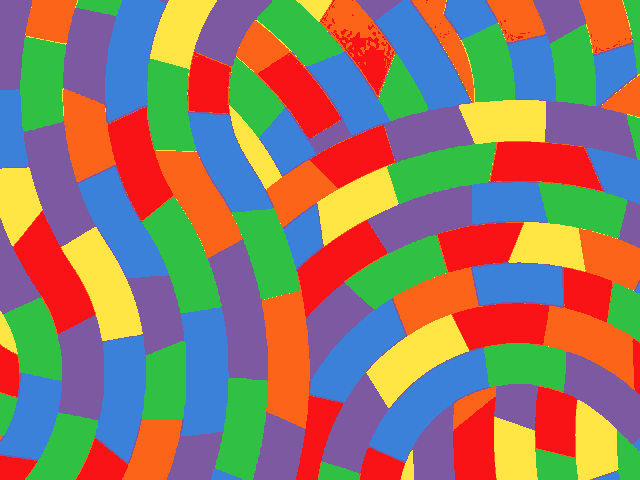

In [110]:
colors6, labels6 = clusterize(shapes, 6) # clusterisation de l'image en 6 couleurs
show("colors6#") # affichage de la palette des couleurs obtenues
view(colors6[labels6]) # affichage de l'image après clusterisation en 6 couleurs

Effectivement, l'algorithme de clusterisation a bien identifié six couleurs caractéristiques (rouge, vert, bleu, jaune, orange et violet) dans la variable **`colors6`**. Mais si la classification en zones homogènes se passe bien sur la partie basse de l'image, les résultats sont moins convaincants sur la partie haute : il y a systématiquement une bande jaune fine qui est insérée sur la frontière entre une zone verte et une zone orange, de même qu'une bande violette entre une zone jaune et une zone bleue, et surtout il y a confusion de couleurs importante entre le rouge et l'orange pour certaines zones.

Les deux types d'erreurs n'ont pas la même origine : les bandes fines sont causées par la nature de l'espace chromatique du modèle RGB : une interpolation entre de l'orange et du vert dans cet espace donne du jaune, et de même, une interpolation entre du jaune et du bleu donne du violet. Mais comme le phénomène se limite sur des bandes très fines, le problème pourra se corriger facilement, comme on va le voir plus loin. Par contre, la confusion des couleurs entre le rouge et l'orange est lié au fait que ces deux couleurs sont trop proches dans l'espace RGB, et donc la distance n'est pas suffisante pour que l'algorithme **k-means** identifie les bons clusters permettant d'affecter les bonnes étiquettes aux pixels.

Une heuristique qui fonctionne très souvent en cas de mauvaise clusterisation consiste à ***choisir deux fois plus de clusters que nécessaire***, puis fusionner manuellement les clusters deux par deux :

colors12 ➤
[[253 101   8]
 [248  49  51]
 [244   8  11]
 [116  80 153]
 [ 83 141 226]
 [229 123  59]
 [ 67 196  82]
 [252 228  67]
 [133 101 172]
 [ 31 184  53]
 [ 37 114 200]
 [ 54 122 215]]


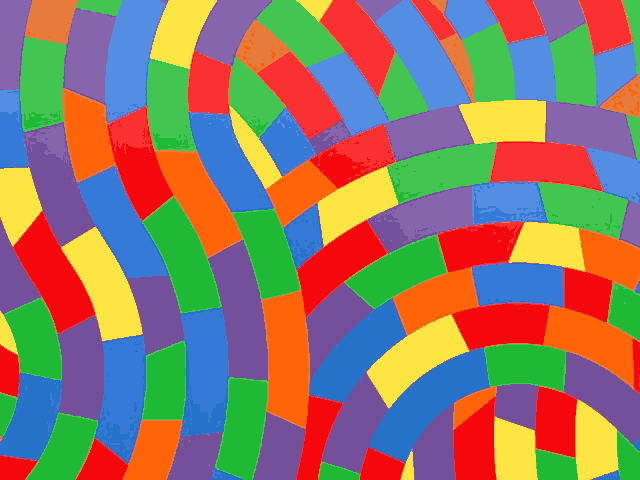

In [111]:
colors12, labels12 = clusterize(shapes, 12) # clusterisation de l'image en 12 couleurs
show("colors12#") # affichage de la palette des couleurs obtenues
view(colors12[labels12]) # affichage de l'image après clusterisation en 12 couleurs

Si l'on regarde de près les 12 couleurs obtenues par la clusterisation et stockées dans la variable **`colors12`**, on constate qu'il y a 1 jaune, 2 bleus, 2 verts, 2 violets, 2 rouges et 3 oranges. Et si on fait abstraction du fait qu'une même zone peut combiner les deux versions de sa couleur de base, on observe que ces 12 couleurs permettent de segmenter très exactement les pixels pour chacune des zones colorées. Il ne reste donc plus qu'à fusionner les paires/triplets de couleurs similaires pour retomber sur les 6 couleurs souhaitées. La fonction **`cdist`** du module **`scipy.spatial`** qui permet de calculer les distances entre chaque paires issues de deux collections de points, est idéale pour cette tâche : en cherchant, pour chaque couleur dans **`colors12`**, la couleur de distance minimale parmi celles de **`colors6`**, on va naturellement regénérer une clusterisation à 6 couleurs, mais cette fois-ci, sans avoir les artefacts observés plus haut :

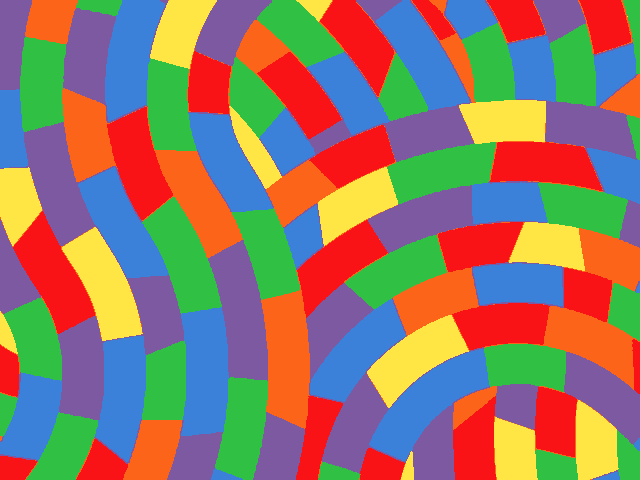

In [112]:
dists = sp.distance.cdist(colors12, colors6) # calcul des distances entre les 2 jeux de couleurs
nearest = dists.argmin(axis=1) # recherche du plus proche voisin de colors6 pour chaque couleur de colors12
labels = nearest[labels12] # mise à jour des labels avec la nouvelle numérotation
shapes6 = colors6[labels]; view(shapes6) # affichage de l'image finale réduite à 6 couleurs

Pour mieux analyser la segmentation chromatique effectuée par la clusterisation, on va afficher séparément les six masques binaires correspondant aux pixels affectés à chacune de ces six couleurs. Pour plus de lisibilité, on va coloriser les masques binaires, en créant une colormap bicolore personnalisée, grâce à la fonction **`ListedColormap`** de **matplotlib** :

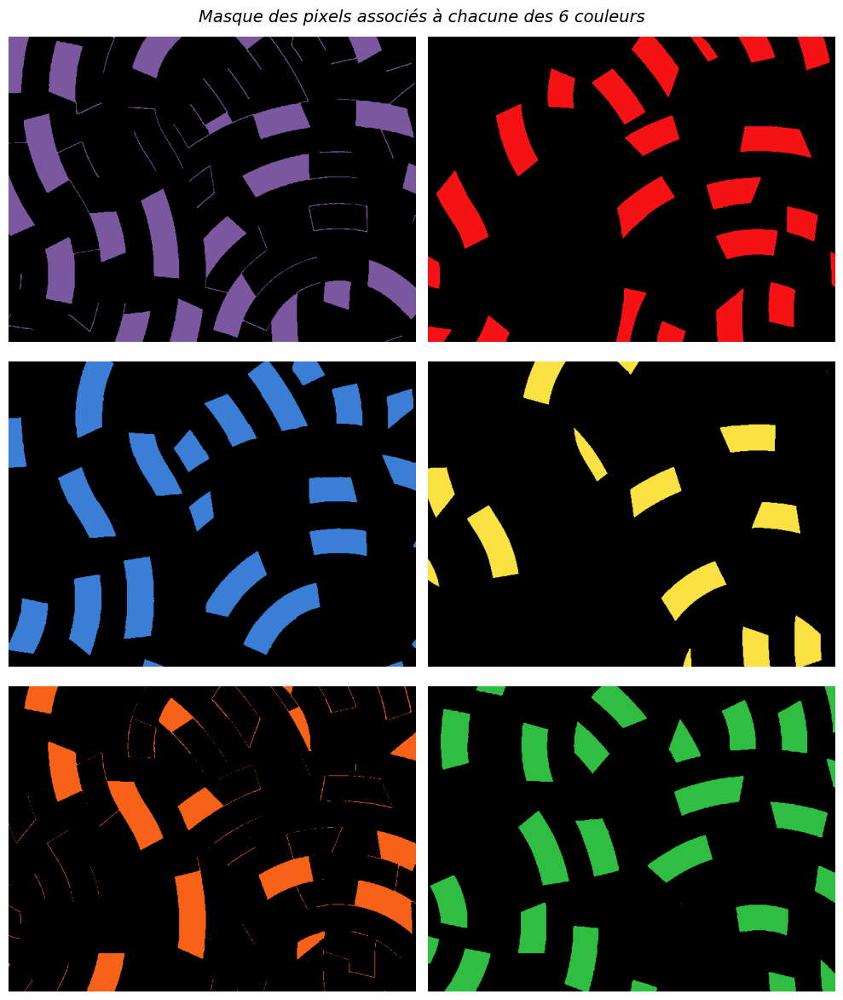

In [113]:
from matplotlib.colors import ListedColormap # import de la fonction de création de colormap personnalisée

mp.figure(figsize=(10,12)); masks = []; title = 'Masque des pixels associés à chacune des 6 couleurs'
for p,color in enumerate(colors6): # itération sur les 6 couleurs
  mp.subplot(3,2,p+1); mp.axis(False) # grille de 3x2 sous-figures
  cmap = ListedColormap([(0,0,0), color/256]) # création d'une colormap bicolore (noir + couleur courante)
  mask = np.all(shapes6 == color, axis=2) # masque binaire = tous les pixels égaux à la couleur courante
  masks.append(mask); mp.imshow(mask, cmap=cmap) # affichage du masque binaire avec la couleur courante
mp.suptitle(title, fontsize=14, style='italic'); mp.tight_layout()

Pour quatre des six couleurs, la segmentation est excellente, avec des aplats de couleurs correspondant parfaitement aux différentes zones identifiées sur l'image initiale. Par contre pour l'image orange, et surtout l'image violette, on observe des lignes fines associées aux bordures de zones d'une autre couleur. C'est le phénomène lié à l'interpolation des couleurs qui avait été mentionné plus haut : les lignes oranges se placent à la frontière entre les zones jaunes et rouges, les lignes violettes lorsqu'une zone bleue est mitoyenne avec une zone rouge, orange ou jaune.

Il existe un opérateur de morphologie mathématique, mentionné plus haut dans la liste des nombreux filtres fournis par le module **`scipy.ndimage`**, qui est idéal pour corriger ce type d'artefact. Il s'agit de l'opérateur morphologique d'**ouverture**, implémenté par le filtre **`binary_opening`** qui enchaîne une ***érosion suivie d'une dilation***. Dans notre cas, l'érosion va supprimer un pixel de couleur à la frontière de chaque aplat de couleur, puis la dilation va rajouter un pixel de couleur à la nouvelle frontière obtenue après érosion. Autrement dit, pour une zone qui fait plusieurs pixels d'épaisseurs, l'opérateur ne change rien (on enlève un pixel qu'on rajoute dans la foulée), par contre pour une zone qui fait seulement un pixel de large, l'érosion va supprimer le pixel coloré et donc la dilation ne pourra pas le regénérer, puiqu'il n'y aura plus de frontière. En l'occurrence, on va appliquer une ouverture double (**`iterations=2`**) car certaines lignes violettes font 2 pixels de large, et comme on peut le constater ci-dessus, cette seule ligne de code supplémentaire permet d'obtenir le résultat escompté :

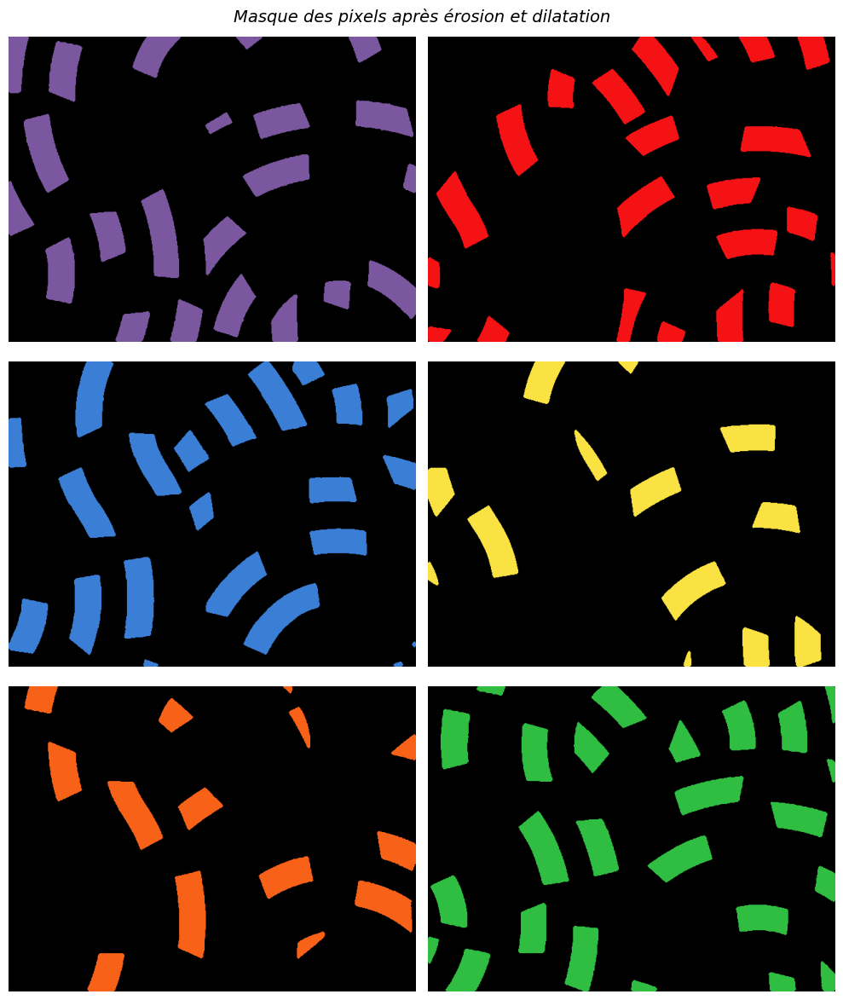

In [114]:
mp.figure(figsize=(10,12), dpi=100); masks = [] # initialisation d'une liste pour stocker les masques
for p,color in enumerate(colors6): # itération sur les 6 couleurs
  mp.subplot(3,2,p+1); mp.axis(False) # grille de 3x2 sous-figures
  cmap = ListedColormap([(0,0,0), color/256]) # création d'une colormap binaire (noir + couleur courante)
  mask = np.all(shapes6 == colors6[p], axis=2) # masque binaire = pixels égaux à la couleur courante
  mask = ndi.binary_opening(mask, iterations=2) # opérateur d'ouverture (= érosion puis dilatation)
  masks.append(mask); mp.imshow(mask, cmap=cmap) # affichage du masque binaire pour la couleur courante
mp.suptitle('Masque des pixels après érosion et dilatation', fontsize=14, style='italic'); mp.tight_layout()

Après ce (très long) travail préparatoire, on peut enfin mettre en oeuvre les outils d'analyse d'images. Par exemple, la fonction **`sum`** du module **`scipy.ndimage`** permet de compter le nombre de pixels pour chaque zone détectée, afin de faire ensuite des statistiques éventuelles sur les objets identifiés. Dans le code ci-dessous, on va simplement compter le nombre de zones distinctes pour chacune des couleurs et calculer la surface minimale et maximuale des zones correspondantes :

In [115]:
names = 'green blue violet red orange yellow'.split() # création d'une liste des noms des couleurs
colors = np.empty(6, dtype=object); colors[np.argsort(colors6[:,0])] = names # tri selon l'ordre de colors6

for mask,color in zip(masks,colors): # itération sur les 6 masques binaires et les noms de couleurs associés
  labels, count = ndi.label(mask) # identification et numérotation des zones connexes d'une même couleur
  areas = ndi.sum(mask, labels, range(1,count)) # calcul des surfaces pour chaque zone connexe
  print(f"{color:6} : {count} objets, surface min = {areas.min():5}, surface max = {areas.max():5}")

violet : 22 objets, surface min = 507.0, surface max = 5244.0
red    : 22 objets, surface min = 336.0, surface max = 4523.0
blue   : 22 objets, surface min =  42.0, surface max = 5399.0
yellow : 13 objets, surface min = 376.0, surface max = 4511.0
orange : 14 objets, surface min = 118.0, surface max = 5222.0
green  : 25 objets, surface min = 319.0, surface max = 4616.0


---
#### d - Echantillonnage 2D par construction spectrale

Pour le dernier exemple d'utilisation du module **`scipy.ndimage`**, nous allons reprendre l'exemple des différentes stratégies d'échantillonnage du carré unité, étudié dans les sections C2 et D1. Nous avions vu que l'échantillonnage à disques de Poisson offrait une distribution très homogène des échantillons dans le domaine spatial, mais au prix d'un temps de calcul très important. Dans le domaine spectral, cet échantillonnage se caractérise par un disque noir entre l'harmonique $0$ et l'harmonique $r$, puis un anneau gris clair entre les harmoniques $r$ et $2r$, indiquant qu'un très grand nombre des distances au plus proche voisin se placent entre les distances $r$ et $2r$.

A partir du moment où on connait précisément les caractéristiques spectrales souhaitées d'un signal, il est généralement très efficace de créer manuellement une densité spectrale intégrant ces caractéristiques, puis d'appliquer une transformée de Fourier inverse pour obtenir le signal dans le domaine spatial. Dans notre cas, nous allons imiter la densité spectrale que donne l'échantillonnage de Poisson, pour obtenir une stratégie d'échantillonnage qui inclut des propriétés similaires, mais avec des temps de calcul qui seront entre 100x et 1000x plus rapide. Cela s'implémente dans un processus en quatre étapes :

- La première étape consiste à créer le masque binaire d'un filtre passe-bande, permettant de sélectionner une tranche d'harmoniques correspondant aux rayons intérieur et extérieur de l'anneau gris clair qu'on cherche à obtenir sur l'image spectrale. Pour créer un anneau similaire à celui qu'on a observé dans l'image spectrale de l'échantillonnage par disques de Poission, on choisit de prendre $\frac{m}{10}$ et $\frac{m}{5}$ comme limites inférieure et supérieure de notre filtre passe-bande

- Durant la seconde étape, on génère un bruit blanc, grâce à la fonction **`random`** qui fournit des échantillons aléatoires avec une distribution uniforme, et on applique le masque binaire passe-bande sur la densité spectrale de ce bruit blanc. On obtient l'image en haut à gauche dans la figure ci-dessous : seules les harmoniques $h$ vérifiant $\frac{m}{10} \leq h \leq \frac{m}{5}$ sont conservées, toutes les autres sont mises à zéro

- En appliquant une transformation de Fourier inverse, on génère l'image spatiale associée à ce spectre en anneau que l'on peut voir en haut à droite de la figure. Cette image correspond à l'échantillonnage uniforme d'un signal présentant des oscillations aléatoires, mais on constate que ces oscillations ont toutes à peu près la même longueur d'onde, qui est celle correspondant à la tranche d'harmoniques conservées dans l'image spectrale

- Pour obtenir un ensemble de points $(x,y)$ correspondant à l'échantillonnage aléatoire souhaité, il suffit d'extraire les positions des maxima locaux de ce signal, en utilisant le filtre **`maximum_filter`** du module **`scipy.ndimage`**. La position des 16431 échantillons obtenus sont présentés sur l'image en bas à gauche de la figure, et on peut constater qu'ils respectent bien les propriétés de répartition homogène que l'on voulait obtenir. Il faut signaler qu'on retrouve ici une difficulté de mise en oeuvre similaire à celle déjà notée pour l'échantillonnage à disques de Poisson : on ne contrôle donc pas directement le nombre d'échantillons générés par le processus, car celui-ci dépend du nombre de maxima locaux trouvés, et plus précisément du paramètre **`size`** correspondant à la taille du voisinage utilisé par le filtre pour identifier les maxima locaux dans chaque zone. Il faut dont généralement tester plusieurs valeurs de ce paramètre pour trouver celle qui convient. Mais comme le processus est extrêmement rapide, cela n'est pas très contraignant

- Pour vérifier la qualité de la répartition spatiale des échantillons, on termine en calculant la densité spectrale, avec le même mécanisme utilisé dans la section D1 (quantification des coordonnées des échantillons suivi d'une transformation de Fourier). L'image résultante est présentée en bas à droite de la figure, et on constate que l'on y trouve exactement les 3 propriétés souhaitées : un disque noir central (= élimination des harmoniques basses), un anneau gris clair autour du disque noir (= sur-représentation des harmoniques entre $d$ et $2d$) et pour le reste du spectre, des variations aléatoires autour d'un gris médian, ce qui signifie que toutes les hautes fréquences sont présentes avec une amplitude équivalente.

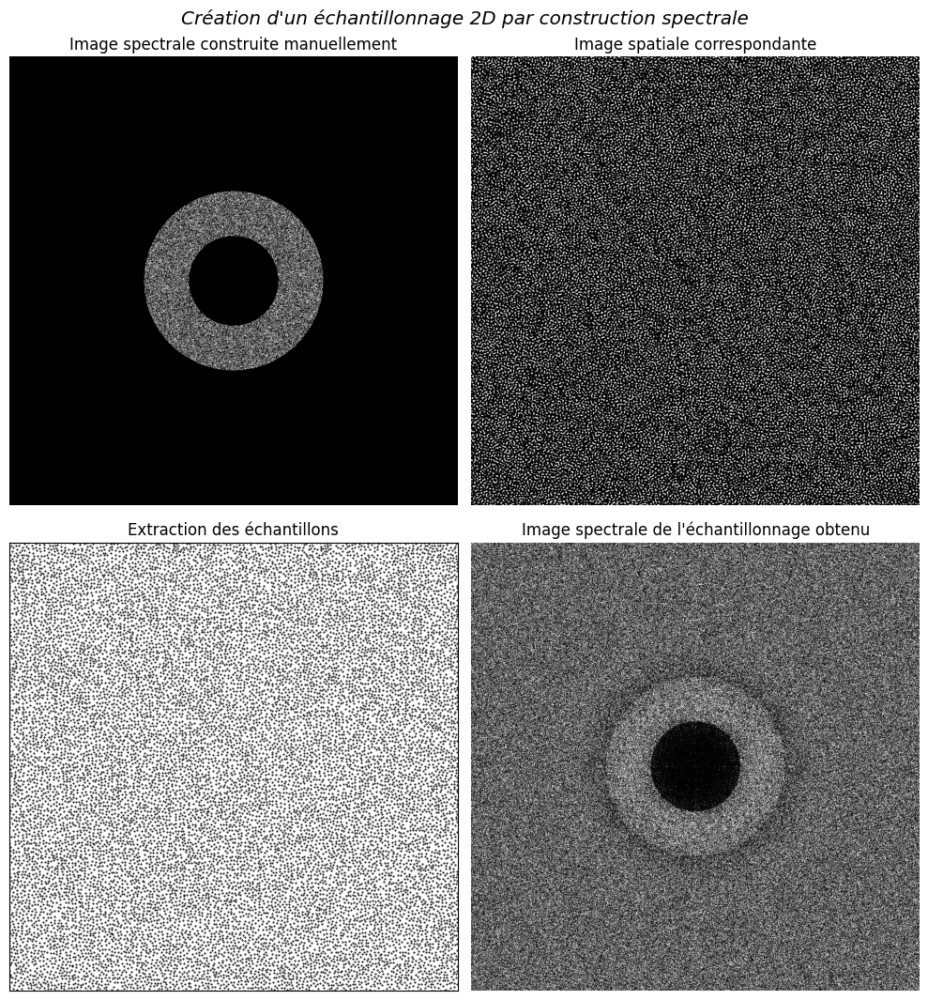

In [116]:
m = 1024; np.random.seed(0); h = np.linspace(-m//2, m//2, m) # les harmoniques varient de -m//2 à m//2
hx, hy = np.meshgrid(h, h); harmo = np.sqrt(hx**2 + hy**2) # calcul de l'ordre d'harmonique en chaque pixel
mask = (harmo >= m/10) & (harmo <= m/5) # création d'un masque passe-bande pour filtrer les harmoniques

noise = np.random.random((m, m)) # création d'une image spatiale d'un bruit blanc (taille m x m)
masknoise = mask*np.fft.fftshift(np.fft.fft2(noise)) # application du masque sur l'image spectrale du bruit
masknoiseS = sigmo(density(masknoise)) # compression sigmoïde de image spectrale (pour affichage uniquement)
noise = np.fft.ifft2(np.fft.ifftshift(masknoise)).real # calcul de l'image spatiale du bruit après masquage
noiseS = sigmo(noise) # compression sigmoïde de l'image spatiale (pour affichage uniquement)

noise = ndi.gaussian_filter(noise, 1.5) # application d'un filtrage passe-bas gaussien sur l'image spatiale
peaks = np.argwhere(ndi.maximum_filter(noise, size=7) == noise) # detection des maxima locaux de l'image
spatial = np.zeros((m, m), dtype='u1') # l'image spatiale finale est une grille dans laquelle...
spatial[*peaks.T] = 1 # ...on met à 1 les pixels correspondants à la position des maxima locaux
spectral = fft.fftshift(fft.fft2(spatial)) # calcul et centrage de la transformée de Fourier (dans ℂ x ℂ)
spectral = sigmo(density(spectral)) # calcul et compression sigmoïde de la densité spectrale (dans ℝ x ℝ)

mp.figure(figsize=(10, 11)); suptitle = "Création d'un échantillonnage 2D par construction spectrale"
mp.subplot(2, 2, 1); mp.axis('off'); mp.title('Image spectrale construite manuellement')
mp.imshow(masknoiseS, cmap='gray') # image spectrale du bruit blanc avec masque binaire passe-bande
mp.subplot(2, 2, 2); mp.axis('off'); mp.title('Image spatiale correspondante')
mp.imshow(noiseS, cmap='gray') # image spatiale correspondante
mp.subplot(2, 2, 3); mp.xticks([]); mp.yticks([]); mp.axis('image'); mp.title('Extraction des échantillons')
mp.plot(*peaks.T, 'ko', ms=0.5); mp.axis([-1, m, -1, m]) # affichage des échantillons (= maxima locaux)
mp.subplot(2, 2, 4); mp.axis('off'); mp.title("Image spectrale de l'échantillonnage obtenu")
mp.imshow(spectral, cmap='gray') # image spectrale correspondante
mp.suptitle(suptitle, size='x-large', style='italic'); mp.tight_layout()

<div style="padding:8px; margin:0px -20px; color:#FFF; background:#06D; text-align:right">● ● ● </div>